# Waterfilling Levels

In [1]:
import sys
sys.path.insert(1, '../../functions')
import importlib
import numpy as np
import nbformat
import plotly.express
import plotly.express as px
import pandas as pd
import scipy.optimize as optimization
import food_bank_functions
import food_bank_bayesian
import matplotlib.pyplot as plt
import seaborn as sns
from food_bank_functions import *
from food_bank_bayesian import *
import time
importlib.reload(food_bank_functions)

np.random.seed(1)

### Plotting the distribution

In [2]:
vals = np.loadtxt('../../data/gaussian/vals_15_var_3.csv', delimiter=",")
support = np.loadtxt('../../data/gaussian/support_15_var_3.csv', delimiter=",")
var = variance(support, vals)
med = median(support, vals)
print(med)
print(var)

15.5
9.603062592934334


In [3]:
print(vals)
print(support)
vals[0] = vals[0] + (1 - np.sum(vals))

[0.0000e+00 3.3000e-04 5.3400e-03 4.5740e-02 1.8204e-01 3.3487e-01
 2.8992e-01 1.1717e-01 2.2520e-02 2.0000e-03 7.0000e-05]
[ 2.          4.7         7.4        10.1        12.8        15.5
 18.2        20.9        23.6        26.3        27.20911003]


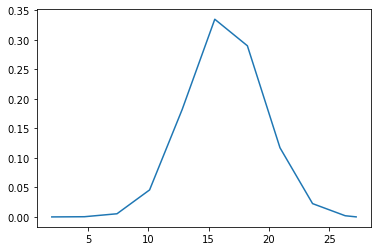

In [4]:
plt.plot(support, vals)

### Test

In [5]:
n = 6
sorted_distribution = support
weights = vals
expected_demand = np.dot(vals, support)
print(expected_demand)
max_budget = n * expected_demand

16.33501163770181


In [6]:
print(max_budget)

98.01006982621087


In [7]:
np.sum(vals)

1.0

In [8]:
group_demands = np.random.choice(size=n, a=sorted_distribution, p=vals)
print(group_demands)

[15.5 18.2  4.7 15.5 12.8 12.8]


In [9]:
print(waterfilling_waste(group_demands, max_budget))

[15.5 18.2  4.7 15.5 12.8 12.8]


In [10]:
print(greedy(group_demands, max_budget))

[15.5 18.2  4.7 15.5 12.8 12.8]


In [11]:
print(constant_threshold(group_demands,max_budget,expected_demand))

[15.5        16.33501164  4.7        15.5        12.8        12.8       ]


In [12]:
print(waterfilling_proportional_remaining(group_demands, max_budget))

[15.5        16.50201397  4.7        15.5        12.8        12.8       ]


In [13]:
print(waterfilling_et_waste([expected_demand for x in range(n)],group_demands,max_budget))

[15.5        17.17002328  4.7        15.5        12.8        12.8       ]


In [14]:
print(waterfilling_et_full_waste([expected_demand for x in range(n)],group_demands,max_budget))

[15.5        17.17002328  4.7        15.5        12.8        12.8       ]


In [15]:
print(waterfilling_hope_waste_iid(weights, sorted_distribution, group_demands, max_budget))

[15.5 18.2  4.7 15.5 12.8 12.8]


In [16]:
print(weights)
print(sorted_distribution)

[1.11022302e-16 3.30000000e-04 5.34000000e-03 4.57400000e-02
 1.82040000e-01 3.34870000e-01 2.89920000e-01 1.17170000e-01
 2.25200000e-02 2.00000000e-03 7.00000000e-05]
[ 2.          4.7         7.4        10.1        12.8        15.5
 18.2        20.9        23.6        26.3        27.20911003]


In [17]:
print(waterfilling_hope_full_waste_iid(weights, sorted_distribution, group_demands, max_budget))

[15.5 18.2  4.7 15.5 12.8 12.8]


In [18]:
print(max_min_heuristic(group_demands, [med for x in range(n)], [expected_demand for x in range(n)], [var for x in range(n)], max_budget))

[15.5        17.82413378  4.60293565 15.17989415 12.53565453 12.8       ]


# Experiments

## Varying Number of Groups

### Look at scaling with n

In [19]:
max_n = 100
num_iterations = 1000
print(weights)
print(sorted_distribution)

[1.11022302e-16 3.30000000e-04 5.34000000e-03 4.57400000e-02
 1.82040000e-01 3.34870000e-01 2.89920000e-01 1.17170000e-01
 2.25200000e-02 2.00000000e-03 7.00000000e-05]
[ 2.          4.7         7.4        10.1        12.8        15.5
 18.2        20.9        23.6        26.3        27.20911003]


In [20]:
expected_waterfilling_threshold = np.zeros(max_n+1)
num_iterations = 1000
for i in np.arange(2,max_n+1):
    for _ in range(num_iterations):
        budget = i * 15.
        demands = np.random.choice(size=i, a=support, p=vals)
        opt = waterfilling_waste(demands, budget)
        expected_waterfilling_threshold[i] += (1/num_iterations)*max(opt)
print(expected_waterfilling_threshold)

[ 0.          0.         15.4528     15.90195    16.1684     16.259925
 16.377305   16.40514833 16.48007095 16.52998143 16.50660829 16.4406756
 16.48859071 16.56514321 16.44716485 16.45499997 16.39875374 16.41748876
 16.3525404  16.42677132 16.40281771 16.38974554 16.37594145 16.36131826
 16.38513595 16.3130149  16.31931627 16.32294021 16.32835557 16.31972054
 16.34189104 16.33337145 16.32249202 16.25226137 16.26877042 16.26623721
 16.29354604 16.26303061 16.24311766 16.269699   16.29068607 16.2758611
 16.20339497 16.22822896 16.23633515 16.22114162 16.2626448  16.26578258
 16.23821657 16.25651512 16.25932198 16.23059551 16.22552646 16.18400576
 16.28470016 16.24390484 16.19668793 16.21778569 16.21098426 16.21437383
 16.22992218 16.23072038 16.21495392 16.20099621 16.23641989 16.22869172
 16.20943337 16.22183201 16.21240705 16.21573613 16.23480426 16.17100569
 16.20556896 16.20310287 16.18883707 16.19320783 16.19232643 16.22074508
 16.19509506 16.19835713 16.18793761 16.20262191 16.203

In [ ]:
data_dict = {'NumGroups':[], 'Norm':[], 'ET-Online':[],'Hope-Online':[], 'Adapt-Threshold':[], 'Threshold':[], 'Expected-Filling':[], 'Greedy':[], 'ET-Full':[], 'Hope-Full':[], 'Max-Min':[]}
num_iterations = 100
for n in np.arange(2,max_n+1,1):
    n = max(int(n),1)
    group_expected_demands = np.zeros(n) + np.dot(weights, sorted_distribution)
    group_median_demands = np.zeros(n) + med
    group_variance = np.zeros(n) + var
    budget = n*expected_demand
    print(n)
    for i in range(num_iterations):
        data_dict['NumGroups'].append(n)

        
        group_demands = np.random.choice(size=n, a=support, p=vals)
        opt = waterfilling_waste(group_demands,budget)
        
        print('new round')
        
        hope_sol = waterfilling_hope_waste_iid(weights, sorted_distribution, group_demands, budget)
        print(hope_sol)
        hope_full_sol = waterfilling_hope_full_waste_iid(weights, sorted_distribution, group_demands, budget)
        print(hope_full_sol)
        dynamic = waterfilling_et_waste(group_expected_demands,group_demands,budget)
        et_full = waterfilling_et_full_waste(group_expected_demands, group_demands, budget)
        proportional_threshold = waterfilling_proportional_remaining(group_demands, budget)
        greed_sol = greedy(group_demands,budget)
        threshold = constant_threshold(group_demands,budget,expected_demand)
        expect_threshold = constant_threshold(group_demands, budget, expected_waterfilling_threshold[n])
        max_min_heuristic_sol = max_min_heuristic(group_demands, group_median_demands, group_expected_demands, group_variance, budget)


        
        data_dict['Norm'].append('L1')
        data_dict['Hope-Online'].append(np.sum(np.absolute(opt - hope_sol)))
        data_dict['ET-Online'].append(np.sum(np.absolute(opt-dynamic)))
        data_dict['Adapt-Threshold'].append(np.sum(np.absolute(opt - proportional_threshold)))
        data_dict['Greedy'].append(np.sum(np.absolute(opt-greed_sol)))
        data_dict['Threshold'].append(np.sum(np.absolute(opt-threshold)))
        data_dict['ET-Full'].append(np.sum(np.absolute(opt-et_full)))
        data_dict['Hope-Full'].append(np.sum(np.absolute(opt-hope_full_sol)))
        data_dict['Expected-Filling'].append(np.sum(np.absolute(opt - expect_threshold)))
        data_dict['Max-Min'].append(np.sum(np.absolute(opt - max_min_heuristic_sol)))
        
        data_dict['NumGroups'].append(n)
        data_dict['Norm'].append('Linf')
        data_dict['Hope-Online'].append(np.max(np.absolute(opt - hope_sol)))
        data_dict['ET-Online'].append(np.max(np.absolute(opt-dynamic)))
        data_dict['Adapt-Threshold'].append(np.max(np.absolute(opt - proportional_threshold)))
        data_dict['Greedy'].append(np.max(np.absolute(opt-greed_sol)))
        data_dict['Threshold'].append(np.max(np.absolute(opt-threshold)))
        data_dict['ET-Full'].append(np.max(np.absolute(opt-et_full)))
        data_dict['Hope-Full'].append(np.max(np.absolute(opt-hope_full_sol)))
        data_dict['Expected-Filling'].append(np.max(np.absolute(opt - expect_threshold)))
        data_dict['Max-Min'].append(np.max(np.absolute(opt - max_min_heuristic_sol)))

2
new round
[12.8 12.8]
[12.8 12.8]
new round
[15.5 15.5]
[15.5 15.5]
new round
[17.21500983 15.45501344]
[17.21500983 15.45501344]
new round
[17.21500983 15.45501344]
[17.21500983 15.45501344]
new round
[17.21500983 12.8       ]
[17.21500983 12.8       ]
new round
[17.21500983 15.45501344]
[17.21500983 15.45501344]
new round
[17.21500983 15.45501344]
[17.21500983 15.45501344]
new round
[15.5 15.5]
[15.5 15.5]
new round
[17.21500983 12.8       ]
[17.21500983 12.8       ]
new round
[17.21500983 15.45501344]
[17.21500983 15.45501344]
new round
[17.21500983 15.45501344]
[17.21500983 15.45501344]
new round
[10.1 10.1]
[10.1 10.1]
new round
[17.21500983 15.45501344]
[17.21500983 15.45501344]
new round
[17.21500983 15.45501344]
[17.21500983 15.45501344]
new round
[15.5 15.5]
[15.5 15.5]
new round
[12.8 12.8]
[12.8 15.5]
new round
[15.5 15.5]
[15.5        17.17002328]
new round
[17.21500983 12.8       ]
[17.21500983 12.8       ]
new round
[17.21500983 15.45501344]
[17.21500983 15.45501344]
ne

[17.68727402 10.1        12.8       ]
new round
[17.68727402 15.5        15.8177609 ]
[17.68727402 15.5        15.8177609 ]
new round
[17.68727402 16.27048146 15.04727944]
[17.68727402 16.85312085 14.46464004]
new round
[17.68727402 16.27048146 12.8       ]
[17.68727402 16.85312085 12.8       ]
new round
[17.68727402 16.27048146 15.04727944]
[17.68727402 16.85312085 14.46464004]
new round
[15.5 15.5 15.5]
[15.5 15.5 15.5]
new round
[15.5        17.79824885 12.8       ]
[15.5        17.79824885 12.8       ]
new round
[12.8 15.5 15.5]
[12.8 15.5 18.2]
new round
[17.68727402 12.8        17.68727402]
[17.68727402 12.8        18.10251746]
new round
[17.68727402 15.5        15.5       ]
[17.68727402 15.5        15.5       ]
new round
[17.68727402 12.8        15.5       ]
[17.68727402 12.8        15.5       ]
new round
[17.68727402 16.27048146 15.04727944]
[17.68727402 16.85312085 14.46464004]
new round
[17.68727402 12.8        15.5       ]
[17.68727402 12.8        15.5       ]
new round
[17.

new round
[18.18320407 17.17658085 16.24377322 10.1        18.18320407]
[18.18320407 17.48207736 16.9872293  10.1        17.89376455]
new round
[18.18320407 15.5        17.1435354  15.5        15.34831872]
[18.18320407 15.5        17.50662934 15.5        14.98522478]
new round
[12.8 15.5 15.5 15.5 15.5]
[12.8 15.5 15.5 15.5 20.9]
new round
[15.5        18.43463192 12.8        18.2        15.5       ]
[15.5        18.43463192 12.8        18.2        15.5       ]
new round
[18.18320407 17.17658085 16.24377322 15.41895052 14.65254952]
[18.18320407 17.48207736 16.9872293  16.61930017 12.40324729]
new round
[12.8 18.2 12.8 10.1 12.8]
[12.8 18.2 12.8 10.1 12.8]
new round
[15.5        15.5        18.2        17.0788306  15.39622759]
[15.5        15.5        18.2        17.53989842 14.93515977]
new round
[18.18320407 17.17658085 15.5        12.8        15.5       ]
[18.18320407 17.48207736 15.5        12.8        15.5       ]
new round
[18.18320407 12.8        15.5        18.2        16.991854

new round
[18.2 12.8 15.5 15.5 15.5 18.2]
[18.2 12.8 15.5 15.5 15.5 18.2]
new round
[18.43934915 15.5        17.42880589 16.41907027 10.1        15.5       ]
[18.43934915 15.5        17.73549208 17.20336542 10.1        15.5       ]
new round
[18.43934915 17.41145724 16.59594144 15.84022733 12.8        16.92309467]
[18.43934915 17.68727402 17.21500983 16.85312085 12.8        15.01531598]
new round
[15.5        18.70363349 12.8        19.01495289 15.5        15.5       ]
[15.5        18.70363349 12.8        18.87861977 15.5        15.5       ]
new round
[18.2        15.5        15.5        15.5        17.66206961 12.8       ]
[18.2       15.5       15.5       15.5       17.8832872 12.8      ]
new round
[15.5        18.2        15.5        15.5        17.66206961 12.8       ]
[15.5       18.2       15.5       15.5       17.8832872 12.8      ]
new round
[18.2        15.5        17.53309564 15.5        15.5        12.8       ]
[18.2        15.5        17.73549208 15.5        15.5        12.

[18.2 15.5 15.5 15.5 12.8 18.2 18.2]
new round
[10.1        18.2        20.9        17.8969288  16.7444169  15.7019011
 14.80183467]
[10.1        18.2        20.9        19.02647755 18.13515871 17.71485866
 10.26858655]
new round
[18.66677625 17.59122189 15.5        15.5        12.8        12.8
 18.2       ]
[18.66677625 17.84986809 15.5        15.5        12.8        12.8
 18.2       ]
new round
[18.2        15.5        17.80546938 15.5        12.8        12.8
 15.5       ]
[18.2        15.5        17.91133476 15.5        12.8        12.8
 15.5       ]
new round
[12.8 10.1 12.8 15.5 18.2 15.5 15.5]
[12.8 10.1 12.8 15.5 18.2 15.5 15.5]
new round
[18.2 12.8 15.5 12.8 15.5 18.2 10.1]
[18.2 12.8 15.5 12.8 15.5 18.2 10.1]
new round
[15.5        18.92800296 17.53848085 15.5        15.5        16.31297472
 15.06562293]
[15.5        18.92800296 17.91133476 15.5        15.5        17.43211589
 13.57362785]
new round
[18.66677625 15.5        15.5        12.8        18.2        15.5
 18.17830521

[18.2 12.8 18.2 12.8 12.8 15.5 12.8 18.2]
[18.2 12.8 18.2 12.8 12.8 15.5 12.8 18.2]
new round
[18.2        17.92112296 17.23682249 16.58681334 15.97550384 15.43307587
 14.99736867 14.32938595]
[18.2        17.98187942 17.5562002  17.21500983 16.93542521 15.5
 16.66072552 10.63085292]
new round
[15.5        15.5        15.5        19.76935184 15.5        17.63666992
 15.5        15.5       ]
[15.5        15.5        15.5        19.76935184 15.5        18.42757195
 15.5        14.98316931]
new round
[15.5        12.8        15.5        18.2        18.2        15.5
 18.98815084 10.1       ]
[15.5        12.8        15.5        18.2        18.2        15.5
 18.98815084 10.1       ]
new round
[18.2        12.8        15.5        15.5        18.2        18.60487495
 10.1        12.8       ]
[18.2        12.8        15.5        15.5        18.2        18.60487495
 10.1        12.8       ]
new round
[18.2 10.1 12.8 18.2 15.5 12.8 12.8 18.2]
[18.2 10.1 12.8 18.2 15.5 12.8 12.8 20.9]
new round
[

[12.8 18.2 18.2 15.5 10.1 20.9 15.5 12.8 12.8]
new round
[18.2        18.06414076 17.43948212 12.8        15.5        15.5
 12.8        15.5        18.2       ]
[18.2        18.09119487 17.68727402 12.8        15.5        15.5
 12.8        15.5        18.2       ]
new round
[12.8        20.63615822 18.2        15.5        17.52449629 16.68098867
 12.8        12.8        12.8       ]
[12.8        20.63615822 18.2        15.5        18.43149181 17.87412196
 12.8        12.8        12.8       ]
new round
[19.030987   17.85751804 17.26556837 15.5        12.8        17.64244516
 16.56755011 12.8        17.55103606]
[19.030987   18.09119487 17.68727402 15.5        12.8        17.87412196
 17.51006739 12.8        15.7214595 ]
new round
[18.2        10.1        18.2        18.2        15.5        15.5
 18.2        17.52589038 15.58921436]
[18.2        10.1        18.2        18.2        15.5        15.5
 18.2        18.02231846 15.09278628]
new round
[15.5 18.2 15.5 10.1 15.5 18.2 18.2 15.5 12

new round
[19.17906284 12.8        19.20865099 12.8        15.5        18.2
 12.8        18.2        18.70990449 15.5       ]
[19.17906284 12.8        19.19876296 12.8        15.5        18.2
 12.8        18.2        19.01798176 15.5       ]
new round
[18.2        18.17943261 17.60553036 15.5        15.5        15.5
 16.90351341 16.05399064 15.32619873 14.58145063]
[18.2        18.18320407 17.79955534 15.5        15.5        15.5
 17.52190774 17.19199237 16.92038136 11.0330755 ]
new round
[15.5 18.2 15.5 10.1 15.5 15.5 18.2 18.2 15.5 12.8]
[15.5 18.2 15.5 10.1 15.5 15.5 18.2 18.2 15.5 12.8]
new round
[15.5        19.42226176 17.96785204 17.35843618 15.5        16.68928764
 12.8        15.5        15.5        15.5       ]
[15.5        19.42226176 18.2        17.83664784 15.5        17.50662934
 12.8        15.5        15.5        15.5       ]
new round
[15.5        18.2        15.5        18.56142161 12.8        15.5
 19.21597775 10.1        10.1        19.21597775]
[15.5        18.2   

[18.2 10.1 15.5 15.5 18.2 15.5 15.5 15.5 15.5 18.2 20.9]
new round
[12.8        20.73234059 18.2        10.1        15.5        18.2
 18.2        12.8        15.5        15.5        18.2       ]
[12.8        20.73234059 18.2        10.1        15.5        18.2
 18.2        12.8        15.5        15.5        18.2       ]
new round
[18.2        15.5        18.2        17.80803977 17.22392266 15.5
 15.5        10.1        15.5        10.1        18.2       ]
[18.2        15.5        18.2        17.93822105 17.60878472 15.5
 15.5        10.1        15.5        10.1        18.2       ]
new round
[19.30977334 18.04717442 17.5457795  15.5        15.5        12.8
 17.92917819 16.98545933 16.11094327 12.8        15.5       ]
[19.30977334 18.2        17.89681534 15.5        15.5        12.8
 18.12391317 17.7622722  17.46052255 12.8        14.33183142]
new round
[18.2        18.35959031 15.5        15.5        17.82236321 17.15583349
 16.52270457 15.9272703  15.40841662 14.97596814 12.8       ]


new round
[18.2        12.8        18.2        15.5        18.2        18.09940493
 17.38302454 15.5        16.5865502  12.8        12.8        12.8       ]
[18.2        12.8        18.2        15.5        18.2        18.14519879
 17.8254847  15.5        17.56662412 12.8        12.8        12.8       ]
new round
[19.42600402 12.8        15.5        19.63032296 18.02652238 15.5
 10.1        18.2        15.5        18.2        12.8        12.8       ]
[19.42600402 12.8        15.5        19.56513033 18.2        15.5
 10.1        18.2        15.5        18.2        12.8        12.8       ]
new round
[12.8       18.2       12.8       18.2       20.5382999 18.2
 15.5       12.8       12.8       15.5       18.2       12.8      ]
[12.8       18.2       12.8       18.2       20.5382999 18.2
 15.5       12.8       12.8       15.5       18.2       12.8      ]
new round
[18.2 10.1 18.2 15.5 18.2 15.5 12.8 12.8 15.5 20.9 15.5 12.8]
[18.2 10.1 18.2 15.5 18.2 15.5 12.8 12.8 15.5 20.9 15.5 12.8]
new 

[15.5 18.2 15.5 15.5 15.5 12.8 10.1 12.8 18.2 15.5 12.8 18.2 12.8]
new round
[18.2        12.8        20.00055067 12.8        18.2        15.5
 15.5        15.5        15.5        15.5        15.5        15.5
 12.8       ]
[18.2        12.8        20.00055067 12.8        18.2        15.5
 15.5        15.5        15.5        15.5        15.5        15.5
 12.8       ]
new round
[18.2        18.69731077 15.5        17.96170791 10.1        12.8
 10.1        15.5        15.5        18.2        15.5        15.5
 15.5       ]
[18.2        18.69731077 15.5        18.10315714 10.1        12.8
 10.1        15.5        15.5        18.2        15.5        15.5
 15.5       ]
new round
[18.2        18.2        18.00307916 12.8        12.8        15.5
 18.2        18.2        10.1        20.9        15.5        18.11049545
 15.5       ]
[18.2        18.2        18.0569062  12.8        12.8        15.5
 18.2        18.2        10.1        19.97897368 15.5        18.95592575
 15.5       ]
new round
[18

new round
[18.2        18.69731077 17.90954343 17.4684665  17.04092265 15.5
 16.54477893 15.5        12.8        16.82899427 15.5        15.5
 14.86513474]
[18.2        18.69731077 18.0569062  17.77302175 17.52730809 15.5
 17.31221633 15.5        12.8        17.41814835 15.5        15.5
 12.57023979]
new round
[12.8 12.8 18.2 18.2 15.5 12.8 12.8 15.5 18.2 23.6 18.2 12.8 20.9]
[12.8 12.8 18.2 18.2 15.5 12.8 12.8 15.5 18.2 23.6 18.2 12.8 20.9]
new round
[15.5 10.1 18.2 15.5 15.5 15.5 12.8 15.5 20.9 18.2 20.9 15.5 18.2]
[15.5 10.1 18.2 15.5 15.5 15.5 12.8 15.5 20.9 18.2 20.9 15.5 18.2]
new round
[12.8 12.8 15.5 18.2 15.5 15.5 18.2 18.2 15.5 15.5 15.5 18.2 15.5]
[12.8 12.8 15.5 18.2 15.5 15.5 18.2 18.2 15.5 15.5 15.5 18.2 15.5]
new round
[12.8        20.80721324 15.5        18.2        18.15648893 17.58582887
 12.8        12.8        12.8        20.9        18.2        15.5
 10.1       ]
[12.8        20.80721324 15.5        18.2        18.2        18.2
 12.8        12.8        12.8        

new round
[19.62369039 18.31251057 17.82974699 15.5        17.44306649 17.01876403
 15.5        16.52346367 12.8        15.5        15.5        16.68579597
 15.66655036 14.78657446]
[19.62369039 18.66677625 18.12357326 15.5        17.87891889 17.62608582
 15.5        17.40942284 12.8        15.5        15.5        17.52976933
 17.29981747  9.73210869]
new round
[15.5        18.2        18.2        15.5        10.1        18.2
 12.8        20.9        18.2        17.968699   15.5        16.94475997
 12.8        17.87670396]
[15.5        18.2        18.2        15.5        10.1        18.2
 12.8        20.9        18.2        18.2        15.5        18.25681357
 12.8        16.33334936]
new round
[12.8 15.5 20.9 15.5 15.5 15.5 18.2 15.5 15.5 15.5 18.2 18.2 15.5 15.5]
[12.8 15.5 20.9 15.5 15.5 15.5 18.2 15.5 15.5 15.5 18.2 18.2 15.5 15.5]
new round
[12.8        20.83875538 10.1        12.8        12.8        20.9
 18.2        12.8        18.2        12.8        18.2        18.2
 20.9     

new round
[19.70844945 15.5        18.2        10.1        15.5        20.35076592
 12.8        18.2        12.8        15.5        20.9        18.03674236
 16.84158769 15.5        15.08762914]
[19.70844945 15.5        18.2        10.1        15.5        20.15468905
 12.8        18.2        12.8        15.5        20.52806993 18.2
 19.05554557 15.5        13.27842057]
new round
[18.2       15.5       18.2       15.5       18.2       10.1
 15.5       18.2       15.5       15.5       18.2       18.2
 17.2687503 15.5       10.1      ]
[18.2        15.5        18.2        15.5        18.2        10.1
 15.5        18.2        15.5        15.5        18.2        18.2
 17.97932418 15.5        10.1       ]
new round
[15.5        19.91741071 18.2        15.5        15.5        18.05380868
 12.8        15.5        18.2        17.64683548 10.1        18.2
 18.1713913  15.5        15.5       ]
[15.5        19.91741071 18.2        15.5        15.5        18.50625689
 12.8        15.5        18.2   

 18.2]
new round
[12.8        15.5        18.2        20.40477798 10.1        18.2
 15.5        18.2        18.2        18.2        17.46634953 16.63724077
 15.86893047 15.2357549  14.51212092]
[12.8        15.5        18.2        20.40477798 10.1        18.2
 15.5        18.2        18.2        18.2        18.2        17.972409
 17.75033037 15.5        10.29765722]
new round
[12.8        18.2        18.2        18.2        18.45770788 10.1
 12.8        12.8        12.8        15.5        15.5        15.5
 15.5        18.2        10.1       ]
[12.8        18.2        18.2        18.2        18.45770788 10.1
 12.8        12.8        12.8        15.5        15.5        15.5
 15.5        18.2        10.1       ]
new round
[18.2        12.8        15.5        15.5        15.5        12.8
 18.2        20.9        19.35850908 17.77750617 12.8        18.13399562
 15.5        15.5        16.55516369]
[18.2        12.8        15.5        15.5        15.5        12.8
 18.2        20.9        19.

 15.5 18.2]
[12.8 18.2 15.5 18.2 18.2 15.5 12.8  7.4 20.9 20.9 15.5 15.5 15.5 12.8
 15.5 18.2]
new round
[12.8 12.8 15.5 15.5 12.8 12.8 18.2 18.2 12.8 10.1 18.2 20.9 18.2 10.1
 12.8 20.9]
[12.8 12.8 15.5 15.5 12.8 12.8 18.2 18.2 12.8 10.1 18.2 20.9 18.2 10.1
 12.8 20.9]
new round
[15.5        15.5        18.2        15.5        19.67608473 15.5
 12.8        15.5        12.8        15.5        18.2        20.9
 18.17536404 12.8        12.8        12.8       ]
[15.5        15.5        18.2        15.5        19.67608473 15.5
 12.8        15.5        12.8        15.5        18.2        20.70846508
 18.2        12.8        12.8        12.8       ]
new round
[12.8       20.8928508 10.1       12.8       18.2       18.2
 15.5       18.2       18.2       18.2       15.5       18.2
 15.5       12.8       18.2       12.8      ]
[12.8       20.8928508 10.1       12.8       18.2       18.2
 15.5       18.2       18.2       18.2       15.5       18.2
 15.5       12.8       18.2       12.8      ]
ne

[18.2        18.2        15.5        18.60536915 15.5        12.8
 18.87095559 15.5        18.2        15.5        18.01535839 17.77352025
 15.5        15.5        15.5        15.5        12.8       ]
new round
[12.8        18.2        15.5        18.2        18.2        18.2
 15.5        18.19452866 17.67432932 17.17180385 16.68840472 16.22591859
 15.78660834 15.41198168 12.8        12.8        15.5       ]
[12.8        18.2        15.5        18.2        18.2        18.2
 15.5        18.19699181 17.95178198 17.73438317 17.54031791 17.36602092
 17.20861808 17.06576667 12.8        12.8        12.43131731]
new round
[10.1 10.1 18.2 15.5 15.5 18.2 20.9 15.5 12.8 18.2 15.5 18.2 12.8 12.8
 20.9 12.8 18.2]
[10.1 10.1 18.2 15.5 15.5 18.2 20.9 15.5 12.8 18.2 15.5 18.2 12.8 12.8
 20.9 12.8 18.2]
new round
[19.85590847 15.5        15.5        15.5        15.5        18.2
 15.5        12.8        12.8        15.5        18.2        12.8
 20.9        10.1        15.5        18.2        15.5      

[15.5        20.05260614 15.5        18.2        15.5        12.8
 12.8        12.8        10.1        20.9        12.8        20.9
 15.5        18.2        15.5        20.9        15.5       ]
new round
[12.8 12.8 15.5 15.5 18.2 18.2 12.8 18.2 20.9 12.8 18.2 15.5 12.8 12.8
 18.2 18.2 18.2]
[12.8 12.8 15.5 15.5 18.2 18.2 12.8 18.2 20.9 12.8 18.2 15.5 12.8 12.8
 18.2 18.2 18.2]
new round
[10.1 15.5 12.8 18.2 15.5 12.8 12.8 10.1 15.5 18.2 15.5 18.2 15.5  7.4
 20.9 15.5 15.5]
[10.1 15.5 12.8 18.2 15.5 12.8 12.8 10.1 15.5 18.2 15.5 18.2 15.5  7.4
 20.9 15.5 15.5]
new round
[15.5 12.8 12.8 15.5 10.1 15.5 15.5 15.5 20.9 12.8 20.9 18.2 18.2 18.2
 20.9 18.2 12.8]
[15.5 12.8 12.8 15.5 10.1 15.5 15.5 15.5 20.9 12.8 20.9 18.2 18.2 18.2
 20.9 18.2 12.8]
new round
[18.2        19.18899304 18.16922118 17.82101346 12.8        17.96230519
 15.5        12.8        15.5        18.2        12.8        15.5
 15.5        15.5        18.2        18.18145603 15.87220894]
[18.2        19.18899304 18.2        

new round
[10.1        18.2        12.8        15.5        15.5        15.5
 12.8        18.2        12.8        23.6        18.2        20.9
 19.56302638 17.70355266 16.81570537 15.99296383 15.2963733  14.55858795]
[10.1        18.2        12.8        15.5        15.5        15.5
 12.8        18.2        12.8        23.6        18.2        20.9
 20.9        18.2        19.50829405 18.85671777 18.38724201  4.07795565]
new round
[18.2        19.28525454 18.24533807 17.88433693 17.5606164  15.5
 12.8        17.73967114 17.31835664 15.5        15.5        10.1
 18.66556985 12.8        15.5        15.5        18.2        12.8       ]
[18.2        19.28525454 18.4973535  18.09119487 17.8784184  15.5
 12.8        17.97978341 17.77816574 15.5        15.5        10.1
 18.16349223 12.8        15.5        15.5        18.2        12.8       ]
new round
[15.5        12.8        15.5        18.2        12.8        18.2
 18.2        20.61068393 15.5        18.2        17.99064577 15.5
 15.5        1

new round
[15.5 15.5 15.5 18.2 12.8 18.2 12.8 10.1 15.5 10.1 18.2 15.5 18.2 15.5
 12.8 15.5 15.5 15.5]
[15.5 15.5 15.5 18.2 12.8 18.2 12.8 10.1 15.5 10.1 18.2 15.5 18.2 15.5
 12.8 15.5 15.5 15.5]
new round
[18.2        19.28525454 18.24533807 17.88433693 15.5        17.5774776
 17.23547518 16.90226211 16.57836922 12.8        16.82254283 16.39443272
 15.5        15.5        15.48808549 15.17915945 14.77700736 14.16046799]
[18.2        19.28525454 18.4973535  18.09119487 15.5        17.90213056
 17.70205568 17.52207598 17.35930874 12.8        17.43211838 17.28252572
 15.5        15.5        17.13368118 15.5        15.5         7.32251031]
new round
[18.2        18.2        18.2        18.04485222 15.5        17.73444397
 15.5        17.38160798 12.8        17.5774685  10.1        18.2
 15.5        12.8        15.5        15.5        12.8        18.2       ]
[18.2        18.2        18.2        18.09119487 15.5        17.90213056
 15.5        17.71807435 12.8        17.79711803 10.1      

 15.5 18.2 10.1 15.5 12.8]
new round
[18.2        18.2        18.2        12.8        15.5        18.2
 18.38609063 15.5        17.89473941 17.45538474 17.0295103  12.8
 17.28587331 10.1        18.2        15.5        15.5        12.8
 18.2       ]
[18.2        18.2        18.2        12.8        15.5        18.2
 18.38609063 15.5        18.06072049 17.85487704 17.6694615  12.8
 17.74132647 10.1        18.04176011 15.5        15.5        12.8
 18.16956556]
new round
[18.2        15.5        18.2        15.5        15.5        18.2
 18.38609063 12.8        18.64547919 17.85440466 17.37760981 16.91701415
 16.47394896 16.05005184 15.5        15.38380219 15.08448687 14.69484579
 14.09748704]
[18.2        15.5        18.2        15.5        15.5        18.2
 18.38609063 12.8        18.56958132 18.09310146 17.87699715 17.68317901
 17.50836863 17.34990057 15.5        15.5        15.5        15.5
  8.99800234]
new round
[18.2        18.2        15.5        18.85954808 15.5        18.11876558
 

 11.06362339]
new round
[12.8        15.5        21.58733861 19.50331132 12.8        12.8
 18.2        12.8        18.2        15.5        15.5        12.8
 15.5        12.8        18.2        18.2        12.8        18.2
 15.5       ]
[12.8        15.5        21.58733861 20.00835865 12.8        12.8
 18.2        12.8        18.2        15.5        15.5        12.8
 15.5        12.8        18.2        18.2        12.8        18.2
 15.5       ]
new round
[12.8        20.9        12.8        15.5        15.5        10.1
 20.9        18.2        20.9        15.5        15.5        18.2
 12.8        15.5        18.2        15.5        18.2        17.70059169
 15.66462942]
[12.8        20.9        12.8        15.5        15.5        10.1
 20.9        18.2        20.9        15.5        15.5        18.2
 12.8        15.5        18.2        15.5        18.2        18.2
 15.16522112]
new round
[12.8        18.2        18.2        12.8        15.5        15.5
 18.2        15.5        18.2      

new round
[15.5        15.5        12.8        20.9        15.5        18.2
 18.2        18.69522596 17.94300211 12.8        15.5        18.18210208
 17.60782259 15.5        15.5        16.97186657 12.8        10.1
 20.9        12.8       ]
[15.5        15.5        12.8        20.9        15.5        18.2
 18.2        19.29093052 18.57678068 12.8        15.5        18.2
 18.2        15.5        15.5        18.09507015 12.8        10.1
 19.27356601 12.8       ]
new round
[12.8 12.8 18.2 12.8 15.5 15.5 15.5 12.8 12.8 12.8 18.2 15.5 18.2 10.1
 18.2 18.2 15.5 12.8 15.5 18.2]
[12.8 12.8 18.2 12.8 15.5 15.5 15.5 12.8 12.8 12.8 18.2 15.5 18.2 10.1
 18.2 18.2 15.5 12.8 15.5 18.2]
new round
[15.5        12.8        15.5        15.5        20.9        20.2026659
 10.1        15.5        15.5        20.9        15.5        19.86622378
 15.5        18.18608919 15.5        12.8        18.2        12.8
 18.2        12.8       ]
[15.5        12.8        15.5        15.5        20.9        20.37767145

new round
[15.5        18.2        12.8        15.5        18.2        15.5
 20.43627123 15.5        15.5        15.5        15.5        15.5
 18.2        18.2        17.90329646  7.4        12.8        20.9
 18.2        12.8       ]
[15.5        18.2        12.8        15.5        18.2        15.5
 20.43627123 15.5        15.5        15.5        15.5        15.5
 18.2        18.2        18.2         7.4        12.8        20.9
 18.2        12.8       ]
new round
[12.8        21.08497231 10.1        18.2        18.2        15.5
 15.5        18.2        15.5        12.8        20.9        15.5
 18.2        18.2        15.5        17.75785869 16.85656361 10.1
 18.2        17.60083814]
[12.8        21.08497231 10.1        18.2        18.2        15.5
 15.5        18.2        15.5        12.8        20.9        15.5
 18.2        18.2        15.5        19.42773413 18.66541479 10.1
 18.2        14.12211152]
new round
[12.8        15.5        20.9        15.5        19.99024525 12.8
 18.2   

 16.16170728 15.37884271 14.62180488]
[15.5        18.2        18.2        15.5        19.22559862 18.2
 18.08339301 15.5        12.8        18.18631345 17.98201474 17.79725425
 17.62935706 15.5        17.48149467 17.33623042 17.20299477 12.8
 17.26767309 15.5         7.14292031]
new round
[18.2        18.2        15.5        18.2        18.39944568 17.95018578
 17.64099214 17.33818828 17.04207925 15.5        16.7070368  12.8
 15.5        12.8        17.58052424 16.95751084 16.36571756 15.80915793
 15.34803201 14.92356337 14.2728105 ]
[18.2        18.2        15.5        18.2        18.39944568 18.05464605
 17.8688882  17.69987174 17.54543104 15.5        17.40649889 12.8
 15.5        12.8        17.69594922 17.54142254 17.39969143 17.26922977
 17.14874486 17.03713441  5.26829055]
new round
[18.2        19.52970304 15.5        15.5        18.2        18.16017917
 12.8        18.2        17.90596136 15.5        17.54871743 17.1496179
 12.8        17.37438323 15.5        16.79600186 16.23

new round
[12.8 15.5 12.8 12.8 18.2 15.5 15.5 10.1 18.2 10.1 12.8 18.2 18.2 18.2
 18.2 10.1 18.2 18.2 18.2  7.4 12.8]
[12.8 15.5 12.8 12.8 18.2 15.5 15.5 10.1 18.2 10.1 12.8 18.2 18.2 18.2
 18.2 10.1 18.2 18.2 18.2  7.4 12.8]
new round
[18.2        12.8        12.8        18.2        18.2        15.5
 20.48243553 18.97739013 18.05645205 15.5        17.69534056 17.27918334
 15.5        10.1        18.34220494 15.5        12.8        15.5
 12.8        18.2         7.4       ]
[18.2        12.8        12.8        18.2        18.2        15.5
 20.48243553 19.3690353  18.66216144 15.5        18.2        18.02442907
 15.5        10.1        18.56159957 15.5        12.8        15.5
 12.8        18.2         7.4       ]
new round
[18.2        12.8        15.5        18.2        18.2        15.5
 15.5        15.5        20.00394666 18.4926293  15.5        17.89637234
 15.5        17.42441869 15.5        15.5        16.76861776 16.11228809
 15.50408701 15.05744618 14.37543837]
[18.2        12.8 

new round
[18.2        18.2        18.2        18.40452406 15.5        10.1
 18.2        18.8844162  12.8        18.2        18.16502758 15.5
 15.5        17.81256381 17.29050425 15.5        16.71575168 15.5
 15.5        12.8        15.5        16.89746844]
[18.2        18.2        18.2        18.40452406 15.5        10.1
 18.2        18.76398069 12.8        18.2        18.2        15.5
 15.5        18.13002287 17.95493006 15.5        17.81007311 15.5
 15.5        12.8        15.5        14.90672523]
new round
[12.8        18.2        15.5        20.68513493 15.5        12.8
 18.2        15.5        15.5        15.5        12.8        18.2
 20.9        18.2        18.13127961 17.4959927  16.88818984 16.31084488
 15.5        15.43267461 14.99702044 14.32911902]
[12.8        18.2        15.5        20.68513493 15.5        12.8
 18.2        15.5        15.5        15.5        12.8        18.2
 20.9        18.2        19.42955024 18.2        18.2        18.0251344
 15.5        17.86365583 

new round
[18.2        15.5        15.5        18.2        15.5        19.48109763
 15.5        18.2        15.5        18.04249443 17.65451841 15.5
 17.27273917 12.8        15.5        15.5        10.1        18.2
 15.5        15.5        12.8        19.48109763]
[18.2        15.5        15.5        18.2        15.5        19.48109763
 15.5        18.2        15.5        18.2        18.01280163 15.5
 17.83696588 12.8        15.5        15.5        10.1        18.2
 15.5        15.5        12.8        19.41756401]
new round
[20.13257212 12.8        10.1        20.9        18.2        18.2
 12.8        12.8        18.2        15.5        18.2        10.1
 18.2        12.8        20.9        18.2        18.2        12.8
 15.5        18.2        18.2        18.43768391]
[20.13257212 12.8        10.1        20.9        18.2        18.2
 12.8        12.8        18.2        15.5        18.2        10.1
 18.2        12.8        20.9        18.2        18.2        12.8
 15.5        18.2       

new round
[12.8        18.2        20.52086662 18.2        18.2        18.15452009
 17.86440074 10.1        12.8        10.1        18.2        12.8
 18.2        18.2        15.5        12.8        20.9        18.2
 18.2        12.8        18.2        15.5        19.26548021]
[12.8        18.2        20.52086662 18.2        18.2        18.2
 18.17070118 10.1        12.8        10.1        18.2        12.8
 18.2        18.2        15.5        12.8        20.9        18.2
 18.2        12.8        18.2        15.5        18.91369986]
new round
[20.17647805 15.5        15.5        18.2        18.2        18.19582082
 17.90273291 12.8        18.01646107 17.68138382 17.35371495 10.1
 18.02631208 15.5        15.5        17.62583992 15.5        17.03657993
 10.1        10.1        18.2        15.5        15.5       ]
[20.17647805 15.5        15.5        18.2        18.2        18.64028682
 18.16824052 12.8        18.2        18.04637338 17.87699176 10.1
 18.14016037 15.5        15.5        18.

 18.2        12.8        18.2        18.2        18.2       ]
new round
[15.5        18.2        18.2        19.25083653 12.8        18.2
 15.5        15.5        15.5        15.5        18.2        18.2
 17.85247727 17.41803924 16.9969306  16.5901292  12.8        16.90053977
 15.5        12.8        10.1        18.2        15.5       ]
[15.5        18.2        18.2        19.25083653 12.8        18.2
 15.5        15.5        15.5        15.5        18.2        18.2
 18.12958501 17.93776804 17.76345842 17.6043639  12.8        17.66833944
 15.5        12.8        10.1        18.19397134 15.5       ]
new round
[18.2        19.66362389 18.2        18.16930834 15.5        15.5
 17.97094776 17.67803105 17.39079674 12.8        15.5        10.1
 19.03984939 12.8        15.5        18.2        18.2        12.8
 15.5        15.5        12.8        15.5        15.5       ]
[18.2        19.66362389 18.2        18.45167077 15.5        15.5
 18.16824052 17.98373554 17.81530873 12.8        15.5     

 12.8        16.74988727 15.94722008 12.8        15.5       ]
[12.8        15.5        21.73519752 15.5        20.32260433 18.2
 18.2        15.5        18.81835392 18.33049826 18.07214451 17.89587854
 15.5        15.5        17.76345842 12.8        17.82859519 17.66833944
 12.8        17.73099996 17.58289417 12.8         6.85630342]
new round
[18.2        15.5        18.2        18.2        18.63962735 15.5
 18.09657315 12.8        12.8        19.29968946 12.8        18.2
 18.2        12.8        15.5        18.2        10.1        20.9
 18.2        15.5        15.5        17.1447109  15.4246668 ]
[18.2        15.5        18.2        18.2        18.63962735 15.5
 18.16824052 12.8        12.8        18.91496417 12.8        18.2
 18.2        12.8        15.5        18.2        10.1        19.58128561
 18.2        15.5        15.5        18.2        16.00115002]
new round
[18.2        15.5        12.8        15.5        18.2        18.2
 15.5        15.5        15.5        15.5        15

new round
[12.8 18.2 10.1 15.5 20.9 12.8 18.2 12.8 15.5 23.6 15.5 18.2 18.2 15.5
 15.5 15.5 15.5 12.8 18.2 15.5 20.9 18.2 15.5 15.5]
[12.8 18.2 10.1 15.5 20.9 12.8 18.2 12.8 15.5 23.6 15.5 18.2 18.2 15.5
 15.5 15.5 15.5 12.8 18.2 15.5 20.9 18.2 15.5 15.5]
new round
[18.2        18.2        15.5        15.5        15.5        19.63493426
 15.5        15.5        15.5        15.5        18.2        18.2
 17.89087325 17.48760378 17.09561403 12.8        12.8        18.07464624
 17.36272092 16.68647123 16.05048348 15.47140899 15.03063606 14.35488707]
[18.2        18.2        15.5        15.5        15.5        19.63493426
 15.5        15.5        15.5        15.5        18.2        18.2
 18.1681746  17.9647868  17.78085011 12.8        12.8        18.10155334
 17.91535805 17.74579211 17.59072295 17.44836773 15.5         7.28973935]
new round
[15.5        20.37921376 15.5        18.2        18.8868934  18.14644618
 15.5        17.90206984 12.8        18.01581086 10.1        12.8
 20.32064394 

 15.5 15.5 12.8 18.2 15.5 15.5 12.8 12.8 20.9 18.2]
[15.5 15.5 18.2 18.2 15.5 18.2 15.5 15.5 12.8 18.2 15.5 15.5 15.5 18.2
 15.5 15.5 12.8 18.2 15.5 15.5 12.8 12.8 20.9 18.2]
new round
[20.21746219 12.8        18.2        18.2        12.8         7.4
 12.8        15.5        18.2        18.2        18.2        20.9
 15.5        18.2        15.5        18.2        18.2        15.5
 15.5        18.2        15.5        17.32115164 12.8        18.2       ]
[20.21746219 12.8        18.2        18.2        12.8         7.4
 12.8        15.5        18.2        18.2        18.2        20.9
 15.5        18.2        15.5        18.2        18.2        15.5
 15.5        18.2        15.5        18.2        12.8        17.32281712]
new round
[18.2        12.8        18.2        20.03458472 12.8        15.5
 18.2        19.4307447  15.5        12.8        19.58316351 15.5
 15.5        18.2        15.5        15.5        15.5        18.14721632
 17.42223279 16.73357927 15.5        15.80021144  7.4   

new round
[12.8        18.2        15.5        12.8        15.5        18.2
 15.5        18.2        20.9        19.5984394  18.4190735  17.91490478
 17.56576161 15.5        17.21726069 16.85672183 15.5        16.42009049
 15.5        12.8        10.1        15.5        18.2        17.92258091
 12.8       ]
[12.8        18.2        15.5        12.8        15.5        18.2
 15.5        18.2        20.9        19.91386219 19.1533878  18.6163202
 18.21682151 15.5        18.06281621 17.90136124 15.5        17.76594557
 15.5        12.8        10.1        15.5        18.2        18.11773754
  9.9270387 ]
new round
[18.2        18.2        12.8        12.8        15.5        18.2
 20.63024117 12.8        20.33013616 15.5        15.5        12.8
 20.55174506 15.5        18.2        18.14703151 15.5        17.66656167
 17.10484095 15.5        12.8        15.5        12.8        18.2
 17.64473444]
[18.2        18.2        12.8        12.8        15.5        18.2
 20.63024117 12.8        20.4004

new round
[15.5        12.8        20.9        20.08354847 18.2        15.5
 18.57950786 12.8        15.5        15.5        15.5        18.2
 10.1        15.5        15.5        15.5        12.8        23.6
 18.2        18.2        12.8        18.2        15.5        17.73342968
 15.5       ]
[15.5        12.8        20.9        20.2475947  18.2        15.5
 19.26840433 12.8        15.5        15.5        15.5        18.2
 10.1        15.5        15.5        15.5        12.8        22.63575366
 18.2        18.2        12.8        18.2        15.5        20.0855561
 13.43798214]
new round
[12.8        15.5        20.9        12.8        20.9        18.2
 15.5        18.2        12.8        19.5984394  18.2        12.8
 15.5        18.2        18.10120214 17.63782822 15.5        17.17465865
 10.1        15.5        12.8        18.2        15.5        15.5
 12.8       ]
[12.8        15.5        20.9        12.8        20.9        18.2
 15.5        18.2        12.8        20.10622678 18.2

 14.51707274]
[18.2        19.77972082 18.2        15.5        18.2        15.5
 18.31675666 15.5        18.09090059 15.5        10.1        18.70228561
 18.2        15.5        18.06281621 17.90136124 17.75260332 17.61510136
 12.8        17.67053917 15.5        15.5        15.5        15.5
  9.28320598]
new round
[12.8        21.3005397  15.5        19.98283343 18.2        18.38082108
 12.8        15.5        18.2        15.5        15.5        18.2
 17.83569369 12.8        17.98807987 17.53786625 15.5        15.5
 15.5        15.5        15.5        16.8966741  16.0492373  15.32387564
 14.57966987]
[12.8        21.3005397  15.5        20.2475947  18.2        19.17502124
 12.8        15.5        18.2        15.5        15.5        18.2
 18.69336322 12.8        18.2        18.2        15.5        15.5
 15.5        15.5        15.5        18.2        18.07481312 15.5
  8.28395895]
new round
[18.2        15.5        15.5        15.5        20.25230782 19.14733287
 18.2        15.5       

 16.22650053 15.02829375]
[20.29175893 19.53003469 18.97715775 15.5        15.5        12.8
 15.5        15.5        18.2        18.2        15.5        18.2
 15.5        15.5        18.2        12.8        12.8        15.5
 15.5        18.2        15.5        15.5        18.2        18.67854909
 18.17638917 10.95641295]
new round
[20.29175893 15.5        19.48474295 12.8        15.5        19.58963306
 12.8        15.5        15.5        15.5        12.8        18.2
 18.2        12.8        12.8        18.2        15.5        15.5
 18.2        12.8        23.6        10.1        15.5        15.5
 12.8        10.1       ]
[20.29175893 15.5        19.63815404 12.8        15.5        19.69198358
 12.8        15.5        15.5        15.5        12.8        18.2
 18.2        12.8        12.8        18.2        15.5        15.5
 18.2        12.8        21.6986399  10.1        15.5        15.5
 12.8        10.1       ]
new round
[20.29175893 18.2        15.5        18.96573199 15.5        12

new round
[18.2        18.2        18.2        15.5        15.5        18.2
 18.46702385 18.01749949 17.7517381  12.8        17.8616587  15.5
 17.57530255 15.5        15.5        15.5        15.5        15.5
 15.5        17.21277851 16.65593698 15.5        15.90275132 12.8
 16.6531453  15.21246776]
[18.2        18.2        18.2        15.5        15.5        18.2
 18.46702385 18.10315714 17.94520904 12.8        18.00014733 15.5
 17.86927646 15.5        15.5        15.5        15.5        15.5
 15.5        17.81310957 17.65352266 15.5        17.5132522  12.8
 17.57685298 10.36875134]
new round
[18.2        18.2        12.8        15.5        15.5        20.47003092
 15.5        15.5        15.5        15.5        18.2        18.2
 18.55087294 15.5        12.8        12.8        18.2        10.1
 15.5        20.9        20.35843207 12.8        18.2        15.5
 12.8        12.8       ]
[18.2        18.2        12.8        15.5        15.5        20.47003092
 15.5        15.5        15.5 

new round
[15.5 15.5 15.5 15.5 10.1 15.5 20.9 10.1 15.5 12.8 12.8 20.9 15.5 15.5
 18.2 15.5 12.8 15.5 12.8 10.1 12.8 12.8 18.2 15.5 18.2 15.5 18.2]
[15.5 15.5 15.5 15.5 10.1 15.5 20.9 10.1 15.5 12.8 12.8 20.9 15.5 15.5
 18.2 15.5 12.8 15.5 12.8 10.1 12.8 12.8 18.2 15.5 18.2 15.5 18.2]
new round
[12.8        20.9        15.5        18.2        12.8        15.5
 20.68775402 18.2        12.8        15.5        15.5        15.5
 20.42290266 18.2        15.5        18.25950845 15.5        17.82195874
 15.5        15.5        15.5        17.36163891 12.8        15.5
 15.5        15.5        15.5       ]
[12.8        20.9        15.5        18.2        12.8        15.5
 20.73165003 18.2        12.8        15.5        15.5        15.5
 20.57174966 18.2        15.5        19.56040124 15.5        18.2
 15.5        15.5        15.5        18.97849009 12.8        15.5
 15.5        15.5        14.80302321]
new round
[15.5        18.2        20.02184029 18.2        18.57845882 15.5
 18.12118576 17.8

new round
[12.8        20.9        18.2        18.2        10.1        20.50347306
 10.1        20.9        12.8         7.4        15.5        18.2
 15.5        15.5        12.8        15.5        20.9        18.2
 18.2        10.1        20.9        18.2        15.5        12.8
 10.1        18.2        18.2       ]
[12.8        20.9        18.2        18.2        10.1        20.58314558
 10.1        20.89103534 12.8         7.4        15.5        18.2
 15.5        15.5        12.8        15.5        20.9        18.2
 18.2        10.1        20.9        18.2        15.5        12.8
 10.1        18.2        18.2       ]
new round
[18.2        18.2        15.5        19.53796948 15.5        12.8
 18.2        12.8        15.5        15.5        12.8        20.9
 19.90350486 10.1        15.5        15.5        15.5        12.8
 20.9        20.9        18.2        15.5        17.8636926  16.93618991
 15.5        12.8        12.8       ]
[18.2        18.2        15.5        19.53796948 15.5

new round
[20.32553571 18.2        18.2        18.2        15.5        18.09421899
 12.8        18.17842771 15.5        12.8        15.5        18.6298624
 18.00042272 17.66672404 17.34040327 15.5        15.5        16.96928169
 16.60544067 12.8        15.5        12.8        15.5        12.8
 15.5        20.43758322 12.8       ]
[20.32553571 18.2        18.2        18.2        15.5        18.2
 12.8        18.2        15.5        12.8        15.5        19.0099322
 18.2        18.11120435 17.96171175 15.5        15.5        17.85222909
 17.71490427 12.8        15.5        12.8        15.5        12.8
 15.5        18.33643963 12.8       ]
new round
[12.8        12.8        18.2        18.2        18.2        20.50347306
 18.2        18.2        18.18836852 15.5        10.1        12.8
 18.2        15.5        12.8        18.2        18.2        19.6638756
 18.09847961 12.8        18.42146455 17.52515922 12.8        15.5
 18.03044911 10.1        15.5       ]
[12.8        12.8        18.

new round
[12.8        20.9        15.5        18.2        15.5        18.2
 19.3556143  15.5        15.5        18.2        15.5        12.8
 15.5        15.5        19.53031628 18.24880467 17.81089481 17.41617435
 17.03249448 15.5        15.5        16.50219465 16.07321502 12.8
 15.5        16.34860751 15.47018583 14.69182395]
[12.8        20.9        15.5        18.2        15.5        18.2
 19.66592134 15.5        15.5        18.2        15.5        12.8
 15.5        15.5        19.77706651 19.1327567  18.2        18.30567593
 18.08177271 15.5        15.5        17.96446363 17.81007288 12.8
 15.5        17.88405191 17.73575134  3.92279292]
new round
[18.2        15.5        18.2        18.2        12.8        15.5
 20.03452483 15.5        18.2        12.8        15.5        15.5
 19.81290655 15.5        18.72415596 17.98093941 15.5        17.62176857
 12.8        15.5        17.8629666  15.5        17.26344793 16.60788934
 15.5        15.68373834 15.14524657 14.44274176]
[18.2     

new round
[15.5        15.5        15.5        18.2        20.36769093 19.35276759
 18.2        18.09158646 15.5        15.5        17.90074484 17.628866
 12.8        17.74790702 12.8        17.88094596 15.5        12.8
 15.5        15.5        15.5        12.8        15.5        15.5
 18.2        15.5        18.2        15.5       ]
[15.5        15.5        15.5        18.2        20.36769093 19.55104437
 18.2        18.59005447 15.5        15.5        18.31180917 18.08472625
 12.8        18.1399958  12.8        18.1942002  15.5        12.8
 15.5        15.5        15.5        12.8        15.5        15.5
 18.2        15.5        18.2        15.5       ]
new round
[18.2        19.92752379 19.09072449 15.5        18.48568508 18.06774118
 17.8447349  17.62489167 15.5        12.8        17.74133408 15.5
 17.49025052 15.5        15.5        17.2040504  15.5        15.5
 16.82469371 16.47930409 16.14564915 15.82469326 12.8        12.8
 15.5        17.16349687 15.954623   14.91092966]
[18.2

 15.5        18.2        18.47230206 11.13899712]
new round
[10.1 20.9 15.5 12.8 15.5 18.2 15.5 10.1 15.5 15.5 15.5 18.2 23.6 12.8
 15.5 10.1 18.2 15.5 12.8 18.2 18.2 18.2 12.8 15.5 20.9 15.5 15.5 18.2]
[10.1 20.9 15.5 12.8 15.5 18.2 15.5 10.1 15.5 15.5 15.5 18.2 23.6 12.8
 15.5 10.1 18.2 15.5 12.8 18.2 18.2 18.2 12.8 15.5 20.9 15.5 15.5 18.2]
new round
[15.5        20.50373768 19.55810699 15.5        12.8        15.5
 12.8        15.5        20.85184088 19.55788931 18.2        15.5
 18.0937207  17.77294567 12.8        17.90543103 17.53100569 12.8
 15.5        17.74281093 12.8        15.5        18.06124841 15.5
 17.22439459 15.5        15.5        12.8       ]
[15.5        20.50373768 19.7286753  15.5        12.8        15.5
 12.8        15.5        20.5634674  19.89978904 18.2        15.5
 18.2        18.2        12.8        18.99356255 18.5965907  12.8
 15.5        18.2        12.8        15.5        18.88483498 15.5
 18.2        15.5        15.5        10.20966822]
new round
[15.5 

new round
[18.2        19.97100447 12.8        10.1        15.5        20.9
 18.2        12.8        18.2        15.5        12.8        15.5
 12.8        12.8        20.9        20.9        18.2        15.5
 15.5        18.2        18.2        15.5        18.2        15.5
 17.95189129 17.00254799 15.5        12.8        12.8       ]
[18.2        19.97100447 12.8        10.1        15.5        20.9
 18.2        12.8        18.2        15.5        12.8        15.5
 12.8        12.8        20.9        20.9        18.2        15.5
 15.5        18.2        18.2        15.5        18.2        15.5
 18.2        18.2        15.5        12.8        12.8       ]
new round
[20.38730792 12.8        15.5        12.8        18.2        15.5
 15.5        12.8        18.2        12.8        20.9        15.5
 12.8        12.8        10.1        15.5        15.5        12.8
 18.2        12.8        15.5        20.9        10.1        18.2
 12.8        15.5        20.9        12.8        15.5       ]
[2

new round
[15.5       18.2       15.5       18.2       18.2       15.5
 15.5       15.5       15.5       18.2       15.5       18.2
 18.2       12.8       18.2       18.2       15.5       12.8
 18.2       18.0348887 10.1       15.5       15.5       15.5
 15.5       15.5       18.2       12.8       12.8      ]
[15.5        18.2        15.5        18.2        18.2        15.5
 15.5        15.5        15.5        18.2        15.5        18.2
 18.2        12.8        18.2        18.2        15.5        12.8
 18.2        18.14190986 10.1        15.5        15.5        15.5
 15.5        15.5        18.2        12.8        12.8       ]
new round
[12.8        15.5        18.2        18.2        12.8        18.2
 15.5        20.9        12.8        18.2        15.5        18.2
 18.2        15.5        12.8        18.2        19.47827327 15.5
 15.5        10.1        20.9        12.8        15.5        15.5
 15.5        12.8        20.9        10.1        15.5       ]
[12.8        15.5        18

 18.42255908 15.5        17.22682675 12.8        18.12022915]
[12.8        15.5        12.8        15.5        18.2        12.8
 18.2        15.5        20.9        18.2        15.5        20.9
 18.2        12.8        20.36511955 10.1        12.8        22.72820132
 20.53937882 15.5        20.03255942 18.2        18.2        10.1
 19.77188035 15.5        19.40177286 12.8         9.87642519]
new round
[ 7.4        18.2        15.5        15.5        15.5        18.2
 18.2        18.2        20.9        18.2        19.29004344 12.8
 15.5        18.2        15.5        15.5        15.5        15.5
 19.49184069 18.10000806 17.59187085 12.8        17.82683017 15.5
 12.8        18.2        15.5        15.5        12.8       ]
[ 7.4        18.2        15.5        15.5        15.5        18.2
 18.2        18.2        20.9        18.2        19.64374945 12.8
 15.5        18.2        15.5        15.5        15.5        15.5
 19.76492156 18.2        18.2        12.8        18.2        15.5
 12.8

new round
[10.1 12.8 18.2 23.6 15.5 10.1 18.2 15.5 15.5 18.2 15.5 15.5 12.8 15.5
 18.2 15.5 12.8 15.5 12.8 15.5 20.9 18.2 15.5 20.9 10.1 15.5 12.8 18.2
 15.5 12.8]
[10.1 12.8 18.2 23.6 15.5 10.1 18.2 15.5 15.5 18.2 15.5 15.5 12.8 15.5
 18.2 15.5 12.8 15.5 12.8 15.5 20.9 18.2 15.5 20.9 10.1 15.5 12.8 18.2
 15.5 12.8]
new round
[15.5 18.2 12.8 15.5 15.5  7.4 15.5 15.5 12.8 15.5 12.8 15.5 15.5 18.2
 10.1 12.8 15.5 18.2 15.5 12.8 18.2 20.9 15.5 18.2 12.8 15.5 15.5 15.5
 18.2 15.5]
[15.5 18.2 12.8 15.5 15.5  7.4 15.5 15.5 12.8 15.5 12.8 15.5 15.5 18.2
 10.1 12.8 15.5 18.2 15.5 12.8 18.2 20.9 15.5 18.2 12.8 15.5 15.5 15.5
 18.2 15.5]
new round
[18.2 18.2 12.8 12.8 20.9 15.5 12.8 15.5 10.1 15.5 18.2 10.1 18.2 12.8
 15.5 12.8 18.2 15.5 18.2 18.2 15.5 15.5 12.8 15.5 18.2 12.8 20.9 15.5
 20.9 15.5]
[18.2 18.2 12.8 12.8 20.9 15.5 12.8 15.5 10.1 15.5 18.2 10.1 18.2 12.8
 15.5 12.8 18.2 15.5 18.2 18.2 15.5 15.5 12.8 15.5 18.2 12.8 20.9 15.5
 20.9 15.5]
new round
[18.2        10.1        21.95188748

new round
[15.5 18.2 18.2 18.2 15.5 12.8 18.2 12.8 12.8 15.5 20.9 12.8 20.9 12.8
 20.9 15.5 12.8 15.5 15.5 12.8 12.8 18.2 10.1 18.2 18.2 18.2 12.8 12.8
 18.2 12.8]
[15.5 18.2 18.2 18.2 15.5 12.8 18.2 12.8 12.8 15.5 20.9 12.8 20.9 12.8
 20.9 15.5 12.8 15.5 15.5 12.8 12.8 18.2 10.1 18.2 18.2 18.2 12.8 12.8
 18.2 12.8]
new round
[12.8        18.2        18.2        15.5        12.8        12.8
 18.2        18.2        15.5         7.4        12.8        15.5
 18.2        23.6        20.9        18.2        15.5        15.5
 15.5        18.2        18.2        18.2        15.5        15.5
 19.10664743 15.5        17.63489425 15.5        16.33407567 15.07473178]
[12.8        18.2        18.2        15.5        12.8        12.8
 18.2        18.2        15.5         7.4        12.8        15.5
 18.2        23.6        20.9        18.2        15.5        15.5
 15.5        18.2        18.2        18.2        15.5        15.5
 20.80172539 15.5        18.2        15.5        19.59316019  9.555463

new round
[12.8 12.8 12.8 15.5 15.5 12.8 15.5 12.8 15.5 18.2 18.2 18.2 15.5 18.2
 10.1 15.5 15.5 15.5 15.5 18.2 15.5 12.8 18.2 10.1 18.2 15.5 18.2 15.5
 18.2 15.5]
[12.8 12.8 12.8 15.5 15.5 12.8 15.5 12.8 15.5 18.2 18.2 18.2 15.5 18.2
 10.1 15.5 15.5 15.5 15.5 18.2 15.5 12.8 18.2 10.1 18.2 15.5 18.2 15.5
 18.2 15.5]
new round
[15.5        15.5        12.8        18.2        21.25683489 19.89649502
 12.8        19.78600517 12.8        15.5        19.84804303 12.8
 12.8        12.8        15.5        15.5        15.5        15.5
 12.8        15.5        12.8        12.8        20.9        20.9
 10.1        15.5        12.8        18.2        12.8        12.8       ]
[15.5        15.5        12.8        18.2        21.25683489 20.14830536
 12.8        20.04444477 12.8        15.5        20.05648682 12.8
 12.8        12.8        15.5        15.5        15.5        15.5
 12.8        15.5        12.8        12.8        20.9        20.9
 10.1        15.5        12.8        18.2        12.8   

 12.30584479]
new round
[15.5        15.5        20.72337738 15.5        15.5        18.2
 19.59402835 18.2        12.8        12.8        15.5        15.5
 15.5        15.5        15.5        18.2        18.2        18.2
 15.5        15.5        10.1         7.4        12.8        18.2
 15.5        18.2        10.1        12.8        18.2        12.8
 12.8       ]
[15.5        15.5        20.72337738 15.5        15.5        18.2
 19.80308035 18.2        12.8        12.8        15.5        15.5
 15.5        15.5        15.5        18.2        18.2        18.2
 15.5        15.5        10.1         7.4        12.8        18.2
 15.5        18.2        10.1        12.8        18.2        12.8
 12.8       ]
new round
[15.5        12.8        18.2        20.87623599 15.5        15.5
 15.5        15.5        15.5        15.5        12.8        20.9
 12.8        18.2        10.1        20.9        15.5        15.5
 15.5        15.5        15.5        25.80383631 15.5        15.5
 18.2        1

 16.02390998]
new round
[15.5        18.2        15.5        12.8        12.8        23.44603547
 18.2        15.5        12.8        15.5        18.2        12.8
 18.2        18.2        18.2        12.8        12.8        12.8
 12.8        18.2        12.8        12.8        15.5        18.2
 18.2        15.5        18.2        20.9        18.2        18.2
 15.5       ]
[15.5        18.2        15.5        12.8        12.8        23.44603547
 18.2        15.5        12.8        15.5        18.2        12.8
 18.2        18.2        18.2        12.8        12.8        12.8
 12.8        18.2        12.8        12.8        15.5        18.2
 18.2        15.5        18.2        20.9        18.2        18.2
 15.5       ]
new round
[12.8        10.1        15.5        15.5        18.2        12.8
 23.6        15.5        20.9        15.5        20.85464142 12.8
 18.2        18.2        18.2        12.8        12.8        18.2
 15.5        15.5        15.5        15.5        20.9        15.5


 12.8 15.5 18.2]
new round
[12.8        10.1        15.5        15.5        18.2        18.2
 18.2        18.2        12.8        15.5        20.9        18.2
 15.5        20.72842377 15.5        18.2        18.2        15.5
 12.8        12.8        12.8        15.5        15.5        15.5
 12.8        12.8        15.5        15.5        12.8        12.8
 12.8       ]
[12.8        10.1        15.5        15.5        18.2        18.2
 18.2        18.2        12.8        15.5        20.9        18.2
 15.5        20.76733065 15.5        18.2        18.2        15.5
 12.8        12.8        12.8        15.5        15.5        15.5
 12.8        12.8        15.5        15.5        12.8        12.8
 12.8       ]
new round
[18.2 15.5 18.2 15.5 15.5 12.8 15.5 18.2 12.8 18.2 15.5 15.5 15.5 18.2
 18.2 18.2 15.5 10.1 15.5 12.8 18.2 20.9 15.5 18.2 15.5 10.1 20.9 12.8
 15.5 20.9 18.2]
[18.2 15.5 18.2 15.5 15.5 12.8 15.5 18.2 12.8 18.2 15.5 15.5 15.5 18.2
 18.2 18.2 15.5 10.1 15.5 12.8 18.2 20.9 15.5

new round
[15.5        15.5        18.2        15.5        15.5        10.1
 15.5        15.5        15.5        18.2        15.5        15.5
 15.5        12.8        18.2        20.9        18.2        15.5
 18.2        18.2        18.2        18.2        18.2        18.06048098
 15.5        17.52553242 12.8        17.83821111 16.91701839 16.06337664
 12.8        15.5       ]
[15.5        15.5        18.2        15.5        15.5        10.1
 15.5        15.5        15.5        18.2        15.5        15.5
 15.5        12.8        18.2        20.9        18.2        15.5
 18.2        18.2        18.2        18.2        18.2        18.2
 15.5        18.2        12.8        18.2        18.10714182 17.96423308
 12.8        12.84899751]
new round
[18.2        18.2        12.8        18.2        19.93061829 12.8
 15.5        19.96378801 18.2        18.2        15.5        15.5
 15.5        15.5        18.36490947 15.5        17.99369738 17.68099292
 15.5        15.5        15.5        15.5 

 12.8        11.1511361 ]
new round
[20.4677917  12.8        20.29866773 19.46938329 18.2        12.8
 15.5        12.8        15.5        12.8        20.81507174 18.2
 15.5        18.2        12.8        12.8        12.8        20.9
 15.5        18.2        12.8        18.2        18.2        19.10331476
 15.5        15.5        12.8        10.1        20.9        15.5
 15.5        12.8       ]
[20.4677917  12.8        20.32634288 19.73163317 18.2        12.8
 15.5        12.8        15.5        12.8        20.49840481 18.2
 15.5        18.2        12.8        12.8        12.8        20.87692772
 15.5        18.2        12.8        18.2        18.2        20.00523072
 15.5        15.5        12.8        10.1        20.9        15.5
 15.5        12.8       ]
new round
[15.5        18.2        15.5        12.8        18.2        18.2
 18.2        12.8        18.2        18.2        18.2        15.5
 18.2        15.5        18.2        12.8        12.8        19.94137464
 15.5        12.

 20.9       15.5      ]
[20.4677917 12.8       18.2       12.8       18.2       12.8
 12.8       15.5       15.5       18.2       15.5       15.5
 15.5       15.5       12.8       18.2       12.8       12.8
 15.5       15.5       12.8       18.2       12.8       15.5
 18.2       12.8       15.5       15.5       12.8       12.8
 20.9       15.5      ]
new round
[12.8 15.5 12.8 12.8 18.2 18.2 15.5 18.2 15.5 10.1 18.2 15.5 15.5 18.2
 18.2 18.2 15.5 23.6 15.5 15.5 12.8 15.5 18.2 15.5 15.5 18.2 15.5 15.5
 20.9 15.5 15.5 15.5]
[12.8 15.5 12.8 12.8 18.2 18.2 15.5 18.2 15.5 10.1 18.2 15.5 15.5 18.2
 18.2 18.2 15.5 23.6 15.5 15.5 12.8 15.5 18.2 15.5 15.5 18.2 15.5 15.5
 20.9 15.5 15.5 15.5]
new round
[12.8        15.5        15.5        12.8        20.9        15.5
 18.2        12.8        18.2        20.9        18.2        19.66435451
 12.8        15.5        10.1        15.5        12.8        15.5
 15.5        15.5        20.9        18.2        15.5        18.2
 21.76616322 15.5        10.

 15.2561061  14.52772113]
[15.5        20.60137687 10.1        20.8928508  20.21458134 15.5
 10.1        12.8        18.2        18.2        15.5        15.5
 18.2        20.40958905 18.2        19.55343036 15.5        12.8
 15.5        12.8        18.2        18.2        19.54670999 18.2
 18.84547896 15.5        12.8        18.2        18.67235586 18.2
 18.16420068  2.11979849]
new round
[18.2 18.2 15.5 15.5 18.2 12.8 15.5 15.5 12.8 12.8 15.5 15.5 18.2 15.5
 15.5 15.5 15.5 18.2 12.8 15.5 18.2 15.5 18.2 18.2 18.2 15.5 18.2 18.2
 10.1 15.5 18.2 18.2]
[18.2 18.2 15.5 15.5 18.2 12.8 15.5 15.5 12.8 12.8 15.5 15.5 18.2 15.5
 15.5 15.5 15.5 18.2 12.8 15.5 18.2 15.5 18.2 18.2 18.2 15.5 18.2 18.2
 10.1 15.5 18.2 18.2]
new round
[18.2        20.08736529 12.8        19.96826726 15.5        18.2
 12.8        10.1        15.5        18.2        15.5        18.2
 20.29578979 15.5        18.2        15.5        18.2        18.12133962
 15.5        10.1        15.5        10.1        15.5        20.9

 12.8 12.8 15.5 12.8 15.5]
new round
[20.49187187 15.5        12.8        20.45733044 15.5        18.2
 15.5        18.2        18.2        15.5        18.2        18.08293299
 10.1        15.5        18.2        12.8         7.4        18.2
 15.5        18.2        15.5        18.2        20.60780474 15.5
 18.89057018 17.81792246 17.23224089 15.5        12.8        12.8
 19.53561026 15.5        15.5       ]
[20.49187187 15.5        12.8        20.46298274 15.5        18.2
 15.5        18.2        18.2        15.5        18.2        18.2
 10.1        15.5        18.2        12.8         7.4        18.2
 15.5        18.2        15.5        18.2        20.52099874 15.5
 19.81931097 18.2        18.2        15.5        12.8        12.8
 19.69426065 15.5        14.16595908]
new round
[18.2        12.8        18.2        15.5        15.5        18.2
 15.5        18.2        18.2        18.2        18.92611783 18.19451304
 17.95403517 17.71712817 17.48391217 12.8        17.59245994 12.8
 17.7

new round
[15.5        15.5        15.5        18.2        18.2        20.10358736
 15.5        19.37659478 12.8        10.1        18.2        20.30982959
 15.5        18.2        10.1        15.5        18.2        10.1
 20.9        20.52953565 15.5        15.5        15.5        15.5
 18.2        18.2        15.5        17.95771487 15.5        17.12702514
 15.5        12.8        17.95109664]
[15.5        15.5        15.5        18.2        18.2        20.10358736
 15.5        19.5077262  12.8        10.1        18.2        20.11918468
 15.5        18.2        10.1        15.5        18.2        10.1
 20.9        20.32083246 15.5        15.5        15.5        15.5
 18.2        18.2        15.5        18.2        15.5        18.2
 15.5        12.8        16.90405335]
new round
[15.5        20.62257942 18.2        15.5        18.2        15.5
 15.5        10.1        12.8        20.9        15.5        18.2
 18.2        12.8        12.8        18.2        18.2        15.5
 18.2      

new round
[15.5        18.2        20.24633035 15.5        15.5        19.67969883
 12.8        19.61373347 15.5        18.2        15.5        18.2
 15.5        15.5        12.8        12.8        15.5        18.2
 18.2        15.5        15.5        18.2        12.8        15.5
 15.5        20.0842974  12.8        12.8        20.9        18.2
 15.5        17.32767518 15.5       ]
[15.5        18.2        20.24633035 15.5        15.5        19.77693256
 12.8        19.72048197 15.5        18.2        15.5        18.2
 15.5        15.5        12.8        12.8        15.5        18.2
 18.2        15.5        15.5        18.2        12.8        15.5
 15.5        19.94145208 12.8        12.8        20.45156062 18.2
 15.5        19.54736135 13.67126511]
new round
[12.8 15.5 15.5 12.8 15.5 10.1 10.1 15.5 15.5 15.5 12.8 18.2 18.2 20.9
 18.2 10.1 15.5 12.8 18.2 18.2 18.2 15.5 10.1 15.5 15.5 15.5 15.5 15.5
 15.5 15.5 18.2 20.9 18.2]
[12.8 15.5 15.5 12.8 15.5 10.1 10.1 15.5 15.5 15.5 12.8 18.2 

new round
[12.8        15.5        18.2        18.2        18.2        12.8
 10.1        23.6        20.57346956 10.1        18.2        18.2
 12.8        20.88894611 15.5        12.8        15.5        18.2
 18.2        15.5        19.91839754 15.5        18.2        12.8
 18.2        18.1254218  15.5        10.1        20.29684613 17.89430618
 16.95922265 12.8        17.60878667 15.5       ]
[12.8        15.5        18.2        18.2        18.2        12.8
 10.1        23.6        20.9        10.1        18.2        18.2
 12.8        20.9        15.5        12.8        15.5        18.2
 18.2        15.5        20.82672067 15.5        18.2        12.8
 18.2        18.2        15.5        10.1        20.9        18.2
 18.2        12.8        20.12293116  9.64074385]
new round
[15.5        15.5        15.5        12.8        18.2        18.2
 15.5        18.2        15.5        20.73626783 18.2        18.2
 12.8        12.8        15.5        12.8        10.1        12.8
 18.2        15

new round
[18.2        12.8        18.2        15.5        18.2        12.8
 15.5        18.2        18.2        12.8        18.2        18.2
 18.2        15.5        18.2        15.5        18.2        15.5
 18.2        18.02500223 12.8        15.5        18.2324454  15.5
 12.8        18.75819653 15.5        15.5        10.1        18.2
 19.97797312 15.5        12.8        18.2       ]
[18.2        12.8        18.2        15.5        18.2        12.8
 15.5        18.2        18.2        12.8        18.2        18.2
 18.2        15.5        18.2        15.5        18.2        15.5
 18.2        18.13168737 12.8        15.5        18.19481881 15.5
 12.8        18.53460655 15.5        15.5        10.1        18.2
 19.06117155 15.5        12.8        18.2       ]
new round
[18.2        15.5        18.2        15.5        20.01258407 12.8
 10.1        12.8        20.9        18.2        15.5        18.2
 20.1596168  18.2        15.5         7.4        18.2        20.56670506
 12.8        18

 18.2 10.1 15.5 12.8 12.8 15.5]
new round
[20.51474965 15.5        15.5        12.8        20.61622841 18.2
 15.5        15.5        18.2        15.5        19.16573523 15.5
 15.5        15.5        15.5        10.1        18.2        18.2
 15.5        15.5        18.2        15.5        12.8        15.5
 15.5        15.5        15.5        15.5        18.2        20.9
 18.17953866 15.5        16.82673904 15.28740471]
[20.51474965 15.5        15.5        12.8        20.5996226  18.2
 15.5        15.5        18.2        15.5        19.61290663 15.5
 15.5        15.5        15.5        10.1        18.2        18.2
 15.5        15.5        18.2        15.5        12.8        15.5
 15.5        15.5        15.5        15.5        18.2        20.53620456
 18.2        15.5        18.2        13.82691225]
new round
[20.51474965 15.5        12.8        15.5        18.2        12.8
 15.5        18.2        12.8        12.8        15.5        18.2
 15.5        15.5        15.5        15.5        

 15.5 20.9 20.9 18.2 15.5 15.5]
new round
[15.5        15.5        15.5        18.2        18.2        10.1
 15.5        12.8        18.2        18.2        10.1        15.5
 20.9        15.5        18.2        15.5        18.2        18.2
 20.9        15.5        18.2        15.5        19.21902104 18.06255542
 15.5        12.8        18.47471552 15.5        12.8        15.5
 15.5        15.5        20.43680082 15.5       ]
[15.5        15.5        15.5        18.2        18.2        10.1
 15.5        12.8        18.2        18.2        10.1        15.5
 20.9        15.5        18.2        15.5        18.2        18.2
 20.9        15.5        18.2        15.5        19.956396   19.24995859
 15.5        12.8        19.33960831 15.5        12.8        15.5
 15.5        15.5        19.68331776 14.16111501]
new round
[18.2        20.1550076  19.41395518 18.2        15.5        18.2
 15.5        18.1293068  15.5        15.5         7.4        18.2
 19.15742278 12.8        12.8        15.5 

new round
[18.2        20.1862956  15.5        19.56294299 12.8        18.2
 15.5        18.2        18.2        12.8        15.5        18.2
 15.5        18.62536881 18.09064523 17.84530106 10.1        15.5
 18.2        18.01427168 17.69990714 17.39203925 17.09097816 16.79707321
 16.51072152 15.5        15.5        12.8        15.5        15.5
 12.8        12.8        18.2        15.5        17.40986267]
[18.2        20.1862956  15.5        19.66042469 12.8        18.2
 15.5        18.2        18.2        12.8        15.5        18.2
 15.5        19.04339084 18.2        18.2599604  10.1        15.5
 18.2        18.46972908 18.1791221  18.06144213 17.95039045 17.84542238
 17.74605135 15.5        15.5        12.8        15.5        15.5
 12.8        12.8        18.13452806 15.5        11.68865023]
new round
[18.2        15.5        12.8        20.9        15.5        15.5
 18.2        18.2        15.5         7.4        18.2        18.2
 18.2        18.2        19.6135188  15.5        1

new round
[12.8 18.2 10.1 12.8 15.5 18.2 15.5 18.2 15.5 18.2 15.5 18.2 20.9 15.5
 20.9 15.5 18.2 15.5 12.8 15.5 15.5 18.2 12.8 12.8 12.8 15.5 12.8 15.5
  7.4 15.5 10.1 15.5 15.5 15.5 12.8]
[12.8 18.2 10.1 12.8 15.5 18.2 15.5 18.2 15.5 18.2 15.5 18.2 20.9 15.5
 20.9 15.5 18.2 15.5 12.8 15.5 15.5 18.2 12.8 12.8 12.8 15.5 12.8 15.5
  7.4 15.5 10.1 15.5 15.5 15.5 12.8]
new round
[20.53651291 18.2        10.1        18.2        15.5        15.5
 12.8        18.2        18.2        18.2        18.2        19.29001155
 18.2        18.09214298 12.8        15.5        15.5        12.8
 12.8        15.5        15.5        12.8        20.9        18.2
 10.1        18.2        15.5        10.1        10.1        18.2
 18.2        12.8        20.9        18.2        18.2       ]
[20.53651291 18.2        10.1        18.2        15.5        15.5
 12.8        18.2        18.2        18.2        18.2        19.52696737
 18.2        18.2        12.8        15.5        15.5        12.8
 12.8        15.5 

new round
[15.5        15.5        12.8        18.2        15.5        12.8
 18.2        18.2        20.9        15.5        18.2        15.5
 15.5        18.2        15.5        12.8        15.5        15.5
 12.8        20.9        12.8        18.2        15.5        20.9
 18.2        18.86062699 12.8        15.5        18.2        15.5
 18.2        15.5        17.18267234 15.96618657 12.8       ]
[15.5        15.5        12.8        18.2        15.5        12.8
 18.2        18.2        20.9        15.5        18.2        15.5
 15.5        18.2        15.5        12.8        15.5        15.5
 12.8        20.9        12.8        18.2        15.5        20.9
 18.2        20.02027532 12.8        15.5        18.2        15.5
 18.2        15.5        18.2        19.08397617  9.62115583]
new round
[10.1 12.8 15.5 15.5 23.6 15.5 18.2 15.5 18.2 12.8 15.5 15.5 12.8 15.5
 12.8 15.5 15.5 18.2 15.5 12.8 18.2 15.5 12.8 15.5 12.8 15.5 18.2 12.8
 15.5 15.5 15.5 18.2 20.9 20.9 18.2]
[10.1 12.8 15.5 1

 15.5        12.8        12.8        15.5        15.5       ]
new round
[15.5 12.8 10.1 12.8 18.2 18.2 18.2 15.5 20.9 10.1 15.5 12.8 10.1 15.5
 18.2 12.8 18.2 20.9 12.8 18.2 12.8 20.9 12.8 15.5 20.9 18.2 15.5 23.6
 15.5 18.2 15.5 15.5 12.8 15.5 18.2]
[15.5 12.8 10.1 12.8 18.2 18.2 18.2 15.5 20.9 10.1 15.5 12.8 10.1 15.5
 18.2 12.8 18.2 20.9 12.8 18.2 12.8 20.9 12.8 15.5 20.9 18.2 15.5 23.6
 15.5 18.2 15.5 15.5 12.8 15.5 18.2]
new round
[15.5        15.5        15.5        15.5        12.8        15.5
 18.2        22.83837801 18.2        12.8        15.5        12.8
 22.45860382 19.94604006 18.2        12.8        19.22445418 18.28630503
 17.93291642 17.64289113 15.5        17.36105602 12.8        10.1
 12.8        15.5        10.1        15.5        12.8        12.8
 18.2        20.9        18.2        18.2        18.2       ]
[15.5        15.5        15.5        15.5        12.8        15.5
 18.2        22.83837801 18.2        12.8        15.5        12.8
 22.60806355 20.85032949 18.2

new round
[12.8 15.5 12.8 20.9 15.5 12.8 15.5 15.5 18.2 10.1 18.2 18.2 10.1 10.1
 12.8 12.8 15.5 15.5 20.9 18.2 15.5 15.5 15.5 15.5 15.5 15.5 12.8 18.2
 15.5 18.2 23.6 18.2 15.5 12.8 10.1 18.2]
[12.8 15.5 12.8 20.9 15.5 12.8 15.5 15.5 18.2 10.1 18.2 18.2 10.1 10.1
 12.8 12.8 15.5 15.5 20.9 18.2 15.5 15.5 15.5 15.5 15.5 15.5 12.8 18.2
 15.5 18.2 23.6 18.2 15.5 12.8 10.1 18.2]
new round
[18.2        20.21605937 15.5        12.8        18.2        15.5
 15.5        20.07116999 15.5        12.8        18.2        18.2
 15.5        15.5        18.2        18.2        12.8        12.8
 12.8        12.8        18.2        12.8        15.5        18.2
 18.2        18.2        18.2        18.2        18.2        15.5
 15.5        18.2        15.5        15.5        15.5        15.5       ]
[18.2        20.21605937 15.5        12.8        18.2        15.5
 15.5        20.09544249 15.5        12.8        18.2        18.2
 15.5        15.5        18.2        18.2        12.8        12.8
 12.8     

new round
[10.1        20.9        18.2        12.8        18.2        15.5
 18.2        20.47687451 18.2        18.2        12.8        18.2
 15.5        15.5        12.8        18.2        19.38033011 15.5
 18.2        15.5        10.1        15.5        12.8        20.9
 15.5        19.81361447 18.19338274 15.5        15.5        10.1
 15.5        15.5        18.2        20.25356296 16.98634902 15.35630515]
[10.1        20.9        18.2        12.8        18.2        15.5
 18.2        20.54775835 18.2        18.2        12.8        18.2
 15.5        15.5        12.8        18.2        19.83984392 15.5
 18.2        15.5        10.1        15.5        12.8        20.77806378
 15.5        20.18801405 18.2        15.5        15.5        10.1
 15.5        15.5        18.2        20.28481726 18.2        13.3219216 ]
new round
[12.8        20.9        15.5        18.2        15.5        18.2
 19.81106408 18.2        18.2        18.17249526 17.97709546 17.78404589
 15.5        15.5        1

 15.5        15.5        18.01963121 17.90800464 15.5         6.62834464]
new round
[12.8        18.2        18.2        18.2        18.2        18.2
 18.2        15.5        15.5        15.5        15.5        19.27565307
 18.2        15.5        12.8        15.5        18.2        18.35229804
 17.96840484 10.1        18.2        18.12064579 17.77661335 15.5
 15.5        12.8        12.8        18.2        15.5        18.2
 10.1        15.5        20.9        15.5        17.84139324 12.8       ]
[12.8        18.2        18.2        18.2        18.2        18.2
 18.2        15.5        15.5        15.5        15.5        19.27565307
 18.2        15.5        12.8        15.5        18.2        18.55515831
 18.16165353 10.1        18.2        18.2        18.10401905 15.5
 15.5        12.8        12.8        18.2        15.5        18.2
 10.1        15.5        19.54872973 15.5        18.2        12.8       ]
new round
[18.2        15.5        12.8        12.8        20.9        18.2
 18.

 15.5       ]
new round
[18.2        20.24440764 12.8        18.2        15.5        15.5
 15.5        15.5        20.23350001 19.39144922 15.5        15.5
 15.5        18.99360817 18.2        10.1        19.17209678  7.4
 20.7105068  19.39833427 18.2        17.9656675  15.5        12.8
 10.1        15.5        10.1        15.5        15.5        10.1
 12.8        18.2        20.9        15.5        15.5        12.8
 15.5       ]
[18.2        20.24440764 12.8        18.2        15.5        15.5
 15.5        15.5        20.23532731 19.63971055 15.5        15.5
 15.5        19.39145134 18.2        10.1        19.44963633  7.4
 20.06531519 19.6486619  18.2        19.08799777 15.5        12.8
 10.1        15.5        10.1        15.5        15.5        10.1
 12.8        18.2        20.9        15.5        15.5        12.8
 15.5       ]
new round
[18.2        20.24440764 15.5        15.5        18.2        18.2
 15.5        18.2        12.8        18.2        15.5        15.5
 15.5        1

new round
[20.57700653 19.84568808 15.5        15.5        18.2        15.5
 12.8        19.71564652 15.5        18.2        15.5        18.2
 15.5        15.5        12.8        12.8        12.8        12.8
 15.5        12.8        18.2        15.5        20.9        18.2
 12.8        15.5        12.8        26.3        15.5        18.2
 18.2        15.5        15.5        18.1635943  12.8        12.8
 15.5       ]
[20.57700653 19.95073842 15.5        15.5        18.2        15.5
 12.8        19.85506376 15.5        18.2        15.5        18.2
 15.5        15.5        12.8        12.8        12.8        12.8
 15.5        12.8        18.2        15.5        20.9        18.2
 12.8        15.5        12.8        25.39770829 15.5        18.2
 18.2        15.5        15.5        20.72981794 12.8        12.8
 15.5       ]
new round
[ 7.4  7.4 18.2 18.2 18.2 12.8 12.8 15.5 15.5 18.2 15.5 10.1 12.8 15.5
 15.5 18.2 18.2 18.2 10.1 23.6 18.2 20.9 12.8 15.5 12.8 12.8 12.8 15.5
 20.9 18.2 15.5 15

 15.5 20.9 20.9 18.2 12.8 15.5 12.8 15.5 18.2]
[15.5 18.2 15.5 18.2 15.5 15.5 15.5  7.4 18.2 18.2 10.1 18.2 18.2 15.5
 10.1 20.9 12.8 18.2 15.5 12.8 18.2 18.2 18.2 18.2 15.5 15.5 15.5 12.8
 15.5 20.9 20.9 18.2 12.8 15.5 12.8 15.5 18.2]
new round
[12.8        15.5        20.9        18.2        12.8        12.8
 22.3999428  20.20923526 15.5        18.2        12.8        19.75829721
 18.2        18.2        12.8        15.5        12.8        15.5
 12.8        12.8        10.1        20.9        20.9        20.79777877
 15.5        12.8        20.65203365 15.5        18.2        10.1
 12.8        20.9        18.2        12.8        15.5        15.5
 15.5       ]
[12.8        15.5        20.9        18.2        12.8        12.8
 22.3999428  20.61444635 15.5        18.2        12.8        20.3195759
 18.2        18.2        12.8        15.5        12.8        15.5
 12.8        12.8        10.1        20.9        20.9        20.82953343
 15.5        12.8        20.79018121 15.5        18.2

new round
[15.5        15.5        18.2        10.1        18.2        15.5
 12.8        15.5        15.5        15.5        20.9        18.2
 18.2        15.5        18.2        15.5        10.1        18.2
 18.2        15.5        18.2        15.5        21.87741999 18.2
 12.8        15.5        15.5        15.5        15.5        18.2
 18.2        15.5        15.5        18.2        10.1        18.2
 18.2       ]
[15.5        15.5        18.2        10.1        18.2        15.5
 12.8        15.5        15.5        15.5        20.9        18.2
 18.2        15.5        18.2        15.5        10.1        18.2
 18.2        15.5        18.2        15.5        21.87741999 18.2
 12.8        15.5        15.5        15.5        15.5        18.2
 18.2        15.5        15.5        18.2        10.1        18.2
 18.2       ]
new round
[15.5        15.5        18.2        15.5        15.5        15.5
 20.88219056 15.5        15.5        15.5        15.5        18.2
 15.5        20.23458719 18.

38
new round
[18.2        20.27143905 18.2        15.5        15.5        15.5
 18.2        19.1047714  10.1        10.1        15.5        20.9
 18.2        10.1        15.5        12.8        15.5        18.2
 15.5        18.2        15.5        18.2        15.5        12.8
 15.5        18.2        18.2        12.8        15.5        18.2
 18.2        12.8        18.2        15.5        15.5        15.5
 20.9        15.5       ]
[18.2        20.27143905 18.2        15.5        15.5        15.5
 18.2        19.29135463 10.1        10.1        15.5        20.65968719
 18.2        10.1        15.5        12.8        15.5        18.2
 15.5        18.2        15.5        18.2        15.5        12.8
 15.5        18.2        18.2        12.8        15.5        18.2
 18.2        12.8        18.2        15.5        15.5        15.5
 20.9        15.5       ]
new round
[12.8  4.7 23.6 18.2 15.5 15.5 18.2 15.5 15.5 12.8 18.2 15.5 15.5 15.5
 15.5 12.8 12.8 15.5 12.8 12.8 15.5 18.2 15.5 18.2 15.5

new round
[15.5        15.5        18.2        18.2        20.15195915 15.5
 12.8        15.5        18.2        12.8        12.8        18.2
 12.8        18.2        12.8        12.8        18.2        23.6
 15.5        15.5        18.2        10.1        18.2        15.5
 12.8        20.9        15.5        15.5        20.9        10.1
 15.5        20.9        12.8        20.9        18.2        12.8
 15.5        18.2       ]
[15.5        15.5        18.2        18.2        20.15195915 15.5
 12.8        15.5        18.2        12.8        12.8        18.2
 12.8        18.2        12.8        12.8        18.2        23.6
 15.5        15.5        18.2        10.1        18.2        15.5
 12.8        20.9        15.5        15.5        20.9        10.1
 15.5        20.9        12.8        20.9        18.2        12.8
 15.5        18.2       ]
new round
[15.5        20.71381833 15.5        18.2        18.2        15.5
 15.5        18.2        18.2        10.1        18.2        15.5
 19.

 20.9        17.53044223]
[15.5        12.8        10.1        15.5        18.2        15.5
 15.5        12.8        18.2        15.5        12.8        18.2
 23.6        23.6        10.1        18.2        10.1        18.2
 18.2        20.9        18.2        18.2        12.8        12.8
 15.5        15.5        18.2        18.2        18.2        15.5
 10.1        15.5        23.6        12.8        18.2        15.5
 20.9        17.53044223]
new round
[15.5        15.5        12.8        15.5        15.5        18.2
 12.8        15.5        15.5        20.9        12.8        12.8
 18.2        12.8        18.2        15.5        15.5        10.1
 15.5        15.5        20.9        20.9        15.5        18.2
 15.5        18.2        18.2        18.2        18.2        22.00862544
 18.2        17.82132677 12.8        18.11918277 15.5        15.5
 17.01334744 15.36795982]
[15.5        15.5        12.8        15.5        15.5        18.2
 12.8        15.5        15.5        20.9      

 12.8 20.9 18.2 12.8 12.8 15.5 15.5 12.8 15.5 15.5]
new round
[18.2        18.2        15.5        12.8        12.8        20.9
 20.39550959 18.2        15.5        12.8        12.8        20.66478024
 19.68873292 18.2        15.5        12.8        18.2        15.5
 15.5        15.5        19.05567447 18.16741079 17.8595575  15.5
 12.8        12.8        18.2        15.5        18.2        15.5
 17.73683928 15.5        12.8        18.10504395 17.11777551 15.5
 15.8663109  14.87280709]
[18.2        18.2        15.5        12.8        12.8        20.9
 20.47440328 18.2        15.5        12.8        12.8        20.65968719
 20.07236111 18.2        15.5        12.8        18.2        15.5
 15.5        15.5        19.78797993 18.2        19.07704669 15.5
 12.8        12.8        18.2        15.5        18.2        15.5
 18.2        15.5        12.8        18.2        18.2        15.5
 18.80912551  7.84983852]
new round
[15.5        20.71381833 18.2        18.2        12.8        12.8
 15.

 12.8 15.5 15.5 15.5 15.5 15.5 12.8 15.5 15.5 20.9]
new round
[18.2        12.8        18.2        15.5        15.5        15.5
 15.5        15.5        12.8        15.5        20.9        18.2
 15.5        18.2        18.2        18.2        18.2        18.2
 18.2        12.8        18.48352695 15.5        15.5        18.07561891
 10.1        15.5        12.8        12.8        18.2        18.2
 15.5        15.5        18.2        20.14662572 15.5        15.5
 15.5        18.12467065]
[18.2        12.8        18.2        15.5        15.5        15.5
 15.5        15.5        12.8        15.5        20.9        18.2
 15.5        18.2        18.2        18.2        18.2        18.2
 18.2        12.8        19.03148997 15.5        15.5        18.2
 10.1        15.5        12.8        12.8        18.2        18.2
 15.5        15.5        18.2        19.85671992 15.5        15.5
 15.5        17.74223234]
new round
[18.2        18.2        18.2        15.5        12.8        15.5
 18.2      

new round
[15.5 15.5 15.5 12.8 18.2 18.2 20.9 18.2 12.8 18.2 12.8 18.2 12.8 15.5
 12.8 18.2 18.2 15.5 18.2 12.8 12.8 12.8 12.8 15.5 20.9 12.8 18.2 12.8
 20.9 18.2 15.5 20.9 15.5 12.8 18.2 10.1 15.5 12.8 18.2]
[15.5 15.5 15.5 12.8 18.2 18.2 20.9 18.2 12.8 18.2 12.8 18.2 12.8 15.5
 12.8 18.2 18.2 15.5 18.2 12.8 12.8 12.8 12.8 15.5 20.9 12.8 18.2 12.8
 20.9 18.2 15.5 20.9 15.5 12.8 18.2 10.1 15.5 12.8 18.2]
new round
[18.2        18.2        15.5        20.07163914 12.8        15.5
 15.5        15.5        10.1        10.1        10.1        18.2
 15.5        20.9        18.2        15.5        18.2        15.5
 18.2        15.5        18.2        18.2        15.5        18.2
 15.5        15.5        12.8        12.8        15.5        15.5
 20.9        18.2        20.9        15.5        18.2        18.2
 18.38183334 15.5        16.31198139]
[18.2        18.2        15.5        20.07163914 12.8        15.5
 15.5        15.5        10.1        10.1        10.1        18.2
 15.5        20.

new round
[15.5        18.2        18.2        15.5        15.5        15.5
 18.2        18.2        18.2        15.5        15.5        19.46352162
 18.2        18.2        12.8        15.5        15.5        18.2
 18.13747428 15.5        17.91729462 17.65836276 12.8        15.5
 17.79761662 17.48135012 17.1720761  12.8        10.1        18.2
 17.95211202 17.41033272 16.88917378 12.8        17.23374136 16.46223328
 12.8        10.1        15.5       ]
[15.5        18.2        18.2        15.5        15.5        15.5
 18.2        18.2        18.2        15.5        15.5        19.46352162
 18.2        18.2        12.8        15.5        15.5        18.2
 18.2        15.5        18.13189229 18.01393733 12.8        15.5
 18.07095127 17.95640592 17.8483123  12.8        10.1        18.17201565
 18.05937534 17.95282545 17.85188503 12.8        17.889074   17.79295035
 12.8        10.1        15.5       ]
new round
[12.8        18.2        20.85063012 15.5        20.19104232 12.8
 15.5      

new round
[18.2        20.29724327 19.62225047 10.1        15.5        10.1
 15.5        12.8        18.2        15.5        20.9        15.5
 15.5        12.8        10.1        18.2        20.9        18.2
 12.8        12.8        12.8        20.9        15.5        12.8
 15.5        15.5        15.5        10.1        15.5        15.5
 18.2        18.2        10.1        23.6        15.5        20.9
 20.9        12.8        18.2       ]
[18.2        20.29724327 19.71727491 10.1        15.5        10.1
 15.5        12.8        18.2        15.5        20.9        15.5
 15.5        12.8        10.1        18.2        20.9        18.2
 12.8        12.8        12.8        20.9        15.5        12.8
 15.5        15.5        15.5        10.1        15.5        15.5
 18.2        18.2        10.1        23.6        15.5        20.9
 20.9        12.8        18.2       ]
new round
[18.2        15.5        15.5        15.5        18.2        15.5
 18.2        15.5        15.5        12.8     

new round
[12.8        15.5        18.2        20.9        18.2        15.5
 18.2        15.5        18.2        15.5        15.5        19.46352162
 18.2        18.2        12.8        15.5        18.2        15.5
 15.5        18.17586007 15.5        17.94365288 15.5        15.5
 12.8        15.5        18.2        15.5        17.83893306 15.5
 12.8        12.8        15.5        18.2        18.2        17.50408369
 16.47138854 15.53725414 14.73075987]
[12.8        15.5        18.2        20.9        18.2        15.5
 18.2        15.5        18.2        15.5        15.5        19.71002071
 18.2        18.2        12.8        15.5        18.2        15.5
 15.5        18.2        15.5        18.53305777 15.5        15.5
 12.8        15.5        18.2        15.5        18.52547879 15.5
 12.8        12.8        15.5        18.2        18.2        18.2
 18.16669304 18.0418614   8.28834217]
new round
[15.5         7.4        18.2        18.2        20.9        12.8
 12.8        18.2        

new round
[18.2        18.2        19.99861196 18.2        12.8        18.2
 19.17828695 12.8        15.5        15.5        15.5        18.2
 10.1        20.3208945  18.2        10.1        12.8        12.8
 15.5        18.2        15.5        20.9        20.70417432 18.2
 18.64629215 12.8        18.80129996 18.00394321 10.1        19.21126012
 18.01858713 17.52084034 17.04000459 16.57746966 16.1349451  15.71459611
 15.3742974  15.07585804 14.68735726 14.09174671]
[18.2        18.2        19.99861196 18.2        12.8        18.2
 19.3011254  12.8        15.5        15.5        15.5        18.2
 10.1        20.1017885  18.2        10.1        12.8        12.8
 15.5        18.2        15.5        20.9        20.37773303 18.2
 19.61480305 12.8        19.58616418 18.2        10.1        19.62269002
 18.2        18.2        18.2        18.2        18.38533655 18.17895433
 15.5        18.10106074 15.33219776  0.        ]
new round
[18.2        20.32190201 15.5        18.2        19.40287733

 15.51400277 15.1971348  14.79260726 14.1724261 ]
[12.8        15.5        15.5        18.2        18.2        15.5
 15.5        18.2        15.5        15.5        21.17695332 18.2
 15.5        18.2        18.2        15.5        15.5        15.5
 19.50922722 12.8        19.47803218 18.95654084 18.2        15.5
 18.2978412  15.5         7.4        18.2        18.2        18.2
 18.2        15.5        18.11703864 15.5        18.02138441 17.91435951
 17.81304715 17.71700185 15.5         0.6990392 ]
new round
[15.5        15.5        20.8632871  18.2        12.8        15.5
 18.2        20.09120759 15.5        15.5        18.2        18.2
 18.2        15.5        15.5        18.2        15.5        15.5
 15.5        12.8        15.5        15.5        10.1        15.5
 18.2        15.5        15.5        18.2        12.8        15.5
 18.2        12.8        12.8        15.5        18.2        12.8
 18.2        18.2        20.9        15.5       ]
[15.5        15.5        20.8632871  18.2

new round
[ 7.4        25.34737499 15.5        12.8        12.8        12.8
 15.5        12.8        18.2        12.8        18.2        20.9
 18.2        15.5        18.2        18.2        20.9        15.5
 15.5        20.9        12.8        12.8        20.9        15.5
 15.5        18.2        18.2        15.5        18.2        10.1
 18.2        15.5        10.1        15.5        15.5        15.5
 15.5        15.5        18.2        18.2       ]
[ 7.4        25.34737499 15.5        12.8        12.8        12.8
 15.5        12.8        18.2        12.8        18.2        20.9
 18.2        15.5        18.2        18.2        20.9        15.5
 15.5        20.9        12.8        12.8        20.9        15.5
 15.5        18.2        18.2        15.5        18.2        10.1
 18.2        15.5        10.1        15.5        15.5        15.5
 15.5        15.5        18.2        18.2       ]
new round
[12.8        15.5        15.5        20.9        18.2        12.8
 15.5        15.5     

new round
[18.2 18.2 18.2 12.8  7.4 12.8 18.2 18.2 20.9 15.5 15.5 15.5 12.8 15.5
 15.5 18.2 18.2 18.2 18.2 15.5 15.5 12.8 15.5 18.2 18.2 15.5 12.8 18.2
 15.5 12.8 18.2 15.5 15.5 15.5 20.9 18.2 20.9 18.2 12.8 10.1]
[18.2 18.2 18.2 12.8  7.4 12.8 18.2 18.2 20.9 15.5 15.5 15.5 12.8 15.5
 15.5 18.2 18.2 18.2 18.2 15.5 15.5 12.8 15.5 18.2 18.2 15.5 12.8 18.2
 15.5 12.8 18.2 15.5 15.5 15.5 20.9 18.2 20.9 18.2 12.8 10.1]
new round
[18.2 12.8 12.8 15.5 18.2 10.1 15.5 18.2 15.5 15.5 12.8 18.2 18.2 18.2
 15.5  4.7 15.5 15.5 10.1 18.2 15.5 15.5 12.8 15.5 18.2 18.2 15.5 15.5
 18.2 12.8 18.2 18.2 15.5 18.2 18.2 12.8 18.2 10.1 15.5 10.1]
[18.2 12.8 12.8 15.5 18.2 10.1 15.5 18.2 15.5 15.5 12.8 18.2 18.2 18.2
 15.5  4.7 15.5 15.5 10.1 18.2 15.5 15.5 12.8 15.5 18.2 18.2 15.5 15.5
 18.2 12.8 18.2 18.2 15.5 18.2 18.2 12.8 18.2 10.1 15.5 10.1]
new round
[18.2        20.32190201 12.8        18.2        18.2        19.49750775
 18.89283873 18.36642264 10.1        18.2        18.2        10.1
 19.30947575 18

  7.4 15.5 12.8 20.9 10.1 18.2 18.2 12.8 18.2 26.3 10.1 12.8]
new round
[12.8        15.5        12.8        15.5        15.5        20.9
 20.9        12.8        18.2        18.2        12.8        18.2
 15.5        15.5        15.5        18.2        20.81837716 18.2
 12.8        15.5        15.5        18.2        15.5        19.97429023
 18.74522394 12.8        15.5        18.2        18.19655912 17.76061448
 17.33686349 15.5        15.5        10.1        15.5        18.2
 15.5        17.8286864  12.8        12.8       ]
[12.8        15.5        12.8        15.5        15.5        20.9
 20.9        12.8        18.2        18.2        12.8        18.2
 15.5        15.5        15.5        18.2        20.84445274 18.2
 12.8        15.5        15.5        18.2        15.5        20.40432176
 19.81333289 12.8        15.5        18.2        18.2        18.2
 18.2        15.5        15.5        10.1        15.5        18.2
 15.5        18.2        12.8        12.8       ]
new round
[18.2

 18.2        18.2        10.1        20.9        18.2       ]
new round
[15.5        20.75905229 15.5        12.8        12.8        18.2
 15.5        18.2        15.5        15.5        18.2        12.8
 20.9        20.39794985 19.50030369 15.5        12.8        18.2
 12.8        15.5        15.5        18.2        12.8        15.5
 15.5        12.8        12.8        15.5        15.5        18.2
 15.5        18.2        12.8        15.5        15.5        12.8
 15.5        15.5        12.8        10.1        15.5       ]
[15.5        20.75905229 15.5        12.8        12.8        18.2
 15.5        18.2        15.5        15.5        18.2        12.8
 20.9        20.52437241 19.96298937 15.5        12.8        18.2
 12.8        15.5        15.5        18.2        12.8        15.5
 15.5        12.8        12.8        15.5        15.5        18.2
 15.5        18.2        12.8        15.5        15.5        12.8
 15.5        15.5        12.8        10.1        15.5       ]
new round
[1

 18.2 15.5 18.2 18.2 12.8 12.8 12.8 18.2 18.2 10.1 18.2 10.1 15.5]
[15.5 15.5 12.8 10.1 18.2 12.8 15.5 18.2 15.5 15.5 18.2 12.8 18.2 12.8
 12.8 15.5 23.6 20.9 15.5 15.5 15.5 12.8 12.8 12.8 15.5 18.2 15.5 15.5
 18.2 15.5 18.2 18.2 12.8 12.8 12.8 18.2 18.2 10.1 18.2 10.1 15.5]
new round
[12.8        20.9        18.2        15.5        15.5        15.5
 15.5        12.8        12.8        18.2        12.8        15.5
 18.2        18.2        20.9        18.2        12.8        12.8
 18.2        12.8        18.2        18.2        18.2        18.2
 15.5        18.2        10.1        12.8        18.2        18.2
 18.2        15.5        15.5        15.5        20.9        18.2
 18.40077416 15.5        12.8        12.8        12.8       ]
[12.8        20.9        18.2        15.5        15.5        15.5
 15.5        12.8        12.8        18.2        12.8        15.5
 18.2        18.2        20.9        18.2        12.8        12.8
 18.2        12.8        18.2        18.2        18.2     

new round
[12.8        18.2        15.5        21.21716705 18.2        12.8
 15.5        18.2        15.5        15.5        15.5        15.5
 12.8        20.9        18.2        15.5        15.5        20.30619181
 15.5        18.2        15.5        15.5        19.1483586  15.5
 18.2        17.95392627 17.64443083 15.5        15.5        15.5
 17.34671656 12.8        17.54364761 12.8        17.78044233 15.5
 15.5        17.04705891 16.15375514 15.37495629 14.61882574]
[12.8        18.2        15.5        21.21716705 18.2        12.8
 15.5        18.2        15.5        15.5        15.5        15.5
 12.8        20.9        18.2        15.5        15.5        20.54655412
 15.5        18.2        15.5        15.5        19.90820692 15.5
 18.2        18.2        18.86037493 15.5        15.5        15.5
 18.2        12.8        18.2        12.8        18.2        15.5
 15.5        18.72835599 18.34760022 18.13246753  3.59475039]
new round
[15.5        15.5        15.5        15.5        2

new round
[15.5        15.5        15.5        12.8        12.8        20.9
 15.5        18.2        20.9        15.5        18.2        18.2
 15.5        19.80945975 18.2        15.5        18.2        15.5
 18.19631411 10.1        18.2        12.8        15.5        19.53905349
 18.47759528 15.5        12.8        15.5        15.5        10.1
 18.2        18.2        18.2        12.8        15.5        20.9
 12.8        12.8        12.8        18.2        12.8       ]
[15.5        15.5        15.5        12.8        12.8        20.9
 15.5        18.2        20.9        15.5        18.2        18.2
 15.5        20.12891403 18.2        15.5        18.2        15.5
 19.17921665 10.1        18.2        12.8        15.5        19.76166857
 19.31899784 15.5        12.8        15.5        15.5        10.1
 18.2        18.2        18.2        12.8        15.5        19.9427365
 12.8        12.8        12.8        18.2        12.8       ]
new round
[20.64766688 12.8        15.5        12.8   

 18.2        12.8        19.86052281 15.5        15.5        16.70237052]
new round
[15.5 10.1 15.5 15.5 15.5 15.5 15.5 10.1 18.2 10.1 15.5 20.9 15.5  7.4
 15.5 18.2 18.2 12.8 18.2 12.8 18.2 15.5 18.2 18.2 10.1  7.4 20.9 15.5
 15.5 12.8 18.2 15.5 15.5 15.5 15.5 12.8  7.4 12.8 18.2 15.5 12.8 12.8]
[15.5 10.1 15.5 15.5 15.5 15.5 15.5 10.1 18.2 10.1 15.5 20.9 15.5  7.4
 15.5 18.2 18.2 12.8 18.2 12.8 18.2 15.5 18.2 18.2 10.1  7.4 20.9 15.5
 15.5 12.8 18.2 15.5 15.5 15.5 15.5 12.8  7.4 12.8 18.2 15.5 12.8 12.8]
new round
[20.66349393 12.8        15.5        20.62040916 15.5        20.01848714
 15.5        15.5        18.2        15.5        15.5        18.2
 18.2        18.2        18.13696904 15.5        15.5        17.9980685
 12.8        15.5        12.8        18.75506389 10.1        18.2
 18.99601842 15.5        18.19715977 15.5        12.8        18.2
 10.1        12.8        12.8        15.5        12.8        12.8
 12.8        23.6        15.5        15.5        20.9        18.2    

 17.85353802 17.75582954 17.66310241 12.8        16.86097468  0.        ]
new round
[15.5        15.5        12.8        12.8        15.5        18.2
 18.2        15.5        10.1        15.5        20.9        18.2
 15.5        20.9        15.5        15.5        18.2        18.2
 18.2        15.5        15.5        15.5        12.8        18.2
 20.9        15.5        19.82080309 15.5        18.73006236 17.98270066
 17.60063611 17.22839049 16.86655682 15.5        16.42959133 15.5
 15.5        15.66614684 12.8        16.26004909 15.42690497 10.1       ]
[15.5        15.5        12.8        12.8        15.5        18.2
 18.2        15.5        10.1        15.5        20.9        18.2
 15.5        20.9        15.5        15.5        18.2        18.2
 18.2        15.5        15.5        15.5        12.8        18.2
 20.9        15.5        20.34926854 15.5        19.84078674 19.35670458
 18.96969946 18.2        18.41006861 15.5        18.2        15.5
 15.5        18.12140775 12.8       

new round
[18.2        15.5        15.5        20.58337917 15.5        15.5
 15.5        15.5        15.5        18.2        15.5        18.2
 15.5        18.2        15.5        18.2        15.5        18.2
 12.8        12.8        12.8        18.2        10.1        15.5
 12.8        20.9        12.8        18.2        18.2        15.5
 15.5        15.5        12.8        15.5        15.5        10.1
 20.9        15.5        15.5        20.9        18.2        12.8       ]
[18.2        15.5        15.5        20.58337917 15.5        15.5
 15.5        15.5        15.5        18.2        15.5        18.2
 15.5        18.2        15.5        18.2        15.5        18.2
 12.8        12.8        12.8        18.2        10.1        15.5
 12.8        20.9        12.8        18.2        18.2        15.5
 15.5        15.5        12.8        15.5        15.5        10.1
 20.9        15.5        15.5        20.9        18.2        12.8       ]
new round
[12.8 12.8 10.1 18.2 15.5 15.5 18.2 18.2

 17.40651351 15.5        16.6086407  15.5        15.42363083 12.8       ]
[18.2        15.5        20.47338968 19.89521595 18.2        18.2
 12.8        19.30529279 12.8        10.1        18.2        10.1
 12.8        18.2        18.2        15.5        12.8        12.8
 15.5        15.5        18.2        20.9        20.76665715 15.5
 18.2        15.5        12.8        15.5        15.5        20.759098
 18.2        18.2        18.2        15.5        15.5        15.5
 19.70080671 15.5        18.2        15.5        18.2         9.1700285 ]
new round
[20.66349393 15.5        15.5        18.2        15.5        18.2
 19.62570868 18.2        12.8        18.2        12.8        18.2
 10.1        15.5        15.5        15.5        15.5        15.5
 15.5        18.2        20.63824232 12.8        18.2        12.8
 12.8        20.9        15.5        15.5        18.2        12.8
 18.2        15.5        15.5        15.5        15.5        20.9
 18.2        15.5        18.2        17.27834

new round
[20.66349393 12.8        15.5        15.5        20.73623259 15.5
 20.10607761 18.2        10.1        12.8        15.5        20.87633732
 19.97305232 18.2        15.5        15.5        18.95042804 15.5
 18.2        12.8        12.8        18.2        18.2        15.5
 12.8        19.23466262 18.20863433 12.8        15.5        10.1
 18.2        12.8        12.8        15.5        18.2        15.5
 12.8        15.5        10.1        15.5        18.2        18.2       ]
[20.66349393 12.8        15.5        15.5        20.72619291 15.5
 20.25524    18.2        10.1        12.8        15.5        20.74023711
 20.24633969 18.2        15.5        15.5        19.74705981 15.5
 18.2        12.8        12.8        18.2        18.2        15.5
 12.8        19.8709967  19.50029219 12.8        15.5        10.1
 18.2        12.8        12.8        15.5        18.2        15.5
 12.8        15.5        10.1        15.5        18.2        18.2       ]
new round
[15.5        18.2        1

new round
[15.5        12.8        18.2        15.5        12.8        18.2
 18.2        18.2        15.5        20.88725316 10.1        20.9
 15.5        20.42890865 18.2        18.2        12.8        15.5
 15.5        10.1        12.8        12.8        20.9        12.8
 20.9        12.8        15.5        15.5        18.2        20.9
 15.5        18.2        18.2         7.4        12.8        18.2
 15.5        18.2        20.9        18.2        18.2        18.99624843
 15.99309018]
[15.5        12.8        18.2        15.5        12.8        18.2
 18.2        18.2        15.5        20.88725316 10.1        20.9
 15.5        20.55961187 18.2        18.2        12.8        15.5
 15.5        10.1        12.8        12.8        20.9        12.8
 20.9        12.8        15.5        15.5        18.2        20.9
 15.5        18.2        18.2         7.4        12.8        18.2
 15.5        18.2        20.9        18.2        18.2        20.5736006
 14.28503479]
new round
[15.5        15

new round
[15.5        15.5        20.89803017 18.2        18.2        12.8
 10.1        18.2        12.8        15.5        18.2        10.1
 20.9        12.8        18.2        15.5        23.6        15.5
 20.60385219 19.57512582 10.1        15.5        18.2        15.5
 10.1        18.2        15.5        12.8        12.8        20.9
 15.5        18.2        12.8        18.2        18.2        12.8
 18.2        12.8        12.8        10.1        18.2        12.8
 18.2       ]
[15.5        15.5        20.89803017 18.2        18.2        12.8
 10.1        18.2        12.8        15.5        18.2        10.1
 20.9        12.8        18.2        15.5        23.6        15.5
 20.9        20.50744199 10.1        15.5        18.2        15.5
 10.1        18.2        15.5        12.8        12.8        20.9
 15.5        18.2        12.8        18.2        18.2        12.8
 18.2        12.8        12.8        10.1        18.2        12.8
 18.2       ]
new round
[18.2        15.5        20.

new round
[20.67867569 12.8        18.2        15.5        15.5        18.2
 20.10700217 15.5        15.5        18.2        15.5        15.5
 12.8        12.8        15.5        20.9        18.2        18.2
 18.99384281 18.2        18.01530574 17.79526014 10.1        18.17732515
 17.91428795 17.65556101 17.40130516 12.8        17.52476072 17.23194752
 15.5        10.1        15.5        15.5        18.01329363 12.8
 12.8        18.2        12.8        20.9        17.62925937 16.23549632
 15.03217705]
[20.67867569 12.8        18.2        15.5        15.5        18.2
 20.18748148 15.5        15.5        18.2        15.5        15.5
 12.8        12.8        15.5        20.76897415 18.2        18.2
 19.62934631 18.2        18.93174003 18.2        10.1        18.2
 18.2        18.2        18.2        12.8        18.2        18.13912878
 15.5        10.1        15.5        15.5        18.2        12.8
 12.8        18.2        12.8        19.40848561 18.2        18.63760732
  8.22406106]
new

new round
[18.2        20.3897205  18.2        18.2        10.1        12.8
 18.2        15.5        18.2        18.2        15.5        15.5
 18.2        19.46971691 12.8        18.2        15.5        15.5
 18.2        15.5        15.5        15.5        15.5        12.8
 12.8        15.5        12.8        18.2        15.5        18.2
 12.8        18.2        15.5        20.9        18.2        19.59764948
 15.5        18.02502011 15.5        17.19032323 16.2533242  15.42361834
 14.65612764]
[18.2        20.3897205  18.2        18.2        10.1        12.8
 18.2        15.5        18.2        18.2        15.5        15.5
 18.2        19.6202647  12.8        18.2        15.5        15.5
 18.2        15.5        15.5        15.5        15.5        12.8
 12.8        15.5        12.8        18.2        15.5        18.2
 12.8        18.2        15.5        20.9        18.2        19.99155231
 15.5        18.2        15.5        19.13356627 18.2        18.2
  7.27039663]
new round
[10.1 1

 12.8]
[15.5 15.5 18.2 10.1 12.8 18.2 15.5 15.5 18.2 18.2 12.8 20.9 12.8 20.9
 15.5 18.2 18.2 18.2 18.2 15.5 12.8 10.1 18.2 15.5 18.2 18.2 12.8 18.2
 18.2 10.1 15.5 20.9 15.5 18.2 20.9 15.5 15.5 15.5 12.8 18.2 10.1 18.2
 12.8]
new round
[12.8        12.8        18.2        18.2        15.5        20.9
 12.8        18.2        15.5        18.2        10.1        20.9
 20.80795774 18.2        12.8        18.2        12.8        18.2
 15.5        18.2        18.2        12.8        10.1        18.2
 18.2        12.8        15.5        18.2        12.8        15.5
 18.2        18.2        18.2        18.2        15.5        18.2
 12.8        20.77284216 15.5        15.5        12.8        18.2
 19.22470052]
[12.8        12.8        18.2        18.2        15.5        20.9
 12.8        18.2        15.5        18.2        10.1        20.9
 20.83333891 18.2        12.8        18.2        12.8        18.2
 15.5        18.2        18.2        12.8        10.1        18.2
 18.2        12.8      

new round
[18.2        12.8        20.92933291 15.5        15.5        20.41752204
 15.5        18.2        15.5        18.2        18.2        15.5
 10.1        20.02516698 18.2        15.5        15.5        15.5
 15.5         7.4         7.4        15.5        12.8        15.5
 12.8        20.9        15.5        12.8        15.5        23.6
 20.9        15.5        18.2        18.2        20.9        15.5
 20.9        18.2        17.68309908 15.5        15.5        16.76440143
 15.71395257 14.80703705]
[18.2        12.8        20.92933291 15.5        15.5        20.48680851
 15.5        18.2        15.5        18.2        18.2        15.5
 10.1        20.20392842 18.2        15.5        15.5        15.5
 15.5         7.4         7.4        15.5        12.8        15.5
 12.8        20.9        15.5        12.8        15.5        23.6
 20.9        15.5        18.2        18.2        20.9        15.5
 20.9        18.2        18.2        15.5        15.5        18.2
 18.2        10.120

new round
[18.2        12.8        20.9        15.5        20.31562685 15.5
 12.8        15.5        18.2        18.2        15.5        15.5
 18.2        12.8        12.8        18.2        18.2        15.5
 20.16292588 15.5        15.5        15.5        15.5        18.2
 15.5        12.8        12.8        12.8        20.9        15.5
 21.76642974 18.2        15.5        15.5        18.2        15.5
 15.5        15.5        15.5        15.5        15.5        18.2
 12.8        12.8       ]
[18.2        12.8        20.9        15.5        20.39324686 15.5
 12.8        15.5        18.2        18.2        15.5        15.5
 18.2        12.8        12.8        18.2        18.2        15.5
 20.29889396 15.5        15.5        15.5        15.5        18.2
 15.5        12.8        12.8        12.8        20.9        15.5
 20.87398085 18.2        15.5        15.5        18.2        15.5
 15.5        15.5        15.5        15.5        15.5        18.2
 12.8        12.8       ]
new round
[18.

 20.9 15.5]
new round
[12.8 18.2 15.5 15.5 15.5 12.8 10.1 23.6 15.5 18.2 18.2 12.8 18.2 18.2
 18.2 10.1 15.5 20.9 15.5 15.5 15.5 15.5 12.8 15.5 18.2 20.9 18.2 12.8
 20.9 15.5 15.5 12.8 15.5 12.8 18.2 18.2 15.5 18.2 15.5 15.5 12.8 15.5
 20.9 18.2]
[12.8 18.2 15.5 15.5 15.5 12.8 10.1 23.6 15.5 18.2 18.2 12.8 18.2 18.2
 18.2 10.1 15.5 20.9 15.5 15.5 15.5 15.5 12.8 15.5 18.2 20.9 18.2 12.8
 20.9 15.5 15.5 12.8 15.5 12.8 18.2 18.2 15.5 18.2 15.5 15.5 12.8 15.5
 20.9 18.2]
new round
[15.5        15.5        15.5        18.2        15.5        20.84485634
 12.8        18.2        12.8        18.2        20.56851079 19.78233211
 15.5        12.8        12.8        10.1        12.8        12.8
 12.8        15.5        15.5        15.5        12.8        20.9
 12.8        20.9        18.2        18.2        15.5        18.2
 12.8        12.8        12.8        12.8        12.8        12.8
 18.2        18.2        18.2        18.2        18.2        18.2
 15.5        15.5       ]
[15.5        15.

 15.5        15.5       ]
[20.69325083 15.5        18.2        15.5        20.03461635 12.8
 18.2        15.5        15.5        10.1        12.8        15.5
 12.8        18.2        15.5        12.8        12.8        18.2
 15.5        12.8        12.8        20.9        15.5        15.5
 18.2        15.5        15.5        18.2        12.8        18.2
 20.9        15.5        18.2        20.9        15.5        15.5
 18.2        12.8        23.6        12.8        20.9        20.9
 15.5        15.5       ]
new round
[15.5        12.8        15.5        12.8        18.2        15.5
 18.2        18.2        20.9        15.5        15.5        20.68787354
 18.2        12.8        15.5         7.4        15.5        15.5
 20.9        15.5        18.2        12.8        15.5        12.8
 12.8        12.8        18.2        15.5        10.1        18.2
 20.9        23.6        18.2        15.5        12.8        20.9
 18.2        15.5        12.8        18.2        18.2        15.5
 15.5  

new round
[15.5        12.8        15.5        20.9        15.5        20.84485634
 20.10992931 12.8        18.2        12.8        12.8        15.5
 12.8        10.1        12.8        18.2        20.9        20.9
 20.9        15.5        15.5        15.5        15.5        21.38693284
 18.2        15.5        10.1        12.8        15.5        18.2
 18.2        20.9        18.2        12.8        18.2        18.2
 15.5        15.5        15.5        15.5        15.5        19.16481985
 15.5        15.5       ]
[15.5        12.8        15.5        20.9        15.5        20.85232142
 20.29488692 12.8        18.2        12.8        12.8        15.5
 12.8        10.1        12.8        18.2        20.9        20.9
 20.9        15.5        15.5        15.5        15.5        20.88792013
 18.2        15.5        10.1        12.8        15.5        18.2
 18.2        20.9        18.2        12.8        18.2        18.2
 15.5        15.5        15.5        15.5        15.5        20.6215043

[20.70725501 15.5        15.5        15.5        15.5        18.2
 15.5        12.8        20.81832248 20.05226386 15.5        10.1
 18.2        18.2        12.8        12.8        18.2        18.2
 15.5        15.5        20.6243445  18.2        15.5        15.5
 15.5        18.2        15.5        18.2        18.2        12.8
 15.5        12.8        19.94400613 18.45278887 10.1        15.5
 15.5        18.2        10.1        12.8        15.5        15.5
 15.5        15.5        18.2       ]
[20.70725501 15.5        15.5        15.5        15.5        18.2
 15.5        12.8        20.80268657 20.23075182 15.5        10.1
 18.2        18.2        12.8        12.8        18.2        18.2
 15.5        15.5        20.58446574 18.2        15.5        15.5
 15.5        18.2        15.5        18.2        18.2        12.8
 15.5        12.8        20.30605924 19.76007515 10.1        15.5
 15.5        18.2        10.1        12.8        15.5        15.5
 15.5        15.5        18.2       ]


 15.5        10.1        18.2       ]
[20.70725501 18.2        18.2        15.5        18.2        10.1
 15.5        15.5        18.2        18.2        18.2        15.5
 10.1        20.54400642 12.8        15.5        15.5        15.5
 18.2        15.5        18.2        20.21751331 18.2        18.2
 18.2        15.5        18.2        15.5        18.2        18.17752154
 15.5        12.8        18.2        18.12812886 15.5        18.04733582
 17.95601845 10.1        15.5        15.5        12.8        12.8
 15.5        10.1        18.2       ]
new round
[15.5        15.5        15.5        15.5        18.2        12.8
 22.54535918 18.2        18.2        12.8        18.2        18.2
 15.5        10.1        12.8        15.5        12.8        15.5
 12.8        20.9        15.5        12.8        18.2        18.2
 18.2        18.2        20.9        18.2        18.2        15.5
 18.2        18.65284448 15.5        12.8        15.5        12.8
 15.5        15.5        20.9        15.5 

 12.8        12.8         3.42772613]
new round
[18.2 12.8 12.8 12.8 20.9 15.5 18.2 15.5 12.8 18.2 20.9 18.2 12.8 15.5
 12.8 15.5 15.5 12.8 15.5 20.9 15.5 15.5 12.8 10.1 18.2 18.2 20.9 15.5
 15.5 20.9 15.5 18.2 18.2 18.2 12.8 15.5 18.2 15.5 18.2 18.2 18.2 12.8
 12.8 18.2 20.9]
[18.2 12.8 12.8 12.8 20.9 15.5 18.2 15.5 12.8 18.2 20.9 18.2 12.8 15.5
 12.8 15.5 15.5 12.8 15.5 20.9 15.5 15.5 12.8 10.1 18.2 18.2 20.9 15.5
 15.5 20.9 15.5 18.2 18.2 18.2 12.8 15.5 18.2 15.5 18.2 18.2 18.2 12.8
 12.8 18.2 20.9]
new round
[15.5        18.2        18.2        12.8        18.2        20.44352663
 18.2        12.8        12.8        15.5        12.8        18.2
 18.2        12.8        15.5        10.1        15.5        18.2
 12.8        20.9        15.5        18.2        15.5        15.5
 20.9        15.5        20.9        18.2        18.2        15.5
 18.2        15.5        15.5        12.8        18.2        15.5
 15.5        18.2        18.55163035 12.8        18.2        17.65087001
 15.5 

new round
[20.70725501 15.5        15.5        10.1        15.5        15.5
 20.9        20.69800655 12.8        18.2        18.2        19.82435192
 15.5        18.2        18.83575431 18.2        12.8        10.1
 15.5        15.5        12.8        15.5        15.5        12.8
 18.2        15.5        12.8        18.2        18.2        15.5
 18.2        15.5        20.9        15.5        12.8        15.5
 10.1        15.5        15.5        12.8        15.5        18.2
 12.8        18.2        20.9       ]
[20.70725501 15.5        15.5        10.1        15.5        15.5
 20.9        20.72362679 12.8        18.2        18.2        20.1507151
 15.5        18.2        19.56921837 18.2        12.8        10.1
 15.5        15.5        12.8        15.5        15.5        12.8
 18.2        15.5        12.8        18.2        18.2        15.5
 18.2        15.5        20.73378154 15.5        12.8        15.5
 10.1        15.5        15.5        12.8        15.5        18.2
 12.8        18

new round
[15.5        15.5        18.2        20.63487377 10.1        15.5
 15.5        20.9        18.2        18.2        15.5        15.5
 18.2        18.2        19.12031487 18.2        18.14455148 17.96373691
 15.5        15.5        15.5        15.5         7.4        15.5
 18.2        12.8        18.2        18.2        15.5        10.1
 15.5        18.2        12.8        12.8        15.5        18.2
 18.2        15.5        20.9        19.90352099 12.8        15.5
 18.2        18.2        15.90852568]
[15.5        15.5        18.2        20.63487377 10.1        15.5
 15.5        20.9        18.2        18.2        15.5        15.5
 18.2        18.2        19.57451794 18.2        18.8687595  18.2
 15.5        15.5        15.5        15.5         7.4        15.5
 18.2        12.8        18.2        18.2        15.5        10.1
 15.5        18.2        12.8        12.8        15.5        18.2
 18.2        15.5        20.54067161 19.89545279 12.8        15.5
 18.2        18.2    

 15.5 15.5 10.1 18.2]
new round
[10.1        18.2        18.2        18.2        12.8        15.5
 12.8        20.9        21.98951757 15.5        12.8        15.5
 10.1        15.5        18.2        15.5        20.9        20.9
 15.5        18.2        15.5        18.2        15.5        15.5
 15.5        15.5        15.5        20.69942725 10.1        12.8
 20.9        18.2        18.2        15.5        15.5        15.5
 18.2        18.2        12.8        19.73483622 15.5        15.5
 18.08937548 15.5        15.5        15.5       ]
[10.1        18.2        18.2        18.2        12.8        15.5
 12.8        20.9        21.98951757 15.5        12.8        15.5
 10.1        15.5        18.2        15.5        20.9        20.9
 15.5        18.2        15.5        18.2        15.5        15.5
 15.5        15.5        15.5        20.9        10.1        12.8
 20.9        18.2        18.2        15.5        15.5        15.5
 18.2        18.2        12.8        20.73857704 15.5       

new round
[20.72072113 18.2        15.5        15.5        18.2        18.2
 12.8        19.86617851 18.2        15.5        12.8        18.2
 12.8        12.8        15.5        18.2        15.5        15.5
 18.2        18.2        15.5        18.2        15.5        15.5
 15.5        12.8        12.8        15.5        18.2        20.9
 19.54993145 12.8        15.5        19.68499002 18.2        17.80250042
 17.37387655 16.95840367 10.1        10.1        12.8        18.2
 15.5        15.5        18.2        18.2       ]
[20.72072113 18.2        15.5        15.5        18.2        18.2
 12.8        19.98186235 18.2        15.5        12.8        18.2
 12.8        12.8        15.5        18.2        15.5        15.5
 18.2        18.2        15.5        18.2        15.5        15.5
 15.5        12.8        12.8        15.5        18.2        20.74872884
 20.01302646 12.8        15.5        20.02774929 18.2        19.22572198
 18.2        18.2        10.1        10.1        12.8        

new round
[18.2        18.2        12.8        18.2        15.5        18.2
 18.2        18.2        15.5        15.5        18.2        15.5
 18.2        18.2        12.8        19.2288066  18.2        18.17980725
 17.99740944 17.81705052 17.63878151 17.46265669 17.28873394 12.8
 15.5        17.37922785 15.5        17.17086163 15.5        16.94334452
 12.8        10.1        12.8        12.8        15.5        20.0206963
 18.31478535 15.5        15.5        15.5        12.8        12.8
 12.8        18.2        20.9        10.1       ]
[18.2        18.2        12.8        18.2        15.5        18.2
 18.2        18.2        15.5        15.5        18.2        15.5
 18.2        18.2        12.8        19.2288066  18.2        18.32807966
 18.13692071 18.04637338 17.95981643 17.87699176 17.79766306 12.8
 15.5        17.83603326 15.5        17.76543846 15.5        17.69556066
 12.8        10.1        12.8        12.8        15.5        18.18058188
 18.0913897  15.5        15.5        15.5

[18.2        15.5        15.5        18.2        20.36110035 18.2
 15.5        19.49974307 15.5        18.2        15.5        15.5
 18.81686872 15.5        18.2        15.5        18.12651798 12.8
 18.1873988  15.5        18.02306279 12.8        10.1        15.5
 18.2        12.8        12.8        15.5        18.2        18.2
 15.5        15.5        15.5        15.5        20.58867906 10.1
 18.2        15.5        15.5        10.1        20.9        12.8
 15.5        20.9        15.5        18.2       ]
[18.2        15.5        15.5        18.2        20.36110035 18.2
 15.5        19.61634944 15.5        18.2        15.5        15.5
 19.10692899 15.5        18.2        15.5        18.2        12.8
 18.69118461 15.5        18.42298517 12.8        10.1        15.5
 18.2        12.8        12.8        15.5        18.2        18.2
 15.5        15.5        15.5        15.5        19.51336268 10.1
 18.2        15.5        15.5        10.1        20.48433288 12.8
 15.5        20.46354344 1

 15.5        15.5        15.5        11.35082164]
new round
[15.5        18.2        18.2        20.26236876 15.5        12.8
 20.2555308  18.2        10.1        18.2        15.5        20.01540382
 12.8        18.2        18.2        19.12727916 18.51769401 12.8
 12.8        19.29836927 15.5        15.5        10.1        18.2
 19.69596564 12.8        15.5        15.5        12.8        18.2
 15.5        12.8        18.2        18.2        15.5        18.2
 15.5        18.2        18.2        15.5        18.11668373 15.5
 15.5        15.5        17.2507838  15.47045635]
[15.5        18.2        18.2        20.26236876 15.5        12.8
 20.25643906 18.2        10.1        18.2        15.5        20.07769306
 12.8        18.2        18.2        19.50914542 19.13121415 12.8
 12.8        19.47248366 15.5        15.5        10.1        18.2
 19.62588938 12.8        15.5        15.5        12.8        18.2
 15.5        12.8        18.2        18.2        15.5        18.2
 15.5        18.2 

new round
[15.5        18.2        18.2        10.1        18.2        15.5
 12.8        15.5        23.40867907 18.2        12.8        10.1
 18.2        10.1        15.5        20.9        15.5        15.5
 12.8        12.8        18.2        12.8        15.5        15.5
 18.2        18.2        15.5        15.5        20.9        10.1
 18.2        12.8         7.4        18.2        15.5        18.2
 15.5        20.9        18.2        12.8        12.8        15.5
 18.2        18.2        18.2        15.5        15.5       ]
[15.5        18.2        18.2        10.1        18.2        15.5
 12.8        15.5        23.40867907 18.2        12.8        10.1
 18.2        10.1        15.5        20.9        15.5        15.5
 12.8        12.8        18.2        12.8        15.5        15.5
 18.2        18.2        15.5        15.5        20.9        10.1
 18.2        12.8         7.4        18.2        15.5        18.2
 15.5        20.9        18.2        12.8        12.8        15.5
 18.

new round
[12.8        15.5        15.5        20.9        18.2        20.48367698
 18.2        12.8        18.2        12.8        15.5        15.5
 15.5        18.2        18.2        19.86375682 15.5        12.8
 19.90087441 15.5        19.22687179 15.5        18.2        18.15657694
 15.5        17.96446716 15.5        15.5        12.8        15.5
 15.5        18.2        17.89139392 17.5670668  17.24991038 16.9402927
 16.63863209 15.5        12.8        16.80770632 10.1        12.8
 18.2        18.2        16.96239302 15.5        10.1       ]
[12.8        15.5        15.5        20.9        18.2        20.53696865
 18.2        12.8        18.2        12.8        15.5        15.5
 15.5        18.2        18.2        20.08772733 15.5        12.8
 20.0947201  15.5        19.71512164 15.5        18.2        18.2
 15.5        18.2        15.5        15.5        12.8        15.5
 15.5        18.2        18.2        18.78687178 18.2        18.198382
 18.09893154 15.5        12.8        1

new round
[20.73367961 12.8        18.2        15.5        15.5        15.5
 15.5        15.5        15.5        12.8        15.5        15.5
 12.8        12.8        15.5        18.2        15.5        15.5
 18.2        12.8        18.2        15.5        18.2        15.5
 18.2        20.9        15.5        18.2        18.2        18.2
 20.9        12.8        12.8        18.2        15.5        20.9
 12.8        15.5        10.1        15.5        12.8        18.2
 15.5        15.5        15.5        18.2        10.1       ]
[20.73367961 12.8        18.2        15.5        15.5        15.5
 15.5        15.5        15.5        12.8        15.5        15.5
 12.8        12.8        15.5        18.2        15.5        15.5
 18.2        12.8        18.2        15.5        18.2        15.5
 18.2        20.9        15.5        18.2        18.2        18.2
 20.9        12.8        12.8        18.2        15.5        20.9
 12.8        15.5        10.1        15.5        12.8        18.2
 15.

new round
[18.2        18.2        15.5        12.8        15.5        20.88002704
 20.18743103 15.5        12.8        12.8        12.8        15.5
 18.2        18.2        20.78497358 18.2        18.2        18.2
 18.69245028 12.8        15.5        18.88118729 15.5        18.2
 12.8        15.5        18.2        15.5        15.5        18.2
 15.5        17.94800243 17.63898496 15.5        17.33755022 15.5
 12.8        12.8        18.14458849 17.5756101  12.8        17.84338639
 12.8        15.5        15.5        10.1        15.5       ]
[18.2        18.2        15.5        12.8        15.5        20.88002704
 20.27772567 15.5        12.8        12.8        12.8        15.5
 18.2        18.2        20.71829792 18.2        18.2        18.2
 19.41711811 12.8        15.5        19.46874965 15.5        18.2
 12.8        15.5        18.2        15.5        15.5        18.2
 15.5        18.2        18.2        15.5        18.2        15.5
 12.8        12.8        18.2        18.79837779 

new round
[18.2        12.8        20.9        18.2        18.2        15.5
 15.5        12.8        15.5        18.2        15.5        15.5
 15.5        12.8        18.2        15.5        18.2        12.8
 18.2        12.8        22.85714798 15.5        15.5        15.5
 12.8        15.5        20.9        15.5        20.69024321 19.3831708
 18.3626484  15.5        17.97700647 15.5        10.1        18.2
 18.2        15.5        17.80336686 12.8        15.5        12.8
 10.1        20.9        12.8        18.2        12.8       ]
[18.2        12.8        20.9        18.2        18.2        15.5
 15.5        12.8        15.5        18.2        15.5        15.5
 15.5        12.8        18.2        15.5        18.2        12.8
 18.2        12.8        22.85714798 15.5        15.5        15.5
 12.8        15.5        20.9        15.5        20.9        20.43779865
 19.92494521 15.5        18.2        15.5        10.1        18.2
 18.2        15.5        19.66345192 12.8        15.5    

new round
[18.2        18.2        15.5        20.28526103 15.5        12.8
 15.5        15.5        15.5        18.2        12.8        18.2
 15.5        15.5        12.8        20.9        12.8        20.9
 10.1        20.9        20.56348467 15.5        18.2        18.2
 18.2        15.5        15.5        15.5        18.46830944 18.00390545
 10.1        10.1        15.5        15.5        15.5        15.5
 20.9        20.09058123 18.2        17.64613979 17.08765191 16.55332556
 16.0457751  15.5        12.8        15.5        15.5       ]
[18.2        18.2        15.5        20.28526103 15.5        12.8
 15.5        15.5        15.5        18.2        12.8        18.2
 15.5        15.5        12.8        20.9        12.8        20.9
 10.1        20.9        20.64768253 15.5        18.2        18.2
 18.2        15.5        15.5        15.5        19.77883538 18.2
 10.1        10.1        15.5        15.5        15.5        15.5
 20.80684839 20.31556268 18.2        18.2        18.2   

 10.1 20.9 12.8 12.8 20.9 18.2]
new round
[18.2        15.5        15.5        12.8        12.8        18.2
 20.9        18.2        20.41366358 19.75299035 15.5        12.8
 15.5        18.2        18.2        18.2        12.8        12.8
 15.5        18.2        10.1        20.9        18.2        18.2
  7.4        18.2        20.57100968 15.5        18.2        15.5
 12.8        18.2        18.2        12.8        15.5        20.0808224
 18.54372601 15.5        17.91268272 15.5        17.44017492 16.91429187
 15.5        12.8        17.24601013 16.29202675 15.44253331 14.67062691]
[18.2        15.5        15.5        12.8        12.8        18.2
 20.9        18.2        20.47826176 19.96852734 15.5        12.8
 15.5        18.2        18.2        18.2        12.8        12.8
 15.5        18.2        10.1        20.7234973  18.2        18.2
  7.4        18.2        20.531222   15.5        18.2        15.5
 12.8        18.2        18.2        12.8        15.5        20.35786673
 19.87

new round
[18.2        15.5        15.5        18.2        18.2        15.5
 15.5        18.2        18.2        15.5        19.77124933 19.17022055
 10.1        18.2        15.5        18.2        10.1        18.2
 15.5        15.5        18.2        12.8        10.1        18.2
 15.5        15.5        15.5        18.2        18.2        15.5
 18.2        18.2        12.8        12.8        18.2        18.2
 20.68372044 12.8        18.2        12.8        15.5        12.8
 12.8        12.8        10.1        12.8        18.2        15.5       ]
[18.2        15.5        15.5        18.2        18.2        15.5
 15.5        18.2        18.2        15.5        19.77124933 19.25483245
 10.1        18.2        15.5        18.2        10.1        18.2
 15.5        15.5        18.2        12.8        10.1        18.2
 15.5        15.5        15.5        18.2        18.2        15.5
 18.2        18.2        12.8        12.8        18.2        18.2
 20.15163457 12.8        18.2        12.8   

 10.1        12.8        18.2        15.5        18.2         9.88446018]
new round
[20.74615862 18.2        12.8        20.32851284 15.5        19.83028898
 12.8        19.76917699 15.5        15.5        19.37507801 15.5
 12.8        12.8        12.8        12.8        15.5        15.5
 15.5        10.1        18.2        18.2        12.8        15.5
 15.5        15.5        15.5        18.2        12.8        18.2
 15.5        15.5        15.5        15.5        15.5        15.5
 12.8        15.5        12.8        15.5        20.9        15.5
 12.8        18.2        15.5        18.2        18.2        10.1       ]
[20.74615862 18.2        12.8        20.37921376 15.5        19.98821908
 12.8        19.93436452 15.5        15.5        19.684867   15.5
 12.8        12.8        12.8        12.8        15.5        15.5
 15.5        10.1        18.2        18.2        12.8        15.5
 15.5        15.5        15.5        18.2        12.8        18.2
 15.5        15.5        15.5       

new round
[15.5 15.5 15.5 12.8 12.8 12.8 15.5 18.2 15.5 12.8 12.8 12.8 15.5 15.5
 15.5 15.5 12.8 15.5 18.2 15.5 15.5 18.2 18.2 15.5 12.8 18.2 15.5 12.8
 18.2 12.8 18.2 15.5 15.5 12.8 20.9 20.9 15.5 15.5 10.1 20.9 15.5 20.9
 15.5 18.2 18.2 18.2 15.5 18.2]
[15.5 15.5 15.5 12.8 12.8 12.8 15.5 18.2 15.5 12.8 12.8 12.8 15.5 15.5
 15.5 15.5 12.8 15.5 18.2 15.5 15.5 18.2 18.2 15.5 12.8 18.2 15.5 12.8
 18.2 12.8 18.2 15.5 15.5 12.8 20.9 20.9 15.5 15.5 10.1 20.9 15.5 20.9
 15.5 18.2 18.2 18.2 15.5 18.2]
new round
[12.8        18.2        18.2        18.2        20.4029399  12.8
 15.5        12.8        18.2        15.5        18.2        20.39385956
 18.2        18.2        18.2        15.5        15.5        18.70969752
 15.5        12.8        18.2        18.2        15.5        12.8
 10.1        18.2        18.2        19.05257134 18.2        15.5
 15.5        18.01510612 17.71883216 17.42830573 17.14378331 16.86555153
 15.5        10.1        17.57114859 12.8        17.78159234 12.8
 18.040

new round
[15.5        15.5        15.5        15.5        18.2        20.89079463
 12.8        15.5        15.5        21.05356333 15.5        20.28876695
 12.8        15.5        15.5        12.8        12.8        12.8
 15.5        15.5        15.5        18.2        12.8        20.9
 10.1        20.9        20.9        18.2        20.9        15.5
 12.8        15.5        15.5        10.1        12.8        18.2
 15.5        15.5        12.8        15.5        18.2        15.5
 20.9        18.2        18.2        12.8        18.2        18.2       ]
[15.5        15.5        15.5        15.5        18.2        20.89079463
 12.8        15.5        15.5        21.04880461 15.5        20.45744069
 12.8        15.5        15.5        12.8        12.8        12.8
 15.5        15.5        15.5        18.2        12.8        20.9
 10.1        20.9        20.9        18.2        20.9        15.5
 12.8        15.5        15.5        10.1        12.8        18.2
 15.5        15.5        12.8 

  7.4       ]
[18.2        12.8        12.8        12.8        18.2        15.5
 18.2        12.8        15.5        23.6        18.2        20.9
 18.2        15.5        15.5        15.5        10.1        18.2
 20.9        15.5        18.2        18.2        12.8        18.2
 18.2        12.8        15.5        18.2        12.8        15.5
 15.5        21.29087532 15.5        12.8        18.2        10.1
 20.9        15.5        12.8        15.5        20.9        18.2
 12.8        18.2        15.5        20.9        18.2        18.2
  7.4       ]
new round
[20.75818431 18.2        18.2        15.5        12.8        15.5
 12.8        15.5        18.2        15.5        12.8        20.9
 15.5        18.2        20.24990342 15.5        18.2        19.24194754
 15.5        18.2        15.5        15.5        12.8        12.8
 10.1        15.5        20.9        10.1        15.5        18.2
 12.8        12.8        12.8        15.5        12.8        20.9
 15.5        18.2        12.8  

 20.9 18.2 15.5 18.2 10.1 18.2 12.8]
[12.8 20.9 15.5 12.8 15.5 15.5 15.5 15.5 12.8 15.5 20.9 12.8 15.5 18.2
 12.8 12.8 18.2 15.5 18.2 20.9 12.8 20.9 20.9 12.8 18.2 18.2 15.5 18.2
 15.5 15.5 10.1 15.5 20.9 15.5 10.1 15.5 10.1 18.2 20.9 18.2 12.8 18.2
 20.9 18.2 15.5 18.2 10.1 18.2 12.8]
new round
[15.5        20.85512928 18.2        15.5        15.5        18.2
 12.8        18.2        20.03675356 15.5        19.52702593 15.5
 18.2        15.5        18.2        18.2        18.10750582 17.94986383
 15.5        12.8        15.5        12.8        18.2        15.5
 15.5        18.17203401 17.95255215 12.8        12.8        18.2
 15.5        18.14616189 17.8566433  17.57241685 17.29370423 15.5
 16.99990346 16.71500256 12.8        12.8        15.5        15.5
 15.5        17.5445426  12.8        15.5        12.8        20.65771156
 15.5       ]
[15.5        20.85512928 18.2        15.5        15.5        18.2
 12.8        18.2        20.14344627 15.5        19.7461576  15.5
 18.2        15

 15.5      17.729667 10.1      15.5      18.2      18.2      12.8     ]
[15.5 15.5 12.8 20.9 18.2 10.1 18.2 15.5 12.8 18.2 15.5 10.1 15.5 15.5
 20.9 15.5 18.2 12.8 18.2 15.5 18.2 12.8 15.5 10.1 18.2 18.2 18.2 15.5
 18.2 20.9 12.8 18.2 20.9 15.5 15.5 18.2 15.5 18.2 20.9 18.2 15.5 18.2
 15.5 18.2 10.1 15.5 18.2 18.2 12.8]
new round
[12.8        15.5        15.5        15.5        15.5        15.5
  7.4        15.5        12.8        18.2        15.5        15.5
 15.5        18.2        15.5        20.9        20.9        12.8
 15.5        15.5        12.8        20.9        18.2        15.5
 15.5        12.8        20.9        20.9        18.2        18.2
 12.8        18.2        20.9        20.82677848 15.5        18.2
 15.5        15.5        18.2        18.15227666 12.8        15.5
 18.2        15.5        17.83900184 12.8        15.5        15.5
 12.8       ]
[12.8        15.5        15.5        15.5        15.5        15.5
  7.4        15.5        12.8        18.2        15.5       

 12.8       ]
[18.2        18.2        20.23773538 18.2        15.5        15.5
 10.1        15.5        15.5        18.2        18.2        18.2
 18.2        18.2        18.2        18.2        15.5        15.5
 15.5        15.5        15.5        18.82630283 18.3989312  12.8
  7.4        18.2        15.5        18.2        18.2        18.2
 15.5        12.8        18.2        12.8        15.5        19.27357814
 18.78990172 12.8        10.1        12.8        10.1        12.8
 12.8        15.5        12.8        20.9        20.9        18.2
 12.8       ]
new round
[18.2        20.50277398 15.5        15.5        12.8        20.57660017
 18.2        12.8        20.1380601  12.8        12.8        15.5
 12.8        12.8        15.5        15.5        12.8        18.2
 12.8        20.9        15.5        10.1        20.9        15.5
 15.5        15.5        12.8        18.2        15.5        20.9
 12.8        12.8        18.2        12.8        15.5        15.5
 15.5        15.5       

new round
[18.2        15.5        15.5         4.7        18.2        10.1
 15.5        20.9        12.8        20.9        15.5        15.5
 15.5        18.2        18.2        15.5        15.5        20.9
 18.2        15.5        20.9        20.63391892 12.8        18.2
 18.2        12.8        12.8        18.2        18.2        20.08376834
 12.8        18.2        15.5        12.8        15.5        20.78720065
 18.2        18.2        15.5        15.5        17.8786687  12.8
 18.10271237 17.38573685 15.5        12.8        17.86895094 10.1
 12.8       ]
[18.2        15.5        15.5         4.7        18.2        10.1
 15.5        20.9        12.8        20.9        15.5        15.5
 15.5        18.2        18.2        15.5        15.5        20.9
 18.2        15.5        20.9        20.75448781 12.8        18.2
 18.2        12.8        12.8        18.2        18.2        20.52261386
 12.8        18.2        15.5        12.8        15.5        20.74134267
 18.2        18.2       

 10.1       ]
new round
[12.8        12.8        15.5        20.9        15.5        12.8
 18.2        10.1        20.9        12.8        15.5        15.5
 15.5        15.5        10.1        15.5        20.9        12.8
 15.5        15.5        20.9        15.5        18.2        18.2
 20.9        18.2        15.5        20.9        15.5        15.5
 20.9        18.2        15.5        18.2        18.2        18.50700847
 12.8        15.5        18.2        18.07444234 12.8        18.33683617
 17.59165681 16.96664022 16.37294414 12.8        15.5        15.5
 16.5660421 ]
[12.8        12.8        15.5        20.9        15.5        12.8
 18.2        10.1        20.9        12.8        15.5        15.5
 15.5        15.5        10.1        15.5        20.9        12.8
 15.5        15.5        20.9        15.5        18.2        18.2
 20.9        18.2        15.5        20.9        15.5        15.5
 20.9        18.2        15.5        18.2        18.2        20.20884175
 12.8        15.5

new round
[18.2        15.5        18.2        15.5        15.5        12.8
 18.2        15.5        12.8        20.9        20.66946315 12.8
 15.5        10.1        15.5        15.5        15.5        10.1
 12.8        15.5        12.8        12.8        20.9        23.6
 18.2        15.5        12.8        18.2        12.8        15.5
 15.5        15.5        18.2        12.8        15.5        20.9
 20.9        15.5        15.5        15.5        20.9         7.4
 10.1        15.5        15.5        12.8        15.5        20.9
 18.2        12.8       ]
[18.2        15.5        18.2        15.5        15.5        12.8
 18.2        15.5        12.8        20.9        20.70008446 12.8
 15.5        10.1        15.5        15.5        15.5        10.1
 12.8        15.5        12.8        12.8        20.9        23.6
 18.2        15.5        12.8        18.2        12.8        15.5
 15.5        15.5        18.2        12.8        15.5        20.9
 20.9        15.5        15.5        15.

new round
[15.5        15.5        21.12784852 12.8        18.2        18.2
 10.1        15.5        18.2        15.5        15.5        15.5
 18.2        15.5        18.2        15.5        20.9        12.8
 15.5        18.2        18.2        18.2        12.8        15.5
 18.2        12.8        18.2        10.1        18.2        12.8
 15.5        15.5        20.9        18.2        12.8        18.2
 12.8        15.5        18.2        15.5        18.2        15.5
 15.5        18.2        15.5        20.9        20.01163797 15.5
 12.8        20.1110954 ]
[15.5        15.5        21.12784852 12.8        18.2        18.2
 10.1        15.5        18.2        15.5        15.5        15.5
 18.2        15.5        18.2        15.5        20.9        12.8
 15.5        18.2        18.2        18.2        12.8        15.5
 18.2        12.8        18.2        10.1        18.2        12.8
 15.5        15.5        20.9        18.2        12.8        18.2
 12.8        15.5        18.2        15.

[10.1        18.2        18.2        15.5        18.2        12.8
 22.62212285 20.762459   20.24964593 18.2        12.8        18.2
 12.8        20.09631937 15.5        15.5        18.2        18.2
 15.5        12.8         7.4        15.5        12.8        15.5
 18.2        12.8        18.2        18.2        20.9        15.5
 18.2        15.5        18.2        12.8        12.8        15.5
 12.8        15.5        20.9        12.8        15.5        12.8
 12.8        20.9        18.2        15.5        18.2        20.9
 20.9        16.62003474]
new round
[20.76978091 18.2        18.2        15.5        15.5        19.80987655
 12.8        15.5        12.8        15.5        12.8        18.2
 18.2        20.34360949 15.5        15.5        10.1        18.2
 18.2        18.2        18.2        10.1        12.8        15.5
 12.8        10.1        18.2        15.5        15.5        20.9
 15.5        18.2        18.2        18.2        18.2        15.5
 18.2        20.63037959 18.2    

new round
[18.2        18.2        15.5        18.2        15.5        18.2
 18.2        15.5        18.2        15.5        15.5        19.51557973
 18.2        18.60097555 18.18302397 15.5        18.05595303 17.90488259
 17.75524743 17.6070779  17.46040599 12.8        17.52847882 15.5
 12.8        15.5        15.5        17.63547931 10.1        15.5
 18.03475313 17.78095473 15.5        15.5        12.8        17.95364217
 17.62396451 17.30157585 10.1        15.5        18.03350689 17.53385614
 17.05118111 15.5        16.48678224 12.8        15.5        15.5
 16.67944149 15.2238193 ]
[18.2        18.2        15.5        18.2        15.5        18.2
 18.2        15.5        18.2        15.5        15.5        19.51557973
 18.2        18.72973211 18.2        15.5        18.18033387 18.09090059
 18.00532043 17.92334963 17.84476458 12.8        17.87401632 15.5
 12.8        15.5        15.5        17.93151161 10.1        15.5
 18.07506701 17.99106388 15.5        15.5        12.8        18.

new round
[15.5        18.2        12.8        18.2        18.2        15.5
 15.5        20.74268008 12.8        12.8        15.5        12.8
 10.1        12.8        15.5        12.8        12.8        15.5
 15.5        12.8        20.9        18.2        15.5        15.5
 12.8        18.2        18.2        12.8        20.9        15.5
 12.8        15.5        18.2        18.2        12.8        20.9
 23.6        15.5        18.2        15.5        18.2        23.6
 15.5        18.2        10.1        18.2        15.5        15.5
 20.9        18.2       ]
[15.5        18.2        12.8        18.2        18.2        15.5
 15.5        20.74268008 12.8        12.8        15.5        12.8
 10.1        12.8        15.5        12.8        12.8        15.5
 15.5        12.8        20.9        18.2        15.5        15.5
 12.8        18.2        18.2        12.8        20.9        15.5
 12.8        15.5        18.2        18.2        12.8        20.9
 23.6        15.5        18.2        15.

 10.1 18.2 12.8 20.9 15.5 20.9 18.2 20.9]
[15.5 12.8 15.5 15.5 12.8 15.5 12.8 12.8 12.8 15.5 15.5 18.2 15.5 12.8
 12.8 23.6 20.9 10.1 15.5 12.8 12.8 18.2 15.5 23.6 18.2 12.8 15.5 15.5
 12.8 15.5 18.2 15.5 12.8 15.5 18.2 15.5 18.2 23.6 18.2 15.5 23.6 20.9
 10.1 18.2 12.8 20.9 15.5 20.9 18.2 20.9]
new round
[15.5        15.5        18.2        18.2        18.2        15.5
 18.2        15.5        12.8        12.8        20.9        18.2
 18.2        15.5        19.80076018 18.2        12.8        15.5
 15.5        15.5        12.8        18.2        15.5        12.8
 15.5        10.1        20.9        20.9        15.5        12.8
 20.9        12.8        12.8        18.2        22.14581342 18.2
 18.74917066 15.5        12.8        15.5        12.8        18.2
 10.1        20.9        20.57228911 12.8        15.5        10.1
 15.5        18.2       ]
[15.5        15.5        18.2        18.2        18.2        15.5
 18.2        15.5        12.8        12.8        20.9        18.2
 18.2  

 12.8        15.5        15.5       ]
[12.8        15.5        20.9        20.74141142 10.1        15.5
 18.2        18.2        20.56953262 12.8        18.2        15.5
 10.1        12.8        23.19085821 18.2        15.5        15.5
 20.82352202 12.8        15.5        15.5        20.86213824 15.5
 20.50213195 15.5        12.8        12.8        12.8        12.8
 20.9        15.5        15.5        20.9        15.5        20.79618547
 12.8        20.71055928 20.3839839  20.09591023 19.83990852 18.2
 12.8        19.68346803 18.2        15.5        10.1        12.8
 12.8        15.5        12.08598364]
new round
[20.78097101 18.2        12.8        18.2        18.2        19.83906555
 12.8        15.5        18.2        12.8        15.5        12.8
 15.5        18.2        10.1        18.2        18.2        12.8
 22.66321016 18.2        18.2        12.8        20.16333368 19.33375711
 15.5        18.72814833 18.160562   15.5        12.8        12.8
 19.19402005 18.3349581  15.5      

new round
[12.8        12.8        12.8        20.9        15.5        18.2
 15.5        15.5        15.5        12.8        10.1        18.2
 18.2        20.9        18.2        18.2        15.5        15.5
 15.5        20.9        15.5        15.5        15.5        18.2
 12.8        18.2        15.5        18.2        18.2        12.8
 18.2        18.2        18.2        15.5        15.5        15.5
 12.8        18.2        18.2        20.54560184 10.1        18.2
 15.5        12.8        18.2        15.5        18.2        18.2
 10.1        18.2        15.5       ]
[12.8        12.8        12.8        20.9        15.5        18.2
 15.5        15.5        15.5        12.8        10.1        18.2
 18.2        20.9        18.2        18.2        15.5        15.5
 15.5        20.9        15.5        15.5        15.5        18.2
 12.8        18.2        15.5        18.2        18.2        12.8
 18.2        18.2        18.2        15.5        15.5        15.5
 12.8        18.2        18.

 15.5        15.08854043 14.39927367]
[15.5        12.8        18.2        12.8        15.5        15.5
 18.2        15.5        15.5        18.2        18.2        15.5
 12.8        18.2        12.8        15.5        15.5        20.9
 15.5        18.2        15.5        20.9        15.5        18.2
 18.2        20.36690763 15.5        18.2        19.59363334 12.8
 15.5        18.2        18.2        18.2        15.5        18.2
 12.8        10.1        18.2        19.52684279 19.06058206 15.5
 15.5        15.5        18.2        18.2        15.5        18.3272614
 15.5        15.5         6.3103663 ]
new round
[15.5        18.2        18.2        15.5        18.2        18.2
 15.5        18.2        18.2        15.5        19.47084336 12.8
 18.2        15.5        15.5        19.27475513 18.2        18.32203651
 18.08194156 17.92530976 15.5        15.5        17.79996418 15.5
 17.64576257 17.47574885 17.30778003 12.8        17.39183684 12.8
 15.5        17.48988176 12.8        17.592

 15.41396493 14.98078324 14.31667239]
[18.2        12.8        20.9        15.5        18.2        15.5
 12.8        18.2        18.2        18.2        20.00916687 18.2
 18.2        15.5        15.5        18.2        12.8        15.5
 19.37016601 15.5        18.2        12.8        10.1        15.5
 15.5        18.2        19.80227952 15.5        19.42197656 18.2
 15.5        15.5        18.2        18.2        15.5        18.2
 15.5        10.1        18.2        18.2        15.5        18.2
 15.5        18.17786835 12.8        18.2        18.12010757 18.03678176
 15.5        17.96688921  1.48035767]
new round
[18.2        15.5        12.8        15.5        21.88030046 12.8
 12.8        10.1        23.6        18.2        15.5        18.2
 20.76105658 15.5        18.2        12.8        20.36792222 12.8
 15.5        20.3484014  18.2        19.13947746 15.5        15.5
 18.69146166 15.5        15.5        18.2        18.0030159  15.5
 15.5        17.82723995 15.5        17.60074544 

 15.7468241  15.17607826 10.1       ]
[20.78097101 15.5        15.5        18.2        15.5        18.2
 12.8        20.44025548 15.5        15.5        18.2        15.5
 18.2        18.2        18.2        15.5        19.23049647 18.2
 12.8        15.5        18.2        15.5        12.8        12.8
 18.2        18.2        18.2        15.5        15.5        18.9024692
 15.5        18.2        12.8        15.5        18.2        18.2
 15.5        18.1936133  18.10162992 18.01370704 17.92958162 17.84901282
 10.1        15.5        12.8        18.10383676 18.01908508 17.93786269
 17.85995363 15.5         2.02311851]
new round
[18.2        15.5        18.2        15.5        15.5        12.8
 15.5        12.8        18.2        15.5        20.9        10.1
 18.2        18.2        15.5        12.8        15.5        18.2
 15.5        18.2        22.91220782 18.2        15.5        15.5
 12.8        18.2        15.5        15.5        18.2        20.28422808
 10.1        15.5        18.2

new round
[20.78097101 12.8        20.64146317 18.2        12.8        15.5
 18.2        12.8        12.8        12.8        18.2        12.8
 18.2        15.5        15.5        12.8        15.5        12.8
 15.5        20.9        20.9        20.9        15.5        18.2
 12.8        18.2        12.8        12.8        15.5        20.9
 18.2        18.2        20.76760388 15.5        18.2        18.93322206
 18.09200533 15.5        17.78055456 17.41847506 17.06570088 10.1
 17.87752694 12.8        15.5        15.5        18.2        12.8
 18.2        15.5        15.5       ]
[20.78097101 12.8        20.65730827 18.2        12.8        15.5
 18.2        12.8        12.8        12.8        18.2        12.8
 18.2        15.5        15.5        12.8        15.5        12.8
 15.5        20.9        20.9        20.9        15.5        18.2
 12.8        18.2        12.8        12.8        15.5        20.9
 18.2        18.2        20.81124132 15.5        18.2        20.24242214
 18.2        1

new round
[12.8        15.5        18.2        15.5        18.2        18.2
 20.66787933 15.5        12.8        18.2        15.5        15.5
 15.5        20.6588835  15.5        18.2        15.5        12.8
 10.1        15.5        23.19354779 18.2        15.5        18.2
 12.8        15.5        10.1        20.9        18.2        18.2
 18.2        12.8        15.5        15.5        18.2        15.5
 18.2        19.49908416 15.5        18.43643614 12.8        18.2
 17.96312726 17.47245792 15.5        16.95988977 15.5        10.1
 18.2        17.2924305  16.03237511 12.8       ]
[12.8        15.5        18.2        15.5        18.2        18.2
 20.66787933 15.5        12.8        18.2        15.5        15.5
 15.5        20.66010131 15.5        18.2        15.5        12.8
 10.1        15.5        22.92501243 18.2        15.5        18.2
 12.8        15.5        10.1        20.9        18.2        18.2
 18.2        12.8        15.5        15.5        18.2        15.5
 18.2        20.

new round
[15.5        15.5        15.5        18.2        20.82968595 12.8
 15.5         7.4        12.8        15.5        15.5        18.2
 18.2        15.5        20.9        10.1        15.5        15.5
 18.2        12.8        10.1        15.5        18.2        15.5
 20.9        15.5        15.5        15.5        20.9        12.8
 20.9        15.5        15.5        23.6        15.5        20.9
 18.2        18.2        18.2        12.8        18.2        20.09807214
 12.8        15.5        20.12305908 12.8        15.5        15.5
 12.8        18.2        15.5        10.1       ]
[15.5        15.5        15.5        18.2        20.82968595 12.8
 15.5         7.4        12.8        15.5        15.5        18.2
 18.2        15.5        20.9        10.1        15.5        15.5
 18.2        12.8        10.1        15.5        18.2        15.5
 20.9        15.5        15.5        15.5        20.9        12.8
 20.9        15.5        15.5        23.6        15.5        20.9
 18.2    

new round
[18.2 18.2 12.8 15.5 15.5 15.5 15.5 12.8 15.5 20.9 15.5 12.8 15.5 15.5
 18.2 18.2 18.2 12.8 15.5 20.9 18.2 12.8 20.9 18.2 18.2 15.5 12.8 12.8
 12.8 10.1 20.9 12.8 18.2 12.8 18.2 18.2 12.8 18.2 15.5 12.8 23.6 15.5
 20.9 10.1 20.9 15.5 15.5 20.9 10.1 15.5 20.9 15.5]
[18.2 18.2 12.8 15.5 15.5 15.5 15.5 12.8 15.5 20.9 15.5 12.8 15.5 15.5
 18.2 18.2 18.2 12.8 15.5 20.9 18.2 12.8 20.9 18.2 18.2 15.5 12.8 12.8
 12.8 10.1 20.9 12.8 18.2 12.8 18.2 18.2 12.8 18.2 15.5 12.8 23.6 15.5
 20.9 10.1 20.9 15.5 15.5 20.9 10.1 15.5 20.9 15.5]
new round
[15.5        12.8        18.2        15.5        20.9        20.5708092
 18.2        15.5        18.2        18.2        18.2        18.83582933
 12.8        18.2        12.8        15.5        18.2        15.5
 15.5        15.5        19.002166   12.8        18.2        15.5
 15.5        18.78181312 15.5        18.24653347 18.00221986 15.5
 12.8        10.1        18.2        10.1        15.5        20.89197658
 12.8        18.2        18.2     

new round
[18.2        20.55038392 15.5        12.8        12.8        20.9
 20.3493646  12.8        18.2        18.2        15.5        15.5
 18.2        19.49526853 18.2        18.2        15.5        18.26844039
 18.06947479 15.5        12.8        12.8        15.5        12.8
 15.5        19.5236079  12.8        19.48092268 15.5        12.8
 15.5        18.2        12.8        15.5        15.5        20.46418485
 12.8        18.2        19.45794107 15.5        15.5        12.8
 10.1        23.6        18.2        15.5        12.8        18.2
 18.70542661 17.07040713 15.89848618 14.88669652]
[18.2        20.55038392 15.5        12.8        12.8        20.9
 20.4295052  12.8        18.2        18.2        15.5        15.5
 18.2        19.8483084  18.2        18.2        15.5        19.10564909
 18.2        15.5        12.8        12.8        15.5        12.8
 15.5        19.71098532 12.8        19.6800148  15.5        12.8
 15.5        18.2        12.8        15.5        15.5        

new round
[18.2        15.5        18.2        18.2        20.12497536 18.2
 15.5        15.5        18.2        12.8        18.2        15.5
 15.5        15.5        12.8        20.10189106 12.8        19.99841074
 12.8        19.90302295 15.5        15.5        12.8        12.8
 12.8        20.9        20.48586159 15.5        18.2        18.2
 12.8        12.8        15.5        15.5        18.2        15.5
 20.28010282 18.2        18.16726458 15.5        12.8        10.1
 18.2        15.5        15.5        15.5        15.5        15.5
 20.9        15.5        15.5        15.5       ]
[18.2        15.5        18.2        18.2        20.12497536 18.2
 15.5        15.5        18.2        12.8        18.2        15.5
 15.5        15.5        12.8        20.10514083 12.8        20.02782885
 12.8        19.96349494 15.5        15.5        12.8        12.8
 12.8        20.81750741 20.33906697 15.5        18.2        18.2
 12.8        12.8        15.5        15.5        18.2        15.5
 2

 18.2       15.5       15.5       18.2      ]
new round
[18.2        10.1        20.9        15.5        15.5        18.2
 15.5        20.76875209 15.5        12.8        15.5        18.2
 20.53180372 18.2        19.52137274 12.8        18.2        18.2
 18.2        18.33218683 18.0803967  15.5        17.93813254 17.77224617
 15.5        17.6183544  15.5        15.5        17.45996629 12.8
 17.54556214 15.5        17.34450088 17.13543149 15.5        12.8
 17.24600401 15.5        16.97237095 16.70990204 16.45367196 10.1
 15.5        17.20037683 16.76482619 16.34585279 12.8        15.5
 16.60449508 12.8        17.28791442 15.4864849 ]
[18.2        10.1        20.9        15.5        15.5        18.2
 15.5        20.78468519 15.5        12.8        15.5        18.2
 20.60275814 18.2        19.91470864 12.8        18.2        18.2
 18.2        19.21231473 18.2        15.5        18.73351576 18.48029307
 15.5        18.29713028 15.5        15.5        18.18424292 12.8
 18.2        15.5     

new round
[10.1        18.2        15.5        18.2        20.9        15.5
 15.5        12.8        15.5        15.5        18.2        18.2
 15.5        15.5        20.9        18.2        20.08089022 18.2
 15.5        15.5        10.1        15.5        15.5        15.5
 15.5        12.8        20.9        12.8        18.2        10.1
 15.5        12.8        12.8        18.2        15.5        18.2
 15.5        12.8        18.2        18.2        20.9        18.2
 18.2        12.8        20.9        12.8        18.2        12.8
 18.2        15.5        12.8        18.2       ]
[10.1        18.2        15.5        18.2        20.9        15.5
 15.5        12.8        15.5        15.5        18.2        18.2
 15.5        15.5        20.9        18.2        20.28665534 18.2
 15.5        15.5        10.1        15.5        15.5        15.5
 15.5        12.8        20.9        12.8        18.2        10.1
 15.5        12.8        12.8        18.2        15.5        18.2
 15.5        12.

new round
[15.5        12.8        15.5        18.2        15.5        18.2
 21.39700198 15.5        20.44239494 15.5        19.93243751 15.5
 19.45558023 18.9352     18.2        15.5        18.18822877 18.04463668
 17.90229613 17.76123133 12.8        17.81827324 12.8        17.87838153
 17.71508993 15.5        15.5        17.57071867 15.5        12.8
 12.8        12.8        18.33294375 12.8        10.1        18.2
 19.60683997 15.5        10.1        18.2        15.5        15.5
 15.5        18.2        18.2        15.5        18.2        17.96991266
 15.5        15.5        17.09662839 10.1        18.2       ]
[15.5        12.8        15.5        18.2        15.5        18.2
 21.39700198 15.5        20.55828131 15.5        20.1529579  15.5
 19.80769532 19.45631333 18.2        15.5        18.2        18.80649237
 18.2        18.2        12.8        18.44300919 12.8        18.49142095
 18.2        15.5        15.5        18.18694636 15.5        12.8
 12.8        12.8        18.7873442

 15.5 12.8 15.5 20.9 15.5 12.8 15.5 18.2 15.5 15.5 15.5]
new round
[18.2 15.5 18.2 12.8 18.2 12.8 15.5 18.2 18.2 15.5 15.5 15.5 15.5 15.5
 12.8 15.5 10.1 18.2 18.2 20.9 12.8 15.5 18.2 15.5 20.9 15.5 10.1 12.8
  7.4 18.2 15.5 18.2 18.2 18.2 15.5 12.8 18.2 15.5 20.9 15.5 20.9 18.2
 10.1 18.2 18.2 15.5 12.8 20.9 15.5 12.8 12.8 15.5 18.2]
[18.2 15.5 18.2 12.8 18.2 12.8 15.5 18.2 18.2 15.5 15.5 15.5 15.5 15.5
 12.8 15.5 10.1 18.2 18.2 20.9 12.8 15.5 18.2 15.5 20.9 15.5 10.1 12.8
  7.4 18.2 15.5 18.2 18.2 18.2 15.5 12.8 18.2 15.5 20.9 15.5 20.9 18.2
 10.1 18.2 18.2 15.5 12.8 20.9 15.5 12.8 12.8 15.5 18.2]
new round
[20.80221427 15.5        20.33188706 18.2        15.5        12.8
 15.5        15.5        12.8        15.5        15.5        18.2
 18.2        12.8        15.5        12.8        18.2        15.5
 15.5        15.5        18.2        12.8        23.6        18.2
 15.5        15.5        20.4911868  15.5        19.6777006  18.2
 18.29418462 15.5        18.02915664 10.1        18.7

 10.1        18.2        18.2        18.2        18.2       ]
new round
[12.8        15.5        18.2        20.9        20.49423931 19.93454328
 18.2        12.8        18.2        15.5        18.2        15.5
 18.2        12.8        12.8        18.2        12.8        18.2
 18.2        15.5        15.5        12.8        12.8        18.2
 15.5        15.5        15.5        15.5        21.09850217 18.2
 15.5        15.5        15.5        18.2        15.5        18.2
 10.1        20.54298939 15.5        12.8        15.5        12.8
 12.8        12.8        15.5        20.9        18.2        18.2
 15.5        23.6        15.5        15.5        12.8       ]
[12.8        15.5        18.2        20.9        20.54032502 20.09238214
 18.2        12.8        18.2        15.5        18.2        15.5
 18.2        12.8        12.8        18.2        12.8        18.2
 18.2        15.5        15.5        12.8        12.8        18.2
 15.5        15.5        15.5        15.5        20.75739895

new round
[12.8        18.2        12.8        18.2        15.5        20.9
 15.5        18.2        15.5        15.5        18.2        15.5
 12.8        18.2        15.5        20.8721182  15.5        15.5
 15.5        18.2        18.2        12.8        15.5        15.5
 18.2        12.8        15.5        21.46315132 15.5        18.2
 12.8        15.5        15.5        18.2        18.2        15.5
 15.5        18.2        19.30477353 18.18076054 15.5        12.8
 12.8        20.00719524 10.1        18.2        20.0623195  17.96704296
 17.1648367  16.41039146 15.5        15.27829632 14.54473104]
[12.8        18.2        12.8        18.2        15.5        20.9
 15.5        18.2        15.5        15.5        18.2        15.5
 12.8        18.2        15.5        20.87596655 15.5        15.5
 15.5        18.2        18.2        12.8        15.5        15.5
 18.2        12.8        15.5        21.44588438 15.5        18.2
 12.8        15.5        15.5        18.2        18.2        15

new round
[10.1 15.5 15.5 12.8 12.8 15.5 15.5 15.5 12.8 18.2 18.2 15.5 12.8 18.2
 15.5 20.9 18.2 20.9 12.8 15.5 18.2 20.9 15.5 12.8 10.1 18.2 18.2 12.8
 15.5 12.8 18.2 15.5 18.2 15.5 12.8 20.9 15.5 15.5 18.2 15.5 18.2 12.8
 10.1 15.5 15.5 12.8 18.2 20.9 15.5 18.2 12.8 20.9 18.2]
[10.1 15.5 15.5 12.8 12.8 15.5 15.5 15.5 12.8 18.2 18.2 15.5 12.8 18.2
 15.5 20.9 18.2 20.9 12.8 15.5 18.2 20.9 15.5 12.8 10.1 18.2 18.2 12.8
 15.5 12.8 18.2 15.5 18.2 15.5 12.8 20.9 15.5 15.5 18.2 15.5 18.2 12.8
 10.1 15.5 15.5 12.8 18.2 20.9 15.5 18.2 12.8 20.9 18.2]
new round
[15.5        15.5        18.2        20.7452454  18.2        18.2
 18.2        18.2        19.04020806 15.5        12.8        19.13676445
 18.66846349 18.2        18.08604833 12.8        15.5        15.5
 18.17777724 15.5        15.5        12.8        18.2        18.11677495
 12.8        15.5        18.2        18.01165069 17.81687243 17.62452947
 15.5        15.5        15.5        15.5        15.5        15.5
 17.47251435 17.2174922

 18.2        18.2        20.9        15.5        20.9       ]
new round
[18.2        12.8        20.9        15.5        15.5        18.2
 20.32283708 19.76157168 15.5        12.8        18.2        18.2
 18.2        18.2        12.8        18.98513944 10.1        15.5
 18.2        18.2        18.79953554 18.2        12.8        18.2
 15.5        18.1384257  17.95151046 17.7667611  15.5        12.8
 15.5        15.5        15.5        17.93981189 17.69216577 15.5
 12.8        12.8        12.8        15.5        18.2        18.2
 15.5        18.0927216  12.8        15.5        18.2        15.5
 15.5        15.5        17.95566103 12.8        12.8       ]
[18.2        12.8        20.9        15.5        15.5        18.2
 20.39057158 19.94279115 15.5        12.8        18.2        18.2
 18.2        18.2        12.8        19.42093589 10.1        15.5
 18.2        18.2        19.29987593 18.2        12.8        18.2
 15.5        18.2        18.2        18.2        15.5        12.8
 15.5   

new round
[15.5        15.5        15.5        15.5        15.5        18.2
 20.9        15.5        15.5        15.5        20.72849994 15.5
 15.5        15.5        12.8        20.9        10.1        18.2
 18.2        12.8        18.2        15.5        10.1        15.5
 15.5        18.2        12.8        20.9        18.2        22.56709293
 20.04254205 15.5        18.2        15.5        15.5        18.2
 18.2        12.8        10.1        18.2        15.5        15.5
 12.8        12.8        12.8        15.5        12.8        15.5
 12.8        18.2        18.2        18.2        15.5        15.5       ]
[15.5        15.5        15.5        15.5        15.5        18.2
 20.9        15.5        15.5        15.5        20.74968408 15.5
 15.5        15.5        12.8        20.88782866 10.1        18.2
 18.2        12.8        18.2        15.5        10.1        15.5
 15.5        18.2        12.8        20.9        18.2        22.45924211
 20.66701104 15.5        18.2        15.5   

 18.2        18.2        23.6        18.2        15.5        17.39062844]
new round
[12.8        12.8        15.5        15.5        18.2        12.8
 18.2        15.5        18.2        12.8        18.2        18.2
 18.2        18.2        15.5        18.2        18.2        15.5
 20.81391882 18.2        15.5        15.5        18.2        15.5
 18.2        18.2        15.5        15.5        18.91992949 15.5
 18.2        15.5        15.5        15.5        15.5        18.1786697
 17.90192364 17.62996008 15.5        17.36564881 17.08651206 15.5
 12.8        15.5        12.8        15.5        15.5        17.95286953
 15.5        17.25393304 15.5        16.28240773 15.43783224 14.6670233 ]
[12.8        12.8        15.5        15.5        18.2        12.8
 18.2        15.5        18.2        12.8        18.2        18.2
 18.2        18.2        15.5        18.2        18.2        15.5
 20.81391882 18.2        15.5        15.5        18.2        15.5
 18.2        18.2        15.5        

new round
[12.8 15.5 15.5 15.5 15.5 10.1 15.5 12.8 18.2 15.5 15.5 15.5 18.2 15.5
 18.2 15.5 15.5 15.5 15.5 18.2 15.5 12.8 12.8 18.2 23.6 15.5 15.5 18.2
 15.5 15.5 15.5 12.8 15.5 12.8 12.8 20.9 15.5 15.5 20.9 15.5 18.2 10.1
 18.2 15.5 15.5 15.5 18.2 10.1 15.5 12.8 18.2 15.5 18.2 18.2]
[12.8 15.5 15.5 15.5 15.5 10.1 15.5 12.8 18.2 15.5 15.5 15.5 18.2 15.5
 18.2 15.5 15.5 15.5 15.5 18.2 15.5 12.8 12.8 18.2 23.6 15.5 15.5 18.2
 15.5 15.5 15.5 12.8 15.5 12.8 12.8 20.9 15.5 15.5 20.9 15.5 18.2 10.1
 18.2 15.5 15.5 15.5 18.2 10.1 15.5 12.8 18.2 15.5 18.2 18.2]
new round
[15.5        15.5        15.5        15.5        20.9        12.8
 12.8        12.8        15.5        15.5        10.1        15.5
 20.9        18.2        18.2        20.9        12.8        15.5
 23.6        20.9        20.12733573 18.2        12.8        15.5
 18.2        19.31028171 18.2        18.18097521 15.5        15.5
 15.5        12.8        10.1        15.5        15.5        12.8
 15.5        15.5        12.8     

new round
[18.2        18.2        10.1        12.8        12.8        18.2
 20.9        10.1        18.2        18.2        18.2        18.2
 15.5        18.2        20.76749988 15.5        15.5        15.5
 20.38324587 18.2        15.5        19.387257   15.5        15.5
 18.2        15.5        18.2        15.5        10.1        15.5
 18.2        19.11968322 18.2        18.01612922 17.77538723 12.8
 17.87353932 15.5        12.8        12.8        12.8        10.1
 15.5        15.5        15.5        18.2        18.2        15.5
 15.5        12.8        15.5        18.2        20.9        20.9       ]
[18.2        18.2        10.1        12.8        12.8        18.2
 20.9        10.1        18.2        18.2        18.2        18.2
 15.5        18.2        20.78509936 15.5        15.5        15.5
 20.4964151  18.2        15.5        19.84283678 15.5        15.5
 18.2        15.5        18.2        15.5        10.1        15.5
 18.2        19.73052703 18.2        18.2        18.2     

new round
[18.2        15.5        20.66662289 15.5         7.4        18.2
 15.5        15.5        12.8        15.5        18.2        18.2
 20.9        18.2        12.8        20.9        15.5        15.5
 20.40016699 18.2        18.2        18.2        18.50349177 18.12931577
 17.96068925 15.5        17.81001218 17.63836599 12.8        17.71205843
 15.5        17.53363537 10.1        12.8        18.25745424 12.8
 15.5        18.2        15.5        18.10854282 12.8        18.2
 17.83258439 17.4355455  12.8        15.5        17.66308204 17.10191215
 15.5        16.44561841 15.5        15.5        15.09064404 14.40088619]
[18.2        15.5        20.66662289 15.5         7.4        18.2
 15.5        15.5        12.8        15.5        18.2        18.2
 20.9        18.2        12.8        20.88782866 15.5        15.5
 20.54145001 18.2        18.2        18.2        19.44582678 18.2
 18.89868406 15.5        18.67331711 18.2        12.8        18.2
 15.5        18.2        10.1        

 12.8        12.8        18.2        10.1        19.78955268  8.61982988]
new round
[20.8123053  15.5        18.2        15.5        18.2        12.8
 18.2        20.08652501 12.8        10.1        20.85550252 15.5
 12.8        12.8        15.5        15.5        15.5        20.9
 18.2        12.8        15.5        15.5        20.9        15.5
 12.8        12.8        20.9        18.2        18.2        18.2
 18.2        18.2        12.8        10.1        18.2        10.1
 10.1        15.5        18.2        12.8        15.5        15.5
 12.8        18.2        18.2        12.8        15.5        18.2
 12.8        18.2        18.2        15.5        12.8        18.2       ]
[20.8123053  15.5        18.2        15.5        18.2        12.8
 18.2        20.17170089 12.8        10.1        20.76621016 15.5
 12.8        12.8        15.5        15.5        15.5        20.9
 18.2        12.8        15.5        15.5        20.9        15.5
 12.8        12.8        20.9        18.2        1

new round
[18.2        15.5        15.5        20.75686553 15.5        18.2
 12.8        12.8        20.9        18.2        15.5        18.2
 18.2        15.5        18.2        15.5        12.8        18.2
 12.8        20.03965314 18.2        15.5        15.5        15.5
 18.2        15.5        18.2        12.8        15.5        10.1
 18.2        15.5        10.1        15.5        18.2        20.9
 15.5        18.2        18.2        15.5        18.2        18.2
 15.5        18.0292149  10.1        18.2        15.5        18.2
 17.71362236 15.5        16.89746519 16.04978711 15.32414435 14.57987585]
[18.2        15.5        15.5        20.75686553 15.5        18.2
 12.8        12.8        20.89488715 18.2        15.5        18.2
 18.2        15.5        18.2        15.5        12.8        18.2
 12.8        20.24139118 18.2        15.5        15.5        15.5
 18.2        15.5        18.2        12.8        15.5        10.1
 18.2        15.5        10.1        15.5        18.2     

 12.8       ]
new round
[18.2 15.5 15.5 10.1 18.2 10.1 20.9 15.5 18.2 15.5 18.2 18.2 15.5 15.5
 15.5 10.1 12.8 18.2 15.5 12.8 18.2 10.1 18.2 18.2 18.2 20.9 15.5 15.5
 23.6 12.8 18.2 15.5 15.5 18.2 15.5 10.1 15.5 15.5 15.5 18.2 15.5 15.5
 18.2 18.2 23.6 12.8 15.5 20.9 15.5 18.2 18.2 15.5 10.1 15.5 18.2]
[18.2 15.5 15.5 10.1 18.2 10.1 20.9 15.5 18.2 15.5 18.2 18.2 15.5 15.5
 15.5 10.1 12.8 18.2 15.5 12.8 18.2 10.1 18.2 18.2 18.2 20.9 15.5 15.5
 23.6 12.8 18.2 15.5 15.5 18.2 15.5 10.1 15.5 15.5 15.5 18.2 15.5 15.5
 18.2 18.2 23.6 12.8 15.5 20.9 15.5 18.2 18.2 15.5 10.1 15.5 18.2]
new round
[15.5 10.1 12.8 15.5 18.2 18.2 15.5 18.2 15.5 18.2 15.5 18.2 20.9 15.5
 18.2 15.5 15.5 15.5 15.5 15.5 20.9 15.5 15.5 18.2 12.8 12.8 12.8 10.1
 15.5 15.5 23.6 12.8 18.2 20.9 18.2 20.9 18.2 12.8 12.8 15.5 18.2 15.5
 15.5 20.9 12.8 18.2 15.5 20.9 12.8 15.5 18.2 15.5 18.2 10.1 20.9]
[15.5 10.1 12.8 15.5 18.2 18.2 15.5 18.2 15.5 18.2 15.5 18.2 20.9 15.5
 18.2 15.5 15.5 15.5 15.5 15.5 20.9 15.5 15.5 18.2 12.8

[18.2 18.2 12.8 12.8 15.5 18.2 15.5 15.5 15.5 12.8 10.1 18.2 18.2 18.2
 18.2 10.1 18.2 18.2 18.2 10.1 12.8 15.5 20.9 18.2 15.5 12.8 15.5 15.5
 15.5 15.5 12.8 23.6 15.5 18.2 15.5 15.5 12.8 18.2 18.2 15.5 12.8 10.1
 10.1 15.5 15.5 18.2 18.2 18.2 15.5 20.9 18.2 20.9 18.2 18.2 20.9]
[18.2 18.2 12.8 12.8 15.5 18.2 15.5 15.5 15.5 12.8 10.1 18.2 18.2 18.2
 18.2 10.1 18.2 18.2 18.2 10.1 12.8 15.5 20.9 18.2 15.5 12.8 15.5 15.5
 15.5 15.5 12.8 23.6 15.5 18.2 15.5 15.5 12.8 18.2 18.2 15.5 12.8 10.1
 10.1 15.5 15.5 18.2 18.2 18.2 15.5 20.9 18.2 20.9 18.2 18.2 20.9]
new round
[20.82206576 12.8        10.1        18.2        15.5        12.8
 20.9        15.5        15.5        15.5        18.2        18.2
 21.12580029 18.2        18.2        19.63206365 15.5        12.8
 15.5        15.5        18.2        19.52063098 18.2        18.2
 15.5        15.5        18.19840204 15.5        18.03974657 17.85074464
 17.66401599 15.5        15.5        17.49338043 15.5        10.1
 15.5        17.93798254 17

new round
[12.8 12.8 15.5 18.2 12.8 12.8 15.5 18.2 18.2 18.2 15.5 10.1 18.2 12.8
 15.5 12.8 18.2 18.2 15.5 15.5 18.2 18.2 18.2 15.5 12.8 18.2 15.5 12.8
 20.9 15.5 18.2 15.5 12.8 12.8 15.5 15.5 15.5 18.2 15.5 18.2 20.9 15.5
 12.8 18.2 18.2 18.2 18.2 12.8 15.5 12.8 18.2 12.8 15.5 18.2 18.2]
[12.8 12.8 15.5 18.2 12.8 12.8 15.5 18.2 18.2 18.2 15.5 10.1 18.2 12.8
 15.5 12.8 18.2 18.2 15.5 15.5 18.2 18.2 18.2 15.5 12.8 18.2 15.5 12.8
 20.9 15.5 18.2 15.5 12.8 12.8 15.5 15.5 15.5 18.2 15.5 18.2 20.9 15.5
 12.8 18.2 18.2 18.2 18.2 12.8 15.5 12.8 18.2 12.8 15.5 18.2 18.2]
new round
[18.2        15.5        18.2        15.5        15.5        18.2
 12.8        18.2        10.1        12.8        18.2        20.9
 12.8        15.5        15.5        15.5        18.2        12.8
 15.5        18.2        15.5        15.5        18.2        18.2
 18.2        12.8        15.5        20.9        12.8        12.8
 12.8        12.8        18.2        18.2        18.2        10.1
 18.2        15.5       

 16.13509508]
new round
[15.5 12.8 18.2 15.5 20.9 10.1 18.2 15.5 18.2 18.2 10.1 15.5 12.8 12.8
 18.2 15.5 10.1 18.2 15.5 15.5 18.2 15.5 12.8 23.6 15.5 12.8 15.5 15.5
 18.2 18.2 18.2 18.2 20.9 15.5 20.9 20.9 18.2 12.8 12.8 12.8 18.2 18.2
 15.5 15.5 12.8 15.5 12.8 18.2 18.2 18.2 18.2 15.5 23.6 15.5 15.5]
[15.5 12.8 18.2 15.5 20.9 10.1 18.2 15.5 18.2 18.2 10.1 15.5 12.8 12.8
 18.2 15.5 10.1 18.2 15.5 15.5 18.2 15.5 12.8 23.6 15.5 12.8 15.5 15.5
 18.2 18.2 18.2 18.2 20.9 15.5 20.9 20.9 18.2 12.8 12.8 12.8 18.2 18.2
 15.5 15.5 12.8 15.5 12.8 18.2 18.2 18.2 18.2 15.5 23.6 15.5 15.5]
new round
[18.2        18.2        15.5        18.2        18.2        18.2
 15.5        15.5        15.5        19.90967179 15.5        18.2
 15.5        18.2        15.5        18.9792775  15.5        10.1
 19.53516404 15.5        19.03752315 12.8        15.5        15.5
 15.5        15.5        15.5        15.5        12.8        15.5
 15.5        20.76287592 19.66560574 18.2        18.19286268 10.1
 18.2     

new round
[12.8        15.5        15.5        18.2        18.2        15.5
 15.5        12.8        15.5        15.5        12.8        12.8
 18.2        15.5        15.5        18.2        20.9        18.2
 18.2        15.5        18.2        15.5        18.2        15.5
 18.2        18.2        18.2        18.2        12.8        18.2
 15.5        19.95583927 18.2        18.2        15.5        18.10716446
 17.84867374 12.8        15.5        12.8        15.5        12.8
 20.03308946 18.2        15.5        15.5        15.5        18.10535864
 17.47417509 16.87029807 15.5        15.5        15.82290344 15.21326026
 14.49487765]
[12.8        15.5        15.5        18.2        18.2        15.5
 15.5        12.8        15.5        15.5        12.8        12.8
 18.2        15.5        15.5        18.2        20.9        18.2
 18.2        15.5        18.2        15.5        18.2        15.5
 18.2        18.2        18.2        18.2        12.8        18.2
 15.5        20.13532113 18.2  

 15.5       ]
new round
[15.5        18.2        20.67918085 12.8        18.2        15.5
 18.2        18.2        15.5        15.5        18.2        12.8
 15.5        15.5        18.2        15.5        18.2        18.2
 18.2        15.5        15.5        15.5        15.5        18.2
 10.1        12.8        12.8        20.9        12.8        12.8
 12.8        15.5        12.8        20.9        15.5        15.5
 15.5        15.5        12.8        15.5        18.2        18.2
 12.8        15.5        15.5        15.5        18.2        18.2
 18.2        18.2        15.5        15.5        23.6        18.2
 15.5       ]
[15.5        18.2        20.67918085 12.8        18.2        15.5
 18.2        18.2        15.5        15.5        18.2        12.8
 15.5        15.5        18.2        15.5        18.2        18.2
 18.2        15.5        15.5        15.5        15.5        18.2
 10.1        12.8        12.8        20.9        12.8        12.8
 12.8        15.5        12.8        2

new round
[18.2 12.8 18.2 12.8 12.8 15.5 18.2 18.2 15.5 15.5 10.1 12.8 15.5 12.8
 12.8 18.2 10.1 15.5 18.2 12.8 18.2 12.8 15.5 15.5 15.5 15.5 15.5 18.2
 15.5 20.9 20.9 18.2 15.5 10.1 23.6 18.2 15.5 18.2 23.6 15.5 15.5 15.5
 15.5 15.5 15.5 12.8 15.5 20.9 20.9 20.9 20.9 12.8 12.8 15.5 18.2]
[18.2 12.8 18.2 12.8 12.8 15.5 18.2 18.2 15.5 15.5 10.1 12.8 15.5 12.8
 12.8 18.2 10.1 15.5 18.2 12.8 18.2 12.8 15.5 15.5 15.5 15.5 15.5 18.2
 15.5 20.9 20.9 18.2 15.5 10.1 23.6 18.2 15.5 18.2 23.6 15.5 15.5 15.5
 15.5 15.5 15.5 12.8 15.5 20.9 20.9 20.9 20.9 12.8 12.8 15.5 18.2]
new round
[15.5        12.8        15.5        18.2        18.2        20.9
 15.5        18.2        12.8        15.5        10.1        18.2
 15.5        18.2        20.9        20.48183727 15.5        18.2
 19.56909814 15.5        15.5        19.15589401 12.8        12.8
 15.5        18.2        15.5        18.2        18.2        12.8
 19.37977999 18.2        15.5        18.17561287 17.93624998 17.70044141
 17.46830673 12.8

 20.9      ]
new round
[15.5 10.1 15.5 15.5 18.2 12.8 12.8 20.9 15.5 18.2 18.2 12.8 12.8 15.5
 18.2 15.5 15.5 15.5 10.1 20.9 18.2 15.5 12.8 15.5 20.9 15.5 18.2 18.2
 15.5 15.5 15.5 20.9  7.4 10.1 20.9 20.9 20.9 15.5 12.8 15.5 26.3 15.5
 15.5 15.5 15.5 10.1 23.6 12.8 15.5 12.8 18.2 20.9 15.5 15.5 18.2]
[15.5 10.1 15.5 15.5 18.2 12.8 12.8 20.9 15.5 18.2 18.2 12.8 12.8 15.5
 18.2 15.5 15.5 15.5 10.1 20.9 18.2 15.5 12.8 15.5 20.9 15.5 18.2 18.2
 15.5 15.5 15.5 20.9  7.4 10.1 20.9 20.9 20.9 15.5 12.8 15.5 26.3 15.5
 15.5 15.5 15.5 10.1 23.6 12.8 15.5 12.8 18.2 20.9 15.5 15.5 18.2]
new round
[18.2        12.8        20.9        20.44000774 15.5        12.8
 20.42120632 12.8        12.8        15.5        15.5        15.5
 18.2        18.2        18.2        20.2120699  10.1        15.5
 18.2        12.8        18.2        20.56088504 18.2        18.2
 18.2        12.8        10.1        15.5        18.2        15.5
 18.2        15.5        15.5        15.5        20.25652667 15.5
 12.8      

 15.5        10.50582095]
new round
[18.2        12.8        18.2        20.77892518 12.8        18.2
 10.1        12.8        18.2        18.2        20.9        18.2
 15.5        15.5        15.5        18.2        18.2        18.2
 12.8        20.09961309 15.5        12.8        12.8        15.5
 10.1        12.8        20.9        15.5        12.8        20.9
 20.9        15.5        20.9        15.5        15.5        18.2
 18.2        18.2        18.2        17.99747883 15.5        17.72603792
 17.41592396 15.5         7.4        15.5        15.5        10.1
 15.5        12.8        15.5        18.2        15.5        20.9
 15.5        18.2       ]
[18.2        12.8        18.2        20.77892518 12.8        18.2
 10.1        12.8        18.2        18.2        20.9        18.2
 15.5        15.5        15.5        18.2        18.2        18.2
 12.8        20.28221623 15.5        12.8        12.8        15.5
 10.1        12.8        20.9        15.5        12.8        20.9
 20.9  

new round
[18.2 12.8 15.5 18.2 15.5 15.5 15.5 18.2 18.2 10.1 10.1 15.5 18.2 12.8
 12.8 18.2 12.8 18.2 15.5 18.2 18.2 18.2 18.2 15.5 15.5 15.5 15.5 15.5
 15.5 18.2 15.5 12.8 10.1 15.5 15.5 20.9 10.1 18.2 12.8 15.5 18.2 18.2
 15.5 20.9 20.9 20.9 18.2 18.2 26.3 15.5 10.1 12.8 12.8 23.6 15.5 18.2]
[18.2 12.8 15.5 18.2 15.5 15.5 15.5 18.2 18.2 10.1 10.1 15.5 18.2 12.8
 12.8 18.2 12.8 18.2 15.5 18.2 18.2 18.2 18.2 15.5 15.5 15.5 15.5 15.5
 15.5 18.2 15.5 12.8 10.1 15.5 15.5 20.9 10.1 18.2 12.8 15.5 18.2 18.2
 15.5 20.9 20.9 20.9 18.2 18.2 26.3 15.5 10.1 12.8 12.8 23.6 15.5 18.2]
new round
[18.2        15.5        18.2        15.5        18.2        20.29569136
 18.2        15.5        19.58265555 18.2        18.2        12.8
 18.2        18.63332635 12.8        15.5        18.76989395 15.5
 18.39393807 18.12125032 15.5        17.99821677 12.8        10.1
 18.2        18.2        12.8        15.5        18.69712924 18.16588475
 12.8        15.5        18.2        18.05119095 15.5        12.8


 15.5        15.5       ]
new round
[15.5 18.2 15.5 18.2 18.2 15.5 18.2 15.5 15.5 10.1 10.1 10.1 18.2 12.8
 12.8 15.5 15.5 12.8 15.5 15.5 20.9 18.2 18.2 20.9 12.8 12.8 20.9 12.8
 18.2 12.8 18.2 20.9 12.8 15.5 10.1 20.9 15.5 23.6 18.2 18.2 18.2 12.8
 18.2 12.8 15.5 18.2 12.8 20.9 15.5 18.2 12.8 12.8 20.9 20.9 15.5 18.2]
[15.5 18.2 15.5 18.2 18.2 15.5 18.2 15.5 15.5 10.1 10.1 10.1 18.2 12.8
 12.8 15.5 15.5 12.8 15.5 15.5 20.9 18.2 18.2 20.9 12.8 12.8 20.9 12.8
 18.2 12.8 18.2 20.9 12.8 15.5 10.1 20.9 15.5 23.6 18.2 18.2 18.2 12.8
 18.2 12.8 15.5 18.2 12.8 20.9 15.5 18.2 12.8 12.8 20.9 20.9 15.5 18.2]
new round
[12.8        12.8        15.5        15.5        15.5        18.2
 18.2        18.2        12.8        15.5        15.5        18.2
 18.2         7.4        12.8        20.9        18.2        18.2
 18.2        18.2        18.2        15.5        18.2        20.9
 10.1        15.5        20.9        15.5        18.2        15.5
 18.2        10.1        22.31318096 19.96821021 12.8 

new round
[15.5        15.5        12.8        18.2        18.2        15.5
 12.8        18.2        15.5        15.5        18.2        12.8
 15.5        18.2        15.5        18.2        22.68915764 18.2
 18.2        12.8        18.2        15.5        18.2        18.2
 12.8        15.5        18.2        18.2        12.8        18.2
 12.8        15.5        15.5        15.5        15.5        18.2
 18.2        15.5        15.5        18.2        15.5        15.5
 19.93370387 18.2        12.8        18.87655948 12.8        18.2
 15.5        18.13870519 12.8        15.5        15.5        15.5
 10.1        15.5       ]
[15.5        15.5        12.8        18.2        18.2        15.5
 12.8        18.2        15.5        15.5        18.2        12.8
 15.5        18.2        15.5        18.2        22.68915764 18.2
 18.2        12.8        18.2        15.5        18.2        18.2
 12.8        15.5        18.2        18.2        12.8        18.2
 12.8        15.5        15.5        15.

  7.4        18.2       ]
[12.8        15.5        18.2        15.5        20.9        20.65928166
 12.8        10.1        12.8        18.2        18.2        15.5
 18.2        18.2        20.81818643 20.34593933 15.5        12.8
 18.2        15.5        15.5        15.5        18.2        15.5
 15.5        15.5        15.5        15.5        15.5        18.2
 12.8        15.5        18.2        15.5        15.5        12.8
 12.8        15.5        15.5        12.8        15.5        12.8
 18.2        12.8        15.5        18.2        15.5        15.5
 15.5        15.5        12.8        18.2        15.5        15.5
  7.4        18.2       ]
new round
[15.5        12.8        15.5        15.5        15.5        12.8
 12.8        12.8        18.2        20.9        18.2        18.2
 18.2        15.5        12.8        23.6        15.5        18.2
 15.5        18.2        18.2        18.2        15.5        18.2
 18.2        15.5        18.2        18.94752473 15.5        10.1
 15.5  

new round
[15.5        18.2        18.2        12.8        15.5        15.5
 12.8        18.2        20.9        12.8        20.9        15.5
 15.5        15.5        12.8        20.9        15.5        12.8
 20.9        18.2        20.18825176 15.5        15.5        18.2
 10.1        12.8        18.2        15.5        15.5        18.2
 15.5        12.8        18.2        15.5        15.5        12.8
 18.2        20.9        15.5        15.5        20.9        15.5
 15.5        12.8        15.5        12.8        15.5        18.2
 18.2        20.9        15.5        12.8        18.2        18.2
 15.5        19.77239995]
[15.5        18.2        18.2        12.8        15.5        15.5
 12.8        18.2        20.9        12.8        20.9        15.5
 15.5        15.5        12.8        20.9        15.5        12.8
 20.9        18.2        20.47404852 15.5        15.5        18.2
 10.1        12.8        18.2        15.5        15.5        18.2
 15.5        12.8        18.2        15.

new round
[15.5        12.8        20.9        18.2        12.8        18.2
 18.2        15.5        12.8        18.2        20.75461591 15.5
 10.1        20.9        20.41915836 15.5        19.87853204 18.2
 12.8        12.8        18.2        15.5        15.5        18.2
 15.5        15.5        15.5        15.5        19.94884152 18.2
 15.5        12.8        15.5        18.2        18.2        18.52729033
 18.04874326 17.79403828 12.8        12.8        15.5        12.8
 10.1        15.5        20.9        20.38700034 15.5        12.8
 15.5        18.2        10.1        20.9        15.5        12.8
 12.8        15.5       ]
[15.5        12.8        20.9        18.2        12.8        18.2
 18.2        15.5        12.8        18.2        20.7719665  15.5
 10.1        20.9        20.55135564 15.5        20.20712587 18.2
 12.8        12.8        18.2        15.5        15.5        18.2
 15.5        15.5        15.5        15.5        20.26510633 18.2
 15.5        12.8        15.5    

 15.5        15.5       ]
[20.83151165 12.8        15.5        15.5        12.8        12.8
 15.5        12.8        10.1        18.2        15.5        18.2
 18.2        12.8        15.5        18.2        20.9        20.9
 12.8        18.2        15.5        15.5        18.2        20.9
 15.5        15.5        15.5        18.2        22.01817787 20.61334575
 15.5        12.8        20.58933556 20.19626789 18.2        19.68340304
 18.2        18.2        18.2        18.2        18.69127867 15.5
 15.5        12.8        18.2        12.8        15.5        15.5
 15.5        15.5        18.2        15.5        18.2        10.1
 15.5         6.53733127]
new round
[18.2 10.1 12.8 20.9 12.8 20.9 15.5 15.5 12.8 12.8  7.4 15.5 18.2 20.9
 20.9 12.8 12.8 15.5 20.9 20.9 20.9 12.8 18.2 12.8 15.5 15.5 12.8 18.2
 18.2 12.8 18.2 12.8  7.4 15.5 18.2 20.9 10.1 18.2 10.1 18.2 12.8 20.9
 18.2 18.2 20.9 12.8 20.9 12.8 23.6 18.2 15.5 10.1 15.5 12.8 18.2 15.5]
[18.2 10.1 12.8 20.9 12.8 20.9 15.5 15.5 12.8

new round
[15.5 18.2 15.5 15.5 12.8 15.5 15.5 15.5 18.2 12.8 10.1 18.2 15.5 18.2
 18.2 23.6 12.8 18.2 10.1 12.8 15.5 15.5 12.8 15.5 12.8 12.8 20.9 12.8
 15.5 18.2 15.5 15.5 18.2 15.5 15.5 23.6 23.6 15.5 10.1 20.9 15.5 12.8
 18.2 15.5 15.5 12.8 20.9 15.5 12.8 18.2 18.2 15.5 15.5 15.5 18.2 18.2
 10.1]
[15.5 18.2 15.5 15.5 12.8 15.5 15.5 15.5 18.2 12.8 10.1 18.2 15.5 18.2
 18.2 23.6 12.8 18.2 10.1 12.8 15.5 15.5 12.8 15.5 12.8 12.8 20.9 12.8
 15.5 18.2 15.5 15.5 18.2 15.5 15.5 23.6 23.6 15.5 10.1 20.9 15.5 12.8
 18.2 15.5 15.5 12.8 20.9 15.5 12.8 18.2 18.2 15.5 15.5 15.5 18.2 18.2
 10.1]
new round
[18.2        12.8        18.2        18.2        18.2        20.31485503
 18.2        18.2        15.5        15.5        15.5        18.2
 19.18811076 18.2        15.5        18.2        15.5        15.5
 12.8        15.5        18.82342604 18.2        18.10699794 15.5
 17.97692534 15.5        15.5        17.85670879 15.5        15.5
 15.5        17.73555711 17.55459092 15.5        17.37821764 

new round
[18.2        15.5        12.8        21.6634647  10.1        15.5
 18.2        15.5        12.8        23.48510882 12.8        10.1
 18.2        12.8        10.1        15.5        12.8        18.2
 12.8        12.8        18.2        20.9        18.2        12.8
 18.2        18.2        20.9        15.5        18.2        18.2
 15.5        20.9        15.5        18.2        15.5        18.2
 18.2        15.5        18.2        15.5        18.2        18.2
 19.48125798 18.2        17.86073109 17.49072498 12.8        15.5
 15.5        17.74071794 17.16725806 16.61860745 15.5        15.86764428
 12.8        12.8        19.02014804]
[18.2        15.5        12.8        21.6634647  10.1        15.5
 18.2        15.5        12.8        22.90785915 12.8        10.1
 18.2        12.8        10.1        15.5        12.8        18.2
 12.8        12.8        18.2        20.9        18.2        12.8
 18.2        18.2        20.9        15.5        18.2        18.2
 15.5        20.9    

 18.2        12.8         3.09954689]
new round
[15.5        12.8        15.5        12.8        12.8        20.9
 18.2        18.2        18.2        20.9        12.8        18.2
 18.2        20.32051013 19.72520668 15.5        15.5        18.2
 15.5        12.8        18.2        12.8        19.81906007 18.2
 15.5        12.8        15.5        12.8        18.2        10.1
 12.8        23.5980873  18.2        15.5        15.5        15.5
 18.2        19.66441615 12.8        18.2        15.5        19.08445913
 18.13766297 12.8        18.2        17.86319913 15.5        12.8
 12.8        19.5158347  17.91753919 12.8        15.5        18.48699336
 17.02055348 15.86842245 14.8737186 ]
[15.5        12.8        15.5        12.8        12.8        20.9
 18.2        18.2        18.2        20.9        12.8        18.2
 18.2        20.44793103 20.02105897 15.5        15.5        18.2
 15.5        12.8        18.2        12.8        20.08072182 18.2
 15.5        12.8        15.5        12.8 

new round
[18.2 12.8 10.1 15.5 15.5 12.8 20.9 15.5 15.5 15.5 15.5 12.8 15.5  7.4
 10.1 15.5 18.2 18.2 20.9 15.5 15.5 18.2 15.5 15.5 18.2 18.2 12.8 18.2
 12.8 20.9 15.5 18.2 15.5 10.1 15.5 15.5 15.5 18.2 12.8 20.9 18.2 15.5
 15.5 18.2 10.1 10.1 18.2 20.9 15.5 15.5 15.5 18.2 15.5 20.9 12.8 12.8
 15.5]
[18.2 12.8 10.1 15.5 15.5 12.8 20.9 15.5 15.5 15.5 15.5 12.8 15.5  7.4
 10.1 15.5 18.2 18.2 20.9 15.5 15.5 18.2 15.5 15.5 18.2 18.2 12.8 18.2
 12.8 20.9 15.5 18.2 15.5 10.1 15.5 15.5 15.5 18.2 12.8 20.9 18.2 15.5
 15.5 18.2 10.1 10.1 18.2 20.9 15.5 15.5 15.5 18.2 15.5 20.9 12.8 12.8
 15.5]
new round
[18.2        20.61950406 12.8        18.2        15.5        12.8
 15.5        12.8        10.1        10.1        12.8        18.2
 15.5        12.8        20.9        12.8        15.5        15.5
 20.9        15.5        18.2        18.2        12.8        18.2
 18.2        15.5        18.2        12.8        12.8        18.2
 18.2        18.2        18.2        10.1        15.5        18.2
 1

new round
[18.2        18.2        12.8        20.78940401 18.2        18.2
 15.5        15.5        18.2        12.8        20.06364711 18.2
 18.2        10.1        18.2        15.5        18.2        18.2
 15.5        15.5        18.2        15.5        18.2        18.2
 18.10385724 17.94635943 15.5        17.80545004 17.64532557 12.8
 15.5        12.8        17.98138679 15.5        17.79945786 17.59159977
 17.38668987 15.5        17.1782074  16.96964851 15.5        15.5
 16.69672234 15.5        15.5        12.8        15.5        15.5
 16.67223616 16.31131775 15.96413604 15.63197425 15.37691978 15.14762609
 14.87007672 14.50876999 13.95485063]
[18.2        18.2        12.8        20.78940401 18.2        18.2
 15.5        15.5        18.2        12.8        20.14882024 18.2
 18.2        10.1        18.2        15.5        18.2        18.2
 15.5        15.5        18.2        15.5        18.2        18.2
 18.2        18.2        15.5        18.15967909 18.08579393 12.8
 15.5        1

 15.91378111 15.2576746  14.52892346]
[10.1        18.2        15.5        10.1        18.2        18.2
 10.1        15.5        20.9        18.2        12.8        18.2
 10.1        18.2        12.8        12.8        18.2        18.2
 18.2        15.5        15.5        18.2        18.2        12.8
 15.5        18.2        20.9        12.8        18.2        15.5
 15.5        18.2        15.5        15.5        23.6        15.5
 18.2        12.8        15.5        18.2        15.5        18.2
 23.6        20.9        15.5        20.72842957 18.2        12.8
 18.2        12.8        18.2        18.2        18.2        15.5
 18.2        19.51836541  2.54886837]
new round
[20.84065793 18.2        20.08600508 18.2        12.8        18.2
 12.8        15.5        10.1        12.8        15.5        15.5
 12.8        12.8        15.5        18.2        12.8        18.2
 18.2        15.5        18.2        15.5        20.9        12.8
 18.2        12.8        18.2        15.5        18.2   

new round
[12.8       18.2       15.5       15.5       12.8       15.5
 15.5       15.5       15.5       15.5       20.9       15.5
 18.2       15.5       15.5       18.2       18.2       12.8
 15.5       15.5       18.2       15.5       20.9       15.5
 15.5       18.2       15.5       15.5       18.2       15.5
 15.5       15.5       18.2       18.2       15.5       20.6921471
 18.2       12.8       18.2       12.8       15.5       12.8
 12.8       12.8       20.9       15.5       20.9       15.5
 18.2       15.5       18.2       10.1       18.2       12.8
 15.5       15.5       12.8      ]
[12.8        18.2        15.5        15.5        12.8        15.5
 15.5        15.5        15.5        15.5        20.9        15.5
 18.2        15.5        15.5        18.2        18.2        12.8
 15.5        15.5        18.2        15.5        20.9        15.5
 15.5        18.2        15.5        15.5        18.2        15.5
 15.5        15.5        18.2        18.2        15.5        20.761698

new round
[20.84065793 20.31932014 19.84113965 18.2        15.5        18.2
 18.93984244 12.8        15.5        15.5        19.09946751 18.2
 18.2        10.1        12.8        12.8        12.8        20.33319921
 15.5        18.2        18.2        18.2        15.5        18.2
 18.2        18.10511821 15.5        17.96260417 17.7956551  15.5
 17.64150166 17.4716933  15.5        17.3033232  15.5        15.5
 12.8        17.39778425 17.18526204 15.5        16.95749607 15.5
 12.8        12.8        17.49435977 17.16057474 12.8        17.34531024
 12.8        17.56342689 17.0180327  12.8        10.1        15.5
 18.2        10.1        10.1       ]
[20.84065793 20.37253525 19.97982507 18.2        15.5        18.2
 19.31697    12.8        15.5        15.5        19.40700179 18.2
 18.2        10.1        12.8        12.8        12.8        20.10545609
 15.5        18.2        18.2        18.2        15.5        18.2
 18.2        18.97309079 15.5        18.2        18.2        15.5
 18.2  

 18.2]
new round
[18.2        15.5        15.5        18.2        18.2        18.2
 18.2        18.2        15.5        18.2        15.5        15.5
 18.2        18.2        18.2        18.53864286 15.5        15.5
 18.26402007 15.5        18.10358783 17.96298189 12.8        18.01498525
 15.5        12.8        18.09283644 17.92574349 17.76039513 17.59683205
 17.43509732 10.1        17.748904   17.56009559 12.8        17.64433215
 12.8        17.73522127 15.5        15.5        17.52066302 15.5
 17.25847204 15.5        16.96545024 15.5        16.63237713 16.33988184
 15.5        15.5        15.75266171 15.47291233 15.28133336 15.0588024
 12.8        15.58015475 14.7492792 ]
[18.2        15.5        15.5        18.2        18.2        18.2
 18.2        18.2        15.5        18.2        15.5        15.5
 18.2        18.2        18.2        18.53864286 15.5        15.5
 18.30119717 15.5        18.15823334 18.07935516 12.8        18.10592042
 15.5        12.8        18.14436151 18.066845

 16.98939832 15.84963465 14.86560828]
[10.1        15.5        18.2        12.8        18.2        12.8
 12.8        15.5        18.2        18.2        23.6        15.5
 15.5        18.2        18.2        15.5        15.5        15.5
 20.9        15.5        15.5        21.59629397 18.2        18.2
 20.13629285 12.8        15.5        15.5        15.5        15.5
 18.2        18.2        15.5        19.9614886  19.54130178 19.19340574
 12.8        12.8        15.5        18.2        18.2        15.5
 19.18878551 18.2        15.5        15.5        15.5        15.5
 10.1        18.2        12.8        12.8        19.91158554 19.54816728
 18.2        18.2         3.71834208]
new round
[20.84065793 12.8        12.8        18.2        12.8        20.9
 18.2        15.5        15.5        15.5        12.8        18.2
 12.8        15.5        18.2        18.2        18.2        12.8
 12.8        15.5        15.5        15.5        12.8        20.9
 12.8        15.5        15.5        20.9 

 18.2 12.8]
new round
[12.8        18.2        15.5        15.5        15.5        15.5
 20.9        12.8        15.5        12.8        15.5        12.8
 18.2        18.2        20.9        15.5        22.7170935  15.5
 15.5        15.5        15.5        21.03091463 12.8        18.2
 20.37249578 15.5        19.72441294 19.033715   10.1        12.8
 18.2        15.5        18.2        15.5        15.5        12.8
 18.2        15.5        15.5        18.2        18.2        12.8
 18.2        15.5        12.8        18.2        15.5        15.5
 15.5        15.5        15.5        15.5        18.2        18.2
 12.8        20.9        12.8        15.5       ]
[12.8        18.2        15.5        15.5        15.5        15.5
 20.9        12.8        15.5        12.8        15.5        12.8
 18.2        18.2        20.9        15.5        22.7170935  15.5
 15.5        15.5        15.5        21.61533009 12.8        18.2
 20.79179641 15.5        20.42655322 20.0505843  10.1        12.8
 18.

new round
[18.2        18.2        18.2        15.5        18.2        18.2
 19.76016226 10.1        18.2        18.2        15.5        15.5
 12.8        15.5        18.2        15.5        18.2        12.8
 12.8        15.5        18.2        12.8        18.2        18.2
 15.5        12.8        15.5        12.8        15.5        18.2
 10.1        15.5        15.5        12.8        23.6        18.2
 20.9        12.8        15.5        15.5        18.2        15.5
 12.8        12.8        12.8        15.5        15.5        18.2
 15.5        18.2        18.2        15.5        18.2        12.8
 15.5        15.5        20.9        18.2       ]
[18.2        18.2        18.2        15.5        18.2        18.2
 19.76016226 10.1        18.2        18.2        15.5        15.5
 12.8        15.5        18.2        15.5        18.2        12.8
 12.8        15.5        18.2        12.8        18.2        18.2
 15.5        12.8        15.5        12.8        15.5        18.2
 10.1        15.

 18.2        15.5        15.5        10.1       ]
[15.5        20.9        20.45776835 20.05819284 19.71818882 18.2
 15.5        18.2        15.5        15.5        12.8        19.4794794
 18.2        10.1        18.2        19.33449705 12.8        15.5
 12.8        12.8        15.5        18.2        19.78199446 18.2
 18.2        15.5        18.2        18.2        18.2        12.8
 18.2        15.5        18.2        12.8        15.5        18.88946488
 18.2        18.2        12.8        18.52781578  7.4        12.8
 15.5        12.8        12.8        15.5        18.2        12.8
 18.2        18.2        12.8        19.96482974 19.6373467  15.5
 18.2        15.5        15.5        10.1       ]
new round
[20.84951863 12.8        20.72016487 18.2        18.2        15.5
 18.2        15.5        18.2        12.8        18.2        19.47259651
 12.8        18.2        18.2        18.2        10.1        10.1
 15.5        15.5        10.1        15.5        12.8        18.2
 20.9       

new round
[18.2        20.63201265 12.8        15.5        12.8        18.2
 12.8        15.5        15.5        18.2        12.8        18.2
 12.8        12.8        18.2        15.5        12.8        12.8
 15.5        18.2        18.2        18.2        18.2        15.5
 15.5        12.8        18.2        15.5        15.5        20.9
 15.5        23.6        18.2        12.8        15.5        20.9
 20.9        12.8        18.2        20.10186344 18.94287986 15.5
 18.1800285  17.85228956 17.53132365 12.8        17.67950125 15.5
 12.8        17.9011443  17.36656732 15.5        12.8        17.69470736
 16.80905043 15.5        15.5        14.83930667]
[18.2        20.63201265 12.8        15.5        12.8        18.2
 12.8        15.5        15.5        18.2        12.8        18.2
 12.8        12.8        18.2        15.5        12.8        12.8
 15.5        18.2        18.2        18.2        18.2        15.5
 15.5        12.8        18.2        15.5        15.5        20.9
 15.5    

new round
[20.84951863 18.2        20.10630529 18.2        15.5        18.2
 12.8        15.5        15.5        15.5        12.8        15.5
 20.36354362 12.8        12.8        12.8        18.2        18.2
 15.5        20.77765536 18.2        15.5        15.5        12.8
 18.2        18.2        18.2        15.5        18.2        19.04270963
 12.8        15.5        10.1        18.2        18.2        19.56601528
 15.5        18.2        12.8        19.06749797 15.5        12.8
 12.8        12.8        18.2        12.8        18.2        12.8
 18.2        12.8        15.5        12.8        15.5        18.2
 15.5        18.2        18.2        15.5       ]
[20.84951863 18.2        20.18216816 18.2        15.5        18.2
 12.8        15.5        15.5        15.5        12.8        15.5
 20.38793127 12.8        12.8        12.8        18.2        18.2
 15.5        20.66967501 18.2        15.5        15.5        12.8
 18.2        18.2        18.2        15.5        18.2        19.7034

 12.8        16.73495625 15.69619596 14.79937187]
[20.84951863 18.2        15.5        18.2        18.2        18.2
 19.5911262  15.5        18.2        15.5        15.5        18.2
 15.5        10.1        15.5        12.8        12.8        15.5
 18.2        12.8        15.5        18.2        20.5768068  18.2
 19.84594161 12.8        12.8        20.15878599 18.2        12.8
 18.2        12.8        20.01531066 18.2        15.5        12.8
 15.5        18.2        18.2        18.2        12.8        18.2
 15.5        19.39177607 12.8        19.38214258 15.5        12.8
 19.42702854 15.5        19.17060284 18.2        18.2        18.52072328
 12.8        18.56392231 18.36363569  0.77335378]
new round
[12.8 15.5 10.1 15.5 18.2 12.8 18.2 15.5 15.5 18.2 12.8 18.2 12.8 15.5
 15.5 18.2 20.9 15.5 15.5 15.5 18.2 15.5 12.8 20.9 12.8 18.2 12.8 18.2
  7.4 15.5 18.2 15.5 18.2 18.2 15.5 12.8 15.5 15.5 10.1 15.5 18.2 18.2
 15.5 18.2 15.5 12.8 12.8 18.2 12.8 18.2 15.5 15.5 12.8 18.2 10.1 18.2
 15.5

new round
[20.84951863 12.8        15.5        15.5        10.1        12.8
 18.2        15.5        18.2        18.2        12.8        20.9
 20.9        12.8        15.5        22.34461494 18.2        12.8
 12.8        12.8        15.5        15.5        15.5        12.8
 18.2        18.2        12.8        18.2        18.2        15.5
 18.2        15.5        12.8        12.8        20.9        12.8
 15.5        15.5        20.9        12.8        18.2        18.2
 15.5        12.8        15.5        18.2        18.2        23.6
 22.84041432 12.8        12.8        15.5        15.5        18.2
 18.2        15.5        18.2        15.5       ]
[20.84951863 12.8        15.5        15.5        10.1        12.8
 18.2        15.5        18.2        18.2        12.8        20.9
 20.9        12.8        15.5        22.31978128 18.2        12.8
 12.8        12.8        15.5        15.5        15.5        12.8
 18.2        18.2        12.8        18.2        18.2        15.5
 18.2        15.

[18.2 10.1 12.8 18.2 12.8 12.8 12.8 12.8 15.5 15.5 12.8 15.5 12.8 15.5
 12.8 20.9 18.2 18.2 18.2 20.9 15.5 12.8 15.5 15.5 10.1 18.2 23.6 15.5
 12.8 12.8 12.8 15.5 18.2 18.2 20.9 20.9 15.5 12.8 12.8 12.8 18.2 12.8
 18.2 18.2 15.5 12.8 15.5 20.9 18.2 15.5 18.2 12.8 15.5 15.5 20.9 15.5
 12.8 15.5 18.2]
new round
[18.2        10.1        18.2        18.2        20.8960165  12.8
 15.5        18.2        15.5        20.69667568 18.2        12.8
 15.5        15.5        10.1        18.2        15.5        12.8
 20.9        20.9        18.2        18.2        15.5        19.73742359
 15.5        19.20183669 12.8        10.1        18.2        12.8
 10.1        10.1        18.2        20.9        15.5        10.1
 15.5        15.5        10.1        18.2        18.2        15.5
 15.5        15.5        20.9        18.2        12.8        23.6
 18.2         7.4        20.9        18.2        10.1        18.2
 12.8        20.9        12.8        12.8        20.9       ]
[18.2        10.1        1

new round
[15.5        15.5        12.8        12.8        15.5        15.5
 18.2        18.2        20.9        21.38997584 12.8        15.5
 18.2        12.8        15.5        20.9        12.8        10.1
 15.5        15.5        10.1        18.2        18.2        12.8
 18.2        15.5        12.8        15.5        15.5        18.2
 12.8        12.8        12.8        23.6        15.5        12.8
 20.9        12.8        20.9        15.5        12.8        18.2
 12.8        15.5        18.2        20.9        15.5        15.5
 15.5        15.5        15.5        18.2        18.2        12.8
 15.5        12.8        20.9        10.1        15.5       ]
[15.5        15.5        12.8        12.8        15.5        15.5
 18.2        18.2        20.9        21.38997584 12.8        15.5
 18.2        12.8        15.5        20.9        12.8        10.1
 15.5        15.5        10.1        18.2        18.2        12.8
 18.2        15.5        12.8        15.5        15.5        18.2
 12.

new round
[18.2        15.5        20.72542945 15.5        12.8        20.68892497
 15.5        18.2        19.98543919 18.2        12.8        18.2
 15.5        18.2        19.14459878 18.2        18.2        15.5
 15.5        12.8        15.5        18.2        15.5        18.2
 18.12945249 17.97991975 12.8        15.5        15.5        18.08058899
 17.90851629 17.73830146 17.56998934 15.5        17.40683484 15.5
 17.23238491 17.05654569 16.88320052 15.5        15.5        16.64960305
 15.5        15.5        15.5        16.30085769 16.10014033 15.90419396
 15.71328336 10.1        15.5        16.48582103 15.5        12.8
 16.71866145 16.07470245  7.4        15.5        12.8       ]
[18.2        15.5        20.72542945 15.5        12.8        20.69276218
 15.5        18.2        20.12852762 18.2        12.8        18.2
 15.5        18.2        19.53200005 18.2        18.2        15.5
 15.5        12.8        15.5        18.2        15.5        18.2
 18.87602024 18.2        12.8      

new round
[20.85810692 18.2        15.5        15.5        18.2        10.1
 15.5        15.5        10.1        15.5        15.5        12.8
 18.2        15.5        15.5        15.5        23.6        15.5
 20.9        10.1        18.2        20.9        20.9        20.16257543
 15.5        15.5        18.2        15.5        18.2        18.2
 18.2        12.8        12.8        12.8        12.8        15.5
 18.2         7.4        15.5        20.9        18.2        20.9
 15.5        15.5        20.51921045 18.2        15.5        18.2
 12.8        18.2        17.92697102 12.8        18.14917629 17.42384008
 16.73485156 15.5        15.5        15.37335591 14.61759897]
[20.85810692 18.2        15.5        15.5        18.2        10.1
 15.5        15.5        10.1        15.5        15.5        12.8
 18.2        15.5        15.5        15.5        23.6        15.5
 20.9        10.1        18.2        20.9        20.9        20.74143525
 15.5        15.5        18.2        15.5        

new round
[18.2        10.1        12.8        18.2        23.20491637 20.71482722
 15.5        20.26020942 18.2        19.49057864 12.8        15.5
 15.5        19.62095688 18.2        12.8        19.2792776  18.80276718
 15.5        18.2        18.15656254 12.8        18.20784597 10.1
 18.2        18.40793698 18.10906831 17.95136458 12.8        18.01012766
 17.84111482 17.67392682 15.5        12.8        15.5        17.77810703
 15.5        17.59113513 17.38625265 17.18441247 16.98571697 16.79027739
 16.59821523 15.5        15.5        15.5        15.5        15.5
 16.0404207  15.5        15.67115849 15.46948775 15.33050628 15.17619379
 12.8        15.46614422 15.15924028 14.75972051 14.14721676]
[18.2        10.1        12.8        18.2        23.20491637 20.9
 15.5        20.59250702 18.2        20.01205607 12.8        15.5
 15.5        20.07676257 18.2        12.8        19.85608425 19.56408792
 15.5        18.2        18.2        12.8        19.26674797 10.1
 18.2        19.30531

 17.98276905 15.5        12.8        18.2        16.64575897]
[12.8        15.5        15.5        15.5        15.5        15.5
 18.2        20.9        18.2        15.5        12.8        15.5
 12.8        18.2        15.5        18.2        20.9         7.4
 18.2        15.5        15.5        15.5        18.2        12.8
 15.5        18.2        18.2        12.8        18.2        18.2
 12.8        20.9        15.5        18.2        18.2        18.2
 15.5        10.1        12.8        12.8        15.5        18.2
 18.2        12.8        15.5        18.2        20.9        15.5
 18.2        18.2        18.2        18.2        18.2        20.82132438
 18.2        15.5        12.8        18.2        16.24436224]
new round
[15.5 15.5 12.8 12.8 12.8 15.5 12.8 12.8 18.2 18.2 12.8 15.5 18.2 15.5
 15.5 15.5 20.9 12.8 18.2 15.5 23.6 18.2 18.2 20.9 20.9 12.8 12.8 18.2
 18.2 15.5 18.2 12.8 12.8 12.8 15.5 18.2 20.9 12.8 15.5 15.5 12.8 20.9
 15.5 12.8 18.2 15.5 12.8 12.8 10.1 12.8 12.8 12.8 1

new round
[15.5 18.2 18.2 18.2 12.8 15.5 15.5 18.2 15.5 10.1 18.2 12.8 15.5 15.5
 15.5 15.5 12.8 15.5 12.8 20.9 18.2 15.5 23.6 12.8 15.5 15.5 15.5 18.2
 18.2 15.5 15.5 20.9 18.2 12.8 15.5 12.8 15.5 15.5 12.8 18.2 15.5 15.5
 15.5 15.5 15.5 20.9 18.2 15.5 10.1 15.5 23.6 20.9 15.5 18.2 10.1 12.8
 15.5 15.5 12.8]
[15.5 18.2 18.2 18.2 12.8 15.5 15.5 18.2 15.5 10.1 18.2 12.8 15.5 15.5
 15.5 15.5 12.8 15.5 12.8 20.9 18.2 15.5 23.6 12.8 15.5 15.5 15.5 18.2
 18.2 15.5 15.5 20.9 18.2 12.8 15.5 12.8 15.5 15.5 12.8 18.2 15.5 15.5
 15.5 15.5 15.5 20.9 18.2 15.5 10.1 15.5 23.6 20.9 15.5 18.2 10.1 12.8
 15.5 15.5 12.8]
new round
[12.8 12.8 15.5 15.5 18.2 12.8 15.5 15.5 12.8 18.2 12.8 15.5 20.9 18.2
 23.6 20.9 10.1 15.5 15.5 20.9 15.5 12.8 18.2 20.9 12.8 15.5 12.8 15.5
 10.1 15.5 15.5 10.1 15.5 15.5 15.5 10.1 15.5 18.2 18.2 15.5 12.8 12.8
 10.1 15.5 15.5 15.5 15.5 18.2 15.5 20.9 10.1 15.5 12.8 15.5 12.8 15.5
 15.5 15.5 15.5]
[12.8 12.8 15.5 15.5 18.2 12.8 15.5 15.5 12.8 18.2 12.8 15.5 20.9 18.2
 23.6 

new round
[15.5        15.5        18.2        12.8        15.5        18.2
 18.2        18.2        15.5        15.5        15.5        15.5
 20.9        12.8        15.5        18.2        20.67354676 18.2
 12.8        15.5        12.8        15.5        21.16044701 18.2
 15.5        15.5        18.2        19.68110234 15.5        18.2
 18.6811929  10.1        15.5        12.8        12.8        15.5
 18.2        18.2        10.1        15.5        15.5        18.2
 18.2        12.8        15.5        18.2        15.5        12.8
 18.2        12.8        15.5        15.5        15.5        20.9
 15.5        15.5        18.2        15.5        10.1        12.8       ]
[15.5        15.5        18.2        12.8        15.5        18.2
 18.2        18.2        15.5        15.5        15.5        15.5
 20.9        12.8        15.5        18.2        20.70151887 18.2
 12.8        15.5        12.8        15.5        21.04187454 18.2
 15.5        15.5        18.2        20.11345337 15.5     

new round
[15.5        12.8        18.2        15.5        20.9        15.5
 18.2        15.5        20.61924239 12.8        12.8        15.5
 15.5        18.2        12.8        18.2        20.9        20.43075156
 12.8        20.30514277 15.5        18.2        18.2        12.8
 15.5        12.8        15.5        18.2        18.2        12.8
 18.2        19.89029911 12.8        18.2        19.33334341 18.2
 18.14299355 17.92508398 15.5        17.72764922 17.50472405 15.5
 10.1        17.96451448 15.5        12.8        18.12652148 17.75791829
 17.39807671 12.8        15.5        12.8        15.5        12.8
 18.2        15.5        18.2        17.99285232 15.5        16.08158498]
[15.5        12.8        18.2        15.5        20.9        15.5
 18.2        15.5        20.64966112 12.8        12.8        15.5
 15.5        18.2        12.8        18.2        20.9        20.54397205
 12.8        20.45784772 15.5        18.2        18.2        12.8
 15.5        12.8        15.5        

new round
[18.2        18.2        10.1        12.8        20.9        15.5
 15.5        18.2        18.2        10.1        18.2        20.9
 15.5        15.5        20.84135249 18.2        18.2        15.5
 18.2        12.8        12.8        10.1        15.5        15.5
 18.2        15.5        15.5        18.2        15.5        18.2
 12.8        15.5        20.9        20.9        15.5        10.1
 15.5        12.8        18.2        20.9        18.2        15.5
 18.2        12.8        18.2        15.5        15.5        18.2
 10.1        15.5        18.2        20.9        12.8        18.2
 20.9        15.5        12.8        15.5        12.8        18.2       ]
[18.2        18.2        10.1        12.8        20.9        15.5
 15.5        18.2        18.2        10.1        18.2        20.9
 15.5        15.5        20.85385835 18.2        18.2        15.5
 18.2        12.8        12.8        10.1        15.5        15.5
 18.2        15.5        15.5        18.2        15.5     

new round
[18.2        18.2        20.43874272 15.5        18.2        15.5
 12.8        18.2        15.5        15.5        18.2        12.8
 10.1        20.9        15.5        18.2        20.35803891 18.2
 12.8        12.8        15.5        15.5        12.8        15.5
 18.2        15.5        15.5        20.9        15.5        15.5
 12.8        20.9        20.5072175  15.5        10.1        12.8
 20.9        12.8        15.5        20.9        18.2        20.12946637
 15.5        18.2        15.5        18.54987026 17.95416533 15.5
 17.6226027  15.5        15.5        17.23420333 16.79387262 15.5
 16.24060554 12.8        12.8        15.5        12.8        20.9       ]
[18.2        18.2        20.43874272 15.5        18.2        15.5
 12.8        18.2        15.5        15.5        18.2        12.8
 10.1        20.9        15.5        18.2        20.42649612 18.2
 12.8        12.8        15.5        15.5        12.8        15.5
 18.2        15.5        15.5        20.9        15

new round
[18.2        20.65587614 18.2        12.8        15.5        12.8
 15.5        20.88454165 12.8        15.5        12.8        15.5
 15.5        15.5        15.5        12.8        15.5        15.5
 15.5        18.2        12.8        18.2        10.1        15.5
 12.8        18.2        18.2        15.5        15.5        18.2
 18.2        18.2        10.1        10.1        18.2        12.8
 15.5        15.5        18.2        15.5        15.5        12.8
 12.8        15.5        15.5        18.2        18.2        15.5
 18.2        20.9        10.1        12.8        15.5        18.2
 15.5        15.5        15.5        12.8        12.8        15.5       ]
[18.2        20.65587614 18.2        12.8        15.5        12.8
 15.5        20.86014161 12.8        15.5        12.8        15.5
 15.5        15.5        15.5        12.8        15.5        15.5
 15.5        18.2        12.8        18.2        10.1        15.5
 12.8        18.2        18.2        15.5        15.5     

 20.15260378 18.2        15.5        12.8        12.8        12.34809448]
new round
[15.5        15.5        12.8        10.1        15.5        12.8
 18.2        18.2        20.9        12.8        15.5        20.9
 12.8        10.1        18.2        12.8        12.8        18.2
 18.2        15.5        15.5        20.9        15.5        18.2
 15.5        23.6        15.5        18.2        12.8        23.6
 18.2        18.2        20.29940513 10.1        12.8        12.8
 15.5        15.5        18.2        12.8        18.2        20.9
 15.5        20.9        20.50235515 18.2        18.2        17.86608793
 17.49555222 15.5        12.8        17.70500867 17.19814786 16.7105784
 15.5        16.07389497 15.5        12.8        16.4324639  15.11720402]
[15.5        15.5        12.8        10.1        15.5        12.8
 18.2        18.2        20.9        12.8        15.5        20.9
 12.8        10.1        18.2        12.8        12.8        18.2
 18.2        15.5        15.5        

new round
[15.5        18.2        20.73608907 15.5        15.5        18.2
 12.8        15.5        15.5        20.72892052 15.5        18.2
 18.2        15.5        15.5        12.8        15.5        18.2
 15.5        15.5        20.34552229 12.8        10.1        15.5
 18.2        12.8        10.1        12.8        15.5        15.5
 12.8        18.2        15.5        18.2        18.2        12.8
 15.5        15.5        18.2        18.2        20.9        12.8
 15.5        15.5        23.6        20.9        12.8        20.9
 18.2        15.5        15.5        15.5        15.5        18.2
 18.2        12.8        15.5        12.8        23.6        15.5       ]
[15.5        18.2        20.73608907 15.5        15.5        18.2
 12.8        15.5        15.5        20.72970932 15.5        18.2
 18.2        15.5        15.5        12.8        15.5        18.2
 15.5        15.5        20.43627123 12.8        10.1        15.5
 18.2        12.8        10.1        12.8        15.5     

 18.2        18.2        18.2        18.2        18.2        18.2       ]
new round
[12.8        15.5        22.52874226 15.5        18.2        18.2
 15.5        20.33830081 19.83343052 18.2        10.1        12.8
 18.2         7.4        15.5        22.35522521 20.46839393 18.2
 18.2        19.22963024 15.5        12.8        18.2        15.5
 18.2        15.5        12.8        18.2        12.8        15.5
 19.63234436 15.5        10.1        18.2        18.2        18.2
 15.5        18.2        12.8        15.5        10.1        18.2
 12.8        15.5        15.5        12.8        15.5        15.5
 18.2        12.8        18.2        20.9        23.6        15.5
 18.2        12.8        18.2        18.17542232 16.56485431 15.17435431]
[12.8        15.5        22.52874226 15.5        18.2        18.2
 15.5        20.57203466 20.14626113 18.2        10.1        12.8
 18.2         7.4        15.5        21.88320363 20.7551833  18.2
 18.2        20.03302528 15.5        12.8        1

new round
[12.8        15.5        18.2        12.8        15.5        18.2
 22.7624599  15.5        20.73264903 18.2        15.5        18.2
 18.2        18.2        18.2        15.5        15.5        15.5
 12.8        15.5        18.2        15.5        19.42007443 18.2
 12.8        18.2        18.66277055 15.5        12.8        12.8
 15.5        15.5        15.5        10.1        18.2        12.8
 15.5        15.5        15.5        20.9        12.8        15.5
 12.8        12.8        18.2        15.5        12.8        15.5
 15.5        12.8        15.5        20.9        20.9        15.5
 18.2        15.5        18.2        15.5        15.5        18.2
 12.8       ]
[12.8        15.5        18.2        12.8        15.5        18.2
 22.7624599  15.5        20.9        18.2        15.5        18.2
 18.2        18.2        18.2        15.5        15.5        15.5
 12.8        15.5        18.2        15.5        19.97510324 18.2
 12.8        18.2        19.4481444  15.5        12.

 14.77252134]
new round
[10.1 15.5 15.5 15.5 18.2 18.2 18.2 12.8 18.2 12.8 12.8 12.8 18.2 18.2
 12.8 12.8 20.9 15.5 18.2 20.9 15.5 10.1 15.5 18.2 15.5 15.5 18.2 15.5
 12.8 15.5 15.5 12.8 15.5 12.8 20.9 12.8 18.2 15.5 12.8 20.9 20.9 10.1
 20.9 18.2 18.2 18.2 18.2 18.2 12.8 18.2 15.5 10.1 15.5 18.2 15.5 18.2
 20.9 18.2 15.5 18.2 18.2]
[10.1 15.5 15.5 15.5 18.2 18.2 18.2 12.8 18.2 12.8 12.8 12.8 18.2 18.2
 12.8 12.8 20.9 15.5 18.2 20.9 15.5 10.1 15.5 18.2 15.5 15.5 18.2 15.5
 12.8 15.5 15.5 12.8 15.5 12.8 20.9 12.8 18.2 15.5 12.8 20.9 20.9 10.1
 20.9 18.2 18.2 18.2 18.2 18.2 12.8 18.2 15.5 10.1 15.5 18.2 15.5 18.2
 20.9 18.2 15.5 18.2 18.2]
new round
[15.5        18.2        12.8        18.2         7.4        18.2
 20.9        15.5        15.5        20.9        15.5        12.8
 12.8        15.5        20.9        15.5        20.9        18.2
 20.51045538 15.5        18.2        12.8        18.2        18.2
 15.5        19.59522352 15.5        19.07757992 18.2        12.8
 18.68469979 1

 20.82804746]
[18.2        15.5        15.5        20.82804746 15.5        20.43786746
 12.8        15.5        15.5        18.2        18.2        20.09068672
 15.5        18.2        12.8        12.8        20.22260466 15.5
 15.5        18.2        15.5        19.83433871 12.8        15.5
 18.2        18.2        19.46697196 10.1        18.2        15.5
 18.2        18.2        15.5        19.21315277 18.2        15.5
 18.2        18.2        18.2        12.8        18.2        12.8
 18.54040626 15.5        15.5        15.5        15.5        15.5
 18.2        18.28081512 10.1        18.2        15.5        15.5
 12.8        12.8        12.8        12.8        12.8        15.5
 20.05357099]
new round
[20.87451501 18.2        15.5        15.5        15.5        15.5
 12.8        20.8675797  15.5        10.1        20.9        18.2
 12.8        12.8        18.2        18.2        18.2        15.5
 15.5        15.5        18.2        12.8        20.9        20.22169009
 18.2        15.5

new round
[10.1        15.5        15.5        15.5        15.5        18.2
 20.9        12.8        15.5        12.8        18.2        15.5
 20.9        18.2        20.9        15.5        20.68793688 18.2
 10.1        20.6454797  12.8        15.5        20.60401594 18.2
 18.2        15.5        18.2        15.5        15.5        15.5
 15.5        19.29020305 15.5        12.8        18.2        10.1
 18.2        18.2        12.8        10.1        15.5        15.5
 18.2        15.5        15.5        20.9        15.5        15.5
 18.2        18.2        15.5        18.2        10.1        15.5
 18.2        20.9        18.51091633 17.26603632 15.5        16.00042166
 14.93070002]
[10.1        15.5        15.5        15.5        15.5        18.2
 20.9        12.8        15.5        12.8        18.2        15.5
 20.9        18.2        20.9        15.5        20.75008028 18.2
 10.1        20.72002707 12.8        15.5        20.69300756 18.2
 18.2        15.5        18.2        15.5    

new round
[12.8 15.5 10.1 18.2 18.2 12.8 15.5 12.8 18.2 18.2  7.4 12.8 18.2 15.5
 15.5 18.2 18.2 20.9 20.9 15.5 12.8 12.8 18.2 12.8 15.5 12.8 12.8 18.2
 15.5 12.8 15.5 12.8 18.2 10.1 15.5 10.1 20.9 12.8 15.5 18.2 20.9 18.2
 15.5 12.8 15.5 15.5 12.8 15.5 15.5 12.8 15.5 15.5 20.9 23.6 10.1 20.9
 18.2 15.5 12.8 12.8 12.8]
[12.8 15.5 10.1 18.2 18.2 12.8 15.5 12.8 18.2 18.2  7.4 12.8 18.2 15.5
 15.5 18.2 18.2 20.9 20.9 15.5 12.8 12.8 18.2 12.8 15.5 12.8 12.8 18.2
 15.5 12.8 15.5 12.8 18.2 10.1 15.5 10.1 20.9 12.8 15.5 18.2 20.9 18.2
 15.5 12.8 15.5 15.5 12.8 15.5 15.5 12.8 15.5 15.5 20.9 23.6 10.1 20.9
 18.2 15.5 12.8 12.8 12.8]
new round
[12.8        15.5         7.4        12.8        18.2        15.5
 20.9        18.2        18.2        18.2        23.00244893 15.5
 18.2        18.2        15.5        15.5        18.2        18.2
 15.5        10.1        18.2        18.2        12.8        20.74043845
 18.2        12.8        20.22162714 19.50750771 15.5        18.9743085
 15.5        18

 12.8       ]
[15.5        12.8        15.5        18.2        15.5        15.5
 20.9        18.2        12.8        15.5        15.5        15.5
 15.5        15.5        15.5        20.9        15.5        15.5
 18.2        20.9        15.5        15.5        15.5        18.2
 20.51211398 12.8        18.2        18.2        15.5        15.5
 20.13771506 15.5        19.80389897 19.46251735 15.5        19.21614344
 15.5        18.2        18.2        12.8        10.1        19.39824824
 10.1        15.5        18.2        15.5        18.2        18.2
 18.2        12.8        15.5        15.5        19.34908442 15.5
 15.5        12.8        18.2        15.5        18.2        15.5
 10.05598844]
new round
[18.2        18.2        18.2        15.5        12.8        20.69226308
 20.1771013  19.70529567 19.27386972 15.5        12.8         7.4
 12.8        18.2        12.8        20.9        12.8        18.2
 15.5        12.8        18.2        12.8        12.8        12.8
 15.5        12.8

new round
[15.5        15.5        15.5        15.5        12.8        12.8
 20.9        15.5        15.5        18.2        15.5        18.2
 12.8        18.2        15.5        12.8        15.5        18.2
 18.2        15.5        18.2        15.5        15.5        20.9
 10.1        20.9        20.9        12.8        18.2        18.2
 20.58525927 12.8        18.2        12.8        20.68943323 18.2
 15.5        12.8        12.8         7.4        15.5        12.8
 12.8        15.5        15.5        12.8        15.5        15.5
 12.8        20.9        18.2        15.5        15.5        20.9
 20.9        12.8        15.5        18.2        15.5        15.5
 18.2       ]
[15.5        15.5        15.5        15.5        12.8        12.8
 20.9        15.5        15.5        18.2        15.5        18.2
 12.8        18.2        15.5        12.8        15.5        18.2
 18.2        15.5        18.2        15.5        15.5        20.9
 10.1        20.9        20.9        12.8        18.

new round
[18.2         7.4        18.2        18.2        15.5        15.5
 15.5        15.5        18.2        20.9        15.5        18.2
 12.8        12.8        18.2        15.5        15.5        20.9
 15.5        21.27551422 15.5        18.2        20.04942627 15.5
 15.5        18.2        15.5        12.8        19.9238746  15.5
 19.31949338 18.2        12.8        18.2        18.2        18.07805728
 12.8        15.5        15.5        18.2        17.98046256 12.8
 18.07058844 15.5        12.8        15.5        12.8        12.8
 18.2        10.1        18.2        15.5        10.1        18.2
 18.2        20.9        20.9        17.89397098 12.8        15.5
 18.2       ]
[18.2         7.4        18.2        18.2        15.5        15.5
 15.5        15.5        18.2        20.9        15.5        18.2
 12.8        12.8        18.2        15.5        15.5        20.9
 15.5        21.27551422 15.5        18.2        20.36126955 15.5
 15.5        18.2        15.5        12.8    

new round
[15.5        15.5        18.2        18.2        18.2        18.2
 18.2        15.5        18.2        18.2        19.47658382 18.2
 15.5        15.5        15.5        18.95204576 15.5        10.1
 18.2        18.2        18.2        18.45713385 18.14839153 18.01343783
 15.5        15.5        12.8        15.5        18.12718048 12.8
 18.18240313 15.5        12.8        18.38907338 18.06942526 17.87899295
 17.69085113 17.50506164 17.32169058 17.14080886 16.9624927  12.8
 17.06847852 15.5        12.8        12.8        17.55098679 17.25591934
 16.96737566 12.8        17.14207732 15.5        15.5        15.5
 12.8        17.35597435 15.5        16.5611105  15.81601974 15.20989601
 10.1       ]
[15.5        15.5        18.2        18.2        18.2        18.2
 18.2        15.5        18.2        18.2        19.47658382 18.2
 15.5        15.5        15.5        19.01464578 15.5        10.1
 18.2        18.2        18.2        18.63469579 18.2        18.17084313
 15.5        15.5

 15.5        10.62337749]
new round
[18.2 15.5 12.8 15.5 12.8 10.1 12.8 20.9 12.8 15.5 18.2 12.8 12.8 20.9
 18.2 15.5 15.5 18.2 12.8 10.1 18.2 18.2 18.2 15.5 20.9 20.9 15.5 15.5
 15.5 12.8 12.8 15.5 15.5 15.5 15.5 12.8 20.9 20.9 15.5 15.5 15.5 12.8
 15.5 10.1 15.5 18.2 15.5 15.5 12.8 20.9 12.8 18.2 15.5 12.8 18.2  7.4
 12.8 15.5 15.5 12.8 15.5 18.2]
[18.2 15.5 12.8 15.5 12.8 10.1 12.8 20.9 12.8 15.5 18.2 12.8 12.8 20.9
 18.2 15.5 15.5 18.2 12.8 10.1 18.2 18.2 18.2 15.5 20.9 20.9 15.5 15.5
 15.5 12.8 12.8 15.5 15.5 15.5 15.5 12.8 20.9 20.9 15.5 15.5 15.5 12.8
 15.5 10.1 15.5 18.2 15.5 15.5 12.8 20.9 12.8 18.2 15.5 12.8 18.2  7.4
 12.8 15.5 15.5 12.8 15.5 18.2]
new round
[12.8        18.2        15.5        15.5        15.5        20.9
 15.5        15.5        18.2        18.2        12.8        15.5
 21.30155269 18.2        15.5        20.19167724 18.2        19.35345697
 15.5        15.5        15.5        12.8        18.2        12.8
 18.2        18.2        18.2        18.2         7

new round
[15.5        15.5        12.8        15.5        20.9        12.8
 18.2        18.2        18.2        18.2        15.5        15.5
 15.5        15.5        12.8        18.2        18.2        18.2
 18.2        12.8        20.73692625 12.8        18.2        10.1
 12.8        15.5        15.5        18.2        15.5        15.5
 18.2        18.2        15.5        18.2        12.8        12.8
 18.2        10.1        15.5        20.9        10.1        18.2
 18.2        15.5        10.1        15.5        18.2        15.5
 12.8        15.5        15.5        12.8        15.5        15.5
 12.8        15.5        23.6        15.5        12.8        23.6
 15.5        18.2       ]
[15.5       15.5       12.8       15.5       20.9       12.8
 18.2       18.2       18.2       18.2       15.5       15.5
 15.5       15.5       12.8       18.2       18.2       18.2
 18.2       12.8       20.7578006 12.8       18.2       10.1
 12.8       15.5       15.5       18.2       15.5       15.5

new round
[20.88235741 18.2        18.2        15.5        18.2        19.79940529
 18.2        18.2        18.2        15.5        15.5        18.2
 12.8        15.5        12.8        19.316761   15.5        12.8
 15.5        10.1        10.1        15.5        15.5        15.5
 18.2        18.2        15.5        12.8        15.5        12.8
 20.9        10.1        20.9        18.2        18.2        20.9
 12.8        15.5        15.5        15.5        20.9        20.56439243
 15.5        15.5         7.4        10.1        15.5        15.5
 18.2        20.9        15.5        12.8        15.5        15.5
 15.5        20.9        15.5        18.2        20.9        12.8
 23.6        15.5       ]
[20.88235741 18.2        18.2        15.5        18.2        19.90836998
 18.2        18.2        18.2        15.5        15.5        18.2
 12.8        15.5        12.8        19.53189064 15.5        12.8
 15.5        10.1        10.1        15.5        15.5        15.5
 18.2        18.2  

new round
[15.5 15.5 12.8 12.8 18.2 15.5 10.1 12.8 15.5 15.5 15.5 15.5 15.5 18.2
 20.9 15.5 15.5 18.2 18.2 15.5 15.5 12.8 15.5 12.8 15.5 18.2 15.5 18.2
 15.5 18.2 15.5 18.2 15.5 12.8 15.5  7.4 20.9 15.5 10.1 15.5 15.5 18.2
 15.5 18.2 12.8 12.8 15.5 15.5 15.5 18.2 18.2 12.8 15.5 15.5 20.9 18.2
 20.9 15.5 12.8 18.2 23.6 18.2]
[15.5 15.5 12.8 12.8 18.2 15.5 10.1 12.8 15.5 15.5 15.5 15.5 15.5 18.2
 20.9 15.5 15.5 18.2 18.2 15.5 15.5 12.8 15.5 12.8 15.5 18.2 15.5 18.2
 15.5 18.2 15.5 18.2 15.5 12.8 15.5  7.4 20.9 15.5 10.1 15.5 15.5 18.2
 15.5 18.2 12.8 12.8 15.5 15.5 15.5 18.2 18.2 12.8 15.5 15.5 20.9 18.2
 20.9 15.5 12.8 18.2 23.6 18.2]
new round
[15.5        15.5        18.2        12.8        18.2        12.8
 18.2         7.4        18.2        15.5        12.8        15.5
 18.2        12.8        20.9        15.5        23.6        15.5
 18.2        20.9        20.73692625 15.5        15.5        18.2
 19.93989888 18.2        15.5        15.5        18.2        15.5
 15.5        15.5 

 18.2 18.2 15.5 12.8 15.5 15.5]
new round
[15.5        18.2        15.5        18.2        15.5        15.5
 18.2        20.56153334 15.5        15.5        15.5        20.28932841
 19.77173377 19.30165623 18.8755319  18.2        18.19320989 12.8
 12.8        15.5        18.2        18.46522667 18.15425731 12.8
 18.19943001 15.5        15.5        15.5        15.5        18.14545382
 15.5        18.00695465 17.84347213 17.6816965  10.1        15.5
 17.99442732 12.8        15.5        15.5        15.5        12.8
  7.4        20.9        18.2        18.2        15.5        18.2
 15.5        18.20897464 17.7991081  15.5        12.8        15.5
 18.10482496 12.8        12.8        10.1        12.8        23.6
 15.5        18.2       ]
[15.5        18.2        15.5        18.2        15.5        15.5
 18.2        20.56153334 15.5        15.5        15.5        20.31928054
 19.90317985 19.55318401 19.25469938 18.2        18.2        12.8
 12.8        15.5        18.2        19.01935165 18.2

 18.2         3.59093123]
new round
[18.2        12.8        18.2        12.8        18.2        15.5
 15.5        15.5        18.2        10.1        18.2        18.2
 12.8        24.65651428 15.5        18.2        15.5        20.65733177
 20.03318209 12.8        12.8        15.5        18.2        18.2
 18.2        15.5        12.8        15.5        12.8        18.2
 12.8        12.8        15.5        23.6        15.5        15.5
 15.5        15.5        20.9        20.22951048 18.2        12.8
 15.5        18.2        15.5        15.5        15.5        10.1
 15.5        12.8        20.9        15.5        18.2        10.1
 15.5        15.5        15.5        10.1        15.5        18.2
 18.2        18.2       ]
[18.2        12.8        18.2        12.8        18.2        15.5
 15.5        15.5        18.2        10.1        18.2        18.2
 12.8        24.65651428 15.5        18.2        15.5        20.9
 20.61010233 12.8        12.8        15.5        18.2        18.2
 18.2  

new round
[20.88235741 15.5        15.5        18.2        12.8        20.70559152
 10.1        18.2        15.5        15.5        18.2        20.60752629
 15.5        18.2        18.2        19.59415744 18.2        15.5
 12.8        19.33779004 15.5        15.5        18.99878089 18.2
 12.8        15.5        18.74297973 18.26430799 18.06816833 12.8
 15.5        15.5        18.17358152 15.5        15.5        15.5
 15.5        15.5        18.13142407 12.8        18.2        17.96745727
 15.5        17.74992646 17.50240168 10.1        17.97807429 12.8
 18.09767064 17.73172054 17.37446898 17.02639867 15.5        16.62688479
 16.27237503 15.93135807 12.8        16.32392321 15.77771311 15.33195594
 14.90961176 14.26211589]
[20.88235741 15.5        15.5        18.2        12.8        20.72337738
 10.1        18.2        15.5        15.5        18.2        20.64449064
 15.5        18.2        18.2        19.91855777 18.2        15.5
 12.8        19.74298493 15.5        15.5        19.53080

new round
[18.2 10.1 15.5 20.9 12.8 15.5 18.2 18.2 18.2  7.4 15.5 10.1 12.8 18.2
 12.8 18.2 15.5 12.8 20.9 12.8 15.5 18.2 15.5 23.6 15.5 18.2 15.5 12.8
 15.5 12.8 15.5 18.2 18.2 20.9 10.1 18.2 18.2 18.2 15.5 12.8 15.5 18.2
 12.8 18.2 15.5 15.5 20.9 12.8 20.9 18.2 18.2 12.8 15.5 20.9 12.8 18.2
 15.5 20.9 12.8 15.5 12.8 18.2]
[18.2 10.1 15.5 20.9 12.8 15.5 18.2 18.2 18.2  7.4 15.5 10.1 12.8 18.2
 12.8 18.2 15.5 12.8 20.9 12.8 15.5 18.2 15.5 23.6 15.5 18.2 15.5 12.8
 15.5 12.8 15.5 18.2 18.2 20.9 10.1 18.2 18.2 18.2 15.5 12.8 15.5 18.2
 12.8 18.2 15.5 15.5 20.9 12.8 20.9 18.2 18.2 12.8 15.5 20.9 12.8 18.2
 15.5 20.9 12.8 15.5 12.8 18.2]
new round
[15.5        18.2        12.8        18.2        15.5        15.5
 10.1        15.5        12.8        15.5        18.2        18.2
 12.8        15.5        15.5        12.8        20.9        20.9
 20.9        12.8        23.6        18.2        20.55001096 18.2
 15.5        15.5        12.8        15.5        18.2        18.2
 12.8        20.29

new round
[18.2        18.2        18.2        12.8        15.5        18.2
 18.2        20.26824791 18.2        19.54920304 15.5        18.2
 18.2        12.8        18.2        15.5        12.8        18.2
 18.2        18.64239315 18.2        15.5        18.11445482 17.98711516
 15.5        15.5        17.88904258 12.8        17.94025845 17.79777849
 12.8        10.1        15.5        12.8        18.2        15.5
 10.1        18.2        15.5        15.5        15.5        19.94322738
 18.94826142 15.5        18.2        15.5        15.5        15.5
 12.8        15.5        18.2        18.2        17.79065806 15.5
 15.5        17.37289811 15.5        15.5        16.71152249 16.0693313
 15.48104489 15.03899857 14.36129735]
[18.2        18.2        18.2        12.8        15.5        18.2
 18.2        20.26824791 18.2        19.62478632 15.5        18.2
 18.2        12.8        18.2        15.5        12.8        18.2
 18.2        18.92084013 18.2        15.5        18.43754686 18.199

new round
[18.2        18.2        15.5        20.55727086 18.2        15.5
 15.5        15.5        15.5        12.8        18.2        12.8
 18.2        20.4800691  19.93209762 18.2        12.8        15.5
 15.5        10.1        18.2        15.5        15.5        10.1
 20.9        20.75693687 20.01730305 15.5        15.5        18.2
 12.8        18.2        15.5        12.8        20.135102   12.8
 20.00149851 15.5        18.2        15.5        12.8        15.5
 12.8        12.8        15.5        12.8        18.2        18.2
 15.5        12.8        20.9        18.2        18.2        15.5
 15.5        15.5        20.9        18.2        17.76159751 16.85937659
 16.02331544 12.8        12.8       ]
[18.2        18.2        15.5        20.55727086 18.2        15.5
 15.5        15.5        15.5        12.8        18.2        12.8
 18.2        20.48869862 20.05175156 18.2        12.8        15.5
 15.5        10.1        18.2        15.5        15.5        10.1
 20.9        20.64387

new round
[15.5        18.2        20.76616028 12.8        18.2        18.2
 20.2078837  19.7482811  15.5        10.1        18.2        12.8
 20.26141297 18.2        18.2        12.8        15.5        15.5
 19.78793429 12.8        18.2        18.2        15.5        18.2
 15.5        12.8        18.2        15.5        15.5        15.5
 15.5        15.5        18.2        12.8        15.5        18.2
 18.2        18.2        12.8        15.5        15.5        15.5
 12.8        20.53115871 10.1        18.2        15.5        12.8
 12.8        12.8        10.1        18.2        10.1        15.5
 20.9        12.8        20.9        18.2        15.5        12.8
 20.9        18.2        20.9       ]
[15.5        18.2        20.76616028 12.8        18.2        18.2
 20.26405648 19.88512552 15.5        10.1        18.2        12.8
 20.25582911 18.2        18.2        12.8        15.5        15.5
 19.95096082 12.8        18.2        18.2        15.5        18.2
 15.5        12.8        18.

new round
[20.88997266 12.8        18.2        12.8        12.8        15.5
 12.8        18.2        18.2        15.5        20.9        15.5
 12.8        20.9        15.5        20.9        12.8        18.2
 12.8        12.8        18.2        15.5        10.1        18.2
 20.9        15.5        12.8        18.2        12.8        15.5
 15.5        10.1        18.2        12.8        20.9        12.8
 15.5        15.5        20.9        15.5        15.5        15.5
 12.8        18.2        18.2        20.9        18.2        12.8
 20.9        20.9        18.2        21.70530702 15.5        15.5
 19.54425209 18.0022516  15.5        17.39670713 12.8        15.5
 17.88165823 15.5        15.98558445]
[20.88997266 12.8        18.2        12.8        12.8        15.5
 12.8        18.2        18.2        15.5        20.9        15.5
 12.8        20.9        15.5        20.9        12.8        18.2
 12.8        12.8        18.2        15.5        10.1        18.2
 20.9        15.5        12.

new round
[12.8        15.5        18.2        20.9        18.2        18.2
 15.5        12.8        15.5        15.5        18.2        20.59555214
 15.5        15.5        15.5        18.2        18.2        18.2
 12.8        19.92794983 18.2        15.5        12.8        15.5
 15.5        15.5        15.5        15.5        18.2        19.7736251
 12.8        15.5        12.8        20.46615329 12.8        12.8
 15.5        15.5        10.1        15.5        15.5        12.8
 15.5        15.5        18.2        10.1        18.2        18.2
 18.2        20.9        18.2        12.8        15.5        12.8
 15.5        15.5        23.6        20.9        15.5        15.5
 18.2        18.2        15.5       ]
[12.8        15.5        18.2        20.9        18.2        18.2
 15.5        12.8        15.5        15.5        18.2        20.6285376
 15.5        15.5        15.5        18.2        18.2        18.2
 12.8        20.108217   18.2        15.5        12.8        15.5
 15.5    

new round
[18.2        15.5        15.5        15.5        18.2        15.5
 15.5        15.5        18.2        15.5        15.5        12.8
 18.2         7.4        15.5        18.2        20.9        18.2
 20.9        20.64607017 15.5        18.2        15.5        12.8
 15.5        15.5        20.63668389 18.2        15.5        12.8
 18.2        18.2        15.5        15.5        19.6845183  18.2
 15.5        18.2        15.5        18.17195798 17.95248023 17.73598197
 15.5        15.5        12.8        17.87793032 17.60769132 12.8
 15.5        17.7537758  12.8        12.8        18.2        17.9987188
 15.5        17.52328791 12.8        15.5        17.86838564 15.5
 16.85180258 15.5        15.09644827]
[18.2        15.5        15.5        15.5        18.2        15.5
 15.5        15.5        18.2        15.5        15.5        12.8
 18.2         7.4        15.5        18.2        20.9        18.2
 20.9        20.70190543 15.5        18.2        15.5        12.8
 15.5        15

 16.0529944  15.32571184 14.58107741]
[15.5        15.5        12.8        15.5        15.5        15.5
 10.1        20.9        20.9        18.2        18.2        20.98627303
 15.5        18.2        18.2        18.2        15.5        12.8
 15.5        18.2        15.5        20.32154706 18.2        12.8
 15.5        12.8        18.2        15.5        18.2        15.5
 15.5        18.2        18.2        12.8        18.2        15.5
 20.00987837 18.2        19.3785061  18.2        12.8        12.8
 18.2        15.5        15.5        18.2        19.14110473 18.83226054
 15.5        18.61160201 12.8        12.8        18.2        12.8
 18.2        15.5        18.2        15.5        15.5        18.73380736
 18.48761461 15.5         3.40313937]
new round
[18.2        15.5        15.5        12.8        15.5        15.5
 15.5        15.5        18.2        18.2        15.5        20.9
 18.2        15.5        15.5        20.61894199 18.2        15.5
 15.5        19.92465348 18.2      

new round
[15.5        18.2        15.5        10.1        12.8        12.8
 18.2        15.5        12.8        15.5        20.9        15.5
 18.2        20.9        15.5        18.2        20.9        15.5
 18.2        15.5        20.75061105 12.8        18.2        20.28723044
 18.2        15.5        12.8        19.93785589 15.5        15.5
 15.5        12.8        18.2        12.8        18.2        15.5
 12.8        20.9        12.8         7.4        15.5        18.2
 15.5        18.2        15.5        12.8        20.9        18.2
 12.8        15.5        15.5        12.8        18.2        20.9
 12.8        20.9        15.5        12.8        18.2        18.2
 15.5        15.5        15.5       ]
[15.5        18.2        15.5        10.1        12.8        12.8
 18.2        15.5        12.8        15.5        20.9        15.5
 18.2        20.9        15.5        18.2        20.9        15.5
 18.2        15.5        20.7956352  12.8        18.2        20.50584265
 18.2        1

 12.8        12.8        18.2        23.57441403]
[15.5        10.1        15.5        15.5        18.2        23.57441403
 18.2        18.2        15.5        10.1        12.8        15.5
 18.2        18.2        18.2        18.2        20.9        18.2
 20.34635735 15.5        20.00191357 18.2        12.8        19.75872177
 10.1        19.96454067 12.8        15.5        19.97511828 12.8
 15.5        18.2         7.4        18.2        18.2        15.5
 18.2        12.8        12.8        12.8        18.2        15.5
 18.2        12.8        15.5        15.5        18.2        18.2
 15.5        15.5        20.9        18.2        15.5        12.8
 15.5        15.5        15.5        12.8        15.5        12.8
 12.8        12.8        18.2        25.2135816 ]
new round
[15.5        18.2        18.2        15.5        20.64644492 15.5
 18.2        18.2        12.8        18.2        15.5        10.1
 18.2        18.2        18.2        15.5        18.2        15.5
  7.4        12.8 

 20.9        12.8        15.5        10.1       ]
new round
[15.5        12.8        18.2        15.5        22.13459216 18.2
 15.5        15.5        12.8        15.5        18.2        15.5
 20.87507663 15.5        18.2        12.8        20.5700485  12.8
 15.5        18.2        15.5        15.5        12.8        18.2
 18.2        15.5        15.5        18.2        18.2        18.2
 15.5        18.2        10.1        20.38066698 15.5        12.8
 12.8         7.4        15.5        18.2        12.8        15.5
 15.5        20.9        12.8        20.9        20.9        15.5
 15.5        23.6        15.5        15.5        18.2        18.2
 15.5        18.2        15.5        12.8        15.5        18.2
 18.2        15.5        15.5        17.28036054]
[15.5        12.8        18.2        15.5        22.13459216 18.2
 15.5        15.5        12.8        15.5        18.2        15.5
 20.9        15.5        18.2        12.8        20.76353147 12.8
 15.5        18.2        15.5   

new round
[15.5        18.2        18.2        18.2        20.35810168 18.2
 12.8        18.2        15.5        12.8        18.2        12.8
 15.5        12.8        15.5        15.5        15.5        18.2
 12.8        15.5        12.8        18.2        18.2        15.5
 18.2        12.8        18.2        12.8        15.5        18.2
 15.5        10.1        15.5        15.5        18.2        15.5
 15.5        12.8        12.8        12.8        10.1        10.1
 18.2         7.4        18.2        15.5        18.2        18.2
 15.5        15.5        12.8        15.5        15.5        15.5
 18.2        20.9        15.5        15.5        15.5        15.5
 18.2        15.5        18.2        12.8       ]
[15.5        18.2        18.2        18.2        20.35810168 18.2
 12.8        18.2        15.5        12.8        18.2        12.8
 15.5        12.8        15.5        15.5        15.5        18.2
 12.8        15.5        12.8        18.2        18.2        15.5
 18.2        12.

new round
[15.5 15.5 18.2 18.2 15.5 15.5 15.5 12.8 12.8 18.2 18.2 18.2 15.5 12.8
 18.2 15.5 15.5 15.5 18.2 12.8 12.8 18.2 12.8 18.2 20.9 15.5 12.8 12.8
 12.8 15.5 18.2 15.5 12.8 18.2 15.5 15.5 15.5 15.5 12.8 15.5 18.2 18.2
 18.2 18.2 15.5 15.5 15.5 10.1 15.5 18.2 10.1 18.2 18.2 18.2 18.2 18.2
 15.5 18.2 10.1 12.8 18.2 20.9 26.3 18.2]
[15.5 15.5 18.2 18.2 15.5 15.5 15.5 12.8 12.8 18.2 18.2 18.2 15.5 12.8
 18.2 15.5 15.5 15.5 18.2 12.8 12.8 18.2 12.8 18.2 20.9 15.5 12.8 12.8
 12.8 15.5 18.2 15.5 12.8 18.2 15.5 15.5 15.5 15.5 12.8 15.5 18.2 18.2
 18.2 18.2 15.5 15.5 15.5 10.1 15.5 18.2 10.1 18.2 18.2 18.2 18.2 18.2
 15.5 18.2 10.1 12.8 18.2 20.9 26.3 18.2]
new round
[18.2        12.8        15.5        15.5        15.5        18.2
 15.5        20.9        18.2        15.5        20.5245333  18.2
 18.2        18.2        12.8        12.8        15.5        15.5
 18.2        12.8        15.5        12.8        15.5        18.2
 20.86332123 18.2        19.81485645 19.20769574 18.2        15.

new round
[18.2        12.8        12.8        20.9        20.9        15.5
 15.5        15.5        15.5        15.5        15.5        20.9
 15.5        18.2        12.8        15.5        20.72791265 18.2
 15.5        18.2        19.64646181 10.1        15.5        15.5
 20.19705059 15.5        12.8        15.5        12.8        15.5
 12.8        18.2        18.2        10.1        15.5        10.1
 20.9        12.8        18.2        12.8        15.5        15.5
 15.5        12.8        15.5         7.4        12.8        15.5
 18.2        15.5        20.9        15.5        20.9        15.5
 18.2         7.4        15.5        18.2        15.5        18.2
 15.5        15.5        18.2        20.9       ]
[18.2        12.8        12.8        20.9        20.9        15.5
 15.5        15.5        15.5        15.5        15.5        20.9
 15.5        18.2        12.8        15.5        20.77633013 18.2
 15.5        18.2        20.08285376 10.1        15.5        15.5
 20.37826203 15.

new round
[15.5        20.9        15.5        15.5        20.64644492 20.167223
 12.8        18.2        15.5        19.93257673 18.2        19.2300844
 18.2        12.8        15.5        18.2        18.2        15.5
 12.8        15.5        15.5        15.5        19.13592073 18.2
 15.5        18.2        18.13286518 17.99492287 17.85815064 17.72257049
 15.5        17.5960438  17.45861267 15.5        15.5        12.8
 17.53621417 12.8        15.5        15.5        15.5        17.6440683
 17.44498404 15.5        15.5        17.24178345 15.5        17.01304072
 16.79295119 15.5        15.5        10.1        10.1        15.5
 12.8        12.8        15.5        12.8        12.8        18.2
 23.6        15.5        12.8        18.2       ]
[15.5        20.9        15.5        15.5        20.67091028 20.27522427
 12.8        18.2        15.5        20.09696379 18.2        19.6120833
 18.2        12.8        15.5        18.2        18.2        15.5
 12.8        15.5        15.5        1

new round
[12.8        18.2        18.2        18.2        20.64644492 10.1
 12.8        18.2        12.8        15.5        23.13903489 15.5
 15.5        15.5        15.5        20.9        18.2        18.2
 15.5        15.5        20.10342053 12.8        18.2        19.70564951
 18.2        18.8103235  15.5        18.2        18.13968399 17.99389783
 15.5        15.5        17.88124608 17.72794354 15.5        12.8
 15.5        12.8        12.8        15.5        12.8        18.2
 12.8        15.5        12.8        18.2        18.2        15.5
 18.2        15.5        18.2        18.47045523 12.8        15.5
 12.8        15.5        15.5        20.9        15.5        15.5
 15.5        18.2        15.5        17.8226448 ]
[12.8        18.2        18.2        18.2        20.64644492 10.1
 12.8        18.2        12.8        15.5        22.38445232 15.5
 15.5        15.5        15.5        20.9        18.2        18.2
 15.5        15.5        20.53679582 12.8        18.2        20.2647

new round
[12.8        18.2        10.1        18.2        20.9        20.9
 12.8        18.2        12.8        15.5        18.2        15.5
 12.8        15.5        15.5        18.2        12.8        18.2
 18.2        20.9        18.2        15.5        12.8        18.2
 18.2        18.2        12.8        18.2        15.5        15.5
 18.2        15.5        12.8        15.5        20.9        18.2
 18.2        15.5        15.5        19.6800667  12.8        18.2
 18.2        18.50152225 12.8        18.2        15.5        12.8
 15.5        19.25076655 15.5        10.1        20.51543641 12.8
 15.5        18.2        18.2        18.2        17.50087478 15.5
 15.5        16.55332417 15.58666459 14.75208937]
[12.8        18.2        10.1        18.2        20.9        20.9
 12.8        18.2        12.8        15.5        18.2        15.5
 12.8        15.5        15.5        18.2        12.8        18.2
 18.2        20.9        18.2        15.5        12.8        18.2
 18.2        18.

new round
[15.5        15.5        15.5        15.5        12.8        18.2
 18.2        12.8        18.2        15.5        18.2        15.5
 12.8        20.9        18.2        15.5        20.9        12.8
 18.2        18.2        15.5        10.1        15.5        15.5
 12.8        10.1        15.5        23.6         4.7        18.2
 12.8        12.8        15.5        18.2        20.9        18.2
 18.2        20.9        20.9        15.5        18.2        18.2
 15.5        12.8        18.2        20.9        12.8        18.2
 18.2        18.2        20.12745539 18.2        15.5        15.5
 12.8        18.2        18.53109774 17.71655626 12.8        17.97823488
 17.17369593 15.5        16.2080544  12.8        17.24066184]
[15.5        15.5        15.5        15.5        12.8        18.2
 18.2        12.8        18.2        15.5        18.2        15.5
 12.8        20.9        18.2        15.5        20.9        12.8
 18.2        18.2        15.5        10.1        15.5        15

new round
[15.5        12.8        12.8        15.5        18.2        12.8
 18.2        10.1        12.8        20.9        26.3        15.5
 12.8        18.2        12.8        15.5        20.9        15.5
 15.5        15.5        15.5        18.2        18.2        22.93872664
 15.5        15.5        12.8        12.8        18.2        18.2
 18.2        15.5        18.2        15.5        18.2        18.2
 18.2        15.5        18.2        15.5        19.40663431 18.61907802
 15.5        18.14305409 15.5        17.93312063 17.68590811 17.44274655
 17.20378709 16.96919561 16.73915505 15.5        15.5        10.1
 15.5        17.33460147 16.92414064 15.5        12.8        12.8
 15.5        12.8        20.75171734 15.5        16.9838909 ]
[15.5        12.8        12.8        15.5        18.2        12.8
 18.2        10.1        12.8        20.9        26.3        15.5
 12.8        18.2        12.8        15.5        20.9        15.5
 15.5        15.5        15.5        18.2        

new round
[20.9        20.43769439 12.8        20.35033004 18.2        15.5
 12.8        15.5        15.5        18.2        12.8        18.2
 18.2        15.5        15.5        20.09488941 18.2        12.8
 19.742755   15.5        15.5        10.1        12.8        15.5
 15.5        12.8        15.5        18.2        22.37636991 12.8
 15.5        10.1        12.8        15.5        15.5        15.5
 12.8        15.5        15.5        18.2        20.9        20.9
 15.5        20.9        18.2        12.8        10.1        18.2
 15.5        15.5        15.5        15.5        15.5        15.5
 15.5        18.2        12.8        18.2        15.5        18.2
 15.5        18.2        10.1        10.1        15.5       ]
[20.9        20.47998793 12.8        20.40502349 18.2        15.5
 12.8        15.5        15.5        18.2        12.8        18.2
 18.2        15.5        15.5        20.22309382 18.2        12.8
 19.98682267 15.5        15.5        10.1        12.8        15.5
 15.

new round
[12.8        15.5        18.2        18.2        18.2        15.5
 15.5        15.5        21.21537561 18.2        15.5        18.2
 20.02634131 18.2        12.8        15.5        15.5        19.85267444
 15.5        19.42936566 18.96305758 15.5        12.8        19.06612291
 18.2        12.8        15.5        18.81726611 15.5        15.5
 12.8        19.03804575 15.5        15.5        18.2        18.20808076
 18.02528015 17.84982175 17.67632468 10.1        17.98722991 10.1
 15.5        18.2        12.8        15.5        18.98186037 18.161057
 15.5        12.8        15.5        15.5        12.8        15.5
 15.5        15.5        18.2        15.5        12.8        10.1
 15.5        18.2        23.6        12.8        18.2       ]
[12.8        15.5        18.2        18.2        18.2        15.5
 15.5        15.5        21.21537561 18.2        15.5        18.2
 20.15321874 18.2        12.8        15.5        15.5        20.01167399
 15.5        19.69974241 19.37876851 

new round
[15.5        15.5        12.8        18.2        12.8        15.5
 12.8        15.5        18.2        15.5        15.5        15.5
 20.9        20.9        15.5        15.5        18.2        18.2
 15.5        18.2        15.5        12.8        20.9        15.5
 18.2        15.5        18.2        15.5        18.2        20.09014131
 19.41280639 18.2        15.5        18.2        15.5        15.5
 18.2        15.5        15.5        15.5        12.8        15.5
 15.5        18.2        15.5        15.5        18.2        18.05719006
 12.8        18.16152728 15.5        15.5        17.90737382 15.5
 12.8        10.1        12.8        15.5        18.2        15.5
 15.5        20.9        18.2        15.5        12.8       ]
[15.5        15.5        12.8        18.2        12.8        15.5
 12.8        15.5        18.2        15.5        15.5        15.5
 20.9        20.9        15.5        15.5        18.2        18.2
 15.5        18.2        15.5        12.8        20.9   

new round
[15.5        21.21731836 15.5        18.2        12.8        18.2
 15.5        15.5        12.8        15.5        15.5        15.5
 20.9        12.8        12.8        15.5        20.9        12.8
 18.2        12.8        20.9        15.5        15.5        10.1
 12.8        20.9        15.5        15.5        20.9        12.8
 18.2        18.2        18.2        15.5        12.8        20.9
 15.5        15.5        15.5        15.5        12.8        18.2
 18.2        15.5        12.8        18.2        15.5        15.5
 12.8        15.5        12.8        20.9        15.5        12.8
 15.5        20.9        15.5        18.2        18.2        18.2
 15.5        15.5        18.2        12.8        12.8       ]
[15.5        21.21731836 15.5        18.2        12.8        18.2
 15.5        15.5        12.8        15.5        15.5        15.5
 20.9        12.8        12.8        15.5        20.9        12.8
 18.2        12.8        20.9        15.5        15.5        10.1
 12.

new round
[20.9 18.2 15.5 15.5 10.1 15.5 15.5 15.5 12.8 15.5 12.8 20.9 12.8 12.8
 18.2 18.2 15.5 15.5 18.2 18.2 10.1 18.2 10.1 20.9 12.8 10.1 12.8 15.5
 15.5 20.9 12.8 12.8 18.2 12.8 18.2 18.2 15.5 20.9 18.2 15.5 18.2 18.2
 12.8 15.5 10.1 12.8 18.2 18.2 15.5 18.2 15.5 15.5 15.5 15.5 12.8 15.5
 12.8 20.9 18.2 18.2 18.2 15.5 18.2 12.8 15.5]
[20.9 18.2 15.5 15.5 10.1 15.5 15.5 15.5 12.8 15.5 12.8 20.9 12.8 12.8
 18.2 18.2 15.5 15.5 18.2 18.2 10.1 18.2 10.1 20.9 12.8 10.1 12.8 15.5
 15.5 20.9 12.8 12.8 18.2 12.8 18.2 18.2 15.5 20.9 18.2 15.5 18.2 18.2
 12.8 15.5 10.1 12.8 18.2 18.2 15.5 18.2 15.5 15.5 15.5 15.5 12.8 15.5
 12.8 20.9 18.2 18.2 18.2 15.5 18.2 12.8 15.5]
new round
[15.5        15.5        15.5        12.8        15.5        15.5
 18.2        15.5        10.1        15.5        15.5        20.9
 18.2        15.5        18.2        23.72453397 18.2        15.5
 18.2        12.8        15.5        10.1        18.2        15.5
 18.2        18.2        15.5        18.2        20.84

new round
[10.1        15.5        20.9        18.2        12.8        20.9
 20.81582468 15.5        18.2        15.5        18.2        18.2
 15.5        18.2        18.2        15.5        18.2        15.5
 18.2        18.2        12.8        18.2        15.5        12.8
 18.2        18.2        18.53064654 15.5        18.19042236 15.5
 18.06678592 17.91958926 15.5        17.78739304 12.8        15.5
 17.86524918 17.69697737 15.5        12.8        15.5        17.80269037
 15.5        17.61538474 15.5        15.5        17.41791661 17.19302018
 15.5        12.8        15.5        17.31236119 15.5        15.5
 16.96981549 16.63806365 16.31649059 15.5        15.5        15.64682601
 15.38480332 15.15495187 14.87672736 14.51454174 13.95927497]
[10.1        15.5        20.9        18.2        12.8        20.9
 20.83082641 15.5        18.2        15.5        18.2        18.2
 15.5        18.2        18.2        15.5        18.2        15.5
 18.2        18.2        12.8        18.2        

new round
[18.2 12.8 15.5 15.5 15.5 15.5 15.5 15.5 15.5 20.9 18.2 15.5 15.5 15.5
 18.2 18.2 10.1 15.5 15.5 18.2 18.2 18.2 18.2 15.5 18.2 10.1 12.8 12.8
 12.8 15.5 18.2 18.2 12.8 10.1 15.5 12.8 15.5 18.2 15.5 18.2 12.8 15.5
 12.8 15.5 12.8 18.2 12.8 15.5 10.1 15.5 20.9 12.8 18.2 12.8 20.9 12.8
 15.5 18.2 15.5 15.5 18.2 18.2 18.2 15.5 15.5]
[18.2 12.8 15.5 15.5 15.5 15.5 15.5 15.5 15.5 20.9 18.2 15.5 15.5 15.5
 18.2 18.2 10.1 15.5 15.5 18.2 18.2 18.2 18.2 15.5 18.2 10.1 12.8 12.8
 12.8 15.5 18.2 18.2 12.8 10.1 15.5 12.8 15.5 18.2 15.5 18.2 12.8 15.5
 12.8 15.5 12.8 18.2 12.8 15.5 10.1 15.5 20.9 12.8 18.2 12.8 20.9 12.8
 15.5 18.2 15.5 15.5 18.2 18.2 18.2 15.5 15.5]
new round
[18.2        12.8        18.2        20.86214824 15.5        18.2
 10.1        15.5        18.2        15.5        18.2        12.8
 15.5        18.2        20.89571071 15.5        12.8        12.8
 15.5        18.2        12.8        12.8        18.2        12.8
 18.2        20.9        18.2        18.2        15.5 

 15.5        18.2        12.8        18.2        15.5       ]
new round
[20.9        15.5        15.5        20.58227893 15.5        12.8
 18.2        20.33883206 15.5        10.1        15.5        18.2
 18.2        15.5        10.1        12.8        15.5        20.9
 15.5        18.2        18.2        15.5        18.2        12.8
 15.5        18.2        12.8        22.27441734 12.8        15.5
 15.5        20.9        10.1        18.2        10.1        10.1
 15.5        15.5        20.9        10.1        12.8        18.2
 15.5        18.2        20.9        15.5        15.5        18.2
 15.5        12.8        15.5        10.1        15.5        18.2
 20.9        15.5        18.2        15.5        15.5        20.9
 12.8        15.5        18.2        12.8        18.2       ]
[20.9        15.5        15.5        20.61211929 15.5        12.8
 18.2        20.41144863 15.5        10.1        15.5        18.2
 18.2        15.5        10.1        12.8        15.5        20.9
 15.5   

new round
[12.8        20.9        12.8        12.8        15.5        15.5
 12.8        18.2        20.9        12.8        15.5        12.8
 18.2        12.8        20.9        12.8        15.5        12.8
 12.8        18.2        18.2        15.5        12.8        18.2
 15.5        15.5        18.2        15.5        12.8        20.9
 23.6        23.6        15.5        15.5        15.5        18.2
 18.2        18.2        18.2         7.4        12.8        20.9
 18.2        18.2        20.9        18.2        15.5        15.5
 12.8        15.5        15.5        20.9        18.2        18.2
 18.13535928 15.5        15.5        17.78092998 15.5        12.8
 18.10292833 10.1        18.2        10.1        15.5        15.5       ]
[12.8        20.9        12.8        12.8        15.5        15.5
 12.8        18.2        20.9        12.8        15.5        12.8
 18.2        12.8        20.9        12.8        15.5        12.8
 12.8        18.2        18.2        15.5        12.8     

new round
[20.9        18.2        15.5        18.2        12.8        20.46160664
 18.2        18.2        19.55204084 18.2        18.2        18.2
 15.5        15.5        15.5        18.2        10.1        15.5
 19.06484468 18.65771177 12.8        18.2        18.2        10.1
 15.5        15.5        12.8        10.1        15.5        18.2
 12.8        15.5        15.5        21.71687196 15.5        18.2
 15.5        15.5        20.14549462 15.5        18.2        15.5
 15.5        15.5        15.5        12.8        18.2        15.5
 18.2        15.5        18.2        15.5        12.8        18.2
 18.2        18.2        12.8        18.2        17.91422949 12.8
 18.16735629 15.5        15.5        15.5        15.5        17.33061181]
[20.9        18.2        15.5        18.2        12.8        20.50333613
 18.2        18.2        19.75578269 18.2        18.2        18.2
 15.5        15.5        15.5        18.2        10.1        15.5
 19.41364062 19.12187839 12.8        18.2   

 18.2 15.5 15.5 20.9 12.8 15.5 15.5 20.9 12.8 18.2]
new round
[20.9        15.5        15.5        12.8        18.2        18.2
 15.5        12.8        18.2        18.2        15.5        12.8
 18.2        18.2        15.5        15.5        10.1        15.5
 15.5        12.8        18.2        20.9        18.2        18.2
 20.83088273 12.8        20.65863447 15.5        12.8        20.61400587
 15.5        12.8        12.8        18.2        15.5        15.5
 18.2        12.8        12.8        18.2        12.8        18.2
 12.8        15.5        10.1        18.2        12.8        20.9
 15.5        18.2        15.5        20.9        18.2        15.5
 15.5        15.5        15.5        15.5        18.2        10.1
 15.5        20.9        15.5        12.8        12.8        20.9       ]
[20.9        15.5        15.5        12.8        18.2        18.2
 15.5        12.8        18.2        18.2        15.5        12.8
 18.2        18.2        15.5        15.5        10.1        15.5

new round
[18.2        18.2        18.2        10.1        18.2        18.2
 12.8        18.2        15.5        18.2        12.8        18.2
 12.8        10.1        18.2        20.9        18.2        18.2
 12.8        20.9        18.2        18.2        18.2        15.5
 12.8        15.5        10.1        18.2        20.8809493  18.2
 18.2        15.5        15.5        18.2        15.5        18.2
 15.5        15.5        15.5        12.8        15.5        20.06375181
 10.1        20.57970995 15.5        18.2        18.2        15.5
 15.5        15.5        18.2        10.1        15.5        15.5
 18.2        18.2        15.5        15.5        10.1        12.8
 15.5        15.5        18.2        20.9        20.9        15.5       ]
[18.2        18.2        18.2        10.1        18.2        18.2
 12.8        18.2        15.5        18.2        12.8        18.2
 12.8        10.1        18.2        20.9        18.2        18.2
 12.8        20.9        18.2        18.2        18

new round
[20.9 15.5 12.8 18.2 15.5 12.8 15.5 15.5 18.2 15.5 12.8 20.9 10.1 18.2
 12.8 18.2 20.9 15.5 18.2 18.2 10.1 15.5 15.5 15.5 12.8 15.5 18.2 15.5
  7.4 18.2 18.2 15.5 12.8 18.2 15.5 10.1 18.2 18.2 15.5 18.2 18.2 18.2
 12.8 18.2 18.2 20.9 12.8 15.5 10.1 15.5 18.2 12.8 20.9 20.9 15.5 18.2
 20.9 15.5 15.5 15.5 12.8 15.5 20.9 23.6 15.5 15.5]
[20.9 15.5 12.8 18.2 15.5 12.8 15.5 15.5 18.2 15.5 12.8 20.9 10.1 18.2
 12.8 18.2 20.9 15.5 18.2 18.2 10.1 15.5 15.5 15.5 12.8 15.5 18.2 15.5
  7.4 18.2 18.2 15.5 12.8 18.2 15.5 10.1 18.2 18.2 15.5 18.2 18.2 18.2
 12.8 18.2 18.2 20.9 12.8 15.5 10.1 15.5 18.2 12.8 20.9 20.9 15.5 18.2
 20.9 15.5 15.5 15.5 12.8 15.5 20.9 23.6 15.5 15.5]
new round
[15.5        18.2        12.8        15.5        15.5        18.2
 18.2        12.8        18.2        15.5        20.9        10.1
 12.8        12.8        18.2        12.8        12.8        15.5
 12.8        18.2        15.5        18.2        20.9        15.5
 15.5        18.2        15.5        18.2   

new round
[20.9        12.8        15.5        15.5        15.5        18.2
 12.8        20.9        10.1        18.2        18.2        15.5
 18.2        20.80880224 12.8        18.2        12.8        12.8
 12.8        18.2        20.9        12.8        15.5        18.2
 15.5        15.5        15.5         7.4        12.8        18.2
 15.5        18.2        15.5        18.2        15.5        12.8
 12.8        20.9        23.6        10.1        12.8        18.2
 15.5        15.5        15.5        15.5        12.8        12.8
 15.5        15.5        15.5        18.2        18.2        10.1
 18.2        15.5        20.9        15.5        12.8        18.2
 20.9        15.5        15.5        18.2        20.9        18.2       ]
[20.9        12.8        15.5        15.5        15.5        18.2
 12.8        20.9        10.1        18.2        18.2        15.5
 18.2        20.82638843 12.8        18.2        12.8        12.8
 12.8        18.2        20.9        12.8        15.5     

new round
[20.9        15.5        18.2        18.2        10.1        15.5
 18.2        15.5        15.5        12.8        20.9        18.2
 18.2        18.2        15.5        18.2        15.5        18.2
 19.53643277 18.2        18.2        12.8        18.2        12.8
 15.5        19.12434866 12.8        10.1        20.08660405 15.5
 18.2        15.5        15.5        12.8        15.5        15.5
 15.5        18.2        12.8        15.5        20.78759521 12.8
 15.5        12.8        20.9        15.5        20.56953122 19.34379792
 15.5        15.5        18.2        18.06362817 17.72449668 15.5
 12.8        10.1        20.06850017 15.5        12.8        20.10458524
 12.8        19.71903718 10.1        21.71614103 12.8        15.5       ]
[20.9        15.5        18.2        18.2        10.1        15.5
 18.2        15.5        15.5        12.8        20.9        18.2
 18.2        18.2        15.5        18.2        15.5        18.2
 19.81866535 18.2        18.2        12.8   

new round
[20.945405   12.8        12.8        15.5        12.8        15.5
 18.2        15.5        15.5        18.2        18.2        20.9
 18.2        10.1        15.5        15.5        18.2        15.5
 12.8        12.8        15.5        18.2        12.8        20.9
 15.5        18.2        15.5        12.8        15.5        18.2
 12.8        12.8        20.9        18.2        10.1        18.2
 12.8        18.2        15.5        15.5        15.5        15.5
 15.5        15.5        23.6        18.2        15.5        20.9
 18.2        20.9        15.5        18.2        20.6350592  12.8
 15.5        15.5        15.5        15.5        15.5        15.5
 23.49626332 15.5        18.2        15.5        15.5        12.8       ]
[20.945405   12.8        12.8        15.5        12.8        15.5
 18.2        15.5        15.5        18.2        18.2        20.9
 18.2        10.1        15.5        15.5        18.2        15.5
 12.8        12.8        15.5        18.2        12.8     

 15.5        15.5        15.5        18.2        18.2        18.2       ]
new round
[18.2        20.71940624 20.26808257 18.2        15.5        15.5
 18.2        15.5        15.5        18.2        19.41765975 18.2
 15.5        18.2        18.2        12.8        15.5        15.5
 18.77884949 15.5        15.5        15.5        18.2        18.2
 18.09507372 15.5        15.5        18.00369644 15.5        12.8
 15.5        18.09160789 15.5        12.8        18.16869424 18.00368145
 15.5        17.85752564 17.68960066 10.1        15.5        15.5
 15.5        12.8        18.2        18.13902695 17.89069467 15.5
 17.66316035 17.40835829 12.8        17.53167702 15.5        17.23261481
 16.92470704 16.6247124  16.3331088  12.8        12.8        17.2494768
 16.68603181 12.8        17.10750447 15.5        15.5        15.22581659]
[18.2        20.71940624 20.30937144 18.2        15.5        15.5
 18.2        15.5        15.5        18.2        19.61699375 18.2
 15.5        18.2        18.2 

 18.2 18.2 15.5 15.5 12.8 12.8 15.5 15.5 15.5 18.2]
[12.8 15.5 18.2 15.5 12.8 15.5 18.2 15.5 15.5 18.2 15.5 18.2 18.2 15.5
 10.1 20.9 15.5 12.8 18.2 15.5 10.1 18.2 20.9 18.2 18.2 15.5 18.2 15.5
 18.2 10.1 18.2 10.1 15.5 18.2 15.5 18.2 12.8 15.5 15.5 18.2 12.8 15.5
 12.8 15.5 15.5 15.5 20.9 12.8 18.2 15.5 12.8 15.5 18.2 18.2 15.5 15.5
 18.2 18.2 15.5 15.5 12.8 12.8 15.5 15.5 15.5 18.2]
new round
[20.9        12.8        15.5        12.8        18.2        15.5
 12.8        12.8        20.9        18.2        15.5        18.2
 15.5        18.2        15.5        15.5        12.8        18.2
 18.2        15.5        20.9        18.2        10.1        15.5
 20.9        18.2        10.1        15.5        22.25144284 15.5
 15.5        15.5        18.2        18.2        15.5        18.2
 12.8        18.2        12.8        18.2        18.2        18.2
 18.2        15.5        12.8        18.2        15.5        19.24611712
 15.5        18.42330122 17.95742414 17.64764646 17.34427063 17.047

new round
[12.8 12.8 10.1 15.5 12.8 18.2 18.2 12.8 18.2 20.9 15.5 12.8 20.9 15.5
 15.5 12.8 18.2 20.9 15.5 15.5 15.5 15.5 15.5 18.2 20.9 15.5 15.5 15.5
 12.8 18.2 18.2 12.8 12.8 15.5 18.2 18.2 18.2 15.5 18.2 18.2 12.8 20.9
 18.2 15.5 15.5 18.2 12.8 18.2 18.2 18.2 15.5 12.8 20.9 12.8 15.5 15.5
 18.2 15.5 15.5 18.2 12.8 12.8 23.6 15.5 15.5 12.8 15.5]
[12.8 12.8 10.1 15.5 12.8 18.2 18.2 12.8 18.2 20.9 15.5 12.8 20.9 15.5
 15.5 12.8 18.2 20.9 15.5 15.5 15.5 15.5 15.5 18.2 20.9 15.5 15.5 15.5
 12.8 18.2 18.2 12.8 12.8 15.5 18.2 18.2 18.2 15.5 18.2 18.2 12.8 20.9
 18.2 15.5 15.5 18.2 12.8 18.2 18.2 18.2 15.5 12.8 20.9 12.8 15.5 15.5
 18.2 15.5 15.5 18.2 12.8 12.8 23.6 15.5 15.5 12.8 15.5]
new round
[12.8        12.8        15.5        18.2        12.8        15.5
 12.8        20.9        15.5        18.2        15.5        15.5
 12.8        18.2        15.5        15.5        15.5        15.5
 18.2        12.8        12.8        20.9        15.5        12.8
 18.2        18.2        18.2     

new round
[10.1 15.5 18.2 12.8 20.9 12.8 10.1 15.5 15.5 18.2 18.2 15.5 10.1 12.8
 23.6 12.8 15.5 23.6 12.8 12.8 15.5 12.8 12.8 23.6 18.2 12.8 12.8 18.2
 12.8 18.2 15.5 18.2 15.5 12.8 18.2 18.2 12.8 15.5 20.9 15.5 20.9 23.6
 20.9 10.1  7.4 18.2 10.1 20.9 15.5 20.9 12.8 18.2 15.5 18.2 15.5 15.5
 18.2 10.1 15.5 18.2 15.5 18.2 20.9 15.5 18.2 12.8 15.5]
[10.1 15.5 18.2 12.8 20.9 12.8 10.1 15.5 15.5 18.2 18.2 15.5 10.1 12.8
 23.6 12.8 15.5 23.6 12.8 12.8 15.5 12.8 12.8 23.6 18.2 12.8 12.8 18.2
 12.8 18.2 15.5 18.2 15.5 12.8 18.2 18.2 12.8 15.5 20.9 15.5 20.9 23.6
 20.9 10.1  7.4 18.2 10.1 20.9 15.5 20.9 12.8 18.2 15.5 18.2 15.5 15.5
 18.2 10.1 15.5 18.2 15.5 18.2 20.9 15.5 18.2 12.8 15.5]
new round
[12.8        18.2        20.9        15.5        15.5        18.2
 15.5        12.8        15.5        21.58983054 12.8        18.2
 15.5        12.8        12.8        12.8        18.2        15.5
 15.5        18.2        10.1        18.2        15.5        10.1
 18.2        15.5        18.2     

 23.6 15.5 15.5 15.5 18.2 15.5 20.9 18.2 18.2 15.5 18.2]
new round
[20.9        15.5        18.2        15.5        10.1        18.2
 18.2        12.8        15.5        15.5        18.2        15.5
 18.2        12.8        18.2        15.5        12.8        20.9
 18.2        12.8        15.5        15.5        20.9        15.5
 18.2        18.2        18.2        19.94882268 19.35061267  7.4
 18.2        18.2        15.5        15.5        18.2        15.5
 12.8        18.2        18.2        12.8        18.2        18.2
 12.8        15.5        18.2        12.8        15.5        15.5
 18.2        15.5        15.5        20.38882241 12.8        20.10466709
 18.2        15.5        15.5        18.12444994 15.5        17.64474731
 17.08647986 12.8        15.5        15.5        17.46839138 12.8
 15.5       ]
[20.9        15.5        18.2        15.5        10.1        18.2
 18.2        12.8        15.5        15.5        18.2        15.5
 18.2        12.8        18.2        15.5      

new round
[12.8        15.5        12.8        15.5        20.9        18.2
 15.5        18.2        18.2        18.2        15.5        15.5
 15.5        18.2        12.8        20.9        15.5        18.2
 12.8        15.5        18.2        18.2        18.2        12.8
 15.5        12.8        12.8        18.2        20.9        20.58231799
 18.2        18.2        15.5        15.5        18.2        18.93719223
 15.5        15.5        15.5        15.5        15.5        15.5
 10.1        15.5        12.8        18.2        20.83923381 15.5
 19.7607216  15.5        18.2        15.5        18.2        17.86477291
 15.5        15.5        17.55288166 17.15329767 15.5        16.70659011
 16.29683565 12.8        15.5        16.54917652 15.5        15.38003825
 12.8       ]
[12.8        15.5        12.8        15.5        20.9        18.2
 15.5        18.2        18.2        18.2        15.5        15.5
 15.5        18.2        12.8        20.9        15.5        18.2
 12.8        15.5

new round
[20.9        20.46463324 20.04136934 18.2        12.8        12.8
 15.5        15.5        15.5        20.33291813 12.8        18.2
 18.2        15.5        18.2        15.5        18.2        15.5
 18.2        18.2        18.2        18.59262102 18.2        10.1
 18.72420074 15.5        15.5        15.5        12.8        15.5
 12.8        15.5        15.5        12.8        15.5        20.55485438
 19.72847298 12.8        19.6611207  15.5        18.2        15.5
 18.2        18.16345997 17.94444232 15.5        15.5        17.76678833
 12.8        15.5        15.5        17.92812615  7.4        15.5
 15.5        15.5        18.2        19.61523412 15.5        10.1
 10.1        18.2        12.8        15.5        18.2        18.2
  7.4       ]
[20.9        20.50345535 20.14755113 18.2        12.8        12.8
 15.5        15.5        15.5        20.36662983 12.8        18.2
 18.2        15.5        18.2        15.5        18.2        15.5
 18.2        18.2        18.2        1

new round
[18.2  7.4 12.8 12.8 15.5 15.5 18.2 18.2 10.1 15.5 15.5 12.8 18.2 15.5
 18.2 20.9 18.2 18.2 15.5 15.5 18.2 18.2 12.8 18.2 18.2 15.5 12.8 15.5
 12.8 18.2 15.5 15.5 18.2 18.2 12.8 15.5 20.9 18.2 12.8 18.2 15.5 12.8
 20.9 20.9 15.5 15.5 15.5 18.2 15.5 15.5 20.9 18.2 12.8 18.2 18.2 15.5
 12.8 18.2 12.8 18.2 15.5 18.2 18.2 18.2 12.8 12.8 15.5]
[18.2  7.4 12.8 12.8 15.5 15.5 18.2 18.2 10.1 15.5 15.5 12.8 18.2 15.5
 18.2 20.9 18.2 18.2 15.5 15.5 18.2 18.2 12.8 18.2 18.2 15.5 12.8 15.5
 12.8 18.2 15.5 15.5 18.2 18.2 12.8 15.5 20.9 18.2 12.8 18.2 15.5 12.8
 20.9 20.9 15.5 15.5 15.5 18.2 15.5 15.5 20.9 18.2 12.8 18.2 18.2 15.5
 12.8 18.2 12.8 18.2 15.5 18.2 18.2 18.2 12.8 12.8 15.5]
new round
[12.8        15.5        15.5        15.5        18.2        12.8
 18.2        20.9        18.2        18.2        15.5        15.5
 18.2        18.2        18.2        15.5        18.2        18.2
 15.5        18.2        15.5        12.8        15.5        15.5
 18.2        18.2        12.8     

 20.9 18.2 15.5 15.5 15.5 12.8 20.9 18.2 18.2 12.8 15.5]
[15.5 18.2 15.5 12.8 15.5 18.2 20.9 12.8 15.5 15.5 15.5 15.5 12.8 18.2
 10.1 15.5 20.9 20.9 15.5 15.5 15.5 15.5 18.2 15.5 12.8 12.8 10.1 12.8
 20.9 12.8 12.8 18.2 18.2 20.9 18.2 12.8 15.5 15.5 12.8 10.1 18.2 12.8
 18.2 18.2 15.5 15.5 12.8 12.8 15.5 20.9 15.5 10.1 15.5 18.2 12.8 23.6
 20.9 18.2 15.5 15.5 15.5 12.8 20.9 18.2 18.2 12.8 15.5]
new round
[18.2        15.5        18.2        18.2        20.40372329 18.2
 19.74953043 18.2        19.12605074 12.8        12.8        18.2
 18.2        18.2        12.8        15.5        19.18365174 15.5
 12.8        15.5        18.2        12.8        15.5        18.2
 18.2        15.5        15.5        15.5        12.8        12.8
 18.2        18.2        15.5        15.5        15.5        15.5
 12.8        18.2        18.2        10.1        20.9        18.2
 15.5        12.8        18.2        12.8        18.2        18.2
 15.5        15.5        15.5        20.36850484 18.2        15.

new round
[10.1 15.5 18.2 18.2 10.1 15.5 15.5 18.2 12.8 18.2 12.8 12.8 26.3 18.2
 15.5 18.2 12.8 15.5 12.8 12.8 18.2 18.2 12.8 18.2 15.5 12.8 18.2 12.8
 20.9 15.5 18.2 12.8 20.9 23.6 18.2 12.8 12.8 12.8 20.9 18.2 18.2 18.2
 12.8 12.8 15.5 20.9 15.5 15.5 15.5 15.5 12.8 15.5 18.2 18.2 12.8 15.5
 23.6 15.5 10.1 12.8 15.5 15.5 15.5 15.5 20.9 18.2 15.5]
[10.1 15.5 18.2 18.2 10.1 15.5 15.5 18.2 12.8 18.2 12.8 12.8 26.3 18.2
 15.5 18.2 12.8 15.5 12.8 12.8 18.2 18.2 12.8 18.2 15.5 12.8 18.2 12.8
 20.9 15.5 18.2 12.8 20.9 23.6 18.2 12.8 12.8 12.8 20.9 18.2 18.2 18.2
 12.8 12.8 15.5 20.9 15.5 15.5 15.5 15.5 12.8 15.5 18.2 18.2 12.8 15.5
 23.6 15.5 10.1 12.8 15.5 15.5 15.5 15.5 20.9 18.2 15.5]
new round
[20.9        12.8        20.80230523 20.34381732 19.9188868  15.5
 12.8        18.2        19.71032721 18.2        15.5        18.2
 18.2        12.8        18.2        12.8        18.2        18.2
 12.8        15.5        15.5        19.08909545 12.8        18.2
 15.5        18.85949328 18.2     

 18.2 18.2 15.5 12.8 15.5 18.2 15.5 12.8 18.2 15.5 18.2]
new round
[18.2        20.72896594 20.28317956 12.8        15.5        15.5
 15.5        15.5        12.8        10.1        15.5        18.2
 18.2        18.2        20.9        15.5        15.5        20.6166333
 12.8        12.8        15.5        18.2        18.2        20.50672732
 15.5        15.5        18.2        10.1        15.5        15.5
 15.5        20.9        12.8        15.5        20.9        20.15078739
 18.2        15.5        19.06803203 15.5        15.5        15.5
 18.71481023 15.5        18.18208395 17.95262149 15.5        15.5
 17.76649835 12.8        17.87016271 17.58490842 17.30518789 10.1
 15.5        15.5        17.97675315 15.5        15.5        15.5
 10.1        15.5        15.5        15.5        15.5        15.5
 20.9       ]
[18.2        20.72896594 20.32343973 12.8        15.5        15.5
 15.5        15.5        12.8        10.1        15.5        18.2
 18.2        18.2        20.9        15.5

 12.8 15.5 18.2 18.2 15.5 15.5 15.5 10.1 20.9 12.8 15.5]
[12.8 15.5 12.8 20.9 15.5 18.2 12.8 10.1 15.5 12.8 15.5 15.5 15.5 18.2
 12.8 15.5 15.5 18.2 18.2 15.5 12.8 15.5 12.8 15.5 18.2 18.2 15.5 15.5
 18.2 12.8 15.5 18.2 18.2 12.8 12.8 20.9 15.5 12.8 15.5 15.5 18.2 10.1
 12.8 18.2 15.5 15.5 15.5 15.5 15.5 10.1 18.2 18.2 18.2 15.5 20.9 20.9
 12.8 15.5 18.2 18.2 15.5 15.5 15.5 10.1 20.9 12.8 15.5]
new round
[12.8 15.5 12.8 10.1 18.2 12.8 15.5 15.5 18.2 15.5 18.2 18.2 18.2 20.9
 12.8 15.5 18.2 15.5 10.1 15.5 15.5 15.5 15.5 20.9 20.9 18.2 15.5 18.2
 15.5 12.8 12.8 10.1 15.5 23.6 15.5 10.1 12.8 15.5 12.8 15.5 15.5 15.5
 20.9 15.5 12.8 15.5 20.9 18.2 12.8 15.5 15.5 12.8 10.1 20.9 10.1 15.5
 18.2 18.2 15.5 12.8 15.5 18.2 15.5 18.2 12.8 20.9 12.8]
[12.8 15.5 12.8 10.1 18.2 12.8 15.5 15.5 18.2 15.5 18.2 18.2 18.2 20.9
 12.8 15.5 18.2 15.5 10.1 15.5 15.5 15.5 15.5 20.9 20.9 18.2 15.5 18.2
 15.5 12.8 12.8 10.1 15.5 23.6 15.5 10.1 12.8 15.5 12.8 15.5 15.5 15.5
 20.9 15.5 12.8 15.5 20.9 18.2 12.8 15

 15.5        20.07544549]
new round
[18.2        15.5        20.81071442 15.5        18.2        12.8
 15.5        12.8        18.2        18.2        20.58955003 15.5
 18.2         7.4        18.2        18.2        12.8        12.8
 18.2        15.5        12.8        15.5        15.5        15.5
 10.1        12.8        20.9        18.2        20.9        12.8
 15.5        15.5        15.5        12.8        15.5        20.9
 15.5        12.8         7.4        12.8        12.8        12.8
 18.2        12.8        15.5        18.2        18.2        15.5
 20.9        20.9        20.9        18.2        15.5        18.2
 20.9        18.2        15.5        15.5        12.8        15.5
 12.8        18.2        12.8        15.5        10.1        15.5
 12.8        18.2       ]
[18.2        15.5        20.81071442 15.5        18.2        12.8
 15.5        12.8        18.2        18.2        20.61149025 15.5
 18.2         7.4        18.2        18.2        12.8        12.8
 18.2        1

new round
[18.2        15.5        15.5        18.2        20.68994141 18.2
 15.5        18.2        15.5        12.8        12.8        12.8
 18.2        12.8        12.8        12.8        15.5        15.5
 15.5        15.5        18.2        15.5        15.5        15.5
 12.8        15.5        12.8        15.5        15.5        15.5
 15.5        18.2        15.5        15.5        15.5        15.5
 18.2        18.2        18.2        18.2        20.9        20.9
 18.2        18.2        15.5        18.2        15.5        23.53542697
 15.5        20.17415617 18.2        18.2        15.5        15.5
 18.024328   15.5        17.69109762 15.5        17.30829523 16.90119143
 12.8        17.16243831 15.5        16.50311151 15.5        15.58664387
 15.09779392 14.40636693]
[18.2        15.5        15.5        18.2        20.68994141 18.2
 15.5        18.2        15.5        12.8        12.8        12.8
 18.2        12.8        12.8        12.8        15.5        15.5
 15.5        15.5  

 14.80609807 14.18276748]
[20.9        20.51474965 18.2        18.2        15.5        12.8
 20.15647231 18.2        19.66784214 19.3971172  18.2        10.1
 12.8        15.5        12.8        10.1        20.41393868 18.2
 15.5        12.8        12.8        12.8        20.76152545 18.2
 15.5        15.5        12.8        18.2        15.5        18.2
 10.1        18.2        12.8        15.5        12.8        15.5
 10.1        23.6        18.2        20.9        12.8        15.5
 22.36805211 20.9        20.64001954 18.2        15.5        15.5
 15.5        18.2        20.23876161 15.5        20.02790836  7.4
 18.2        20.1949694  15.5        18.2        18.2        19.76057865
 15.5        18.2        15.5        18.2        18.2        15.5
 13.43885626  0.        ]
new round
[18.2        20.73826393 15.5        18.2        18.2        18.2
 15.5        19.80218055 12.8        15.5        19.8263908  18.2
 18.2        12.8        12.8        19.67438316 15.5        15.5
 18.2  

new round
[12.8        12.8        12.8        15.5        20.9        15.5
 15.5        15.5        15.5        12.8        18.2        18.2
 12.8        18.2        18.2        18.2        18.2        20.9
 18.2        15.5        12.8        18.2        15.5        20.9
 12.8        12.8        20.9        18.2        18.2        18.2
 18.2        15.5        15.5        15.5        15.5        18.2
 19.53359484 15.5        18.2        18.52222063 18.117758   15.5
 17.95422896 15.5        17.77982575 12.8        17.86107939 17.64027194
 15.5        15.5        15.5        17.43969857 17.18717135 15.5
 16.91475413 16.65758359 16.40652594 16.16192038 15.5        15.78893033
 12.8        16.09251035 15.73724899 15.4328012  15.1995539  14.91721887
 14.54968229 13.98621196]
[12.8        12.8        12.8        15.5        20.9        15.5
 15.5        15.5        15.5        12.8        18.2        18.2
 12.8        18.2        18.2        18.2        18.2        20.9
 18.2        15.5  

new round
[15.5        18.2        12.8        18.2        12.8        18.2
 18.2        18.2        18.2        15.5        18.2        12.8
 15.5        15.5        18.2        15.5        12.8        12.8
 18.2        12.8        12.8        18.2        18.2        18.2
 15.5        20.9        12.8        15.5        18.2        15.5
 18.2        18.2        15.5        15.5        12.8        18.2
 20.9        15.5        15.5        15.5        15.5        20.9
 20.28526438 15.5        10.1        12.8        18.2        20.9
 15.5        15.5        12.8        15.5        10.1        15.5
 12.8        15.5        18.2        18.2        15.5        15.5
 20.9        12.8        20.9        15.5        18.2        20.9
 10.1        12.8       ]
[15.5        18.2        12.8        18.2        12.8        18.2
 18.2        18.2        18.2        15.5        18.2        12.8
 15.5        15.5        18.2        15.5        12.8        12.8
 18.2        12.8        12.8        18.

 12.8        20.9       ]
[15.5        15.5        15.5        12.8        18.2        15.5
 20.9        15.5        15.5        12.8        20.9        12.8
 15.5        18.2        12.8        20.9        15.5        15.5
 18.2        20.9        18.2        20.43861096 20.09601601 18.2
 18.2        12.8        18.2        15.5        18.2        15.5
 18.2        15.5        15.5        18.2        15.5        19.25873826
 18.2        18.2        12.8        12.8        15.5        15.5
 10.1        19.77474806 15.5        15.5        15.5        18.2
 19.43631073 15.5        15.5        15.5        10.1        15.5
 15.5        19.89370311 15.5        15.5        18.2        15.5
 15.5        19.60917453  7.4        10.1        15.5        15.5
 12.8        20.9       ]
new round
[15.5        12.8        18.2        10.1         7.4        15.5
 15.5        15.5        15.5        18.2        18.2        23.6
 23.6        18.2        15.5        12.8        20.9        15.5
 20.9  

 20.9        15.5       ]
[18.2        15.5        18.2        12.8        15.5        20.9
 12.8        18.2        12.8        12.8        20.9        15.5
 15.5        15.5        18.2        15.5        15.5        15.5
 12.8        15.5        18.2        15.5        18.2        15.5
 18.2        15.5        18.2        15.5        15.5        12.8
 18.2        15.5        20.9        18.2        20.80814943 18.2
 12.8        15.5        15.5        20.63439823 15.5        18.2
 15.5        15.5        12.8        18.2        20.3272566  18.2
 15.5        18.2        19.53020827 15.5        10.1        15.5
 18.2        12.8        20.03050302 12.8        15.5        12.8
 12.8        20.71757335 18.2        18.2        15.5        12.8
 20.30028411 14.13241836]
new round
[15.5 10.1 12.8 10.1 15.5 18.2 20.9 12.8 18.2 15.5 15.5 15.5 20.9 12.8
 15.5 12.8 15.5 12.8 12.8 18.2 15.5 23.6 15.5 18.2 18.2 15.5 18.2 15.5
 12.8  7.4 15.5 18.2 10.1 12.8 12.8 12.8 15.5 15.5 18.2 18.2 20.9 18.2

new round
[15.5        18.2        12.8        20.9         7.4        18.2
 18.2        18.2        15.5        10.1        18.2        12.8
 15.5        15.5        18.2        18.2        12.8        20.9
 15.5        15.5        18.2        15.5        20.9        15.5
 15.5        10.1        15.5        18.2        12.8        15.5
 20.9        12.8        20.9        18.2        18.2        12.8
 18.2        18.2        15.5        18.2        20.9        10.1
 22.51426931 12.8        20.85735318 12.8        20.56981888 18.2
 18.2        15.5        12.8        19.28805138 15.5        15.5
 18.51957614 12.8        15.5        18.2        18.07918341 12.8
 15.5        18.2        15.5        15.5        17.81303379 16.68610965
 15.66673951 10.1       ]
[15.5        18.2        12.8        20.9         7.4        18.2
 18.2        18.2        15.5        10.1        18.2        12.8
 15.5        15.5        18.2        18.2        12.8        20.9
 15.5        15.5        18.2    

 18.2 15.5 15.5 12.8 18.2 20.9 12.8 23.6 15.5 18.2 15.5 18.2]
new round
[15.5 12.8 15.5 12.8 12.8 18.2 15.5 15.5 15.5 18.2 12.8 10.1 15.5 10.1
 15.5 18.2 20.9 12.8 18.2 18.2 18.2  7.4 15.5 12.8 15.5 15.5 15.5 12.8
 18.2 18.2 18.2 18.2 15.5 15.5 18.2 20.9 18.2 15.5 12.8 18.2 12.8 18.2
 18.2 20.9 15.5 12.8 20.9 18.2 18.2 15.5 18.2 20.9 20.9 18.2 18.2 12.8
 15.5 12.8 15.5 15.5 20.9 18.2 20.9 10.1 15.5 18.2 15.5 15.5]
[15.5 12.8 15.5 12.8 12.8 18.2 15.5 15.5 15.5 18.2 12.8 10.1 15.5 10.1
 15.5 18.2 20.9 12.8 18.2 18.2 18.2  7.4 15.5 12.8 15.5 15.5 15.5 12.8
 18.2 18.2 18.2 18.2 15.5 15.5 18.2 20.9 18.2 15.5 12.8 18.2 12.8 18.2
 18.2 20.9 15.5 12.8 20.9 18.2 18.2 15.5 18.2 20.9 20.9 18.2 18.2 12.8
 15.5 12.8 15.5 15.5 20.9 18.2 20.9 10.1 15.5 18.2 15.5 15.5]
new round
[10.1        12.8        12.8        23.6        20.9        10.1
 18.2        15.5        18.2        20.9        12.8        22.26922196
 18.2        18.2        18.2        15.5        18.2        19.69615101
 12.8        1

new round
[15.5 12.8 15.5 18.2 12.8 12.8 15.5 18.2 12.8 12.8 18.2 15.5 15.5 15.5
 12.8 18.2 18.2 18.2 12.8 15.5 15.5 20.9  7.4 15.5 12.8 18.2 15.5 12.8
 15.5 18.2 15.5 15.5 20.9 12.8 20.9 10.1 12.8 15.5 10.1 18.2 18.2 15.5
 10.1 20.9 18.2 12.8 10.1 10.1 12.8 20.9 12.8 20.9 12.8 18.2 20.9 20.9
 12.8 18.2 18.2 18.2 18.2 18.2 23.6 20.9 12.8 15.5 12.8 15.5]
[15.5 12.8 15.5 18.2 12.8 12.8 15.5 18.2 12.8 12.8 18.2 15.5 15.5 15.5
 12.8 18.2 18.2 18.2 12.8 15.5 15.5 20.9  7.4 15.5 12.8 18.2 15.5 12.8
 15.5 18.2 15.5 15.5 20.9 12.8 20.9 10.1 12.8 15.5 10.1 18.2 18.2 15.5
 10.1 20.9 18.2 12.8 10.1 10.1 12.8 20.9 12.8 20.9 12.8 18.2 20.9 20.9
 12.8 18.2 18.2 18.2 18.2 18.2 23.6 20.9 12.8 15.5 12.8 15.5]
new round
[18.2        15.5        12.8        15.5        12.8        18.2
 15.5        12.8        15.5        15.5        18.2        18.2
 12.8        18.2        18.2        18.2        20.9        18.2
 15.5        20.71528857 12.8        12.8        18.2        15.5
 15.5        15.5       

 18.2 15.5 18.2 20.9 15.5 12.8 20.9 18.2 20.9 12.8 15.5 20.9 18.2]
[10.1 15.5 15.5 12.8 15.5 18.2 15.5 15.5 18.2 15.5 18.2 15.5 10.1 12.8
 15.5 15.5 15.5 15.5 15.5 20.9 12.8 12.8 15.5 18.2 18.2 12.8 10.1 15.5
 15.5 18.2 20.9 12.8 18.2 12.8 15.5 18.2 23.6 10.1 12.8 23.6 15.5 18.2
 12.8 12.8 18.2 20.9 15.5 18.2 18.2 18.2 12.8 18.2 15.5 15.5 12.8 20.9
 18.2 15.5 18.2 20.9 15.5 12.8 20.9 18.2 20.9 12.8 15.5 20.9 18.2]
new round
[20.9        20.49011699 12.8        12.8        15.5        15.5
 12.8        12.8        15.5        20.9        15.5        18.2
 15.5        10.1        20.9        20.9        15.5        18.2
 20.68701607 15.5        10.1        20.9        20.38706467 18.2
 12.8        15.5        12.8        15.5        18.2        18.2
 15.5        15.5        10.1        15.5        15.5        20.9
 18.2        18.2        12.8        20.67022118 18.2        15.5
 18.2        18.2        12.8        15.5        10.1        15.5
 12.8        15.5        20.9        18.2   

 15.5        15.5        15.43720842]
new round
[18.2 15.5 12.8 12.8 10.1 20.9 12.8 20.9 12.8 15.5  7.4 15.5 12.8 15.5
 18.2 18.2 15.5 18.2 18.2 15.5 15.5 23.6 15.5 15.5 15.5 15.5 20.9 18.2
 15.5 15.5 18.2 15.5 15.5 20.9 15.5 12.8 15.5 12.8 18.2 12.8 12.8 15.5
 15.5 12.8 20.9 20.9 12.8 12.8 15.5 15.5 15.5 18.2 20.9 18.2 15.5 20.9
 12.8 12.8 18.2 18.2 12.8 12.8 15.5 15.5 18.2 15.5 15.5 12.8 10.1]
[18.2 15.5 12.8 12.8 10.1 20.9 12.8 20.9 12.8 15.5  7.4 15.5 12.8 15.5
 18.2 18.2 15.5 18.2 18.2 15.5 15.5 23.6 15.5 15.5 15.5 15.5 20.9 18.2
 15.5 15.5 18.2 15.5 15.5 20.9 15.5 12.8 15.5 12.8 18.2 12.8 12.8 15.5
 15.5 12.8 20.9 20.9 12.8 12.8 15.5 15.5 15.5 18.2 20.9 18.2 15.5 20.9
 12.8 12.8 18.2 18.2 12.8 12.8 15.5 15.5 18.2 15.5 15.5 12.8 10.1]
new round
[18.2        20.7473108  18.2        15.5        18.2        18.2
 18.2        15.5        15.5        18.2        18.2        15.5
 18.2        12.8        15.5        19.44712804 19.04216918 18.2
 15.5        18.44523661 18.17162544 15.5 

new round
[18.2        15.5        12.8        15.5        15.5        18.2
 18.2        21.00995124 15.5        15.5        18.2        20.36222047
 18.2        15.5        15.5        15.5        12.8        15.5
 18.2        12.8        12.8        18.2        18.2        20.45417407
 15.5        19.95321537 12.8        15.5        18.2        19.65633637
 12.8        15.5        18.2        15.5        12.8        18.2
 15.5        15.5        19.87024929 15.5        15.5        19.34839052
 10.1        12.8        20.68421932 15.5        18.2        18.2
 15.5        18.80999511 10.1        18.2        15.5        18.2
 18.2        12.8        15.5        18.97546623 17.99112342 17.54055573
 15.5        17.08069101 16.6117153  16.16302861 15.5        15.45770368
 12.8        12.8        15.5       ]
[18.2        15.5        12.8        15.5        15.5        18.2
 18.2        21.00995124 15.5        15.5        18.2        20.42647743
 18.2        15.5        15.5        15.5    

 15.5        15.5        15.5       ]
[12.8        20.9        12.8        10.1        18.2        12.8
 15.5        18.2        18.2        20.9        12.8        12.8
 18.2        15.5        10.1        15.5        18.2        12.8
 12.8        20.9        23.6        15.5        18.2        23.6
 15.5        15.5        15.5        15.5        20.9        15.5
 15.5        15.5        18.2        12.8        20.9        15.5
 18.2        15.5        10.1        15.5        23.40852781 15.5
 15.5        12.8        18.2        15.5        12.8        15.5
 23.6        15.5        18.2        15.5        15.5        18.2
  7.4        20.9        18.2        18.2        18.2        10.1
 15.5        12.8        15.5        15.5        12.8        18.2
 15.5        15.5        15.5       ]
new round
[18.2        15.5        18.2        12.8        18.2        12.8
 18.2        20.9        18.2        18.2        18.2        10.1
 15.5        18.2        15.5        15.5        15.5   

new round
[18.2        12.8        20.9        18.2        15.5        15.5
 15.5        15.5        15.5        15.5        12.8        15.5
 18.2        15.5        18.2        20.9        15.5        15.5
 20.63633816 10.1        20.85606329 15.5        20.34514604 12.8
 15.5        18.2        18.2        15.5        15.5        19.92316279
  7.4        18.2        15.5        15.5        18.2        12.8
 15.5        12.8        15.5        18.2        18.2        18.2
 10.1        18.2        18.2        15.5        12.8        20.9
 20.9        15.5        12.8        18.2        18.2        18.2
 15.5        18.2         7.4        12.8        15.5        12.8
 15.5        20.9        15.5        18.2        18.2        18.2
 18.2        20.2800157  16.17507703]
[18.2        12.8        20.9        18.2        15.5        15.5
 15.5        15.5        15.5        15.5        12.8        15.5
 18.2        15.5        18.2        20.9        15.5        15.5
 20.68861053 10.1    

 12.8        20.95053148 20.57970021]
new round
[18.2        20.7473108  15.5        18.2        15.5        15.5
 20.31410466 15.5        18.2        15.5        12.8        18.2
 19.92985397 18.2        15.5        15.5        15.5        12.8
 15.5        12.8        18.2         4.7        18.2        15.5
 10.1        20.9        15.5        18.2        15.5        12.8
 15.5        18.2        15.5        12.8        18.2        18.2
 15.5        20.9        12.8        12.8        20.9        20.9
 18.2        20.84506681 15.5        12.8        12.8        18.2
 15.5        15.5        12.8        15.5        15.5        15.5
 12.8        12.8        15.5        10.1        15.5        18.2
 15.5        18.2        20.9        15.5        18.2        20.9
 18.2        20.9        12.8       ]
[18.2        20.7473108  15.5        18.2        15.5        15.5
 20.35425679 15.5        18.2        15.5        12.8        18.2
 20.03971373 18.2        15.5        15.5        15.5   

new round
[18.2        18.2        12.8        18.2        18.2        18.2
 18.2        15.5        18.2        15.5        15.5        15.5
 15.5        15.5        10.1        15.5        15.5        18.2
 18.2        15.5        18.2        15.5        12.8        18.2
 10.1        12.8        15.5        15.5        18.2        18.2
 18.2        20.9        15.5        18.2        20.77541908 15.5
 15.5        15.5        20.33866203  7.4        12.8        15.5
 12.8        12.8        20.9        18.2        18.2        18.2
 15.5        18.2        15.5        18.2        18.2        18.2
 18.2        15.5        15.5        15.5        15.5        15.5
 15.5        15.5        15.5        18.2        15.5        10.1
 15.5        12.8        15.5       ]
[18.2        18.2        12.8        18.2        18.2        18.2
 18.2        15.5        18.2        15.5        15.5        15.5
 15.5        15.5        10.1        15.5        15.5        18.2
 18.2        15.5        18.

 15.5        15.5        14.71004505]
new round
[15.5        18.2        12.8        12.8        15.5        15.5
 18.2        18.2        12.8        18.2        15.5        20.9
 18.2        15.5        15.5        15.5        18.2        10.1
 15.5        12.8        15.5        18.2        18.2        18.2
 18.2        15.5        18.2        21.91295047 15.5        15.5
 12.8        18.2        10.1        20.9        15.5        12.8
 18.2        15.5        15.5        15.5        15.5        23.6
 18.2        12.8        18.2        20.56075056 18.2        12.8
 19.80039163 15.5        18.2        18.2        15.5        15.5
 15.5        18.06371847 15.5        15.5        10.1        15.5
 18.2        18.2        12.8        15.5        15.5        18.2
 18.2        17.08087972 15.39711216]
[15.5        18.2        12.8        12.8        15.5        15.5
 18.2        18.2        12.8        18.2        15.5        20.9
 18.2        15.5        15.5        15.5        18.2   

new round
[12.8 15.5 15.5 20.9 18.2 15.5 18.2 18.2 12.8 12.8 15.5 15.5 12.8 18.2
 18.2 18.2 18.2 10.1 10.1 12.8 12.8 10.1 12.8 15.5 18.2 15.5 15.5 15.5
 23.6 18.2 15.5 18.2 18.2 18.2 15.5 18.2 12.8 20.9 20.9 15.5 12.8 15.5
 18.2 18.2 15.5 20.9 15.5 15.5 15.5 18.2 18.2 10.1 18.2 18.2 12.8 18.2
 15.5 12.8 15.5 12.8 18.2 18.2 15.5 20.9 12.8 12.8 15.5 12.8 18.2]
[12.8 15.5 15.5 20.9 18.2 15.5 18.2 18.2 12.8 12.8 15.5 15.5 12.8 18.2
 18.2 18.2 18.2 10.1 10.1 12.8 12.8 10.1 12.8 15.5 18.2 15.5 15.5 15.5
 23.6 18.2 15.5 18.2 18.2 18.2 15.5 18.2 12.8 20.9 20.9 15.5 12.8 15.5
 18.2 18.2 15.5 20.9 15.5 15.5 15.5 18.2 18.2 10.1 18.2 18.2 12.8 18.2
 15.5 12.8 15.5 12.8 18.2 18.2 15.5 20.9 12.8 12.8 15.5 12.8 18.2]
new round
[15.5        15.5        18.2        20.8924629  15.5        18.2
 20.29927676 19.87206462 12.8        18.2        18.2        18.2
 10.1        10.1        12.8        15.5        15.5        18.2
 18.2        20.59377526 18.2        19.76447912 18.2        15.5
 15.5        1

new round
[10.1 18.2 18.2 12.8 18.2 12.8 20.9 15.5 10.1 15.5 12.8 12.8 18.2 18.2
 18.2 18.2 20.9 15.5 18.2 15.5 15.5 15.5 18.2 15.5 20.9 20.9 15.5 18.2
 12.8 15.5 12.8 18.2 10.1 15.5 15.5 10.1 18.2 18.2 12.8 18.2 15.5 20.9
 15.5 20.9 15.5 12.8 12.8 18.2 18.2 18.2 18.2 15.5 18.2 15.5 20.9 12.8
 12.8 15.5 10.1 15.5 18.2 15.5 18.2 15.5 12.8 12.8 18.2 18.2 15.5]
[10.1 18.2 18.2 12.8 18.2 12.8 20.9 15.5 10.1 15.5 12.8 12.8 18.2 18.2
 18.2 18.2 20.9 15.5 18.2 15.5 15.5 15.5 18.2 15.5 20.9 20.9 15.5 18.2
 12.8 15.5 12.8 18.2 10.1 15.5 15.5 10.1 18.2 18.2 12.8 18.2 15.5 20.9
 15.5 20.9 15.5 12.8 12.8 18.2 18.2 18.2 18.2 15.5 18.2 15.5 20.9 12.8
 12.8 15.5 10.1 15.5 18.2 15.5 18.2 15.5 12.8 12.8 18.2 18.2 15.5]
new round
[18.2        15.5        18.2        20.62813019 15.5        20.2576415
 10.1        15.5        20.53727396 15.5        20.14536865 12.8
 18.2        15.5        19.91181562 19.46675395 15.5        10.1
 15.5        19.92890992 18.2        12.8         7.4        18.2
 15.5   

new round
[20.9        18.2        20.2974646  15.5        18.2        15.5
 18.2        18.2        12.8        18.2        10.1        15.5
 18.2        12.8        18.2        20.13427168 12.8        20.05827445
 18.2        12.8        15.5        18.2        12.8        18.2
  7.4        12.8        12.8        20.9        12.8        12.8
 15.5        18.2        12.8        18.2        18.2        18.2
 15.5        18.2        20.9        15.5        15.5        15.5
 15.5        15.5        12.8        18.2        12.8        15.5
 12.8        15.5        20.9        18.2        18.2        15.5
 15.5        15.5        20.9        15.5        18.2        20.9
 12.8        12.8        15.5        18.2        15.5        18.2
 18.2        18.2        18.2       ]
[20.9        18.2        20.35052262 15.5        18.2        15.5
 18.2        18.2        12.8        18.2        10.1        15.5
 18.2        12.8        18.2        20.22262862 12.8        20.1612965
 18.2        12

new round
[18.2        15.5        12.8        18.2        15.5        18.2
 20.85810609 15.5        15.5        12.8        18.2        18.2
 18.2        15.5        18.2        18.2        15.5        18.2
 15.5        18.2        18.2        18.2        18.92071674 18.53003072
 12.8        12.8        15.5        19.11645764 15.5         7.4
 18.2        18.2        15.5        19.46779339 18.2        18.2
 18.16790175 12.8        15.5        15.5        18.2        15.5
 10.1        18.2        15.5        18.2        18.2        15.5
 15.5        18.10507477 15.5        15.5        17.9147104  15.5
 12.8        15.5        18.11337376 15.5        12.8        18.2
 12.8        18.2        12.8        19.37551735 17.78208651 17.01843003
 15.5        15.5        12.8        15.5       ]
[18.2        15.5        12.8        18.2        15.5        18.2
 20.85810609 15.5        15.5        12.8        18.2        18.2
 18.2        15.5        18.2        18.2        15.5        18.2
 1

new round
[15.5        20.9        18.2        15.5        15.5        12.8
 18.2        18.2        15.5        12.8        10.1        12.8
 18.2        18.2        12.8        20.9        18.2        15.5
 10.1        15.5        15.5        15.5        18.2        15.5
 15.5        15.5        18.2        12.8        18.2        15.5
 12.8        12.8        18.2        18.2        18.2        12.8
 12.8        18.2        15.5        15.5        15.5        18.2
 15.5        15.5        23.6        15.5        18.2        18.2
 15.5        15.5        18.2        23.6        12.8        15.5
 12.8        15.5        15.5        18.2        20.9        18.2
 23.3433769  18.2        18.03736964 15.5        17.43030588 15.5
 16.63101655 12.8        17.31190466 12.8       ]
[15.5        20.9        18.2        15.5        15.5        12.8
 18.2        18.2        15.5        12.8        10.1        12.8
 18.2        18.2        12.8        20.9        18.2        15.5
 10.1        15.

 15.5 20.9 18.2 15.5 10.1 20.9 10.1 18.2 15.5 20.9 12.8 18.2 10.1 15.5]
new round
[18.2        18.2        18.2        15.5        15.5        15.5
 18.2        15.5        18.2        18.2        12.8        20.39022201
 15.5        19.99767307 19.55857921 15.5        15.5        18.2
 12.8        18.2        15.5        12.8        15.5        15.5
 15.5        19.86839716 15.5        19.41758018 12.8        15.5
 10.1        18.2        20.09755281 12.8        18.2        12.8
 15.5        12.8        12.8        18.2        15.5        15.5
 18.2        18.2        15.5        18.2        15.5        18.2
 18.2        15.5        18.2        18.2        15.5        18.73160989
 18.05097259 17.73364677 15.5        17.43011911 15.5        15.5
 15.5        17.03971712 15.5        10.1        15.5        15.5
 18.61683227 12.8        12.8        15.5       ]
[18.2        18.2        18.2        15.5        15.5        15.5
 18.2        15.5        18.2        18.2        12.8        2

 18.2 12.8 18.2 15.5 20.9 20.9 18.2 20.9 12.8 12.8 12.8 20.9 18.2 15.5]
[18.2 18.2 15.5 15.5 12.8 15.5 12.8 15.5 15.5 15.5 15.5 20.9 15.5 12.8
 20.9 15.5 20.9 18.2 15.5 12.8 12.8 15.5 18.2 15.5 15.5 15.5 15.5 18.2
 12.8 12.8 15.5 18.2 18.2 12.8 12.8 20.9 20.9 18.2 12.8 10.1 20.9 12.8
 20.9 15.5 20.9 18.2 15.5 18.2 12.8 12.8 15.5 10.1 12.8 15.5 15.5 18.2
 18.2 12.8 18.2 15.5 20.9 20.9 18.2 20.9 12.8 12.8 12.8 20.9 18.2 15.5]
new round
[15.5        20.9        18.2        18.2        18.2        15.5
 15.5        15.5        18.2        10.1        15.5        15.5
 18.2        18.2        18.2        10.1        20.79588227 12.8
 15.5        18.2        15.5        15.5        15.5        18.2
 12.8        15.5        15.5        10.1        18.2        18.2
 15.5        18.2        20.9        20.68506206 18.2        15.5
 15.5        15.5        18.2        19.506627   12.8        12.8
 18.2        19.7104656  15.5        12.8        18.2        12.8
 18.2        12.8        15.5     

new round
[15.5 15.5 10.1 18.2 15.5 15.5 18.2 12.8 12.8 15.5 12.8 18.2 18.2 20.9
 15.5 15.5 15.5 18.2 18.2 18.2 18.2 18.2 15.5 18.2 18.2 12.8 15.5 12.8
 15.5 20.9 12.8 15.5 20.9 18.2 15.5 18.2 12.8 15.5 15.5 10.1 12.8 15.5
 20.9 15.5 15.5 18.2 15.5 12.8 20.9 12.8 15.5 18.2 12.8 20.9 10.1 15.5
 15.5 12.8 10.1 15.5 18.2 15.5 15.5 15.5 20.9 12.8 18.2 20.9 15.5 15.5]
[15.5 15.5 10.1 18.2 15.5 15.5 18.2 12.8 12.8 15.5 12.8 18.2 18.2 20.9
 15.5 15.5 15.5 18.2 18.2 18.2 18.2 18.2 15.5 18.2 18.2 12.8 15.5 12.8
 15.5 20.9 12.8 15.5 20.9 18.2 15.5 18.2 12.8 15.5 15.5 10.1 12.8 15.5
 20.9 15.5 15.5 18.2 15.5 12.8 20.9 12.8 15.5 18.2 12.8 20.9 10.1 15.5
 15.5 12.8 10.1 15.5 18.2 15.5 15.5 15.5 20.9 12.8 18.2 20.9 15.5 15.5]
new round
[15.5        20.9        15.5        18.2        12.8        18.2
 18.2        20.38380678 18.2        12.8        18.2        15.5
 19.92844237 18.2        15.5        12.8        15.5        18.2
 18.2        15.5        18.2        18.2        15.5        15.5
 15.

new round
[18.2        20.7561166  15.5        15.5        18.2        18.2
 18.2        12.8        18.2        19.97599079 15.5        12.8
 15.5        15.5        18.2        15.5        15.5        15.5
 18.2        18.2        18.2        15.5        15.5        19.4802705
 18.2        18.2        18.39578599 12.8        15.5        15.5
 18.2        15.5        10.1        19.27398986 12.8        19.27243239
 18.2        18.2        12.8        12.8        12.8        12.8
 20.38133752 15.5        19.61055039 15.5        18.91809247 18.2
 12.8        12.8        12.8        12.8        20.9        15.5
  7.4        15.5        15.5        15.5        18.2        18.2
 18.2        12.8        12.8        18.2        15.5        10.1
 15.5        18.2        20.9        15.5       ]
[18.2        20.7561166  15.5        15.5        18.2        18.2
 18.2        12.8        18.2        20.05024888 15.5        12.8
 15.5        15.5        18.2        15.5        15.5        15.5
 18

new round
[15.5        20.9        20.56965767 18.2        18.2        15.5
 12.8        18.2        12.8        20.27964957 12.8        15.5
 15.5        20.34906242 18.2        15.5        19.70366286 12.8
 19.66515428 18.2        18.2        18.66554746 12.8        18.2
 18.41797083 15.5        10.1        18.2        15.5        18.6934561
 15.5        10.1        12.8        15.5        15.5        18.2
 18.2        15.5        15.5        15.5        19.56575872 15.5
 12.8        18.2        12.8        15.5        15.5        18.2
 18.2        15.5        10.1        18.2        20.39279535 12.8
 15.5        15.5        20.59381098 12.8        20.22079207 15.5
 10.1        18.2        12.8        23.30139805 15.5        18.2
 15.5        17.54079849 16.18215089 15.00914889]
[15.5        20.9        20.59838829 18.2        18.2        15.5
 12.8        18.2        12.8        20.35877265 12.8        15.5
 15.5        20.40787353 18.2        15.5        19.96608153 12.8
 19.927914

 18.2        18.2        15.5        18.2       ]
new round
[15.5        18.2        18.2        18.2        12.8        10.1
 15.5        18.2        22.42396155 12.8        15.5        18.2
 12.8        12.8        15.5        15.5        18.2        12.8
 12.8        15.5        18.2        10.1        18.2        15.5
 12.8        18.2        18.2        20.9        15.5        15.5
 12.8        12.8        15.5        18.2        12.8        20.9
 15.5        10.1        15.5        15.5        20.9        18.2
 15.5        18.2        15.5        15.5        10.1        10.1
 12.8        15.5        10.1        18.2        20.9        15.5
 15.5        15.5        15.5        20.9        20.9        18.2
 12.8        12.8        15.5        20.9        18.2        15.5
 23.6        12.8        18.2        15.5       ]
[15.5        18.2        18.2        18.2        12.8        10.1
 15.5        18.2        22.42396155 12.8        15.5        18.2
 12.8        12.8        15.5   

 15.5        18.2        15.5        18.2       ]
[15.5        12.8        18.2        18.2        15.5        15.5
 15.5        20.9        10.1        12.8        15.5        20.9
 12.8        18.2        15.5        18.2        15.5        15.5
 15.5        18.2        18.2        15.5        15.5        15.5
 15.5        12.8        18.2        12.8        12.8        15.5
 20.9        20.9        15.5        20.9        15.5        15.5
 15.5        15.5        23.6        18.2        18.2        15.5
 15.5        10.1        15.5        15.5        18.2        15.5
 15.5        15.5        20.9        10.1        18.2        18.2
 20.9        15.5        20.89375227 12.8        20.79257092 12.8
 12.8        18.2        12.8        15.5        18.2        18.2
 15.5        18.2        15.5        17.36449144]
new round
[18.2 12.8 18.2 15.5 15.5 12.8 18.2 10.1 15.5 12.8 18.2 15.5 15.5 12.8
 15.5 20.9 12.8 20.9 12.8 18.2 12.8 15.5 15.5 18.2 23.6 12.8 15.5 18.2
 20.9 12.8 12.8 12.8 1

new round
[15.5        15.5        12.8        20.9        18.2        12.8
 18.2        15.5        15.5        18.2        20.9        12.8
 12.8        18.2        20.9        12.8        18.2        12.8
 18.2        15.5        18.2        12.8        18.2        12.8
 15.5        12.8        18.2        18.2        15.5        18.2
 15.5        12.8        15.5        18.2        15.5        15.5
 20.9        12.8        15.5        15.5        18.2        18.2
 18.2        18.2        15.5        18.2        12.8        18.2
 20.73018372 15.5        10.1        12.8        18.2        12.8
 18.2        20.9        18.2        18.2        15.5        18.2
 18.2        18.06360961 17.56011734 17.07373131 15.5        15.5
 16.37998486 10.1        10.1        12.8        15.5       ]
[15.5        15.5        12.8        20.9        18.2        12.8
 18.2        15.5        15.5        18.2        20.9        12.8
 12.8        18.2        20.9        12.8        18.2        12.8
 18.

new round
[20.9 10.1 18.2 15.5 12.8 18.2 15.5 10.1 15.5 18.2 15.5 18.2 15.5 20.9
 18.2 15.5 12.8 12.8 20.9 15.5 15.5 12.8 23.6 15.5 15.5 12.8 12.8 12.8
 18.2 15.5 20.9 12.8 20.9 18.2 15.5 15.5 12.8 12.8 15.5 15.5 12.8 18.2
 20.9 12.8 15.5 10.1 18.2 15.5 15.5 20.9 12.8 23.6 18.2 15.5 18.2 23.6
 12.8 12.8 10.1 15.5 18.2 12.8 18.2 12.8 15.5 18.2 15.5 18.2 18.2 18.2
 18.2]
[20.9 10.1 18.2 15.5 12.8 18.2 15.5 10.1 15.5 18.2 15.5 18.2 15.5 20.9
 18.2 15.5 12.8 12.8 20.9 15.5 15.5 12.8 23.6 15.5 15.5 12.8 12.8 12.8
 18.2 15.5 20.9 12.8 20.9 18.2 15.5 15.5 12.8 12.8 15.5 15.5 12.8 18.2
 20.9 12.8 15.5 10.1 18.2 15.5 15.5 20.9 12.8 23.6 18.2 15.5 18.2 23.6
 12.8 12.8 10.1 15.5 18.2 12.8 18.2 12.8 15.5 18.2 15.5 18.2 18.2 18.2
 18.2]
new round
[12.8 15.5 18.2 20.9 15.5 10.1 12.8 12.8 18.2 20.9 15.5 15.5 20.9 15.5
 10.1 20.9 15.5 18.2 10.1 18.2 12.8 18.2 12.8 15.5 15.5 12.8  7.4 15.5
 20.9 18.2 18.2 10.1 18.2 15.5 18.2 18.2 12.8 15.5 15.5 18.2 15.5 20.9
 15.5 18.2 12.8 18.2 18.2 20.9 18.2 15.5 15

new round
[18.2        12.8        12.8        15.5        20.9        12.8
 10.1        15.5        18.2        12.8        23.6        18.2
 15.5        20.9        15.5        15.5        20.9        18.2
 15.5        15.5        20.50899187 18.2        12.8        12.8
 15.5        12.8        15.5        12.8        15.5        20.9
 20.9        10.1        15.5        18.2        15.5        20.9
 18.2        18.2        18.2        12.8        20.19330155 15.5
 19.51559116 18.2        18.2        12.8        15.5        15.5
 18.2        18.17848522 17.93895288 15.5        17.72186617 17.47625386
 17.23488602 16.99793016 12.8        12.8        15.5        12.8
 12.8        12.8        12.8        18.2        20.9        15.5
 15.5        18.2        18.12440504 12.8        12.8       ]
[18.2        12.8        12.8        15.5        20.9        12.8
 10.1        15.5        18.2        12.8        23.6        18.2
 15.5        20.9        15.5        15.5        20.9        18

new round
[15.5        15.5        20.9        15.5        15.5        12.8
 15.5        18.2        15.5        20.9        12.8        20.9
 20.48076684 20.00972272 15.5        18.2        18.2        15.5
 10.1        15.5        12.8        20.4230452  12.8         7.4
 10.1        15.5        12.8        15.5        15.5        18.2
 15.5        18.2        18.2        15.5        18.2        20.9
 18.2        20.9        18.2        18.2        15.5        15.5
 12.8        15.5        10.1        15.5        12.8        12.8
 18.2        18.2        12.8        10.1        15.5        15.5
 15.5        12.8        15.5        20.9        12.8        12.8
 18.2        15.5        18.2        12.8        18.2        12.8
 10.1        12.8        18.2        12.8        15.5       ]
[15.5        15.5        20.9        15.5        15.5        12.8
 15.5        18.2        15.5        20.9        12.8        20.9
 20.58367072 20.24992143 15.5        18.2        18.2        15.5
 10.

 12.8        18.2        15.5        18.2        12.8       ]
[12.8        20.9        12.8        21.94516447 18.2        12.8
 15.5        18.2        10.1        15.5        15.5        12.8
 15.5        12.8        18.2        20.9        15.5        10.1
 18.2        18.2        12.8        15.5        15.5        15.5
 20.9        12.8        15.5        18.2        15.5        15.5
 12.8        15.5        23.6        18.2        12.8        18.2
 12.8        12.8        15.5        18.2        18.2        18.2
 15.5        20.9        15.5        15.5        15.5        18.2
 15.5        12.8        18.2        20.9        18.2        18.2
 22.83855506 15.5        15.5        18.2        12.8        18.2
 15.5        20.9        12.8        15.5        12.8        18.2
 12.8        18.2        15.5        18.2        12.8       ]
new round
[20.9        18.2        18.2        18.2        19.93729474 18.2
 12.8        12.8        12.8        15.5        15.5        15.5
 20.5851

new round
[18.2       18.2       15.5       15.5       18.2       12.8
 12.8       20.9       18.2       20.5418606 12.8       10.1
 15.5       10.1       15.5       15.5        7.4       12.8
 15.5       18.2       18.2       15.5       12.8       12.8
 10.1       18.2       12.8       10.1       15.5       15.5
 15.5       12.8       18.2       18.2       10.1       15.5
 18.2       18.2       12.8       15.5       12.8       15.5
 18.2       15.5       20.9       12.8       18.2       20.9
 18.2       18.2       18.2       15.5       10.1       18.2
 20.9       15.5       10.1       15.5       15.5       15.5
 20.9       18.2       15.5       15.5       12.8       10.1
 12.8       18.2       15.5       18.2       18.2      ]
[18.2        18.2        15.5        15.5        18.2        12.8
 12.8        20.9        18.2        20.57549705 12.8        10.1
 15.5        10.1        15.5        15.5         7.4        12.8
 15.5        18.2        18.2        15.5        12.8        12.

new round
[10.1        20.9        12.8        18.2        18.2        15.5
 18.2        15.5        18.2        18.2        15.5        18.2
 18.2        18.2        18.2        18.2        10.1        12.8
 12.8        20.9        12.8        20.9        15.5        15.5
 20.52629641 15.5        15.5        15.5        18.2        18.2
 10.1        12.8        18.2        18.2        18.2        15.5
 18.2        15.5        15.5        15.5        18.2        10.1
 15.5        12.8        23.6        12.8        18.2        18.2
 15.5        12.8        18.2        12.8        18.2        18.2
 20.54875461 12.8        12.8        18.2        15.5        15.5
 15.5        18.2        12.8         7.4        15.5        15.5
 18.2        15.5        20.9        18.2        20.9       ]
[10.1        20.9        12.8        18.2        18.2        15.5
 18.2        15.5        18.2        18.2        15.5        18.2
 18.2        18.2        18.2        18.2        10.1        12.8
 12.

 15.5        12.8        15.5        15.5        20.9       ]
[15.5        12.8        15.5        18.2        15.5        15.5
 12.8        12.8        20.9        20.9        18.2        20.9
 15.5        18.2        18.2        15.5        15.5        12.8
 12.8        15.5        15.5        18.2        20.9        12.8
 15.5        12.8        15.5        18.2        20.9        20.7564378
 12.8        15.5        15.5        15.5        18.2        18.2
 12.8        20.8150501  10.1        18.2        18.2        18.2
 18.2        20.29004494 15.5        12.8        20.28516286 15.5
 12.8        15.5        18.2        18.2        12.8        15.5
 18.2        15.5        18.2        12.8        20.33853531 15.5
 15.5        18.2        12.8        18.2        15.5        15.5
 15.5        12.8        15.5        15.5        20.10059527]
new round
[15.5        15.5        18.2        15.5        18.2        15.5
 18.2        15.5        18.2        18.2        15.5        18.2
 1

new round
[18.2        15.5        18.2        15.5        20.71943793 18.2
 20.07961571 18.2        18.2        15.5        15.5        12.8
 19.71097807 12.8        18.2        12.8        15.5        18.2
 12.8        15.5        15.5        12.8        20.62495625 15.5
 15.5        12.8        12.8        21.84455558 10.1        18.2
 15.5        15.5        18.2        12.8        12.8        15.5
 20.9        20.9        15.5        15.5        20.9        15.5
 18.2        15.5        18.2        10.1        15.5        15.5
 15.5        15.5        18.2        10.1        12.8        18.2
 12.8        12.8        15.5        20.9        18.2        15.5
 15.5        18.2        18.2        15.5        18.2        15.5
 15.5        15.5        12.8        15.5        15.5       ]
[18.2        15.5        18.2        15.5        20.71943793 18.2
 20.13739978 18.2        18.2        15.5        15.5        12.8
 19.83369128 12.8        18.2        12.8        15.5        18.2
 12.

 20.9]
[15.5 12.8 15.5 15.5 15.5 15.5 18.2 15.5 18.2 10.1 12.8 20.9 18.2 20.9
 18.2 15.5 18.2 15.5 15.5 12.8 15.5 15.5 18.2 18.2 15.5 15.5 15.5 18.2
 18.2 15.5 12.8 18.2 12.8 20.9 12.8 15.5 12.8 18.2 20.9 15.5 15.5 15.5
 15.5 15.5 18.2 15.5 18.2 15.5 12.8 10.1 15.5 15.5 18.2 15.5 15.5 18.2
 15.5 18.2 10.1 15.5 15.5 18.2 10.1 15.5 12.8 12.8 15.5 15.5 20.9 18.2
 20.9]
new round
[15.5        18.2        12.8        18.2        20.9        12.8
 12.8        18.2        18.2        18.2        18.2        15.5
 15.5        15.5        18.2        20.41376595 19.92622014 19.47970632
 18.2        15.5        18.2        15.5        12.8        18.2
 18.2        18.45158606 15.5        18.18289285 15.5        18.07929122
 17.95605477 17.83376246 17.71243027 17.59207492 12.8        12.8
 15.5        15.5        17.85513099 17.70746181 12.8        12.8
 15.5        15.5        12.8         7.4        18.2        15.5
 18.2        10.1        12.8        18.2        20.9        12.8
 18.2        

 18.2 15.5]
new round
[15.5 18.2 12.8 12.8 15.5 15.5 12.8 12.8 12.8 15.5 20.9 12.8 15.5 18.2
 18.2 15.5 18.2 12.8 18.2 15.5 15.5 18.2 20.9 15.5 12.8 12.8 23.6 15.5
 12.8 18.2 12.8 15.5 15.5 10.1 12.8 18.2 15.5 12.8 10.1 18.2 15.5 18.2
 18.2 15.5 15.5 18.2 12.8 12.8 23.6 18.2 15.5 15.5 15.5 20.9 15.5 18.2
 18.2 12.8 18.2 15.5 18.2 15.5 20.9 18.2 12.8 15.5 15.5 15.5 15.5 15.5
 12.8 15.5]
[15.5 18.2 12.8 12.8 15.5 15.5 12.8 12.8 12.8 15.5 20.9 12.8 15.5 18.2
 18.2 15.5 18.2 12.8 18.2 15.5 15.5 18.2 20.9 15.5 12.8 12.8 23.6 15.5
 12.8 18.2 12.8 15.5 15.5 10.1 12.8 18.2 15.5 12.8 10.1 18.2 15.5 18.2
 18.2 15.5 15.5 18.2 12.8 12.8 23.6 18.2 15.5 15.5 15.5 20.9 15.5 18.2
 18.2 12.8 18.2 15.5 18.2 15.5 20.9 18.2 12.8 15.5 15.5 15.5 15.5 15.5
 12.8 15.5]
new round
[18.2        20.77304251 20.35305464 18.2        19.76415773 18.2
 15.5        12.8        10.1        15.5        15.5        12.8
 12.8        18.2        12.8        12.8        12.8        12.8
 12.8        12.8        20.9       

new round
[12.8        15.5        10.1        15.5        18.2        12.8
 23.6        15.5        15.5        18.2        18.2        20.9
 15.5        20.86408727 12.8        20.73561722 12.8        12.8
 15.5        20.9        15.5        12.8        20.9        18.2
 15.5        18.2        18.2        18.2        15.5        15.5
 19.61399489 18.2        18.74816815 15.5        18.2        15.5
 18.14732571 18.00126252 17.85650845 12.8        15.5        17.93100798
 15.5        12.8        12.8        15.5        15.5        18.54021992
 18.0936486  17.87841063 15.5        15.5        15.5        15.5
 17.73792364 15.5        15.5        17.4971791  17.20673668 16.92271578
 16.64544599 16.37530195 16.11271401 15.5        15.5        15.50682476
 15.34115766 15.15714304 14.94339854 14.68467074 14.34786545 12.8       ]
[12.8        15.5        10.1        15.5        18.2        12.8
 23.6        15.5        15.5        18.2        18.2        20.9
 15.5        20.9        12.8 

 20.9        18.2        15.5        20.9        15.5        18.2       ]
[18.2        18.2        18.2        15.5        12.8        20.80006739
 18.2        12.8        18.2        15.5        18.2        12.8
 15.5        15.5        18.2        15.5        15.5        18.2
 15.5        15.5        18.2        15.5         7.4        10.1
 20.9        12.8        20.9        18.2        10.1        15.5
 12.8        12.8        10.1        23.6        12.8        15.5
 15.5        12.8        15.5        12.8        18.2        20.9
 18.2        12.8        18.2        18.2        23.6        18.2
 20.9        15.5        18.2         7.4        12.8        10.1
 18.2        10.1        12.8        15.5        18.2        15.5
 18.2        18.2        15.5        18.2        12.8        20.9
 20.9        18.2        15.5        20.9        15.5        18.2       ]
new round
[15.5 20.9 10.1 15.5 18.2 15.5 10.1 15.5 12.8 18.2 20.9 12.8 18.2 12.8
 18.2 12.8 15.5 18.2 12.8 15.5 20.9 15

new round
[12.8        18.2        15.5        12.8        18.2        15.5
 18.2        15.5        18.2        20.9        18.2        15.5
 15.5        10.1        22.20402098 15.5        18.2        12.8
  7.4        20.9        15.5        20.9        18.2        18.2
 12.8        15.5        15.5        12.8        12.8        12.8
 15.5        20.9        12.8        15.5        15.5        15.5
 12.8        18.2        12.8        12.8        20.9        15.5
 18.2        20.9        12.8        10.1        15.5        20.9
 18.2        18.2        12.8        15.5        15.5        18.2
 23.6        18.2        15.5        12.8        15.5        15.5
 15.5        18.2        15.5        15.5        12.8        10.1
 15.5        15.5        18.2        12.8        15.5        18.2       ]
[12.8        18.2        15.5        12.8        18.2        15.5
 18.2        15.5        18.2        20.9        18.2        15.5
 15.5        10.1        22.20402098 15.5        18.2     

 18.2       15.5       18.2       18.2       15.5       15.5      ]
[20.9        18.2        18.2        20.21605937 18.2        18.2
 12.8        12.8        15.5        12.8        18.2        12.8
 15.5        15.5        18.2        10.1        12.8        20.9
 15.5        15.5        12.8        15.5        20.9        12.8
 12.8        15.5        15.5        23.6        15.5        15.5
 12.8        20.9        15.5        20.9        20.9         7.4
 12.8        15.5        18.2        18.2        10.1        15.5
 20.9        12.8        18.2        15.5        18.2        12.8
 18.2        12.8        15.5        15.5        18.2        23.6
 15.5        20.9        18.2        15.5        15.5        10.1
 12.8        18.2        15.5        15.5        18.2        18.2
 18.2        15.5        18.2        18.2        15.5        15.5       ]
new round
[15.5        21.38257006 12.8        15.5        12.8        15.5
 18.2        18.2        15.5        15.5        15.5   

 12.8        20.9        18.2        18.05256185 15.5        15.5       ]
[15.5        18.2        15.5        18.2        18.2        15.5
 20.60904291 15.5        12.8        20.58643837 15.5        15.5
 18.2        15.5        15.5        12.8        12.8        15.5
 15.5        15.5        12.8        15.5        15.5        15.5
 15.5        18.2        18.2        20.9        12.8        15.5
 12.8        20.9        15.5        12.8        20.9        18.2
 15.5        18.2        18.2        20.70125185 15.5        15.5
 18.2        15.5        15.5        20.37441473 15.5        18.2
 18.2        15.5        12.8        12.8        15.5        15.5
 20.50138175 18.2        19.9361975  15.5        12.8        18.2
 12.8        15.5        18.2        12.8        15.5        15.5
 12.8        20.67940596 18.2        18.2        15.5        13.73270485]
new round
[18.2        12.8        12.8        18.2        15.5        18.2
 18.2        15.5        15.5        12.8        1

 12.8        15.5        18.2        12.8        15.5        15.5       ]
new round
[15.5 15.5 18.2 12.8 10.1 15.5 15.5 15.5 18.2 12.8 15.5 18.2 15.5  7.4
 18.2 15.5 15.5 18.2 15.5 18.2 18.2 20.9 12.8 15.5 15.5 12.8 15.5 20.9
 18.2 10.1 15.5 18.2 12.8 20.9 18.2 18.2 15.5 12.8 15.5 12.8 20.9 12.8
 15.5 18.2 18.2 15.5 10.1 15.5 15.5 15.5 15.5 12.8 15.5 18.2 18.2 12.8
 18.2 18.2 12.8 15.5 15.5 15.5 18.2 15.5 15.5 18.2 15.5 15.5 20.9 18.2
 18.2 15.5]
[15.5 15.5 18.2 12.8 10.1 15.5 15.5 15.5 18.2 12.8 15.5 18.2 15.5  7.4
 18.2 15.5 15.5 18.2 15.5 18.2 18.2 20.9 12.8 15.5 15.5 12.8 15.5 20.9
 18.2 10.1 15.5 18.2 12.8 20.9 18.2 18.2 15.5 12.8 15.5 12.8 20.9 12.8
 15.5 18.2 18.2 15.5 10.1 15.5 15.5 15.5 15.5 12.8 15.5 18.2 18.2 12.8
 18.2 18.2 12.8 15.5 15.5 15.5 18.2 15.5 15.5 18.2 15.5 15.5 20.9 18.2
 18.2 15.5]
new round
[18.2        20.77304251 12.8        10.1        20.9        18.2
 18.2        15.5        15.5        15.5        15.5        20.7179847
 12.8        18.2        18.2     

new round
[18.2        12.8        18.2        20.95207473 15.5        15.5
 18.2        15.5        15.5        15.5        12.8        15.5
 12.8        12.8        15.5        12.8        15.5        23.6
 18.2        22.74077237 12.8        10.1        20.9        18.2
 15.5        20.9        18.2        12.8        18.2        18.2
 20.09942938 19.50726815 18.98009314 18.2        18.18074978 18.04116219
 17.90275863 17.76556138 15.5        15.5        17.64822544 10.1
 12.8        18.13556608 17.95515502 15.5        17.79351015 17.60964475
 12.8        17.68977216 10.1        18.05621311 17.81299549 17.5735672
 15.5        17.33909087 12.8        17.46375334 15.5        17.16619288
 16.86485187 10.1        15.5        17.63879739 17.14129298 16.6627238
 16.20485868 15.76993787 12.8        12.8        12.8        15.5       ]
[18.2        12.8        18.2        20.95207473 15.5        15.5
 18.2        15.5        15.5        15.5        12.8        15.5
 12.8        12.8        

new round
[18.2        18.2        15.5        15.5        18.2        10.1
 20.9        15.5        18.2        20.55440672 12.8        18.2
 10.1        12.8        18.2        12.8        12.8        20.9
 15.5        12.8        15.5        15.5        12.8        15.5
 15.5        18.2        18.2        12.8        12.8        15.5
 18.2        15.5        15.5        18.2        15.5        20.9
 15.5        15.5        15.5        15.5        12.8        18.2
 12.8        18.2        12.8        18.2        20.9        15.5
 18.2        18.2        15.5        15.5        20.9        15.5
 20.9        18.2        15.5        18.2        15.5        18.2
 18.2        12.8        15.5        20.9        20.10980023 15.5
 18.18592989 17.33810185 15.5        16.36040444 15.47595131 12.8       ]
[18.2        18.2        15.5        15.5        18.2        10.1
 20.9        15.5        18.2        20.58643837 12.8        18.2
 10.1        12.8        18.2        12.8        12.8     

new round
[20.9        15.5        18.2        20.40554433 15.5        12.8
 18.2        15.5        18.2        10.1        10.1        15.5
 15.5        12.8        18.2        15.5        18.2        15.5
 18.2        18.2        15.5        15.5        20.9        15.5
 12.8        18.2        18.2        15.5        15.5        18.2
 20.84622669 15.5        12.8        12.8        12.8        15.5
 15.5        15.5        18.2        20.9        15.5        20.9
 20.51711372 19.65010166 18.91176785 15.5        18.37269667 18.04967422
 15.5        15.5        17.89034332  7.4        15.5        10.1
 21.11646049 12.8        12.8        10.1        15.5        12.8
 15.5        18.2        18.2        12.8        20.9        15.5
 12.8        12.8        18.2        15.5        12.8        18.2       ]
[20.9        15.5        18.2        20.44802451 15.5        12.8
 18.2        15.5        18.2        10.1        10.1        15.5
 15.5        12.8        18.2        15.5        18

new round
[15.5        18.2        12.8        20.9        15.5        18.2
 15.5        18.2        12.8        15.5        12.8        18.2
 20.9        20.57131167 15.5        12.8        18.2        12.8
 18.2        12.8        18.2        18.2        20.40469559 19.86501274
 19.37579135 12.8        12.8        19.81308564 15.5        12.8
 15.5        15.5        15.5        12.8        10.1        18.2
 18.2        18.2        15.5        15.5        15.5        15.5
 12.8        18.2        15.5        15.5        15.5        18.2
 10.1        12.8        12.8        12.8        15.5        10.1
 12.8        10.1        15.5        15.5        18.2        15.5
 10.1        20.9        10.1        18.2        20.9        15.5
 12.8        12.8        18.2        15.5        15.5        20.9       ]
[15.5        18.2        12.8        20.9        15.5        18.2
 15.5        18.2        12.8        15.5        12.8        18.2
 20.9        20.62989053 15.5        12.8        18

new round
[15.5        12.8        18.2        18.2        15.5        15.5
 20.9        20.69079139 18.2        18.2        12.8        15.5
 15.5        18.2        15.5        18.2        12.8        20.32046291
 18.2        15.5        10.1        18.2        15.5        18.2
 15.5        15.5        18.2        18.2        18.2        10.1
 15.5        15.5        18.2        15.5        12.8        15.5
 15.5        18.2        18.2        15.5        15.5        18.2
 18.2         4.7        18.2        20.9        18.2        18.2
 15.5        18.2        10.1        15.5        15.5        18.2
 12.8        12.8        20.9        12.8        18.2        15.5
 15.5        12.8        15.5        18.2        15.5        12.8
 18.2        15.5        12.8        12.8        15.5        15.5
 15.5       ]
[15.5        12.8        18.2        18.2        15.5        15.5
 20.9        20.70944674 18.2        18.2        12.8        15.5
 15.5        18.2        15.5        18.2    

 10.1       ]
[15.5        15.5        20.9        18.2        12.8        15.5
 12.8        18.2        15.5        18.2        10.1        15.5
 15.5        20.9        20.9        15.5        15.5        20.9
 20.54090873 18.2        18.2        15.5        19.96078465 18.2
 10.1        10.1        20.41626316 15.5        20.16850231 15.5
 18.2        15.5        19.84598713 18.2        12.8        10.1
 10.1        15.5        15.5        15.5        12.8        15.5
 15.5        20.9        12.8        12.8        12.8        20.9
 20.9        12.8        18.2        18.2        12.8        18.2
 10.1        12.8        12.8        15.5        18.2        18.2
 18.2        18.2        20.9        18.2        18.2        15.5
 20.6965096  18.2        12.8        12.8        12.8        15.5
 10.1       ]
new round
[12.8        15.5        18.2        15.5        18.2        15.5
 15.5        18.2        20.9        18.2        18.2        15.5
 15.5        20.29563849 15.5        1

new round
[15.5 15.5 15.5 15.5 12.8 15.5 18.2 15.5 15.5 15.5 12.8 18.2 12.8 18.2
 12.8 15.5 18.2 15.5 18.2 15.5 18.2 18.2 12.8 10.1 18.2 15.5 10.1 10.1
 18.2 15.5 18.2 10.1 15.5 12.8 20.9 15.5 18.2 12.8 15.5 12.8 12.8 18.2
 15.5 15.5 18.2 18.2 18.2 15.5 15.5 20.9 20.9 15.5 12.8 12.8 15.5 10.1
 15.5 15.5 12.8 18.2 18.2 12.8 12.8 18.2 15.5 20.9 26.3 15.5 12.8 15.5
 18.2 12.8 15.5]
[15.5 15.5 15.5 15.5 12.8 15.5 18.2 15.5 15.5 15.5 12.8 18.2 12.8 18.2
 12.8 15.5 18.2 15.5 18.2 15.5 18.2 18.2 12.8 10.1 18.2 15.5 10.1 10.1
 18.2 15.5 18.2 10.1 15.5 12.8 20.9 15.5 18.2 12.8 15.5 12.8 12.8 18.2
 15.5 15.5 18.2 18.2 18.2 15.5 15.5 20.9 20.9 15.5 12.8 12.8 15.5 10.1
 15.5 15.5 12.8 18.2 18.2 12.8 12.8 18.2 15.5 20.9 26.3 15.5 12.8 15.5
 18.2 12.8 15.5]
new round
[18.2        20.78118019 15.5        18.2        12.8        20.5624043
 15.5        15.5        12.8        18.2        15.5        15.5
 18.2        12.8        18.2        15.5        15.5        15.5
 10.1        10.1        18.2   

new round
[18.2        20.78118019 15.5        20.42974884 15.5        15.5
 18.2        15.5        20.0179171  18.2        15.5        18.2
 15.5        15.5        19.35750367 15.5        15.5        15.5
 18.2        18.2        15.5        18.69558988 18.2        15.5
 10.1        12.8        18.2        18.2        18.68974415 18.2
 12.8        15.5        15.5        15.5        12.8        19.11531431
 15.5        15.5        10.1        18.2        15.5        15.5
 12.8        18.2        19.8547386  15.5        12.8        18.2
 18.2        18.2        15.5        18.48404078 18.04697227 17.80432538
 17.56545891 17.33050664 12.8        15.5        17.45602722 15.5
 17.15863758 16.85804352 16.56517464 15.5        16.17981198 15.88847865
 15.60823359 15.39550704 10.1        15.5        16.91869452 15.5
 12.8       ]
[18.2        20.78118019 15.5        20.45957808 15.5        15.5
 18.2        15.5        20.11525247 18.2        15.5        18.2
 15.5        15.5        19.615

 12.8       ]
new round
[15.5        15.5        15.5        20.9        15.5        20.80827969
 20.36812466 15.5        15.5        18.2        15.5         7.4
 10.1        18.2        20.9        18.2        12.8        15.5
 18.2        18.2        20.61393644 15.5        12.8        15.5
 12.8        18.2        15.5        15.5        15.5        18.2
 15.5        20.9        18.2        18.2        19.70580201 15.5
 19.21124671 18.2        18.2        15.5        15.5        10.1
 15.5        19.20219408 15.5        15.5        15.5        15.5
 18.2        18.2        10.1        18.2        18.2        18.18067794
 12.8        15.5        18.50052507 17.98085576 15.5        17.69203628
 15.5        17.3667044  17.01946406 12.8        15.5        15.5
 10.1        18.2        18.15787849 12.8        18.2        15.5
  7.4       ]
[15.5        15.5        15.5        20.9        15.5        20.81625681
 20.44679233 15.5        15.5        18.2        15.5         7.4
 10.1     

new round
[20.9        12.8        18.2        12.8        15.5        18.2
 20.88069686 18.2        15.5        18.2        12.8        18.2
 20.22641734 12.8        15.5        15.5        15.5        15.5
 15.5        18.2        18.2        15.5        20.13348607 15.5
 15.5        15.5        15.5        18.2        12.8        15.5
 20.2199055  18.2        19.30739742 18.80649697 15.5        15.5
 12.8        15.5        12.8        12.8        18.2        18.2
 15.5        18.2        19.17307002 18.51954324 15.5        18.13923729
 10.1        12.8        18.2        12.8        15.5        10.1
 12.8        18.2        12.8        15.5        15.5        18.2
 12.8        18.2        10.1        15.5        15.5        20.9
 15.5        20.9        18.2        20.9        10.1        18.2
 12.8       ]
[20.9        12.8        18.2        12.8        15.5        18.2
 20.88239665 18.2        15.5        18.2        12.8        18.2
 20.34182742 12.8        15.5        15.5    

new round
[12.8        12.8        15.5        18.2        12.8        12.8
 18.2        15.5        12.8        10.1        18.2        15.5
 15.5        15.5        15.5        12.8        18.2        15.5
 18.2        15.5        15.5        20.9        20.9        18.2
 15.5        18.2        15.5        12.8        15.5        18.2
 15.5        15.5        15.5        23.6        15.5        15.5
 18.2        18.2        15.5        18.2        12.8        15.5
 18.2        15.5        20.9        18.2        22.92443273 15.5
 15.5        10.1        18.2        12.8        12.8        15.5
 15.5        18.2        20.9        18.2        15.5        15.5
 15.5        12.8        18.2        15.5        12.8        15.5
 15.5        15.5        18.2        12.8        18.2        12.8
 15.5       ]
[12.8        12.8        15.5        18.2        12.8        12.8
 18.2        15.5        12.8        10.1        18.2        15.5
 15.5        15.5        15.5        12.8        18.

new round
[12.8        20.9        12.8        15.5        20.9        20.80827969
 18.2        12.8        20.50464643 20.0718826  18.2        15.5
 15.5        15.5        10.1        18.2        15.5        18.2
 18.2        15.5        18.2        15.5        18.2        18.2
 18.99707666 18.60506585 18.25039973 18.10251785 17.98926417 15.5
 12.8        18.04693963 17.9247097  15.5        12.8        15.5
 15.5        18.02292767 10.1        12.8        12.8        12.8
 15.5        18.2        10.1        20.9        18.2        15.5
 15.5        15.5        15.5        10.1        12.8        15.5
 15.5        10.1        15.5        15.5        12.8        20.9
 18.2        18.2        10.1        18.2        20.9        15.5
 12.8        15.5        18.2        18.2        20.9        15.5
 18.2       ]
[12.8        20.9        12.8        15.5        20.9        20.82295738
 18.2        12.8        20.58835871 20.27469791 18.2        15.5
 15.5        15.5        10.1        1

new round
[15.5 18.2 18.2 12.8 15.5 15.5 15.5  7.4 18.2 18.2 20.9 12.8 15.5 18.2
 15.5 15.5 12.8 18.2 15.5 10.1 18.2 10.1 18.2 15.5 18.2 15.5 12.8 18.2
 15.5 12.8 15.5 15.5 15.5 12.8 18.2 18.2 18.2 18.2 12.8 20.9 20.9 12.8
 10.1 15.5 15.5 15.5 15.5 18.2 10.1 15.5 15.5 15.5 18.2 15.5 18.2  7.4
 15.5 18.2 23.6 18.2 18.2 15.5 15.5 20.9 18.2 15.5 12.8 18.2 12.8 18.2
 18.2 18.2 15.5]
[15.5 18.2 18.2 12.8 15.5 15.5 15.5  7.4 18.2 18.2 20.9 12.8 15.5 18.2
 15.5 15.5 12.8 18.2 15.5 10.1 18.2 10.1 18.2 15.5 18.2 15.5 12.8 18.2
 15.5 12.8 15.5 15.5 15.5 12.8 18.2 18.2 18.2 18.2 12.8 20.9 20.9 12.8
 10.1 15.5 15.5 15.5 15.5 18.2 10.1 15.5 15.5 15.5 18.2 15.5 18.2  7.4
 15.5 18.2 23.6 18.2 18.2 15.5 15.5 20.9 18.2 15.5 12.8 18.2 12.8 18.2
 18.2 18.2 15.5]
new round
[18.2        10.1        12.8        12.8        18.2        15.5
 23.6        12.8        15.5        12.8        15.5        18.2
 20.9        15.5        12.8        15.5        18.2        18.2
 10.1        15.5        20.9        2

 15.5 20.9 12.8]
[10.1 15.5 18.2 18.2 18.2 10.1 15.5 15.5 12.8 15.5 15.5 15.5 18.2 12.8
 15.5 18.2 20.9 15.5 18.2 18.2 15.5 15.5 15.5 15.5 20.9 18.2 12.8 15.5
 15.5 15.5 20.9 15.5 15.5 18.2 15.5 18.2 18.2 12.8 15.5 18.2 10.1 15.5
 20.9 18.2 20.9 12.8 15.5 15.5 12.8 18.2 15.5 15.5 18.2 15.5 12.8 18.2
 18.2 20.9 12.8 18.2 15.5 12.8 15.5 15.5 15.5 12.8 15.5 15.5 15.5 15.5
 15.5 20.9 12.8]
new round
[10.1 12.8 20.9 12.8 18.2 20.9 12.8 18.2 15.5 15.5 18.2 18.2 12.8 18.2
 18.2 15.5 12.8 15.5 18.2 18.2 15.5 18.2 10.1 18.2 12.8 15.5 18.2 15.5
 15.5 12.8 18.2 12.8 12.8 20.9  7.4 18.2 15.5 18.2 20.9 18.2 15.5 10.1
 20.9 15.5 18.2 18.2 12.8 18.2 15.5 18.2 15.5 15.5 12.8 10.1 15.5 18.2
 15.5 18.2 15.5 12.8 12.8 12.8 20.9 18.2 18.2 20.9 12.8 12.8 20.9 15.5
 15.5 15.5 18.2]
[10.1 12.8 20.9 12.8 18.2 20.9 12.8 18.2 15.5 15.5 18.2 18.2 12.8 18.2
 18.2 15.5 12.8 15.5 18.2 18.2 15.5 18.2 10.1 18.2 12.8 15.5 18.2 15.5
 15.5 12.8 18.2 12.8 12.8 20.9  7.4 18.2 15.5 18.2 20.9 18.2 15.5 10.1
 20.9 15.5 18.2 

 10.1 20.9 12.8]
[15.5 18.2 15.5 15.5 20.9 18.2 15.5 18.2 10.1 12.8 15.5 12.8 15.5 10.1
 18.2 18.2 20.9 18.2 15.5 10.1 15.5 15.5 10.1 18.2 15.5 15.5 18.2  7.4
 15.5 18.2 15.5 18.2 15.5 20.9 18.2 15.5 15.5 15.5 15.5 12.8 18.2 15.5
 18.2 20.9 15.5 18.2 18.2 20.9 20.9 20.9 12.8 12.8 10.1 18.2 10.1 15.5
 20.9 20.9 18.2 12.8 18.2 18.2 18.2 12.8 10.1 12.8 18.2 15.5 18.2 20.9
 10.1 20.9 12.8]
new round
[15.5        15.5        15.5        15.5        20.9        15.5
 18.2        18.2        15.5        15.5        18.2        18.2
 18.2        15.5        20.0763053  12.8        15.5        12.8
 20.47012102 18.2        15.5        15.5        18.2        19.60682099
 15.5        18.2        12.8        15.5        12.8        18.2
 18.2        12.8        15.5        15.5        18.2        18.2
 19.28381256 18.2        15.5        18.42397143 18.11413188 17.95622805
 15.5        12.8        12.8        15.5        18.48573685 18.09258578
 17.8937586  17.69741734 17.50363188 15.5        17.

new round
[12.8        20.9        18.2        18.2        20.49617706 20.09292649
 15.5        12.8        15.5        10.1        15.5        12.8
 15.5        12.8        15.5        23.6        18.2        20.75183985
 12.8        20.62845345 20.11114615 15.5        18.2        18.2
 15.5        10.1        18.2        15.5        15.5        18.2
 15.5        15.5        15.5        19.87932331 19.30323879 12.8
 15.5        12.8        12.8        15.5        12.8        15.5
 18.2        15.5        12.8        12.8        23.6        18.2
 12.8        12.8        15.5        18.2        15.5        15.5
 15.5        12.8        15.5        12.8        18.2        12.8
 10.1        18.2        18.2        15.5        15.5        18.2
 18.2        18.2        12.8        12.8        20.9        20.9
 12.8        15.5       ]
[12.8        20.9        18.2        18.2        20.53045325 20.1886824
 15.5        12.8        15.5        10.1        15.5        12.8
 15.5        12.8   

 15.5 15.5 15.5 15.5]
[12.8 12.8 18.2 10.1 12.8 18.2 12.8 10.1 18.2 15.5 20.9 12.8 18.2 12.8
 12.8 18.2 20.9 12.8 18.2 15.5 18.2 18.2 12.8 15.5 18.2 12.8 15.5 12.8
 15.5 10.1 15.5 12.8 15.5 18.2 10.1 18.2 12.8 18.2 15.5 20.9 15.5 15.5
 15.5 12.8 12.8 15.5 18.2 15.5 12.8 20.9 18.2 20.9 15.5 15.5 18.2 18.2
 18.2 18.2 18.2 15.5 10.1 15.5 15.5 15.5 15.5 20.9 15.5 20.9 15.5 15.5
 15.5 15.5 15.5 15.5]
new round
[10.1        20.9        18.2        15.5        12.8        12.8
 18.2        10.1        15.5        18.2        20.9        18.2
 18.2        12.8        15.5        15.5        15.5        18.2
 20.9        18.2        18.2        12.8        15.5        15.5
 15.5        20.9        15.5        12.8        12.8        12.8
 20.9        20.9        18.2        15.5        18.2        18.2
 12.8        18.2        18.2        20.10101192 19.40512344 18.2
 15.5        15.5        18.2        15.5        18.18569364 15.5
 18.02137739 17.82611254 12.8        17.90342216 15.5        15

 15.5 15.5 18.2 15.5]
[12.8 18.2 10.1 15.5 15.5 18.2 15.5 18.2 15.5 12.8 15.5  7.4 18.2 15.5
 15.5 15.5 15.5 18.2 10.1 12.8 12.8 18.2 12.8 15.5 15.5 12.8 18.2 18.2
 18.2 15.5 12.8 18.2 15.5 18.2 20.9 12.8 18.2 15.5 15.5 12.8 20.9 18.2
 20.9 18.2 15.5 15.5 18.2 15.5 20.9 18.2 20.9 18.2 15.5 12.8 15.5 23.6
 12.8 15.5 18.2 10.1 15.5 12.8 10.1 12.8 10.1 12.8 15.5 15.5 15.5 18.2
 15.5 15.5 18.2 15.5]
new round
[21.1484171  20.52601833 20.13595203 15.5        15.5        15.5
 15.5        12.8        12.8        12.8        15.5        18.2
 18.2        15.5        15.5        15.5        15.5        12.8
 10.1        20.9        18.2        20.9        18.2        12.8
 20.9        12.8        12.8        15.5        12.8        18.2
 18.2        20.9        12.8        18.2        15.5        15.5
 20.9        15.5        18.2        12.8        20.84762239 18.2
 15.5        18.2        10.1        20.53169782 12.8        12.8
 15.5        18.2        18.2        15.5        18.2        15

new round
[15.5        15.5        18.2        12.8        15.5        12.8
 12.8        12.8        15.5        15.5        18.2        20.9
 18.2        12.8        20.9        18.2        12.8        12.8
 15.5        20.9        12.8        15.5        18.2        18.2
 15.5        15.5        15.5        12.8        15.5        18.2
 20.9        18.2        12.8        18.2        12.8        18.2
 12.8        15.5        12.8        15.5        15.5        15.5
 18.2        12.8        20.9        15.5        15.5        12.8
 12.8        20.9        20.9        18.2        18.2        18.2
 18.2        23.6        21.05545453 15.5        12.8        12.8
 20.9        15.5        12.8        18.2        18.2        10.1
 15.5        18.2        15.5        20.9        12.8        12.8
 18.2        15.5       ]
[15.5        15.5        18.2        12.8        15.5        12.8
 12.8        12.8        15.5        15.5        18.2        20.9
 18.2        12.8        20.9        18.

new round
[20.9        15.5        18.2        15.5        18.2        10.1
 15.5        20.9        15.5        12.8        18.2        15.5
 15.5        15.5        20.9        15.5        12.8        20.9
 18.2        18.2        15.5        18.2        12.8        18.2
 18.2        15.5        19.70348743 18.2        18.2        15.5
 18.2        15.5        18.41998893 18.14300302 15.5        18.03200545
 15.5        15.5        12.8        18.12122918 12.8        18.17328829
 18.01304685 17.85437493 17.69730678 12.8        15.5        17.77848752
 12.8        12.8        15.5        15.5        15.5        10.1
 15.5        15.5        15.5        18.2        15.5        18.2
  7.4        18.2        15.5        18.2        12.8        10.1
 15.5        12.8        18.2        18.2        15.5        15.5
 12.8        12.8       ]
[20.9        15.5        18.2        15.5        18.2        10.1
 15.5        20.9        15.5        12.8        18.2        15.5
 15.5        15.5  

new round
[18.2        10.1        18.2        12.8        15.5        18.2
 10.1        20.9        18.2        12.8        18.2        18.2
 18.2        18.2        12.8        20.9        18.2        20.616371
 20.11691526 12.8        10.1        20.76661239 20.21707565 15.5
 15.5        12.8        10.1        18.2        12.8        12.8
 15.5        15.5        18.2        20.9        18.2        20.83442477
 20.10093131 12.8        20.00002697 18.2        12.8        15.5
 15.5        15.5        18.2        15.5        15.5        18.2
 18.2        18.2        18.19941272 17.97844853 17.76048402 17.54561104
 17.33392874 15.5        12.8        15.5        12.8        12.8
 15.5        12.8        15.5        15.5        18.2        10.1
 18.2        18.2        20.31818164 12.8        18.2        18.16887834
 16.56090803 12.8       ]
[18.2        10.1        18.2        12.8        15.5        18.2
 10.1        20.9        18.2        12.8        18.2        18.2
 18.2        1

new round
[20.9        10.1        18.2        10.1        18.2        18.2
 10.1        10.1        18.2        12.8        15.5        20.9
 15.5        15.5        20.9        12.8        15.5        18.2
 20.9        20.9        15.5        20.9        12.8        15.5
 18.2        18.2        15.5        20.85937024 15.5        12.8
 10.1        23.59921927 12.8        18.2        18.2        15.5
 18.2        15.5        20.45187562 18.2        12.8        18.2
 18.2        15.5        15.5        19.35397081 18.66828335 18.15685243
 12.8        15.5        15.5        18.2        15.5        18.10626655
 12.8        18.19443241 10.1        18.2        18.2        12.8
 18.2        18.1252483  15.5        12.8        18.2        17.84827868
 15.5        17.32140663 15.5        16.6541137  15.5        12.8
 15.5        17.0515432 ]
[20.9        10.1        18.2        10.1        18.2        18.2
 10.1        10.1        18.2        12.8        15.5        20.9
 15.5        15.5  

new round
[15.5        15.5        18.2        10.1        18.2        12.8
 15.5        18.2        12.8        18.2        15.5        18.2
 18.2        15.5        10.1        20.9        15.5        18.2
 18.2        15.5        18.2        20.9        20.72740629 10.1
 15.5        18.2        15.5         7.4        15.5        15.5
 18.2        18.2        18.2        12.8        18.2        18.2
 12.8        18.2        18.2        18.2        18.2        18.2
 18.2        18.2        15.5        19.83352898 12.8        15.5
 18.2        19.40502061 18.2        18.14857533 12.8        15.5
 18.37660067 17.98972951 17.7258608  15.5        17.47506007 10.1
 12.8        18.2        12.8        18.2        18.2        12.8
 18.72580958 12.8        18.2        12.8        18.2        15.5
 15.5        12.8       ]
[15.5        15.5        18.2        10.1        18.2        12.8
 15.5        18.2        12.8        18.2        15.5        18.2
 18.2        15.5        10.1        20.

 12.8        15.5       ]
new round
[18.2        18.2        18.2        15.5        20.49617706 18.2
 18.2        15.5        15.5        19.81437201 18.2        12.8
 10.1        15.5        18.2        20.03558374 12.8        15.5
 20.04532539 18.2        19.34504174 10.1        18.2        19.40470589
 15.5        18.2        18.75849585 12.8        18.2        15.5
 18.2        12.8        18.68477803 15.5        18.3344898  15.5
 18.12953011 10.1        12.8        12.8        18.2        18.2
 15.5        15.5        15.5        18.2        18.2        18.2
 15.5        18.06067519 17.8556538  12.8        17.93587805 17.71065796
 12.8        17.80498739 15.5        15.5        12.8        17.98015441
 15.5        10.1        18.2        10.1        18.2        18.2
 15.5        12.8        15.5        12.8        15.5        18.2
 12.8        15.5       ]
[18.2        18.2        18.2        15.5        20.49617706 18.2
 18.2        15.5        15.5        19.87594767 18.2      

new round
[18.2        12.8        15.5        18.2        20.9        20.56250613
 15.5        20.21177184 15.5        12.8        18.2        18.2
 15.5        18.2        19.62932357 15.5        15.5        18.2
 15.5        18.2        15.5        18.978369   18.61531912 15.5
 12.8        15.5        18.2        18.2        18.19431799 12.8
 18.2        12.8        18.2        12.8        15.5        15.5
 15.5        15.5        15.5        18.2        12.8        12.8
 15.5        18.2        12.8        20.02184573 10.1        18.2
 15.5        18.2        18.2        12.8        20.00864626 15.5
 18.2        12.8        18.2        10.1        20.65187806 15.5
 15.5        15.5        19.77638218 15.5        10.1        15.5
 18.2        15.5        20.9        15.5        12.8        15.5
 20.9        16.74050132]
[18.2        12.8        15.5        18.2        20.9        20.59150124
 15.5        20.29585641 15.5        12.8        18.2        18.2
 15.5        18.2        1

new round
[18.2        15.5        15.5        18.2        15.5        18.2
 18.2        15.5        15.5        18.2        12.8        20.73475934
 18.2        15.5        15.5        18.2        10.1        20.64693089
 15.5        15.5        15.5        15.5        18.2        18.2
 12.8        12.8        18.2        18.2        15.5        18.2
 18.2        15.5        18.2        15.5        12.8        18.2
 15.5        15.5        20.09346173 18.2        12.8        15.5
 18.2        12.8        18.2        18.2        15.5        12.8
 15.5        20.05857634 15.5        15.5        12.8        18.2
 15.5        12.8        12.8        15.5        20.9        12.8
 15.5        15.5        15.5        15.5        18.2        15.5
 15.5        15.5        23.6        15.5        15.5        15.5
 12.8        18.2        12.8       ]
[18.2        15.5        15.5        18.2        15.5        18.2
 18.2        15.5        15.5        18.2        12.8        20.73475934
 18.2  

new round
[18.2        18.2        20.62269503 18.2        18.2        15.5
 18.2        18.2        19.50444622 12.8        18.2        12.8
 10.1        12.8        18.2        10.1        18.2        18.2
 18.2        15.5        12.8        18.2        15.5        12.8
 10.1        15.5        15.5        15.5        12.8        18.2
 18.2        18.2        18.2        18.2        15.5        12.8
 15.5        15.5        12.8        15.5        18.2        15.5
 18.2        18.2        15.5        12.8        10.1        15.5
 15.5        15.5        10.1        10.1        15.5        12.8
 18.2        15.5        18.2        18.2        18.2        20.9
 15.5        12.8        15.5        18.2        12.8        20.9
 18.2        18.2        12.8        15.5         7.4        20.9
 12.8        15.5        12.8       ]
[18.2        18.2        20.62269503 18.2        18.2        15.5
 18.2        18.2        19.6029169  12.8        18.2        12.8
 10.1        12.8        18.

new round
[18.2        20.79684564 18.2        15.5        15.5        18.2
 18.2        10.1        18.2        15.5        18.2        18.2
 12.8        15.5        18.2        18.2        15.5        10.1
 20.72132818 12.8        12.8        15.5        18.2        18.2
 10.1        15.5        18.2        15.5        15.5        15.5
 10.1        15.5        18.2        12.8        15.5        18.2
 15.5        15.5        12.8        10.1        12.8        12.8
 15.5        15.5        18.2        12.8        12.8        20.9
 15.5        15.5        12.8        15.5        15.5        15.5
 20.9        18.2        23.6        15.5        15.5        15.5
 12.8        10.1        12.8        20.9        15.5        12.8
 15.5        15.5        12.8        18.2        15.5        18.2
 15.5        15.5        18.2       ]
[18.2        20.79684564 18.2        15.5        15.5        18.2
 18.2        10.1        18.2        15.5        18.2        18.2
 12.8        15.5        18.

new round
[15.5        18.2        18.2        15.5        18.2        18.2
 15.5        15.5        18.2        20.32562293 19.91420342 18.2
 15.5        15.5        19.42803468 15.5        15.5        15.5
 18.2        18.2        15.5        18.78810116 18.2        18.1903977
 18.08792122 15.5        12.8        10.1        18.2        15.5
 18.2        18.23416018 18.08962391 17.96891844 12.8        18.01332438
 17.88612863 12.8        12.8        18.1187988  17.97376976 17.83004056
 15.5        17.69869512 17.55282945 17.40843811 17.26555435 12.8
 17.33820928 15.5        17.17784259 15.5        15.5        16.992956
 12.8        12.8        15.5        17.39394526 10.1        17.87160035
 17.56874752 15.5        17.2688657  15.5        12.8        17.44612237
 17.02142994 16.61116651 12.8        16.92066695 15.5        16.15172004
 15.53149231 12.8        12.8       ]
[15.5        18.2        18.2        15.5        18.2        18.2
 15.5        15.5        18.2        20.32562293

new round
[15.5        18.2        15.5        12.8        15.5        15.5
 20.9        15.5        20.9        15.5        20.66133852 18.2
 18.2        18.2        10.1        10.1        18.2        12.8
 15.5        15.5        18.2        15.5        12.8        12.8
 12.8        20.9        15.5        18.2        15.5        12.8
 12.8        10.1        15.5        15.5        15.5        20.9
 18.2        15.5        15.5        12.8        10.1        20.9
 18.2        10.1        20.9        18.2        20.9        18.2
 15.5        18.2        12.8        18.2        15.5        20.9
 12.8        15.5        18.2        15.5        18.2        15.5
 18.2        12.8        10.1        18.2        12.8         7.4
 15.5        15.5        18.2        18.2        20.9        12.8
 18.2        20.9        15.5       ]
[15.5       18.2       15.5       12.8       15.5       15.5
 20.9       15.5       20.9       15.5       20.7008761 18.2
 18.2       18.2       10.1       10.1

new round
[18.2 18.2 15.5 12.8 15.5 15.5 10.1 18.2 20.9 12.8 12.8 18.2 23.6 15.5
 12.8 20.9 18.2 15.5 18.2 18.2 18.2 18.2 15.5 10.1 15.5 18.2 15.5 10.1
 12.8 12.8 18.2 15.5 12.8 10.1 23.6 12.8 15.5 18.2 20.9 15.5 18.2 15.5
 15.5 15.5 10.1 10.1 15.5 15.5 18.2 15.5 15.5 18.2 15.5 20.9 15.5 15.5
 20.9 18.2 12.8  7.4 15.5 15.5 18.2 18.2 18.2 18.2 12.8 18.2 12.8 12.8
 15.5 18.2 12.8 12.8 20.9]
[18.2 18.2 15.5 12.8 15.5 15.5 10.1 18.2 20.9 12.8 12.8 18.2 23.6 15.5
 12.8 20.9 18.2 15.5 18.2 18.2 18.2 18.2 15.5 10.1 15.5 18.2 15.5 10.1
 12.8 12.8 18.2 15.5 12.8 10.1 23.6 12.8 15.5 18.2 20.9 15.5 18.2 15.5
 15.5 15.5 10.1 10.1 15.5 15.5 18.2 15.5 15.5 18.2 15.5 20.9 15.5 15.5
 20.9 18.2 12.8  7.4 15.5 15.5 18.2 18.2 18.2 18.2 12.8 18.2 12.8 12.8
 15.5 18.2 12.8 12.8 20.9]
new round
[15.5 12.8 15.5 15.5 18.2 15.5 18.2 10.1 12.8 15.5 20.9 20.9 15.5 15.5
 15.5 18.2 12.8 15.5 10.1 15.5 15.5 15.5 18.2 12.8 12.8 15.5 18.2 15.5
 15.5 15.5 12.8 18.2 18.2 12.8 18.2 18.2 15.5 15.5 12.8 15.5 18.2 15.5
 15

new round
[18.2        15.5        15.5        12.8        18.2        18.2
 20.89475406 15.5        20.52103355 10.1        15.5        15.5
 18.2        15.5        20.72453766 18.2        12.8        15.5
 15.5        18.2        12.8        18.2        18.2        18.2
 15.5        18.2        19.8061641  12.8        15.5        18.2
 18.2        19.24714157 15.5        10.1        19.73269398 10.1
 18.2        10.1        20.75790973 18.2        18.2        18.2
 12.8        19.47072536 18.2        12.8        19.00996056 15.5
 15.5        15.5        12.8        10.1        20.8455414  18.2
 12.8        20.01168365 15.5        18.2        15.5        18.52002214
 12.8        15.5        15.5        18.2        18.1777244  12.8
 15.5        15.5        18.96987327 17.67284619 12.8        18.0355668
 16.84077066 15.5        15.08692376]
[18.2        15.5        15.5        12.8        18.2        18.2
 20.89475406 15.5        20.5539426  10.1        15.5        15.5
 18.2        15

new round
[18.2        18.2        15.5        15.5        18.2        20.57362605
 15.5        12.8        18.2        18.2        15.5        15.5
 12.8        18.2        18.2        15.5        20.29278544 10.1
 18.2        15.5        15.5        18.2        20.20541041 19.71439859
 10.1        15.5        15.5        12.8        12.8        12.8
 10.1        15.5        15.5        18.2        18.2        15.5
 18.2        15.5        15.5        12.8        18.2        18.2
 12.8        18.2        18.2        15.5        18.2        15.5
 12.8        12.8        12.8        10.1        18.2        20.9
 12.8        12.8        20.9        10.1        15.5        20.9
 15.5        15.5        12.8        12.8        12.8        15.5
 15.5        12.8        15.5        15.5        18.2        15.5
 20.9        23.6        12.8       ]
[18.2        18.2        15.5        15.5        18.2        20.57362605
 15.5        12.8        18.2        18.2        15.5        15.5
 12.8  

new round
[12.8        15.5        12.8        18.2        18.2        20.9
 10.1        15.5        12.8        18.2        20.9        18.2
 18.2        15.5        20.9        18.2        18.2        20.03404052
 18.2        12.8        15.5        10.1        15.5        18.2
 12.8        18.2        15.5        18.2        18.2        18.2
 15.5        18.2        19.59818179 19.08149376 12.8        18.2
 18.2        12.8        15.5        18.98916176 12.8        15.5
 12.8        15.5        15.5        19.94070033 19.17324012 12.8
 15.5        19.30116737 18.55953314 15.5        15.5        18.16660401
 15.5        17.95632086 17.70760494 15.5        15.5        15.5
 17.4893934  17.1996202  16.91625372 16.6396228  10.1        17.39162847
 16.97389021 15.5        16.48029777 16.05525824 15.5        12.8
 15.5        12.8        18.1718594 ]
[12.8        15.5        12.8        18.2        18.2        20.9
 10.1        15.5        12.8        18.2        20.9        18.2
 18.2  

new round
[20.9        12.8        20.8636219  18.2        18.2        20.07613945
 15.5        19.76333573 18.2        15.5        15.5        15.5
 15.5        19.41584783 12.8        15.5        10.1        12.8
 12.8        18.2        18.2        15.5        15.5        12.8
 12.8        20.9        12.8        18.2        12.8        15.5
 15.5        10.1        18.2        12.8        12.8        12.8
 12.8        15.5        10.1        12.8        20.9        15.5
 15.5        12.8        18.2        18.2        12.8        15.5
 15.5        15.5        18.2        15.5        15.5        15.5
 12.8        15.5        10.1        23.6        18.2        15.5
 15.5        18.2        12.8        15.5        18.2        15.5
 18.2        20.9        20.9        15.5        12.8        18.2
 18.2        12.8        15.5       ]
[20.9        12.8        20.86660207 18.2        18.2        20.20220842
 15.5        19.95223552 18.2        15.5        15.5        15.5
 15.5        1

 23.6 15.5 12.8 15.5 15.5 18.2]
new round
[20.9        20.56940642 18.2        12.8        18.2        12.8
 15.5        15.5        12.8        18.2        18.2        18.2
  4.7        12.8        20.9        15.5        20.9        15.5
 20.9        12.8        15.5        20.9        15.5        18.2
 18.2        18.2        12.8        18.2        18.2        12.8
 18.2        18.2        10.1        15.5        18.2        12.8
 10.1        20.9        15.5        15.5        15.5        15.5
 12.8        18.2        10.1        18.2        15.5        12.8
 18.2        15.5        18.2        15.5        15.5        15.5
 18.2        12.8        20.9        15.5        15.5        15.5
 15.5        26.3        18.2        15.5        18.2        12.8
 18.2        20.9        15.5        18.2        15.5        18.2
 15.5        12.8        18.2        17.19147804]
[20.9        20.59587458 18.2        12.8        18.2        12.8
 15.5        15.5        12.8        18.2        1

 10.1        18.2        12.8        20.9       ]
[ 7.4        12.8        15.5        20.9        18.2        12.8
 18.2        20.9        18.2        12.8        18.2        12.8
 18.2        15.5        18.2        18.2        12.8        12.8
 15.5        12.8        12.8        12.8        12.8        12.8
 12.8        20.9        15.5        15.5        18.2        10.1
 15.5        20.9        15.5        20.9        20.9        18.2
 23.6        18.2        10.1        15.5        15.5        15.5
 18.2        18.2        12.8        18.2        20.9        23.6
 15.5        15.5        15.5        15.5        18.2        23.40654691
 15.5        12.8        12.8        20.9        18.2        20.9
 15.5        12.8        12.8        18.2        20.9        15.5
 15.5        15.5        18.2        18.2        12.8        18.2
 10.1        18.2        12.8        20.9       ]
new round
[15.5 15.5 15.5 18.2 12.8 15.5 15.5 12.8 12.8 12.8 15.5 18.2 18.2 20.9
 18.2 15.5 18.2 10.1

new round
[21.19478227 12.8        12.8        12.8        12.8        18.2
 15.5        20.9        15.5        20.9        20.9        15.5
 15.5        10.1        20.9        15.5        12.8        12.8
 12.8        15.5        18.2        15.5        18.2        18.2
 20.9        12.8        20.9        12.8        12.8        15.5
 15.5        15.5        15.5        15.5        15.5        15.5
 18.2        15.5        18.2        18.2        20.9        18.2
 12.8        15.5        12.8        15.5        18.2        15.5
 12.8        15.5        15.5        20.9        15.5        12.8
 15.5        20.9        15.5        15.5        18.2        15.5
 20.9        18.2        12.8        18.2        15.5        20.9
 15.5        15.5        15.5        18.2        18.2        12.8
 15.5        18.2        12.8        20.9       ]
[21.19478227 12.8        12.8        12.8        12.8        18.2
 15.5        20.9        15.5        20.9        20.9        15.5
 15.5        10.

 18.2 18.2 15.5 10.1 12.8 15.5]
new round
[15.5 18.2 10.1 18.2 18.2 15.5 12.8 15.5 18.2 15.5 18.2 12.8 15.5 15.5
 12.8 12.8 15.5 18.2 12.8 18.2 10.1 20.9 20.9 12.8 18.2 10.1 15.5 12.8
 12.8 15.5 15.5 18.2 15.5 18.2 18.2 15.5 20.9 15.5 18.2 18.2 12.8 18.2
 15.5 15.5 15.5 18.2 18.2 12.8 15.5 20.9 15.5 12.8 12.8 15.5 18.2 10.1
 15.5 15.5 12.8 15.5 10.1 15.5 12.8 20.9 20.9 18.2 18.2 26.3 15.5 15.5
 18.2 18.2 18.2 15.5 18.2 18.2]
[15.5 18.2 10.1 18.2 18.2 15.5 12.8 15.5 18.2 15.5 18.2 12.8 15.5 15.5
 12.8 12.8 15.5 18.2 12.8 18.2 10.1 20.9 20.9 12.8 18.2 10.1 15.5 12.8
 12.8 15.5 15.5 18.2 15.5 18.2 18.2 15.5 20.9 15.5 18.2 18.2 12.8 18.2
 15.5 15.5 15.5 18.2 18.2 12.8 15.5 20.9 15.5 12.8 12.8 15.5 18.2 10.1
 15.5 15.5 12.8 15.5 10.1 15.5 12.8 20.9 20.9 18.2 18.2 26.3 15.5 15.5
 18.2 18.2 18.2 15.5 18.2 18.2]
new round
[10.1 18.2 18.2 15.5 15.5 20.9 18.2 12.8 12.8 18.2 18.2 15.5 12.8 12.8
 18.2 15.5 15.5 20.9 12.8 18.2 15.5 12.8 18.2 12.8 12.8 15.5 15.5 12.8
 10.1 18.2 15.5 18.2 12.8 18.2 1

 18.2        15.5        12.8        18.2       ]
[18.2        15.5        18.2        18.2        15.5        15.5
 10.1        15.5        20.9        18.2        15.5        18.2
 20.57925972 18.2        15.5        18.2        19.90965611 15.5
 15.5        12.8        18.2        18.2        15.5        15.5
 15.5        15.5        18.2        15.5        10.1        10.1
 18.2        15.5        18.2        18.2        18.2        18.2
 15.5        18.2        12.8        18.2        19.87976639 18.2
 15.5        18.2        18.2        12.8        15.5        19.27198041
 12.8        12.8        12.8        12.8        10.1        18.2
 15.5        10.1        12.8        12.8        12.8        23.6
 12.8        10.1        12.8        23.6        18.2        12.8
 15.5        12.8        12.8        18.2        15.5        12.8
 18.2        15.5        12.8        18.2       ]
new round
[18.2        12.8        12.8        12.8        10.1        12.8
 18.2        18.2        

new round
[20.9        15.5        20.63250748 12.8        15.5        15.5
 15.5        15.5        12.8        15.5        18.2        10.1
 12.8        20.9        18.2        20.9        15.5        20.9
 15.5        18.2        18.2        15.5        15.5        15.5
 12.8        12.8        20.9        15.5        18.2        15.5
 18.2        15.5        18.2        15.5        15.5        15.5
 20.3137681  12.8        15.5        15.5        15.5        15.5
 18.2        18.2        18.2        12.8        18.2        10.1
 18.2        18.2        15.5        18.2        12.8        10.1
 15.5        20.9        15.5        20.9        15.5        18.2
 18.2        15.5        15.5        12.8        18.2        18.2
 12.8        15.5        15.5        20.9        12.8        18.2
 12.8        20.9        17.59539205 15.5       ]
[20.9        15.5        20.65416946 12.8        15.5        15.5
 15.5        15.5        12.8        15.5        18.2        10.1
 12.8        20.

new round
[15.5        12.8        20.9        18.2        18.2        12.8
 15.5        12.8        18.2        15.5        18.2        18.2
 15.5        15.5        20.9        20.48791917 12.8        18.2
 15.5        18.2        18.2        12.8        10.1        15.5
 18.2        10.1        15.5        10.1        18.2        18.2
 12.8        15.5        15.5        15.5        20.9        20.9
 18.2        15.5        18.2        18.2        20.79418198 15.5
 15.5        15.5        18.2        19.98426045 18.2        15.5
 18.88953518 15.5        18.35396956 12.8        18.2        15.5
 15.5        12.8        15.5        19.10299974 15.5        18.31155953
 17.92351895 12.8        18.04424274 12.8        12.8        18.2
 18.48419009 12.8        15.5        15.5        18.2        18.03997296
 15.5        12.8        18.2        16.74453412]
[15.5        12.8        20.9        18.2        18.2        12.8
 15.5        12.8        18.2        15.5        18.2        18.2
 1

new round
[12.8        18.2        18.2        12.8        18.2        15.5
 20.9        18.2        18.2        10.1        15.5        12.8
 15.5        15.5        20.9        15.5        20.9        20.64071538
 12.8        15.5        12.8        15.5        18.2        12.8
 15.5        18.2        18.2        12.8        18.2        20.9
 15.5        20.58907032 18.2        18.2        15.5        18.2
 19.11944919 18.63268663 18.2        18.06041874 12.8        18.11014091
 17.96132806 17.81388785 15.5        17.67863627 17.52895608 17.38083868
 17.23432051 10.1        17.5389659  15.5        17.3697547  17.19370935
 17.02005388 16.84886149 16.68021115 16.51418837 10.1        15.5
 15.5        12.8        17.32307452 17.02835534 15.5        16.69366558
 16.39404019 15.5        15.97312853 12.8        16.31023204 15.85334865
 15.44690715 15.1417761  14.74456423 14.13559871]
[12.8        18.2        18.2        12.8        18.2        15.5
 20.9        18.2        18.2        10.

 18.2 18.2 15.5 18.2 12.8 15.5]
new round
[18.2        18.2        15.5        12.8        18.2        15.5
 12.8        18.2        18.2        18.2        15.5        15.5
 18.2        12.8        15.5        15.5        18.2        18.2
 20.72069161 18.2        18.2        18.2        18.2        15.5
 15.5        15.5        15.5        15.5        15.5        15.5
 18.2        15.5        18.2        18.2        18.2        12.8
 18.2        12.8        18.2        15.5        15.5        12.8
 18.2        18.2        15.5        18.2        18.2        12.8
 18.2        18.17992657 15.5        12.8        18.2        18.06620491
 15.5        15.5        15.5        12.8        18.38487923 15.5
 12.8        15.5        18.2        18.1428193  17.74492472 15.5
 15.5        17.36462917 16.90586782 15.5        12.8        15.5
 12.8        15.5        10.1        12.8       ]
[18.2        18.2        15.5        12.8        18.2        15.5
 12.8        18.2        18.2        18.2  

new round
[18.2        18.2        15.5        15.5        10.1        15.5
 18.2        15.5        12.8        15.5        15.5        15.5
 18.2        15.5        20.9        18.2        15.5         7.4
 20.9        18.2        20.9        18.2        20.75007969 12.8
 15.5        15.5        20.80252884 15.5        18.2        18.2
 12.8        12.8        12.8        12.8        18.2        15.5
 10.1        10.1        15.5        15.5        12.8        15.5
 15.5        18.2        18.2        10.1        12.8        15.5
 20.9        15.5        18.2        18.2        12.8        18.2
 12.8        20.9        12.8        15.5        10.1        15.5
 18.2        12.8        15.5        18.2        15.5        15.5
 15.5        15.5        15.5        12.8        18.2        10.1
 18.2        18.2        15.5        18.2       ]
[18.2        18.2        15.5        15.5        10.1        15.5
 18.2        15.5        12.8        15.5        15.5        15.5
 18.2        15.

 18.2 18.2 18.2 18.2 18.2 20.9 12.8]
new round
[12.8        18.2        20.9        10.1        12.8        15.5
 12.8        15.5        15.5        18.2        12.8        20.9
 18.2        15.5        12.8        12.8        12.8        18.2
 20.9        12.8        15.5        23.6        18.2        20.9
 12.8        15.5        12.8        12.8        18.2        12.8
 18.2        12.8        15.5        15.5        12.8        18.2
 18.2        15.5        15.5        15.5        15.5        18.2
 15.5        18.2        20.9        18.2        20.9        18.2
 23.6        18.2        20.01621169 12.8        15.5        20.0389389
 19.0925194  15.5        15.5        10.1        15.5        10.1
 15.5        20.9        12.8        12.8        18.2        15.5
 18.2        15.5        12.8        18.2        12.8        18.2
 15.5        10.1        15.5        12.8        15.5       ]
[12.8        18.2        20.9        10.1        12.8        15.5
 12.8        15.5        15

new round
[15.5        18.2        12.8        18.2        18.2        18.2
 15.5        15.5        12.8        15.5        18.2        18.2
 15.5        15.5        15.5        18.2        15.5        15.5
 18.2        12.8        20.9        18.2        20.44890239 19.94969597
 15.5        18.2        15.5        18.2        19.09013307 18.68769976
 18.2        12.8        12.8        15.5        15.5        10.1
 18.2        15.5        12.8        10.1        15.5        18.2
 15.5        15.5        18.2        18.2        12.8        18.2
 20.85098222 19.89915499 15.5        15.5        19.32310817 18.2
 18.12202614 17.89595475 17.67308988 17.45353435 12.8        17.55696049
 12.8        17.67044145 15.5        12.8        17.82972552 17.46278476
 12.8        17.63906725 15.5        15.5        17.15861679 16.61152108
 12.8        15.5        15.5        15.5        16.67249709]
[15.5        18.2        12.8        18.2        18.2        18.2
 15.5        15.5        12.8      

new round
[15.5        15.5        18.2        18.2        15.5        15.5
 15.5        18.2        12.8        15.5        12.8        12.8
 20.9        18.2        18.2        15.5        20.9        12.8
 15.5        18.2        15.5        18.2        15.5        12.8
 18.2        20.9        12.8        12.8        20.9        12.8
 15.5        18.2        12.8        18.2        20.9        12.8
 15.5        18.2        15.5        18.2        18.2        15.5
 15.5        18.2        10.1        22.51378099 15.5        20.38270824
 10.1        10.1        10.1        15.5        15.5        12.8
 15.5        18.2        15.5        18.2        18.2        23.6
 18.2        18.2        18.2        12.8        15.5        15.5
 15.5        15.5        18.2        15.5        15.5        18.2
 18.2        18.2        18.2        18.2        15.5       ]
[15.5        15.5        18.2        18.2        15.5        15.5
 15.5        18.2        12.8        15.5        12.8        12

new round
[20.9        15.5        18.2        20.46816931 10.1        15.5
 12.8        12.8        15.5        20.9        15.5        20.9
 12.8        15.5        10.1        15.5        15.5        15.5
 15.5        12.8        18.2        18.2        12.8        15.5
 15.5        18.2        15.5        20.9        18.2        15.5
 10.1        12.8        18.2        15.5        15.5        15.5
 12.8        15.5        15.5        18.2        10.1        18.2
 15.5        20.9        10.1        18.2        10.1        12.8
 12.8        15.5        18.2        15.5        18.2        18.2
 15.5        18.2        18.2        15.5        20.9        12.8
 15.5        15.5        15.5        20.9        18.2        15.5
 10.1        12.8        18.2        18.2         7.4        18.2
 15.5        12.8        23.6        15.5        12.8       ]
[20.9        15.5        18.2        20.50313967 10.1        15.5
 12.8        12.8        15.5        20.9        15.5        20.9
 12.

 15.5        15.6213277  12.8        12.8        18.70115823]
[18.2        12.8        12.8        15.5        18.2        15.5
 15.5        15.5        12.8        18.2        15.5        15.5
 18.2        15.5        18.2        15.5        18.2        18.2
 20.9        15.5        18.2        20.69919628 15.5        15.5
 15.5        18.2        20.28021373 15.5        12.8        15.5
 18.2        15.5        12.8        18.2        12.8        18.2
 18.2        15.5        20.34637495 18.2        15.5        12.8
 18.2        15.5        15.5        15.5        15.5        18.2
 18.2        18.2        18.2        12.8        18.2        15.5
 15.5        19.50518419 15.5        19.17450838 15.5        15.5
 15.5        18.2        18.2        15.5        18.2        15.5
 18.2        15.5        18.17545047 12.8        18.19753143 18.13159035
 15.5        18.07690208 12.8        12.8         6.20894424]
new round
[20.9        20.57962914 18.2        12.8        15.5        20.379

new round
[12.8        18.2        15.5        12.8        18.2        20.9
 12.8        15.5        18.2        18.2        12.8        12.8
 15.5        12.8        18.2        15.5        18.2        15.5
 12.8        18.2        23.6        18.2        12.8        12.8
 18.2        20.9        15.5        12.8        12.8        10.1
 12.8        18.2        18.2        15.5        15.5        12.8
 18.2        23.6        12.8        18.2        10.1        18.2
 12.8        15.5        12.8        15.5        18.2        15.5
 15.5        18.2        18.2        18.2        20.9        18.2
 15.5        20.9        18.2        20.9        18.2        15.5
 15.5        18.2        18.2        12.8        21.78048932 19.18972118
 15.5        18.1188883  15.5        15.5        12.8        15.5
 18.2        15.5        18.0102188  12.8        15.5       ]
[12.8        18.2        15.5        12.8        18.2        20.9
 12.8        15.5        18.2        18.2        12.8        12

new round
[12.8        18.2        12.8        15.5        18.2        20.9
 18.2        15.5        15.5        20.86924858 15.5        18.2
 12.8        18.2        18.2        18.2        15.5        12.8
 12.8        18.2        20.59799962 12.8        18.2        12.8
 18.2        10.1        15.5        15.5        15.5        20.9
 15.5        15.5        15.5        18.2        18.2        15.5
 20.7515843  15.5        12.8        15.5        20.81976347 12.8
 15.5        18.2        15.5        18.2        15.5        15.5
 15.5        18.2        20.13602236 12.8        18.2        15.5
 12.8        18.2        15.5        18.2        12.8        18.2
 18.2        18.2        12.8        10.1        18.2        15.5
 18.2        15.5        18.2        12.8        15.5        18.2
 18.2        19.87029339 17.33626802 10.1        20.9       ]
[12.8        18.2        12.8        15.5        18.2        20.9
 18.2        15.5        15.5        20.8719231  15.5        18.2
 12.

 12.8        15.5        18.2        18.2        15.97352927]
[10.1       15.5       15.5       15.5       15.5       15.5
 15.5       15.5       15.5       23.6       18.2       20.9
 20.9       15.5       15.5       12.8       18.2       18.2
 12.8       15.5       15.5       15.5       18.2       10.1
 15.5       15.5       12.8       15.5       12.8       12.8
 15.5       15.5       18.2       15.5       10.1       12.8
 18.2       15.5       20.9       20.9       15.5       15.5
 12.8       18.2       12.8       23.6       15.5       20.9
 12.8       10.1       18.2       18.2       12.8       20.9
 15.5       18.2       15.5       18.2       15.5       12.8
 20.9       18.2       18.2       20.9       12.8       18.2
 15.5       18.2       18.2       18.2       20.9       20.9
 12.8       15.5       18.2       18.2       14.9958961]
new round
[18.2       12.8       18.2       21.0786639 15.5       15.5
 18.2       18.2       15.5       12.8       12.8       18.2
 12.8       12.8 

 12.8 12.8 10.1 10.1 15.5 10.1 20.9]
new round
[15.5        18.2        10.1        20.9        10.1        15.5
 15.5        18.2        15.5        15.5        20.9        15.5
 18.2        18.2        15.5        15.5        12.8        23.25877204
 12.8        15.5        15.5        12.8        18.2        18.2
 15.5        18.2        12.8        15.5        15.5        20.9
 20.9        18.2        18.2        15.5        15.5        15.5
 15.5        15.5        18.2        18.2        15.5        15.5
 15.5        15.5        20.36213587 12.8        10.1        15.5
 18.2        20.9        10.1        18.2        15.5        12.8
 18.2        15.5        15.5        20.9        12.8        15.5
 15.5        18.2        12.8        15.5        18.2        18.2
 18.2        15.5        18.2        15.5        18.2        12.8
 15.5        20.9        15.5        18.2        10.1       ]
[15.5        18.2        10.1        20.9        10.1        15.5
 15.5        18.2        1

new round
[20.9        10.1        12.8        18.2        22.3302013  12.8
 12.8        18.2        18.2        12.8        15.5        15.5
 18.2        20.9        15.5        15.5        18.2        18.2
 18.2        18.2        15.5        18.2        18.2        19.72871194
 15.5        12.8        18.2        18.2        19.22334952 18.2
 18.5089751  15.5        12.8        18.2        12.8        12.8
 18.2        12.8        15.5        19.50289574 18.9396022  15.5
 12.8        12.8        15.5        12.8        12.8        15.5
 10.1        12.8        15.5        10.1        15.5        18.2
 10.1        12.8        18.2        12.8        15.5        15.5
 20.9        12.8        18.2        18.2        12.8        15.5
 18.2        18.2        18.2        15.5        20.9        15.5
 15.5        15.5        15.5        23.6        15.5       ]
[20.9        10.1        12.8        18.2        22.3302013  12.8
 12.8        18.2        18.2        12.8        15.5        15

new round
[15.5        12.8        15.5        15.5        18.2        10.1
 18.2        15.5        20.9        18.2        18.2        21.36302696
 15.5        12.8        15.5        15.5        12.8        18.2
 15.5        18.2        18.2        18.2        12.8        15.5
 12.8        15.5        15.5        20.9        18.2        15.5
 10.1        15.5        20.9        15.5        15.5        18.2
 20.9        20.74333569 15.5        18.2        10.1        12.8
 15.5        20.9        18.2        12.8        12.8        20.9
 12.8        12.8        12.8        18.2        15.5        18.2
 15.5        18.2        15.5        15.5        18.2        18.2
 15.5        15.5        15.5        18.2        10.1        15.5
 15.5        20.9        15.5        18.2        18.2        10.1
 15.5        20.9        12.8        18.2        15.5       ]
[15.5        12.8        15.5        15.5        18.2        10.1
 18.2        15.5        20.9        18.2        18.2        21

 15.64105155 15.38173815 10.1        17.36047866 16.07341086 14.962208  ]
[18.2        12.8        12.8        18.2        12.8        15.5
 15.5        20.9        18.2        20.9        12.8        15.5
 10.1        18.2        15.5        12.8        20.9        15.5
 12.8        20.9        18.2        18.2        18.2        20.87082141
 18.2        15.5        15.5        15.5        20.54048046 20.22692428
 18.2        18.2        18.2        10.1        18.2        19.78822179
 15.5        12.8        19.80390523 10.1        18.2        12.8
 18.2        18.2        15.5        12.8        20.03015485 10.1
 15.5        18.2        18.2        15.5        15.5        15.5
 18.2        19.92580799 19.67202194 15.5        15.5        15.5
 18.2        18.2        18.2        18.2        12.8        15.5
 18.2        15.5        18.2        18.2        18.80528988 18.2
 18.2        15.5        10.1        18.2        12.76727991  0.        ]
new round
[15.5        21.50843119 15.5

new round
[12.8        20.9        15.5        15.5        12.8        18.2
 15.5        12.8        15.5        15.5        15.5        10.1
 15.5        20.9        15.5        15.5        18.2        18.2
 18.2        12.8        15.5        18.2        15.5        18.2
 10.1        15.5        18.2        18.2        18.2        12.8
 12.8        18.2        12.8        18.2        15.5        23.6
 15.5        15.5        15.5        18.2        12.8        20.9
 23.6        18.2        20.80366986 15.5        18.2        18.2
 18.2        18.2        15.5        10.1        18.2        19.29083146
 18.2        18.11156472 12.8        12.8        12.8        18.2
 12.8        10.1        20.9        15.5        15.5        15.5
 22.34213312 18.2        18.19197207 15.5        17.70997536 17.14138213
 10.1        15.5        18.97089205 15.5        12.8        12.8       ]
[12.8        20.9        15.5        15.5        12.8        18.2
 15.5        12.8        15.5        15.5   

new round
[10.1        23.39072508 18.2        15.5        18.2        18.2
 15.5        18.2        12.8        15.5        15.5        20.78262316
 15.5        18.2        15.5        15.5        18.2        18.2
 15.5        18.2        12.8        18.2        12.8        12.8
 20.66746466 12.8        15.5        15.5        18.2        20.47303073
 18.2        15.5        15.5        18.2        12.8        15.5
 18.2        15.5        15.5        19.94873054 19.33695423 12.8
 15.5        18.2        15.5        10.1        18.2        18.2
 12.8        20.08868153 15.5         7.4        15.5        15.5
 20.9        20.57403606 18.2         7.4        12.8        18.2
 15.5        15.5        18.2        20.9        15.5        18.2
 18.2        12.8        18.2        18.2        12.8        18.2
 12.8        12.8        10.1        12.8        18.2        15.5       ]
[10.1        23.39072508 18.2        15.5        18.2        18.2
 15.5        18.2        12.8        15.5   

 12.8        15.5        12.8        15.5        18.2         4.83528649]
new round
[18.2        18.2        15.5        15.5        18.2        20.60529787
 15.5        12.8        18.2        18.2        15.5        15.5
 15.5        15.5        18.2        20.26886236 18.2        18.2
 19.39866652 19.03556736 15.5        12.8        12.8        12.8
 12.8        15.5        18.2        18.2        18.2        12.8
 12.8        15.5        15.5        12.8        12.8        18.2
 12.8        12.8        15.5        15.5        15.5        23.6
 15.5        18.2        18.2        15.5        15.5        15.5
 15.5        20.9        18.2        18.2        12.8        20.85714219
 15.5        12.8        12.8        15.5        10.1        15.5
 15.5        18.2        12.8        23.6        18.2        15.5
 20.9        15.5        18.2        15.5        10.1        20.9
 15.5        15.5        18.2        12.8        15.5        18.2       ]
[18.2        18.2        15.5       

new round
[15.5        18.2        15.5        18.2        20.7796658  20.37510868
 15.5        15.5        12.8        18.2        15.5        15.5
 18.2        12.8        18.2        12.8        18.2        20.4474429
 15.5        15.5        12.8        15.5        12.8        15.5
 12.8        12.8        15.5        15.5        18.2        18.2
 15.5        18.2        20.9        18.2        12.8        15.5
 18.2        20.9        15.5        15.5        15.5        18.2
 20.28353468 15.5        19.67903758 18.2        15.5        15.5
 15.5        12.8        18.2        12.8        19.7978803  18.2
 10.1        15.5        15.5        20.17224598 18.2         7.4
 15.5        20.9        15.5        15.5        18.2        15.5
 18.2        12.8        10.1        18.2        12.8        15.5
 12.8        18.2        15.5        20.9        12.8        15.5       ]
[15.5        18.2        15.5        18.2        20.7796658  20.40825084
 15.5        15.5        12.8        1

 12.8        18.2        10.1        15.5        15.5        15.5       ]
new round
[12.8      18.2      15.5      18.2      12.8      15.5      18.2
 20.9      18.2      15.5      10.1      10.1      15.5      18.2
 18.2      15.5      18.2      15.5      18.2      15.5      18.2
 18.2      12.8      12.8      18.2      12.8      15.5      18.2
 15.5      18.2      18.2      20.9      18.2      15.5      10.1
 15.5      18.2      15.5      18.2      20.9      10.1      15.5
 15.5      15.5      18.2      12.8      15.5      12.8      18.2
 18.2      23.6      20.9      10.1      18.2      15.5      20.9
 15.5      15.5      15.5      18.2      15.5      20.570595 10.1
 15.5      18.2      15.5      12.8      15.5      12.8      20.9
 15.5      12.8      18.2      15.5      12.8      20.9      10.1
 15.5     ]
[12.8 18.2 15.5 18.2 12.8 15.5 18.2 20.9 18.2 15.5 10.1 10.1 15.5 18.2
 18.2 15.5 18.2 15.5 18.2 15.5 18.2 18.2 12.8 12.8 18.2 12.8 15.5 18.2
 15.5 18.2 18.2 20.9 18.2 15.5 10.1 

new round
[12.8        15.5        18.2        12.8        18.2        15.5
 20.9        20.9        18.2        18.2         7.4        18.2
 15.5        20.9        12.8        20.79039012 18.2        15.5
 18.2        18.2        18.2        15.5        12.8        15.5
 18.2        15.5        18.2        12.8        15.5        15.5
 18.2        15.5        18.2        12.8        15.5        12.8
 15.5        15.5        20.9        15.5        20.34128786 15.5
 18.2        18.2        10.1        15.5        18.2        15.5
 10.1        18.2        15.5        18.2        15.5        10.1
 18.2        18.2        10.1        10.1        18.2        15.5
 12.8        12.8        18.2        12.8        15.5        15.5
 18.2        12.8        12.8        20.9        12.8        15.5
 12.8        15.5        15.5        18.2        15.5        20.9       ]
[12.8        15.5        18.2        12.8        18.2        15.5
 20.9        20.9        18.2        18.2         7.4     

 16.9086676  15.5        15.5        12.8        17.31547563 15.49838252]
[15.5        15.5        18.2        10.1        23.30938143 18.2
 12.8        18.2        12.8        18.2        18.2        18.2
 18.2        18.2        12.8         7.4        10.1        15.5
 20.9        12.8        15.5        12.8        18.2        26.3
 12.8        18.2        12.8        12.8        18.2        18.2
 15.5        15.5        18.2        23.6        15.5        20.9
 15.5        12.8        15.5        12.8        20.9        15.5
 18.2        18.2        18.2        12.8        15.5        15.5
 18.2        15.5        20.9        20.9        15.5        12.8
 21.85994361 15.5        18.2        15.5        15.5        18.2
 15.5        18.2        12.8        15.5        15.5        15.5
 20.9        15.5        15.5        15.5        20.9        18.2
 18.2        15.5        15.5        12.8        20.64204248  1.91954022]
new round
[18.2        18.2        18.2        15.5        1

new round
[15.5        20.9        12.8        18.2        18.2        15.5
 20.6704756  20.26399701 15.5        15.5        18.2        18.2
 18.2        15.5        18.2        18.2        18.2        18.76636037
 15.5        18.51204053 15.5        15.5        12.8        15.5
 15.5        10.1        15.5        12.8        15.5        12.8
 18.2        12.8        15.5        18.2        15.5        15.5
 15.5        18.2        18.2        18.2        15.5        15.5
 15.5        20.20877657 18.2        15.5        18.2        18.2
 18.2        18.08257587 17.90454446 17.72850315 15.5        17.56344207
 17.3842782  15.5        15.5        12.8        12.8        15.5
 12.8        15.5        15.5        18.2        15.5        18.0031355
 17.61905067 17.24483669 16.88108973 15.5        16.44363048 12.8
 16.76037894 16.20967312 15.69175473 12.8        15.5        12.8       ]
[15.5        20.9        12.8        18.2        18.2        15.5
 20.68949965 20.34466446 15.5        1

 20.9        18.2        15.5        12.8        15.5        20.9       ]
[15.5        15.5        18.2        15.5        18.2        18.2
 15.5        18.2        15.5        12.8        15.5        18.2
 20.83520106 20.42144057 18.2        10.1        15.5        12.8
 15.5        18.2        12.8        12.8        20.9        15.5
 15.5        15.5        12.8        15.5        18.2        20.9
 20.86325949 12.8         7.4        15.5        18.2        12.8
 18.2        15.5        15.5        18.2        18.2        18.2
 15.5        15.5        18.2        12.8        15.5        15.5
 10.1        18.2        12.8        12.8        10.1        18.2
 20.9        18.2        15.5        15.5        18.2        18.2
 20.9        20.9        18.2        15.5        10.1        15.5
 12.8        18.2        18.2        15.5        12.8        12.8
 20.9        18.2        15.5        12.8        15.5        23.6       ]
new round
[15.5        18.2        15.5        15.5        1

new round
[15.5        18.2        15.5        18.2        15.5        15.5
 15.5        18.2        12.8        20.9        20.70114358 18.2
 15.5        12.8        15.5        18.2        15.5        15.5
 15.5        18.2        18.2        15.5        18.2        12.8
 18.2        12.8        15.5        12.8        15.5        15.5
 18.2        15.5        18.2        10.1        12.8        18.2
 15.5        15.5        18.2        15.5        18.2        15.5
 18.2        15.5        15.5        18.2        15.5        15.5
 18.2        15.5        20.9        18.2        18.2        15.5
 18.2        18.2        15.5        12.8        18.2        18.2
 15.5        15.5        15.5        15.5        15.5        15.5
 18.2        19.20901077 18.05961951 17.60108319 17.15661563 15.5
 15.5        15.5        16.44609446 12.8        16.98280323 15.84565755
 14.86389145]
[15.5        18.2        15.5        18.2        15.5        15.5
 15.5        18.2        12.8        20.9    

new round
[15.5        12.8        18.2        18.2        15.5        20.9
 18.2        18.2        18.2        12.8        15.5        15.5
 18.2        12.8        15.5        15.5        12.8        20.9
 18.2        15.5        12.8        20.9        15.5        15.5
 18.2        15.5        15.5        18.2        15.5        15.5
 15.5        12.8        18.2        15.5        18.2        18.2
 12.8        15.5        20.9        15.5        12.8        20.8897804
 20.13146643 18.2        19.09648453 18.55243005 18.1546982  12.8
 18.225632   15.5        18.06012389 17.88310075 17.70805642 15.5
 17.54324127 17.36512791 15.5        15.5        12.8        15.5
 15.5        15.5        15.5        12.8        15.5        17.9297266
 17.57922043 17.23704571 15.5        16.86694345 12.8        17.10131269
 16.62907251 16.17726258 15.5        15.46701455 10.1        10.1
 12.8       ]
[15.5        12.8        18.2        18.2        15.5        20.9
 18.2        18.2        18.2    

 15.5 18.2 20.9 15.5 15.5 18.2 15.5 15.5 15.5]
new round
[21.26139964 20.56901467 18.2        15.5        20.07982749 18.2
 18.2        15.5        18.2        18.2        15.5        19.04600945
 12.8        15.5        12.8        15.5        19.4908617  12.8
 15.5        12.8        12.8        18.2        15.5        12.8
 18.2        20.25179019 12.8        10.1        18.2        15.5
 15.5        15.5        15.5        18.2        10.1        20.9
 18.2        18.2        12.8        20.9        20.23837934 12.8
 15.5        18.2        10.1        15.5        21.46731559 10.1
 18.2        15.5        20.9        18.2        19.66737291 18.2
 18.2        18.05808174 15.5        17.86730907 17.64613411 17.4282434
 17.21374741 17.00276626 16.79543112 16.59188587 16.39228928 16.19681755
 16.00566758 12.8        15.5        10.1        12.8        17.86036685
 17.26796621 12.8        17.59355193 12.8        15.5        12.8
 15.5       ]
[21.26139964 20.62262343 18.2        15.5   

new round
[18.2        15.5        20.8898506  15.5        12.8        15.5
 15.5        10.1        15.5        20.9        20.9        18.2
 15.5        12.8        12.8        15.5        12.8        18.2
 18.2        18.2        18.2        12.8        10.1        12.8
 20.9        10.1        20.9        20.9        18.2        15.5
 18.2         4.7        20.9        15.5        12.8        15.5
 15.5        15.5        20.9        15.5        12.8        18.2
 20.9        20.9        12.8        18.2        18.2        12.8
 18.2        20.9        15.5        22.20773938 15.5        12.8
 12.8        12.8        12.8        12.8        18.2        15.5
 20.9        20.9        12.8        18.2        18.2        18.2
 12.8        15.5        15.5        15.5        18.2        15.5
 15.5        20.9        10.1        15.5        15.5        15.5
 15.5       ]
[18.2        15.5        20.8898506  15.5        12.8        15.5
 15.5        10.1        15.5        20.9        20.

new round
[18.2        18.2        18.2        15.5        15.5        15.5
 18.2        18.2        20.31942832 15.5        15.5        20.05485821
 15.5        15.5        12.8        18.2        10.1        15.5
 15.5        15.5        20.77417208 15.5        20.3508472  15.5
 18.2        18.2        19.45371325 15.5        12.8        12.8
 15.5        15.5        12.8        15.5        15.5        15.5
 15.5        12.8        12.8        18.2        18.2        12.8
 15.5        18.2        20.9        18.2        18.2        15.5
 18.2        12.8        18.2        18.2        18.2        18.2
 19.03770179 15.5        18.2        12.8        15.5        12.8
 18.2        12.8        18.2        15.5        15.5        18.2
 15.5        18.2        15.5        15.5        15.5        18.80918955
 17.72221816 15.5        17.03483996 16.31258577 15.5        15.20659595
 14.48976913]
[18.2        18.2        18.2        15.5        15.5        15.5
 18.2        18.2        20.319

 15.5 18.2 18.2 20.9 15.5 18.2 12.8 20.9 15.5]
new round
[18.2         7.4        10.1        18.2        12.8        23.6
 12.8        18.2        15.5        20.9        15.5        18.2
 18.2        18.2        15.5        15.5        12.8        18.2
 22.51103635 15.5        18.2        15.5        15.5        12.8
 20.9        12.8        15.5        15.5        15.5        18.2
 18.2        15.5        18.2        12.8        12.8        15.5
 18.2        18.2        18.2        18.2        20.51830738 15.5
 15.5        12.8        15.5        18.2        15.5        15.5
 18.2        15.5        18.2        18.2        15.5        18.2
 15.5        15.5        18.2        18.2        10.1        18.2
 18.2        12.8        15.5        15.5        15.5        15.5
 18.2        18.2        12.8        20.22766875 15.5        15.5
 12.8        18.2        12.8        15.5        18.2        18.2
 15.5       ]
[18.2         7.4        10.1        18.2        12.8        23.6
 12.8

new round
[20.9        12.8        15.5        20.9        18.2        20.37741031
 10.1        18.2        15.5        18.2        20.24272657 19.85475108
 12.8        19.8131267  12.8        19.77331704 15.5        18.2
 18.2        18.2        15.5        18.2        18.55940953 15.5
 12.8        15.5        18.2        18.2        18.18824292 15.5
 18.09902062 10.1        18.2        12.8        18.49409551 18.17518776
 15.5        18.07164244 12.8        15.5        18.13500612 10.1
 18.2        15.5        18.2        12.8        12.8        12.8
 18.2        12.8        15.5        15.5        10.1        18.2
 12.8        18.2        20.9        15.5        18.2        19.86725783
 18.2        18.18214163 17.89003694 15.5        15.5        10.1
 10.1        18.2        18.2        19.61513479 18.08451614 15.5
 15.5        15.5        10.1        15.5        10.1        18.2
 18.2       ]
[20.9        12.8        15.5        20.9        18.2        20.45570982
 10.1        18.2

new round
[20.9 12.8 15.5 18.2 12.8 20.9 15.5 18.2 15.5 12.8 18.2 18.2 12.8 12.8
 18.2 15.5 15.5 12.8 12.8 15.5 18.2 15.5 15.5 18.2 20.9 10.1 18.2 12.8
 12.8 10.1 18.2 18.2 18.2 18.2 12.8 12.8 15.5 20.9 15.5 15.5 23.6 12.8
 10.1 10.1 10.1 12.8 18.2 18.2 18.2 18.2 15.5 15.5 15.5 15.5 18.2 12.8
 12.8 15.5 18.2 18.2 15.5 15.5 20.9 12.8 20.9 15.5 15.5 18.2 18.2 18.2
 18.2 20.9 18.2 15.5 20.9 12.8 12.8 10.1 20.9]
[20.9 12.8 15.5 18.2 12.8 20.9 15.5 18.2 15.5 12.8 18.2 18.2 12.8 12.8
 18.2 15.5 15.5 12.8 12.8 15.5 18.2 15.5 15.5 18.2 20.9 10.1 18.2 12.8
 12.8 10.1 18.2 18.2 18.2 18.2 12.8 12.8 15.5 20.9 15.5 15.5 23.6 12.8
 10.1 10.1 10.1 12.8 18.2 18.2 18.2 18.2 15.5 15.5 15.5 15.5 18.2 12.8
 12.8 15.5 18.2 18.2 15.5 15.5 20.9 12.8 20.9 15.5 15.5 18.2 18.2 18.2
 18.2 20.9 18.2 15.5 20.9 12.8 12.8 10.1 20.9]
new round
[21.26139964 12.8        18.2        10.1        18.2         7.4
 12.8        15.5        12.8        18.2        18.2        12.8
 15.5        18.2        15.5        15.5   

new round
[18.2        18.2        20.66052709 15.5        20.33829792 18.2
 15.5        12.8        15.5        15.5        18.2        10.1
 15.5        18.2        12.8        15.5        12.8        18.2
 18.2        18.2        15.5        18.2        12.8        18.2
 18.2        15.5        20.58857058 18.2        15.5        15.5
 18.2        18.2        15.5        10.1        15.5        15.5
 18.2        12.8        12.8        18.2        18.2        18.2
 10.1        12.8        12.8        15.5        15.5        18.2
 15.5        15.5        15.5        12.8        12.8        15.5
 12.8        12.8        15.5        12.8        15.5        15.5
 20.9        15.5        18.2        18.2        18.2        12.8
 18.2        12.8        18.2        12.8        12.8        12.8
 18.2        18.2        18.2        20.9        18.2        20.9
 10.1       ]
[18.2        18.2        20.66052709 15.5        20.3640964  18.2
 15.5        12.8        15.5        15.5        18.

 18.2       ]
new round
[18.2 18.2 12.8 15.5 15.5 15.5 15.5 15.5 18.2 15.5 15.5 18.2 12.8 15.5
 20.9 12.8 18.2 12.8 10.1 20.9 18.2 12.8 12.8 12.8 15.5 23.6 15.5 18.2
 10.1 12.8 12.8 18.2 10.1 12.8 18.2 18.2 18.2 15.5 12.8 20.9 15.5 12.8
 12.8 15.5 15.5 18.2 18.2 20.9 12.8 15.5 12.8 18.2 12.8 12.8 18.2 15.5
 15.5 15.5 12.8 12.8 18.2 12.8 12.8 15.5 12.8 18.2 15.5 12.8 15.5 15.5
 18.2 12.8 18.2 12.8 15.5 15.5 18.2 20.9 23.6]
[18.2 18.2 12.8 15.5 15.5 15.5 15.5 15.5 18.2 15.5 15.5 18.2 12.8 15.5
 20.9 12.8 18.2 12.8 10.1 20.9 18.2 12.8 12.8 12.8 15.5 23.6 15.5 18.2
 10.1 12.8 12.8 18.2 10.1 12.8 18.2 18.2 18.2 15.5 12.8 20.9 15.5 12.8
 12.8 15.5 15.5 18.2 18.2 20.9 12.8 15.5 12.8 18.2 12.8 12.8 18.2 15.5
 15.5 15.5 12.8 12.8 18.2 12.8 12.8 15.5 12.8 18.2 15.5 12.8 15.5 15.5
 18.2 12.8 18.2 12.8 15.5 15.5 18.2 20.9 23.6]
new round
[18.2        15.5        18.2        15.5        15.5        15.5
 20.98387261 18.2        20.31174992 12.8        15.5        20.30479398
 18.2        15.5      

new round
[12.8        18.2        18.2        12.8        12.8        15.5
 15.5        18.2        20.9        21.83494124 18.2        15.5
 15.5        12.8        12.8        12.8        20.9        18.2
 18.2        20.73083694 18.2        15.5        18.2        12.8
 18.2        15.5        10.1        20.81359107 12.8        18.2
 18.2        12.8        15.5        15.5        18.2        12.8
 12.8        15.5        15.5        20.9        12.8        20.9
 15.5        15.5        12.8        12.8        18.2        18.2
 18.2        18.2        15.5        18.2        12.8        12.8
 12.8        18.2        18.2        15.5        18.2        12.8
 10.1        18.2        15.5        15.5        15.5        15.5
 18.2        18.2        10.1        12.8        15.5        15.5
 18.2        20.9        18.2        15.5        20.9        12.8
 15.5       ]
[12.8        18.2        18.2        12.8        12.8        15.5
 15.5        18.2        20.9        21.83494124 18.

 18.2         1.77980777]
new round
[12.8        15.5        15.5        18.2        20.9        20.86009196
 18.2        15.5        10.1        20.89388632 15.5        18.2
 18.2        15.5        18.2        12.8        12.8        15.5
 18.2        10.1        18.2        18.2        15.5        10.1
 15.5        12.8        15.5        15.5        18.2        18.2
 12.8        15.5        20.9        18.2        18.2        12.8
 15.5        20.9        18.2        15.5        12.8        12.8
 15.5        23.6        18.2        18.2        12.8        20.9
 12.8        18.2        18.2        10.1        18.2        20.9
 20.12376821 12.8        19.97873445 10.1        18.2        15.5
 18.2        15.5        15.5        12.8        15.5        12.8
 12.8        18.2        15.5        15.5        12.8        10.1
 20.9        12.8        15.5        12.8        15.5        18.2
 18.2        15.5       ]
[12.8        15.5        15.5        18.2        20.9        20.8632871
 

 18.2        18.2       ]
new round
[15.5        12.8        18.2        18.2        18.2        12.8
 20.9        15.5        15.5        18.2        15.5        12.8
 20.9        20.66295992 20.22890636 15.5        15.5        15.5
 15.5        10.1        10.1        12.8        20.9        15.5
 12.8        18.2        18.2        12.8        10.1        15.5
 12.8        15.5        18.2        15.5        18.2        15.5
 12.8        15.5        20.9        12.8        12.8        12.8
 15.5        10.1        15.5        12.8        20.9        15.5
 15.5        15.5        20.9        18.2        18.2        15.5
 10.1        15.5        12.8        15.5        15.5        12.8
 20.9        12.8        12.8        15.5        15.5        20.9
 18.2        12.8        20.9        20.9        15.5        18.2
 18.2        12.8        18.2        15.5        12.8        18.2
 15.5        15.5       ]
[15.5        12.8        18.2        18.2        18.2        12.8
 20.9        1

new round
[18.2        20.83278609 15.5        18.2        12.8        10.1
 18.2        20.9        18.2        18.2        15.5        12.8
 10.1        20.9        15.5        20.8144535  20.35491572 19.92901218
 15.5        15.5        12.8        18.2        12.8        20.15532385
 18.2        15.5        18.2        18.2        15.5        15.5
 10.1        12.8        12.8        15.5        15.5        18.2
 18.2        15.5        12.8        15.5        12.8        15.5
 20.9        20.9        20.33146633 18.2        18.2        18.2
 15.5        10.1        15.5        19.77708589 18.2        18.2
 15.5        18.17189793 17.96109265 12.8        15.5        10.1
 15.5        15.5        15.5        18.2        15.5        18.2
 18.2        18.056044   17.6667284  17.28741809 16.91871733 12.8
 12.8        15.5        17.96029606 15.5        15.5        17.08548912
 12.8        15.5       ]
[18.2        20.83278609 15.5        18.2        12.8        10.1
 18.2        20.9  

new round
[12.8        18.2        12.8        18.2        20.9        12.8
 12.8        15.5        23.53315173 20.89635265 18.2        15.5
 18.2        15.5        12.8        12.8        15.5        15.5
 15.5        15.5        12.8        18.2        18.2        15.5
 15.5        15.5        18.2        18.2        12.8        12.8
 15.5        12.8        20.9        15.5        12.8        18.2
 15.5        18.2        15.5        20.9        12.8        18.2
 15.5        18.2        15.5        10.1        18.2        15.5
 15.5        18.2        12.8        18.2        18.2        15.5
 10.1        15.5        18.2        12.8        20.9        10.1
 18.2        18.2        18.2        18.2        12.8        15.5
 15.5        12.8        15.5        18.2        15.5        15.5
 18.2        15.5        23.6        20.9        18.2        18.2
 15.5        20.9       ]
[12.8        18.2        12.8        18.2        20.9        12.8
 12.8        15.5        23.53315173 21.

new round
[20.9        15.5        18.2        20.50212498 15.5        20.18977306
 18.2        15.5        18.2        15.5        15.5        19.61493738
 12.8        18.2        10.1        18.2        15.5        15.5
  7.4        15.5        15.5        18.2        18.2        18.2
 20.31239605 12.8        18.2        15.5        15.5        12.8
 12.8        12.8        20.9        18.2        15.5        12.8
 12.8        18.2        20.9        20.71456278 12.8        18.2
 15.5        20.3429889  18.2        18.2        15.5        12.8
 10.1        18.2        15.5        18.2        18.2        10.1
 15.5        18.2        12.8        15.5        18.2        15.5
 18.2         7.4        18.2        15.5        18.2        23.6
 20.37433232 18.2        18.08996422 17.66541365 15.5        17.24629358
 16.80425438 15.5        16.25053816 15.80609654 15.42217993 15.11932773
 12.8        16.04574735]
[20.9        15.5        18.2        20.53327282 15.5        20.26557445
 18.2

new round
[21.28286318 12.8        15.5        15.5        18.2        20.82677123
  7.4        22.14806698 15.5        12.8        15.5        18.2
 18.2        18.2        18.2        18.2        18.2        18.2
 18.2        10.1        18.2        10.1        12.8        18.2
 10.1        12.8        18.2        10.1        15.5        12.8
 12.8        12.8         7.4        12.8        12.8        12.8
 18.2        15.5        20.9        15.5        12.8        20.9
 18.2        15.5        12.8        12.8        15.5        18.2
 15.5        12.8        15.5        18.2        15.5        12.8
 20.9        15.5        12.8        15.5        18.2        18.2
 18.2        18.2        18.2        18.2        18.2        12.8
 12.8        10.1        15.5        20.9        12.8        15.5
 18.2        15.5        18.2        15.5        15.5        15.5
 20.9        15.5       ]
[21.28286318 12.8        15.5        15.5        18.2        20.8632871
  7.4        21.89917756 15

 15.5        18.2       ]
[20.9        15.5        12.8        21.14940917 18.2        15.5
 15.5        15.5        18.2        18.2        15.5        18.2
 18.2        18.2        19.87728427 18.2        18.2        15.5
 15.5        19.34253543 12.8        19.33813553 12.8        18.2
 18.2        15.5        19.05468436 15.5        18.2        18.71747807
 15.5        18.2        10.1        18.80678406 15.5        18.2
 18.50152527 12.8        18.2        15.5        15.5        12.8
 15.5        18.67759088 15.5        15.5        15.5        18.5883856
 18.42655668 18.2808281   7.4        18.2        12.8        18.2
 15.5        15.5        15.5        12.8        15.5        18.82943422
 15.5        18.69323364 18.2        15.5        10.1        15.5
 18.2        18.2        15.5        18.2        15.5        12.8
 15.5        15.5        10.1        15.5        18.2        15.5
 15.5        16.81706574]
new round
[18.2        18.2        20.66942249 15.5        15.5       

new round
[12.8        15.5        12.8        20.9        18.2        21.69493521
 15.5        18.2        12.8        15.5        20.88713918 15.5
 15.5        20.58744212 15.5        20.2250618  15.5        18.2
 19.66291822 18.2        12.8        15.5        10.1        20.13000332
 15.5        15.5        15.5        12.8        12.8        18.2
 15.5        10.1        18.2        15.5        20.9        15.5
 12.8        18.2        12.8        18.2        12.8        15.5
 12.8        15.5        15.5        15.5        18.2        15.5
 12.8        15.5        15.5        12.8        15.5        12.8
 18.2        18.2        15.5        20.9        10.1        15.5
 26.3        18.2        10.1        15.5        15.5        15.5
 20.9        18.2        15.5        15.5        18.2        18.2
 12.8        18.2        20.9        18.2        18.2        18.2
 12.8        18.2       ]
[12.8        15.5        12.8        20.9        18.2        21.69493521
 15.5        18.2  

new round
[15.5        15.5        18.2        12.8        18.2        18.2
 21.00891069 18.2        15.5        15.5        15.5        15.5
 15.5        18.2        15.5        12.8        12.8        18.2
 15.5        10.1        20.9        15.5        20.9        18.2
 20.64182547 12.8        18.2        20.28792034 19.78830397 15.5
 15.5        15.5        12.8        10.1        15.5        15.5
 18.2        18.2        15.5        15.5        12.8        15.5
 18.2        18.2        20.69370648 18.2        15.5        15.5
 10.1        18.2        18.2        20.13876619 15.5        10.1
 20.73876494 15.5        18.2        19.35036345 15.5        15.5
 18.2        18.16676459 17.89082994 17.61966376 17.35345425 15.5
 15.5        15.5        17.04131161 16.72885295 15.5        10.1
 15.5        12.8        12.8        18.2        15.5        15.5
 15.5        12.8       ]
[15.5        15.5        18.2        12.8        18.2        18.2
 21.00891069 18.2        15.5        15.

new round
[12.8        18.2        18.2        18.2        18.2        12.8
 20.9        15.5        20.57739106 12.8        10.1        12.8
 18.2        18.2        15.5        15.5        20.9        15.5
 20.79454254 18.2        18.2        19.87820984 12.8        18.2
 19.59130338 18.2        12.8        18.2        15.5        19.10860339
 15.5        10.1        12.8        18.2         7.4        12.8
 15.5        15.5        20.9        18.2        12.8        15.5
 18.2        15.5        15.5        18.2        12.8        15.5
 15.5        15.5        10.1        15.5        12.8        18.2
 12.8        12.8        18.2        15.5        12.8        15.5
 15.5        15.5        12.8        15.5        15.5        20.9
 20.9        18.2        20.9        18.2        15.5        20.9
 18.2        12.8        20.9        15.5        23.6        15.5
 18.2        18.2       ]
[12.8        18.2        18.2        18.2        18.2        12.8
 20.9        15.5        20.60413

 18.2        20.9       ]
new round
[18.2        15.5        12.8        20.9        15.5        15.5
 18.2        15.5        18.2        15.5        18.2        15.5
 18.2        15.5        15.5        20.53972772 20.10393211 18.2
 15.5        15.5        18.2        12.8        15.5        12.8
 18.2        12.8        15.5        20.40821824 15.5        12.8
 12.8        18.2        12.8        18.2        15.5        15.5
 20.9        15.5        18.2        15.5        15.5        12.8
 18.2        20.53663899 12.8        15.5        12.8        18.2
 15.5        18.2        20.52559478 19.65711797 18.2        15.5
 18.2        15.5        15.5        15.5        15.5        18.2
 15.5        15.5        18.09999031 10.1        12.8        18.2
 18.2        12.8        19.85953867 18.2        17.77999931 15.5
 17.31199945 15.5        16.73631695 16.19062629 10.1        15.5
 12.8        20.9       ]
[18.2        15.5        12.8        20.9        15.5        15.5
 18.2        1

new round
[20.9        15.5        18.2        20.51290491 15.5        18.2
 18.2        12.8        15.5        15.5        18.2        15.5
 18.2        15.5        12.8        18.2        18.2        15.5
 19.98256776 18.2        15.5        15.5        15.5        12.8
 18.2        15.5        18.2        15.5        12.8        19.95576882
 19.48264109 15.5        19.11636958 18.71099773 15.5        12.8
 15.5        15.5        18.2        18.2        12.8        12.8
 12.8        12.8        15.5        15.5        18.2        18.2
 10.1        12.8        18.2        15.5        15.5        15.5
 20.9        18.2        20.34653376 15.5        10.1        20.9
 18.2        15.5        18.2        18.74679318 15.5        15.5
 18.16569468 15.5        15.5        15.5        17.9392287  17.49469828
 17.06380689 16.64755512 16.24714607 15.5        15.5        15.37247196
 12.8        15.5        15.55076413]
[20.9        15.5        18.2        20.54287622 15.5        18.2
 18.2  

 18.2        15.5        12.8       ]
new round
[15.5        18.2        15.5        15.5        18.2        15.5
 20.9        15.5        12.8        18.2        20.71949636 18.2
 15.5        20.17583029 19.78808786 15.5        15.5        15.5
 18.2        18.2        15.5        18.2        15.5        15.5
 12.8        18.2        10.1        19.89161429 15.5        19.50866512
 12.8        15.5        19.55844755 12.8        18.2        19.24132849
 15.5        15.5        10.1        19.79475096 19.24179086 18.2
 18.2        12.8        18.2        12.8        12.8        19.23360095
 18.2        15.5        15.5        18.2        18.09580057 12.8
 15.5        10.1        10.1        10.1        18.2        15.5
 15.5        20.9        12.8        12.8        15.5        15.5
 18.2        15.5        18.2        18.2        15.5         7.4
 26.3        12.8        15.5        15.5        18.2        15.5
 18.2        18.2        12.8       ]
[15.5        18.2        15.5      

 15.5        15.5        10.1       ]
new round
[18.2        15.5        15.5        18.2        18.2        12.8
 12.8        15.5        20.9        18.2        18.2        18.2
 12.8        10.1        12.8        18.2        18.2        15.5
 12.8        18.2        18.2        18.2        15.5        18.2
 18.2        12.8        18.2        10.1        23.6        15.5
 15.5        20.9        18.2        15.5        15.5        15.5
 12.8        18.2        20.58239075 10.1        18.2        12.8
 15.5        15.5        12.8         7.4        15.5        18.2
 12.8        15.5        12.8        12.8        12.8        18.2
 12.8        18.2         7.4        15.5        12.8        18.2
 15.5        15.5        12.8        15.5        12.8        18.2
 20.9        18.2        20.9        18.2        15.5        18.2
 12.8        18.2        12.8        18.2        15.5        20.9
 15.5        18.2        15.5       ]
[18.2        15.5        15.5        18.2        18.2   

 20.9        15.5        12.8       ]
[15.5        18.2        15.5        15.5        15.5        15.5
 15.5        18.2        15.5        18.2        15.5        18.2
 12.8        22.03963606 15.5        15.5        15.5        15.5
 12.8        15.5        18.2        12.8        18.2        20.9
 15.5        20.9        18.2        15.5        15.5        15.5
 18.2        20.45698109 20.09637076 15.5        18.2        15.5
 18.2        18.2        18.2        12.8        18.2        18.2
 19.07713321 15.5        18.86495904 15.5        18.67650101 15.5
  7.4        15.5        15.5        15.5        19.26327804 15.5
 15.5        10.1        12.8        18.2        19.63087395 19.37704055
 18.2        18.2        15.5        18.2        15.5        12.8
 15.5        18.2        18.86223598 15.5        18.2        15.5
 18.2        12.8        10.1        15.5        10.1        18.2
 19.37254422 15.5        10.91838875]
new round
[18.2        18.2        15.5        18.2        

new round
[15.5 20.9 10.1 18.2 15.5 18.2 15.5 15.5 15.5 12.8 18.2  7.4 18.2 20.9
 15.5 10.1 15.5 15.5 15.5 20.9 15.5 15.5 15.5 15.5 12.8 20.9 15.5 18.2
 12.8 18.2 20.9 12.8 20.9 12.8 18.2 12.8 15.5 15.5 12.8 15.5 18.2 23.6
 15.5 12.8 10.1 12.8 15.5 15.5 18.2 12.8 20.9 15.5 18.2 15.5 18.2 15.5
 12.8 15.5 12.8 12.8 18.2 12.8 15.5 12.8 18.2 18.2 15.5 18.2 18.2 18.2
 18.2 20.9 18.2 20.9 18.2 18.2 18.2 18.2 15.5 18.2 15.5]
[15.5 20.9 10.1 18.2 15.5 18.2 15.5 15.5 15.5 12.8 18.2  7.4 18.2 20.9
 15.5 10.1 15.5 15.5 15.5 20.9 15.5 15.5 15.5 15.5 12.8 20.9 15.5 18.2
 12.8 18.2 20.9 12.8 20.9 12.8 18.2 12.8 15.5 15.5 12.8 15.5 18.2 23.6
 15.5 12.8 10.1 12.8 15.5 15.5 18.2 12.8 20.9 15.5 18.2 15.5 18.2 15.5
 12.8 15.5 12.8 12.8 18.2 12.8 15.5 12.8 18.2 18.2 15.5 18.2 18.2 18.2
 18.2 20.9 18.2 20.9 18.2 18.2 18.2 18.2 15.5 18.2 15.5]
new round
[15.5 15.5 15.5 18.2 18.2 12.8 12.8 20.9 15.5 12.8 15.5 15.5 20.9 15.5
 12.8 20.9 18.2 15.5 12.8 15.5 15.5 10.1 12.8 20.9 20.9 20.9 12.8 12.8
 18.2 15.5 15.

 15.5        18.2         8.14815277]
new round
[18.2        12.8        12.8        18.2        15.5        18.2
 18.2        12.8        15.5        12.8        15.5        18.2
 20.9        15.5        15.5        18.2        15.5        12.8
 15.5        18.2        15.5        18.2        15.5        15.5
 10.1        15.5        18.2        18.2        15.5        10.1
 18.2        18.2        15.5        15.5        20.9        18.2
 12.8        23.6        20.9        20.68778194 15.5        10.1
 15.5        15.5        12.8        23.6        15.5        12.8
 18.2        15.5        15.5        20.9        18.2        15.5
 20.19809566 19.31019257 12.8        15.5        15.5        15.5
 15.5        15.5        18.2        18.2         7.4        20.9
 15.5        12.8        15.5        20.9        18.2        15.5
 15.5        15.5        19.85279077 12.8        12.8        18.2
 15.5        15.5        15.5       ]
[18.2        12.8        12.8        18.2        15.5   

 10.1        15.5        10.1       ]
[18.2        20.839473   15.5        15.5        15.5        15.5
 18.2        20.55497168 18.2        15.5        15.5        15.5
 18.2        18.2        15.5        15.5        19.99763885 15.5
 15.5        18.2        15.5        19.67230283 18.2        15.5
 18.2        15.5        15.5        19.18971658 12.8        15.5
 15.5        15.5        15.5        18.2        18.2        15.5
 12.8        19.31500475 19.06205216  7.4         7.4        20.10762683
 12.8        15.5        18.2        19.96401363 12.8        12.8
 18.2        15.5        18.2        19.91565927 18.2        19.51985421
 15.5        15.5        18.2        12.8        19.44158888 12.8
 18.2        15.5        18.2        15.5        18.2        19.0814214
 12.8        15.5        15.5        10.1        15.5        12.8
 18.2        12.8        12.8        10.1        18.2        10.1
 10.1        15.5        10.1       ]
new round
[18.2        20.839473   20.45919757

new round
[18.2        18.2        15.5        15.5        15.5        12.8
 12.8        15.5        18.2        18.2        22.15981063 15.5
 12.8         7.4        12.8        18.2        15.5        12.8
 12.8        15.5        15.5        15.5        10.1        15.5
 18.2        18.2        12.8        15.5        15.5        15.5
 15.5        15.5        18.2        18.2        20.9        18.2
 10.1        18.2        15.5        18.2        18.2        15.5
 20.9        12.8        18.2        15.5        12.8        20.9
 18.2        15.5        18.2        20.9        18.2        15.5
 20.9        15.5        15.5        15.5        15.5        15.5
 15.5        18.2        18.2        18.2        15.5        18.2
 12.8        18.2        20.9        15.5        18.2        12.8
 12.8        15.5        15.5        18.2        15.5        18.2
 18.2        18.2        18.2       ]
[18.2        18.2        15.5        15.5        15.5        12.8
 12.8        15.5        18.

new round
[18.2        15.5        12.8        18.2        12.8        12.8
 15.5        23.6        18.2        18.2        12.8        12.8
 15.5        18.2        15.5        18.2        15.5        20.9
 18.2        15.5        15.5        18.2        15.5        18.2
 15.5        15.5        15.5        18.2        18.2        12.8
 12.8        20.9        15.5        18.2        10.1        15.5
 18.2        20.86172385 18.2        12.8        18.2        15.5
 18.2        18.2        18.2        18.2        18.2        18.2
 18.1194918  17.96137617 17.80480924 15.5        17.66072982 17.50164245
 12.8        12.8        12.8        15.5        18.12011605 15.5
 15.5        17.94809467 17.69991182 15.5        12.8        12.8
 12.8        18.2        12.8        15.5        12.8        12.8
 12.8        18.2        18.2        15.5        15.5        12.8
 12.8        12.8        15.5       ]
[18.2        15.5        12.8        18.2        12.8        12.8
 15.5        23.6    

new round
[18.2        18.2        18.2        18.2        15.5        20.40253548
 10.1        12.8        15.5        15.5        12.8        12.8
 12.8        18.2        10.1        20.9        15.5        18.2
 12.8        18.2        15.5        15.5        10.1        15.5
 18.2        18.2        18.2        20.9        18.2        18.2
 15.5        18.2        12.8        18.2        15.5        18.2
 15.5        18.2        15.5        18.2        15.5        20.9
 15.5        15.5        15.5        18.2        15.5        15.5
 15.5        12.8        15.5        15.5        12.8        18.2
 12.8        15.5        15.5        15.5        18.2        15.5
 20.9        20.9        20.9        15.5        15.5        18.2
 15.5        15.5        18.2        12.8        20.9        19.34748013
 15.5        18.08175054 15.5        17.47276675 15.5        15.5
 16.52076558 12.8        15.5       ]
[18.2        18.2        18.2        18.2        15.5        20.40253548
 10.1  

 15.5        15.5        12.8       ]
new round
[20.9        18.2        18.2        10.1        15.5        15.5
 15.5        15.5        18.2        18.2        18.2        10.1
 18.2        20.9        12.8        20.81611379 12.8        18.2
 20.50322653 12.8        15.5        18.2        15.5        18.2
 20.11581399 15.5        19.73312201 10.1        18.2        15.5
 12.8        15.5        15.5        15.5        15.5        15.5
 15.5        18.2        18.2        18.2        18.2        10.1
 18.2        18.2        12.8        12.8        15.5        20.9
 20.36765258 10.1        18.2        20.34707922 15.5        18.2
 10.1        18.2        15.5        18.2        18.2        12.8
 15.5        12.8        12.8        15.5        12.8        18.2
 18.2        20.9        15.5        12.8        18.2        22.69007831
 15.5        18.2        15.5        12.8        15.5        20.60108205
 17.50305801 16.15939188 14.99932429]
[20.9        18.2        18.2        10.1 

 12.8        15.5        20.9       ]
[15.5        15.5        15.5        20.9        20.81001292 20.47552029
 12.8        15.5        18.2        10.1        20.75838907 12.8
 10.1        15.5        15.5        22.64847602 15.5        10.1
 18.2        18.2        10.1        10.1        15.5        15.5
 18.2        20.9        15.5         7.4        18.2        15.5
 12.8        20.9        18.2        15.5        18.2        12.8
 12.8        15.5        18.2        18.2        15.5         7.4
 15.5        15.5        15.5        15.5        15.5        20.9
 18.2        18.2        20.9        12.8        18.2        18.2
 15.5        18.2        10.1        18.2        15.5        18.2
 18.2        20.9        18.2        23.6        18.2        18.2
 12.8        15.5        20.9        15.5        18.2        15.5
 20.9        15.5        12.8        15.5        15.5        15.5
 12.8        15.5        20.9       ]
new round
[18.2        18.2        15.5        15.5        

 18.2        20.8508152  18.2        14.29984413]
new round
[15.5        20.9        15.5        15.5        18.2        15.5
 18.2        18.2        18.2        12.8        15.5        20.54875991
 20.14662572 12.8        18.2        18.2        12.8        20.01103193
 18.2        18.2        12.8        15.5        18.2        18.2
 19.11322098 15.5        18.2        18.56045584 18.25162733 15.5
 18.13258155 15.5        12.8        18.18417998 18.07563568 17.96780248
 15.5        15.5        15.5        15.5        12.8        18.07247487
 17.94647288 12.8        12.8        12.8        15.5        18.2
 15.5        18.39746639 18.10098683 10.1        15.5        12.8
 15.5        19.4753679  15.5        18.2        18.2        18.02104876
 17.80067889 17.58343468 15.5        17.37188693 12.8        15.5
 12.8        17.88569958 12.8        15.5        15.5        15.5
 12.8        19.64408979 18.03040444  7.4        15.5        18.2
 18.2        18.2        12.8        18.2      

 12.8        10.1        15.5        18.2       ]
[21.32473178 18.2        20.4982011  12.8        18.2        15.5
 18.2        12.8        18.2        18.2        18.2        18.2
 15.5        12.8        18.2        18.2        19.79295948 10.1
 15.5        15.5        18.2        10.1        15.5        15.5
 15.5        12.8        15.5        18.2        15.5        12.8
 20.9        12.8        18.2        12.8        18.2        15.5
 18.2        20.88224242 15.5        12.8        15.5        15.5
 18.2        18.2        10.1        18.2        15.5         7.4
 20.9        15.5        12.8        12.8        15.5        15.5
 18.2        15.5        18.2        10.1        15.5        10.1
 15.5        12.8        15.5        10.1        15.5        20.9
 12.8        18.2        15.5        15.5        15.5        15.5
 18.2        18.2        15.5        12.8        18.2        15.5
 12.8        10.1        15.5        18.2       ]
new round
[12.8 15.5 20.9 15.5 15.5 18.2 1

new round
[15.5 12.8  7.4 18.2 15.5 12.8 15.5 10.1 15.5 15.5 18.2 20.9 15.5 18.2
 12.8 15.5 18.2 15.5 18.2 15.5 18.2 18.2 12.8 15.5 18.2 15.5 20.9 12.8
  7.4 20.9 12.8 20.9 20.9 18.2 18.2 15.5 15.5 18.2 15.5 12.8 15.5 12.8
 15.5 12.8 15.5 15.5 15.5 12.8 15.5 12.8 20.9 12.8 18.2 15.5 15.5 20.9
 15.5 12.8 15.5 12.8 18.2 26.3 18.2 18.2 18.2 15.5 15.5 10.1 15.5 20.9
 12.8 12.8 15.5 18.2 12.8 15.5 15.5 10.1 12.8 20.9 18.2 12.8]
[15.5 12.8  7.4 18.2 15.5 12.8 15.5 10.1 15.5 15.5 18.2 20.9 15.5 18.2
 12.8 15.5 18.2 15.5 18.2 15.5 18.2 18.2 12.8 15.5 18.2 15.5 20.9 12.8
  7.4 20.9 12.8 20.9 20.9 18.2 18.2 15.5 15.5 18.2 15.5 12.8 15.5 12.8
 15.5 12.8 15.5 15.5 15.5 12.8 15.5 12.8 20.9 12.8 18.2 15.5 15.5 20.9
 15.5 12.8 15.5 12.8 18.2 26.3 18.2 18.2 18.2 15.5 15.5 10.1 15.5 20.9
 12.8 12.8 15.5 18.2 12.8 15.5 15.5 10.1 12.8 20.9 18.2 12.8]
new round
[15.5        15.5        15.5        15.5        20.9        15.5
 15.5        15.5        12.8        20.9        18.2        15.5
 15.5        1

 10.1        10.1        20.9        12.8       ]
new round
[15.5        20.9        15.5        18.2        20.58298255 20.21224653
 12.8        15.5        15.5        15.5        15.5        15.5
 18.2        18.2        15.5        20.13909723 18.2        19.5405554
 18.2        18.2        12.8        19.07140555 12.8        12.8
 18.2        12.8        12.8        15.5        18.2        18.2
 18.2        18.2        18.2        18.2        15.5        12.8
 12.8        19.31852409 18.8563065  12.8        15.5        15.5
 15.5        12.8        15.5        15.5        18.2        10.1
 18.2        12.8        18.2        15.5        15.5        20.69610495
 12.8        12.8        12.8        10.1        15.5        18.2
 18.2        18.2        15.5        18.2        20.9        12.8
 15.5        15.5        15.5        15.5        20.9        18.2
 20.9        18.81479395 17.79655462 15.5        15.5        12.8
 10.1        18.2        15.5        18.2       ]
[15.5       

 12.8        12.8        18.2        20.26303593]
[20.9        18.2        15.5        15.5        18.2        10.1
 15.5        18.2        15.5        18.2        20.74254969 15.5
 15.5        18.2        18.2        12.8        18.2        15.5
 15.5        18.2        18.2        10.1        15.5        15.5
 15.5        15.5        18.2        18.2        15.5        15.5
 20.62234816 12.8        15.5        18.2        12.8        12.8
 12.8        18.2        15.5         7.4        18.2        15.5
 20.9        12.8        12.8        15.5        18.2        12.8
 12.8        12.8        20.9        20.9        18.2        15.5
 15.5        20.9        20.9        18.2        20.9        15.5
 15.5        15.5        12.8        18.2        15.5        12.8
 20.9        18.2        15.5        18.2        20.73903067  4.7
 18.2        15.5        22.61729698 12.8        20.9        18.2
 12.8        12.8        18.2        20.74972879]
new round
[20.9        15.5        20.6865

 12.8        18.2        12.8        20.9       ]
[12.8        18.2        20.9        12.8        20.9        10.1
 15.5        18.2        15.5        15.5        12.8        18.2
 18.2        18.2        15.5        15.5        15.5        18.2
 12.8        15.5        20.9        12.8        18.2        12.8
 20.9        18.2        20.86153916 15.5        15.5        12.8
 12.8        12.8        20.9        15.5        12.8        15.5
 20.9        12.8        18.2        18.2        15.5        15.5
 15.5        12.8        12.8        15.5        20.9        23.51987063
 18.2        20.9        18.2        15.5        20.57209009 12.8
 18.2        18.2        18.2        18.2        18.2        12.8
 12.8        15.5        15.5        20.39404923 12.8        15.5
 18.2        18.2        18.2        15.5        18.2        15.5
 15.5        15.5        15.5        12.8        15.5        12.8
 12.8        18.2        12.8        20.12340518]
new round
[21.32473178 20.59280294 

new round
[18.2        10.1        20.9        18.2        20.80957779 12.8
 12.8        18.2        15.5        15.5        15.5        15.5
 18.2        18.2        12.8        18.2        20.9        15.5
 20.51680319 12.8        15.5        15.5        10.1        15.5
 20.9         7.4        20.9        12.8        18.2        20.9
 12.8        15.5        18.2        20.9        18.2        10.1
 18.2        18.2        15.5        18.2        15.5        15.5
 15.5        12.8        15.5         7.4        12.8        18.2
 15.5        18.2        23.6        15.5        12.8        18.2
 18.2        12.8        15.5        10.1        12.8        18.2
 20.9        18.2        18.2        15.5        15.5        18.2
 18.2        20.9        22.66257346 19.39188776 18.14916188 10.1
 18.2         7.4        20.9        15.5        18.2        12.8
 15.5        18.2        15.5        15.5       ]
[18.2        10.1        20.9        18.2        20.81657884 12.8
 12.8        18.

new round
[20.9 12.8 15.5 15.5 18.2 12.8 18.2 15.5 15.5 18.2 15.5 12.8 15.5 12.8
 18.2 15.5 12.8 18.2 12.8 15.5 12.8 15.5 12.8 18.2 20.9 15.5 15.5 23.6
 18.2 12.8 15.5 15.5 12.8 15.5 18.2 15.5 12.8 12.8 15.5 15.5 10.1 18.2
 15.5 18.2 12.8 10.1 20.9 20.9 26.3 10.1 18.2 18.2 20.9 12.8 15.5 18.2
 15.5 10.1 15.5 12.8 18.2 15.5 18.2 15.5 15.5 15.5 12.8 10.1 18.2 15.5
 18.2 15.5 12.8 15.5 12.8 15.5 12.8 18.2 12.8 12.8 18.2 12.8]
[20.9 12.8 15.5 15.5 18.2 12.8 18.2 15.5 15.5 18.2 15.5 12.8 15.5 12.8
 18.2 15.5 12.8 18.2 12.8 15.5 12.8 15.5 12.8 18.2 20.9 15.5 15.5 23.6
 18.2 12.8 15.5 15.5 12.8 15.5 18.2 15.5 12.8 12.8 15.5 15.5 10.1 18.2
 15.5 18.2 12.8 10.1 20.9 20.9 26.3 10.1 18.2 18.2 20.9 12.8 15.5 18.2
 15.5 10.1 15.5 12.8 18.2 15.5 18.2 15.5 15.5 15.5 12.8 10.1 18.2 15.5
 18.2 15.5 12.8 15.5 12.8 15.5 12.8 18.2 12.8 12.8 18.2 12.8]
new round
[15.5        15.5        18.2        20.9        15.5        15.5
 20.7064395  15.5        15.5        15.5        18.2        18.2
 15.5        1

 12.8        15.5        18.2         3.62685001]
new round
[10.1        12.8        15.5        20.9        18.2        15.5
 20.9        18.2        20.83606512 15.5        18.2        12.8
 20.62083833 18.2        18.2        15.5        15.5        15.5
 18.2        15.5        10.1        15.5        10.1        18.2
 15.5        21.65217701 15.5        18.2        20.33907352 15.5
 15.5        15.5        15.5        18.2        18.2        15.5
 15.5        19.7742285  15.5        10.1        18.2        18.2
 19.58163933 12.8        18.2        19.19604619 18.2        15.5
 18.2        15.5        18.12242098 15.5        17.97973205 17.81203918
 17.64615689 15.5        12.8        17.73217878 17.54424013 12.8
 17.62869193 15.5        12.8        12.8        18.08508668 12.8
 18.18891397 15.5        17.89579477 15.5        17.5656196  17.19711694
 15.5        16.79236509 16.4144711  16.05095992 15.5         7.4
 18.88369463 17.11109375 15.92302184 10.1       ]
[10.1        12.8 

 18.2 18.2 18.2 18.2 20.9 18.2 12.8 23.6 15.5  7.4 18.2 12.8]
new round
[18.2        15.5        12.8        18.2        20.9        18.2
 18.2        18.2        18.2        18.2        19.75226592 12.8
 15.5        15.5        15.5        18.2        18.2        12.8
 15.5        19.86975381 15.5        12.8        12.8        15.5
 12.8        15.5        18.2        15.5        15.5        15.5
 15.5        20.9        10.1        15.5        10.1        10.1
 12.8        15.5        12.8        15.5        20.9        12.8
 20.9        15.5        15.5        18.2        15.5        18.2
 18.2        18.2        12.8        20.9        12.8        20.9
 15.5        12.8        23.6        12.8        15.5        15.5
 18.2        12.8        18.2        15.5        15.5        20.9
 18.2        18.2        12.8        15.5        15.5        18.2
 18.2        15.5        18.2        18.2        18.2        18.2
 10.1        20.9        12.8        18.2       ]
[18.2        15.5   

new round
[12.8 15.5 15.5 10.1 18.2 18.2 15.5 15.5 20.9 15.5 20.9 18.2 12.8 10.1
 15.5 18.2 12.8 15.5 15.5 15.5 20.9 12.8 12.8 18.2 10.1 18.2 12.8 12.8
 18.2 12.8 18.2 15.5 12.8 20.9 15.5 15.5 18.2 23.6 12.8 12.8 18.2 10.1
 12.8 15.5 15.5 18.2 18.2 12.8 15.5 12.8 18.2 15.5 18.2 20.9 15.5 15.5
 15.5 12.8 20.9 20.9 18.2 10.1 20.9 10.1 12.8 15.5 15.5 18.2 12.8 18.2
 15.5 18.2 12.8 18.2 18.2 15.5 23.6 23.6 18.2 18.2 10.1 12.8]
[12.8 15.5 15.5 10.1 18.2 18.2 15.5 15.5 20.9 15.5 20.9 18.2 12.8 10.1
 15.5 18.2 12.8 15.5 15.5 15.5 20.9 12.8 12.8 18.2 10.1 18.2 12.8 12.8
 18.2 12.8 18.2 15.5 12.8 20.9 15.5 15.5 18.2 23.6 12.8 12.8 18.2 10.1
 12.8 15.5 15.5 18.2 18.2 12.8 15.5 12.8 18.2 15.5 18.2 20.9 15.5 15.5
 15.5 12.8 20.9 20.9 18.2 10.1 20.9 10.1 12.8 15.5 15.5 18.2 12.8 18.2
 15.5 18.2 12.8 18.2 18.2 15.5 23.6 23.6 18.2 18.2 10.1 12.8]
new round
[20.9        15.5        15.5        18.2        20.58298255 15.5
 20.26945682 18.2        18.2        19.54232915 15.5        19.27671797
 15.5  

 12.8        12.8        18.2        18.2       ]
new round
[15.5        18.2        18.2        15.5        20.80957779 18.2
 10.1        12.8        15.5        15.5        15.5        15.5
 12.8        15.5        15.5        20.9        12.8        18.2
 12.8        15.5        15.5        12.8        18.2        18.2
 18.2        12.8        20.9        18.2        18.2        12.8
 20.9        18.2        18.2        10.1        15.5        15.5
 18.2        12.8        10.1        15.5        15.5        18.2
 15.5        10.1        12.8        12.8        15.5        12.8
 12.8        18.2        12.8        15.5        18.2        18.2
 23.6        18.2        18.2        12.8        20.9        18.2
 12.8        12.8        12.8        15.5        15.5        20.9
 15.5        15.5        18.2        15.5        15.5        18.2
 12.8        20.9        15.5        15.5        15.5        15.5
 18.2        15.5        23.6        18.2       ]
[15.5        18.2        18.2   

new round
[20.9        18.2        18.2        15.5        18.2        20.19986974
 12.8        15.5        18.2        20.01966873 12.8        12.8
 20.27553166 12.8        18.2        18.2        19.81418632 15.5
 18.2        10.1        12.8        18.2        10.1        15.5
 12.8        21.77759042 12.8        15.5        12.8        18.2
 15.5        18.2        18.2        20.80357516 15.5        20.3070176
 12.8        15.5        15.5        12.8        18.2        12.8
 15.5        18.2        12.8        15.5        18.2        12.8
 15.5        10.1        15.5        18.2        15.5        26.3
 15.5        18.2        20.9        15.5        12.8        20.9
 10.1        12.8        15.5        12.8        18.2        15.5
 15.5        18.2        15.5        10.1        15.5        20.9
 18.2        15.5        18.2        15.5        15.5        20.9
 12.8        12.8        18.2        20.9        15.5       ]
[20.9        18.2        18.2        15.5        18.2    

new round
[15.5  7.4 15.5 15.5 20.9 15.5 15.5 15.5 20.9 15.5 15.5 18.2 18.2 12.8
 18.2 12.8 20.9 15.5 15.5 15.5 12.8 15.5 18.2 12.8 18.2 12.8 12.8 15.5
 12.8 23.6 15.5 12.8 15.5 12.8 12.8 18.2 15.5  7.4 12.8 20.9 12.8 15.5
 18.2 15.5 23.6 20.9 18.2 15.5 12.8 18.2 23.6 18.2 15.5 15.5 20.9 18.2
 12.8 15.5 12.8 18.2 15.5 18.2 15.5 15.5 15.5 18.2 10.1 20.9 12.8 15.5
 15.5 15.5 15.5 12.8 18.2 15.5 18.2 18.2 18.2 20.9 12.8 12.8 20.9]
[15.5  7.4 15.5 15.5 20.9 15.5 15.5 15.5 20.9 15.5 15.5 18.2 18.2 12.8
 18.2 12.8 20.9 15.5 15.5 15.5 12.8 15.5 18.2 12.8 18.2 12.8 12.8 15.5
 12.8 23.6 15.5 12.8 15.5 12.8 12.8 18.2 15.5  7.4 12.8 20.9 12.8 15.5
 18.2 15.5 23.6 20.9 18.2 15.5 12.8 18.2 23.6 18.2 15.5 15.5 20.9 18.2
 12.8 15.5 12.8 18.2 15.5 18.2 15.5 15.5 15.5 18.2 10.1 20.9 12.8 15.5
 15.5 15.5 15.5 12.8 18.2 15.5 18.2 18.2 18.2 20.9 12.8 12.8 20.9]
new round
[20.9        18.2        20.47609603 20.12580432 19.79632799 18.2
 18.2        15.5        15.5        19.20913211 18.2        18.2
 12.

 15.5        12.8        18.2        18.2        15.5       ]
[18.2        20.85239117 18.2        20.35690383 15.5        12.8
 20.34971815 12.8        12.8        15.5        12.8        15.5
 18.2        18.2        18.2        15.5        20.49945148 18.2
 18.2        12.8        20.14593259 12.8        18.2        15.5
 15.5        18.2        15.5        12.8        12.8        18.2
 12.8        18.2        18.2        20.23730812 15.5        10.1
 20.43476158 18.2        18.2        18.2        15.5        15.5
 15.5        18.2        12.8        12.8        18.2        15.5
 18.2        15.5        18.2        15.5        19.84040431 10.1
 12.8        15.5        15.5        15.5        18.2        20.27667595
 18.2        12.8        12.8        20.32565703 15.5        18.2
 15.5        15.5         7.4        12.8        12.8        12.8
 18.2        20.9        10.1        12.8        15.5        15.5
 15.5        12.8        18.2        18.2        15.5       ]
new round
[

 15.5 20.9 15.5 12.8 15.5 12.8 18.2 15.5 15.5 18.2 15.5 15.5 15.5]
new round
[12.8 12.8 15.5 15.5 20.9 12.8 15.5 12.8 10.1 12.8 18.2 12.8 15.5 15.5
 18.2 12.8 15.5 18.2 12.8 18.2 12.8 15.5 15.5 18.2 18.2 20.9 15.5 20.9
 15.5 12.8 15.5 15.5 15.5 15.5 18.2 20.9 15.5 18.2 12.8 15.5 18.2 12.8
 12.8 18.2 18.2 18.2 18.2 18.2 18.2 12.8 23.6 18.2 18.2 18.2 15.5 15.5
 18.2 18.2 15.5 18.2 12.8 18.2 20.9 18.2 10.1 18.2 15.5 18.2 18.2 10.1
 15.5 18.2 12.8 15.5 18.2 15.5 15.5 12.8 12.8 18.2 12.8 12.8 20.9]
[12.8 12.8 15.5 15.5 20.9 12.8 15.5 12.8 10.1 12.8 18.2 12.8 15.5 15.5
 18.2 12.8 15.5 18.2 12.8 18.2 12.8 15.5 15.5 18.2 18.2 20.9 15.5 20.9
 15.5 12.8 15.5 15.5 15.5 15.5 18.2 20.9 15.5 18.2 12.8 15.5 18.2 12.8
 12.8 18.2 18.2 18.2 18.2 18.2 18.2 12.8 23.6 18.2 18.2 18.2 15.5 15.5
 18.2 18.2 15.5 18.2 12.8 18.2 20.9 18.2 10.1 18.2 15.5 18.2 18.2 10.1
 15.5 18.2 12.8 15.5 18.2 15.5 15.5 12.8 12.8 18.2 12.8 12.8 20.9]
new round
[15.5        12.8        12.8        15.5        15.5        15.5
 15

new round
[15.5        15.5        15.5        18.2        20.9        18.2
 12.8        15.5        15.5        15.5        12.8        15.5
 15.5        18.2        12.8        15.5        23.6        15.5
 15.5        12.8        20.9        15.5        10.1        15.5
 15.5        12.8        23.6        12.8        18.2        15.5
 12.8        12.8        15.5        20.9        20.9        12.8
 18.2        15.5        12.8        12.8        15.5        15.5
 18.2        12.8        10.1        20.9        23.6        18.2
 12.8        12.8        15.5        18.2        18.2        15.5
 15.5        20.9        20.9        18.2        20.9        18.2
 18.2        20.04097198 12.8        15.5        12.8        15.5
 18.2        10.1        15.5        20.9        18.2        12.8
 20.9        12.8        20.9        18.2        15.5        10.1
 15.5        12.8        18.2        12.8        20.9       ]
[15.5        15.5        15.5        18.2        20.9        18.2
 12.

 15.5        18.2        15.5        15.5        10.1       ]
[18.2        18.2        18.2        12.8        18.2        18.2
 18.2        18.2        20.13817796 18.2        18.2        15.5
 12.8        12.8        15.5        18.2        18.2        18.2
 15.5        18.2        18.2        15.5        12.8        15.5
 15.5        15.5        19.77105073 12.8        18.2        10.1
 20.11243308 18.2        15.5        12.8        19.92666282 12.8
 12.8        20.1769699  10.1        18.2        12.8        12.8
 20.75324633 15.5        15.5        15.5        20.56448903 18.2
 18.2        12.8        15.5        15.5        12.8        18.2
 18.2        20.22410885 15.5        18.2        15.5        15.5
 18.2        12.8        10.1        20.50743904 10.1        18.2
 12.8        18.2        18.2        18.2        15.5        15.5
 15.5        15.5        10.1        12.8        20.9        20.9
 15.5        18.2        15.5        15.5        10.1       ]
new round
[20.9   

new round
[15.5        18.2        12.8        18.2        12.8        20.9
 12.8        20.9        18.2        15.5        15.5        18.2
 20.62520378 18.2        15.5        15.5        18.2        18.2
 15.5        15.5        15.5        10.1        10.1        18.2
 20.9        12.8        18.2        18.2        15.5        15.5
 12.8        15.5        18.2        12.8        12.8        15.5
 18.2        12.8        15.5        18.2        15.5        20.9
 10.1        18.2        15.5        12.8        20.9        15.5
 10.1        12.8        15.5        18.2        12.8        18.2
 15.5        18.2        12.8        18.2        15.5        18.2
 20.9        15.5        12.8        20.9        18.2        12.8
 20.9        18.2        15.5        12.8        18.2        12.8
 18.2        18.2        15.5        18.2        15.5        18.2
 18.2        18.2        12.8        23.6        12.8       ]
[15.5        18.2        12.8        18.2        12.8        20.9
 12.

  7.4 20.9 18.2 15.5 20.9 15.5 18.2 18.2 15.5 15.5 12.8 20.9 18.2]
[12.8 12.8 15.5 18.2 20.9 18.2 12.8 15.5 12.8 12.8 18.2 12.8 12.8 12.8
 18.2 15.5 12.8 18.2 15.5 18.2 12.8 12.8 12.8 15.5 10.1 20.9 12.8 20.9
 15.5 12.8 12.8 20.9 18.2 18.2 20.9 12.8 18.2 12.8 15.5 15.5 18.2 20.9
 15.5 15.5 15.5 12.8 12.8 20.9 10.1 18.2 12.8 18.2 18.2 15.5 15.5 15.5
 18.2 15.5 15.5 12.8 18.2 15.5 15.5 12.8 18.2 20.9 15.5 10.1 15.5 18.2
  7.4 20.9 18.2 15.5 20.9 15.5 18.2 18.2 15.5 15.5 12.8 20.9 18.2]
new round
[18.2 12.8 12.8 15.5 15.5 18.2 18.2 15.5 10.1 15.5 15.5 12.8 18.2 15.5
  7.4 12.8 15.5 20.9 20.9 15.5 20.9 12.8 23.6 18.2 20.9 20.9 12.8 18.2
 18.2 15.5 15.5 12.8  7.4 20.9 18.2 18.2 15.5 15.5 15.5 18.2 15.5 12.8
 15.5 15.5 15.5 15.5 15.5 15.5 18.2 18.2 18.2 12.8 15.5 18.2 15.5 20.9
 15.5 18.2 12.8 20.9 15.5 12.8 15.5 15.5 18.2 10.1 20.9 15.5 15.5 18.2
 20.9 15.5 18.2 12.8 18.2 18.2 15.5 15.5 15.5 15.5 12.8 18.2 15.5]
[18.2 12.8 12.8 15.5 15.5 18.2 18.2 15.5 10.1 15.5 15.5 12.8 18.2 15.5
  7.4 12

new round
[12.8 15.5 15.5 18.2 12.8 15.5 15.5 10.1 12.8  7.4 12.8 15.5 18.2 15.5
 12.8 15.5 15.5 15.5 15.5 15.5 18.2 15.5 12.8 20.9 12.8 15.5 12.8 18.2
 15.5 12.8 15.5 20.9 12.8 18.2 15.5 12.8 15.5 10.1 18.2 23.6 15.5 18.2
 18.2 18.2 23.6 15.5 18.2 15.5 18.2 10.1 18.2 15.5 18.2 18.2 18.2 18.2
 12.8 23.6 15.5 15.5 12.8 15.5 12.8 20.9 15.5 18.2 15.5 15.5 18.2 15.5
 15.5 10.1 15.5 15.5 18.2 18.2 15.5 20.9 18.2 10.1 12.8 20.9 15.5]
[12.8 15.5 15.5 18.2 12.8 15.5 15.5 10.1 12.8  7.4 12.8 15.5 18.2 15.5
 12.8 15.5 15.5 15.5 15.5 15.5 18.2 15.5 12.8 20.9 12.8 15.5 12.8 18.2
 15.5 12.8 15.5 20.9 12.8 18.2 15.5 12.8 15.5 10.1 18.2 23.6 15.5 18.2
 18.2 18.2 23.6 15.5 18.2 15.5 18.2 10.1 18.2 15.5 18.2 18.2 18.2 18.2
 12.8 23.6 15.5 15.5 12.8 15.5 12.8 20.9 15.5 18.2 15.5 15.5 18.2 15.5
 15.5 10.1 15.5 15.5 18.2 18.2 15.5 20.9 18.2 10.1 12.8 20.9 15.5]
new round
[18.2        15.5        20.9        18.2        15.5        15.5
 18.2        15.5        15.5        18.2        18.2        18.2
 18.

new round
[15.5        12.8        18.2        20.9        15.5        18.2
 18.2        18.2        20.37316    18.2        15.5        15.5
 18.2        18.2        19.54198152 18.2        19.00113675 18.70671382
 15.5        18.2        18.2        18.13011684 15.5        15.5
 12.8        15.5        15.5        15.5        15.5        18.2
 15.5        15.5        18.18415502 18.07984175 17.97618469 17.87319294
 12.8        15.5        12.8        12.8        18.2        18.11179732
 12.8        15.5        12.8        12.8        15.5        18.2
 18.2        18.46076126 15.5        18.14995787 12.8        10.1
 15.5        15.5        19.61522446 15.5        18.2        15.5
 10.1        19.98962014 18.98427241 18.18954383 17.92571484 17.66620909
 12.8        17.77769309 12.8        12.8        15.5        18.2
 15.5        18.10722076 15.5        12.8        15.5        12.8
  7.4        15.5        18.2        12.8        20.9       ]
[15.5        12.8        18.2        20.9 

new round
[15.5        18.2        12.8        20.9        15.5        15.5
 20.9        15.5        15.5        20.67172696 12.8        12.8
 20.89328209 20.46372274 15.5        15.5        12.8        15.5
 18.2        12.8        20.73383002 12.8        15.5        18.2
 18.2        10.1        15.5        15.5        18.2        18.2
 15.5        15.5        12.8        12.8        15.5        18.2
 18.2        15.5        18.2        10.1        15.5        15.5
 15.5        10.1         4.7        15.5        18.2        15.5
 20.9        15.5        18.2        15.5        12.8        12.8
 20.9        15.5        12.8        12.8        12.8        20.9
 18.2        18.2        18.2        15.5        20.9        18.2
 18.2        15.5        18.2        18.2        18.2        18.2
 15.5        20.9        18.2        18.2        18.2        20.9
 18.2        15.5        17.76153192 15.5        12.8       ]
[15.5        18.2        12.8        20.9        15.5        15.5
 20.

 12.8 26.3 18.2 15.5 15.5 18.2 23.6 18.2 20.9 18.2 10.1 15.5 15.5]
new round
[15.5 15.5 15.5 18.2 12.8 12.8 18.2 18.2 18.2 15.5 15.5 10.1 15.5 15.5
 15.5 12.8 15.5 12.8 20.9 18.2  7.4 18.2 18.2 10.1 12.8 18.2 18.2 15.5
 12.8 12.8 12.8 20.9 18.2 18.2 15.5 15.5 15.5 12.8 18.2 18.2 10.1 10.1
 12.8 18.2 12.8 18.2 18.2 12.8 12.8 18.2 15.5 10.1 10.1 15.5 12.8 18.2
 15.5 15.5 12.8 18.2 20.9 15.5 20.9 18.2 15.5 18.2 18.2 12.8 18.2 18.2
 15.5 20.9 20.9 15.5 18.2 15.5 12.8 18.2 15.5 18.2 12.8 18.2  7.4]
[15.5 15.5 15.5 18.2 12.8 12.8 18.2 18.2 18.2 15.5 15.5 10.1 15.5 15.5
 15.5 12.8 15.5 12.8 20.9 18.2  7.4 18.2 18.2 10.1 12.8 18.2 18.2 15.5
 12.8 12.8 12.8 20.9 18.2 18.2 15.5 15.5 15.5 12.8 18.2 18.2 10.1 10.1
 12.8 18.2 12.8 18.2 18.2 12.8 12.8 18.2 15.5 10.1 10.1 15.5 12.8 18.2
 15.5 15.5 12.8 18.2 20.9 15.5 20.9 18.2 15.5 18.2 18.2 12.8 18.2 18.2
 15.5 20.9 20.9 15.5 18.2 15.5 12.8 18.2 15.5 18.2 12.8 18.2  7.4]
new round
[20.9        15.5        12.8        12.8        15.5        12.8
 12

new round
[15.5        15.5        15.5        15.5        15.5        22.68251554
 10.1        15.5        12.8        15.5        18.2        10.1
 20.9        12.8        15.5        20.9        18.2        12.8
 15.5        15.5        15.5        15.5        18.2        12.8
 15.5        15.5        15.5        18.2        15.5        18.2
 20.9        12.8        18.2        20.9        20.9        15.5
 12.8        18.2        20.9        15.5        15.5        15.5
 15.5        18.2        15.5        15.5        12.8        18.2
 12.8        18.2        15.5        18.2        15.5        20.9
 18.2        18.2        15.5        18.2        15.5        19.95532531
 15.5        15.5        15.5        18.2        15.5        18.2
 18.2        17.92775512 15.5        15.5        12.8        18.15790469
 15.5        17.76204541 17.29703687 16.84782707 12.8        17.14708901
 12.8        17.54111166 15.5        15.5        15.78735525]
[15.5        15.5        15.5        15.5 

new round
[15.5        12.8        12.8        12.8        15.5        20.9
 18.2        18.2        12.8        15.5        12.8        20.9
 20.9        15.5        18.2        15.5        18.2        20.9
 18.2        12.8        15.5        15.5        18.2        18.2
 18.2        18.2        18.2        15.5        15.5        12.8
 18.2        10.1        15.5        15.5        18.2        12.8
 15.5        20.9        20.62998531 10.1        12.8        15.5
 15.5        18.2        15.5        18.2        10.1        20.9
 20.9        18.2        18.2        12.8        20.55873885 18.2
 15.5        15.5        12.8        15.5        18.2        12.8
 15.5        20.89198814 19.72774261 18.2        18.19005171 17.92618981
 17.66665169 17.41159869 15.5        17.15152349 16.89079186 12.8
 17.05419474 10.1        15.5        17.8406842  15.5        15.5
 17.31340123 16.64743106 12.8        15.5        17.12419407 15.41581009]
[15.5        12.8        12.8        12.8        15

new round
[18.2        18.2        18.2        12.8        15.5        20.88586991
 20.49772848 18.2        19.95733573 10.1        20.15131167 19.79487556
 18.2        19.26551892 18.2        15.5        12.8        15.5
 18.2        18.94008813 12.8        18.96360093 18.2        10.1
 15.5        18.2        15.5        15.5        12.8        15.5
 19.39029402 18.2        18.2        18.44525893 15.5        15.5
 15.5        18.27435903 18.11016696 15.5        15.5        10.1
 15.5        18.62816163 18.2        18.07291745 17.94049103 15.5
 12.8        15.5        12.8        15.5        18.2        15.5
 10.1        18.2        18.2        12.8        12.8        18.2
 15.5        15.5        15.5        12.8        18.2        18.2
 18.2        15.5        18.68611476 12.8        18.2        18.11494014
 12.8        18.2        17.79059722 15.5        15.5        15.5
 12.8        18.39813858 15.5        17.21939534 15.988332   14.92548116]
[18.2        18.2        18.2        

new round
[15.5        15.5        18.2        18.2        15.5        18.2
 12.8        15.5        18.2        20.9        12.8        15.5
 15.5        15.5        15.5        20.9        15.5        20.72476338
 18.2        12.8        15.5        15.5        15.5        18.2
 12.8        12.8        20.9        20.6639573  12.8        15.5
 20.63160273 18.2        12.8        12.8        15.5        18.2
 18.2        20.26500369 19.71046461 19.21082287 12.8        18.2
 12.8        12.8        19.87048834 19.28280454 10.1        19.72266393
 15.5        15.5        18.2        10.1        15.5        15.5
 12.8        20.9        18.2        19.517362   18.75803129 18.16988438
 17.95918381 17.75122595 15.5        17.55625714 12.8        17.65299212
 12.8        15.5        15.5        17.81247693 10.1        18.61405956
 17.91898293 17.51270879 12.8        17.70454689 17.19775133 15.5
 16.62701148 15.5        15.5        15.54109543 15.07553319 14.38930296]
[15.5        15.5      

new round
[10.1        15.5        18.2        15.5        12.8         7.4
 15.5        18.2        15.5        20.9        15.5        15.5
 12.8        18.2        10.1        18.2        18.2        15.5
 20.9        18.2        15.5        15.5        20.9        18.2
 20.9        12.8        18.2        12.8        23.6        15.5
 15.5        15.5        12.8        15.5        15.5        18.2
 18.2        18.2         7.4        20.9        15.5        15.5
 18.2        20.9        20.9        18.2        18.2        10.1
 20.9        20.14398842 12.8        15.5        15.5        18.2
 18.2        15.5        18.2        15.5        18.2        15.5
 18.2        15.5        15.5        18.51099008 18.04372099 15.5
 17.81367911 17.54805827 17.28729274 12.8        15.5         7.4
 12.8        12.8        18.2        15.5        12.8        12.8
 18.2        12.8        18.2        23.6        18.2        12.8       ]
[10.1        15.5        18.2        15.5        12.8     

 18.2        15.5        18.2        10.1        18.2        15.5       ]
[10.1        15.5        18.2        18.2        15.5        15.5
 18.2        15.5        12.8        20.9        15.5        15.5
 20.9        18.2        20.79017854 12.8        18.2        15.5
 10.1        18.2        12.8        18.2        12.8        18.2
 15.5        15.5        12.8        15.5        12.8        18.2
 15.5        12.8        18.2        10.1        18.2        15.5
 15.5        15.5        18.2        15.5        15.5        18.2
 20.9        15.5        12.8        15.5        15.5        18.2
 12.8        20.9        18.2        15.5        15.5        15.5
 18.2        12.8        15.5        15.5        18.2        15.5
 15.5        10.1        18.2        18.2        18.2        12.8
 15.5        20.9        15.5        10.1        12.8        20.9
 18.2        15.5        12.8        18.2        20.9        15.5
 18.2        15.5        18.2        10.1        18.2        15.5   

new round
[15.5        15.5        15.5        18.2        18.2        20.88586991
 18.2        15.5        12.8        18.2        18.2        10.1
 20.88052606 15.5        15.5        15.5        12.8        15.5
 15.5        12.8        20.9        20.9        15.5        10.1
 12.8        12.8        12.8        18.2        15.5        20.9
 15.5        18.2        18.2        18.2        15.5        15.5
 12.8        18.2        10.1        15.5        15.5        15.5
 15.5        18.2         7.4        10.1        12.8        15.5
 15.5        18.2        12.8        15.5        20.9        15.5
 15.5        15.5        20.9        18.2        15.5        15.5
 18.2        18.2        20.9        15.5        12.8        15.5
 15.5        18.2        12.8        10.1        15.5        18.2
 12.8        15.5        12.8        20.9        18.2        18.2
 15.5        15.5        12.8        15.5        10.1        12.8       ]
[15.5        15.5        15.5        18.2        18

 15.5 15.5 18.2 15.5 18.2 23.6 15.5 15.5 12.8 18.2 15.5 18.2 15.5 15.5]
[10.1 10.1 15.5 18.2 10.1 15.5 15.5 15.5 15.5 23.6 12.8 20.9 20.9 15.5
 15.5 15.5 15.5 12.8 10.1 15.5 15.5 18.2 12.8 12.8 15.5 10.1 15.5 10.1
 20.9 15.5 15.5 18.2 15.5 15.5 20.9 15.5 12.8 10.1 18.2 10.1 15.5 10.1
 18.2 20.9 20.9 20.9 10.1 15.5 18.2 20.9 15.5 18.2 15.5 20.9 20.9 18.2
 12.8 18.2 12.8 18.2 18.2 18.2 20.9 15.5 20.9 12.8 18.2 18.2 15.5 12.8
 15.5 15.5 18.2 15.5 18.2 23.6 15.5 15.5 12.8 18.2 15.5 18.2 15.5 15.5]
new round
[12.8 15.5 18.2 15.5 12.8 18.2 12.8 15.5 15.5 15.5 15.5 15.5 18.2 18.2
 12.8 15.5 18.2 18.2 15.5 12.8 20.9 18.2 15.5 15.5 15.5 15.5 15.5 15.5
 15.5 15.5 15.5 15.5 15.5 12.8 15.5 18.2 18.2 20.9 10.1 15.5 12.8 15.5
 12.8  7.4 15.5 12.8 18.2 10.1 15.5 12.8 15.5 18.2 15.5 15.5 15.5 20.9
 15.5 15.5 18.2 20.9 23.6 20.9 18.2 15.5 18.2 12.8 12.8 23.6 12.8 18.2
 18.2 18.2 18.2 18.2 18.2 15.5 15.5 15.5 12.8 12.8 18.2 12.8 15.5 20.9]
[12.8 15.5 18.2 15.5 12.8 18.2 12.8 15.5 15.5 15.5 15.5 15.5 18.

new round
[15.5        21.62197985 15.5        18.2        15.5        15.5
 12.8        18.2        15.5        18.2        12.8        15.5
 18.2        12.8        20.9        15.5        10.1        12.8
 18.2        18.2        15.5        20.9        15.5        20.9
 20.62276371 18.2        15.5        12.8        18.2        15.5
 18.2        15.5        15.5        15.5        20.20922046 10.1
 12.8        18.2        15.5        18.2        15.5        12.8
 15.5        10.1        18.2        20.9        18.2        10.1
 12.8        18.2        23.6        15.5        18.2        18.2
 12.8        15.5        18.2        20.73991872 12.8        18.2
 18.2        15.5        19.67414126 15.5        18.86303705 15.5
 15.5        18.2        17.91996823 12.8        18.0407654  17.68004823
 12.8        17.83643444 17.40386279 15.5        16.94864224 16.50057023
 16.0718829  15.5        15.39808254 15.09745115 14.70609683 10.1       ]
[15.5        21.62197985 15.5        18.2   

 22.89069576 15.5        18.2        20.78068265 10.1        12.8       ]
new round
[20.9        18.2        15.5        20.54375872 15.5        15.5
 18.2        18.2        15.5        18.2        15.5        18.2
 15.5        18.2        15.5        12.8        19.91680493 18.2
 12.8         7.4        12.8        18.2        15.5        18.2
 18.2        18.2        20.11713683 15.5        15.5        18.2
 18.2        18.2        15.5        15.5        15.5        12.8
 15.5        15.5        15.5        18.2        15.5        12.8
 18.2        15.5        15.5        10.1        15.5        18.2
 15.5        15.5        18.2        20.76423564 19.92625894 18.2
 12.8        18.2        18.96789003 18.2        15.5        18.08378465
 17.87756151 15.5        17.68923947 15.5        17.48604474 17.26780317
 15.5        15.5        12.8        15.5        12.8        17.83397241
 17.46661178 17.10869221 12.8        17.3129263  10.1        18.2
 12.8        18.93859009 17.37170251 

new round
[15.5        15.5        20.9        18.2        18.2        15.5
 18.2        10.1        18.2        20.68081342 20.28878565 15.5
 15.5        12.8        18.2        18.2        19.96197194 15.5
 18.2        12.8        18.2        19.55212752 18.2        12.8
 15.5        12.8        12.8        10.1        20.7742894  15.5
 18.2        15.5        20.16750277 18.2        12.8        18.2
 15.5        12.8        20.07091512 19.52852994 15.5        18.2
 18.2        18.2        15.5        15.5        15.5        15.5
 12.8        15.5        12.8        15.5        18.2        19.24889236
 15.5        18.70734864 12.8        18.2        15.5        18.2
 15.5        18.09474027 17.87020953 12.8        17.95774458 17.70893641
 15.5        15.5        17.48095035 17.20961787 12.8        15.5
 17.35721161 17.01098597 15.5        15.5        15.5        15.5
 16.32193966 15.5        12.8        15.5        15.5        15.5       ]
[15.5        15.5        20.9        18.2   

new round
[18.2        18.2        18.2        15.5        18.2        15.5
 20.49654262 18.2        18.2        15.5        15.5        12.8
 10.1        20.73858347 15.5        15.5        18.2        20.25787932
 18.2        18.2        12.8        18.2        18.2        15.5
 18.2        12.8        15.5        15.5        15.5        19.70391173
 18.2        19.02098979 18.2        12.8        18.76537238 18.2
 12.8        18.51483404 15.5        18.21567519 12.8        18.2
 15.5        18.14080259 18.01262337 17.88545051 17.7593015  15.5
 17.64263515 10.1        12.8        15.5        18.0956856  17.93364709
 15.5        17.78822249 15.5        15.5        17.64568103 15.5
 15.5        15.5        15.5         7.4        18.66002472 18.07677224
 12.8        18.17507471 12.8        15.5        15.5        15.5
 18.2        18.08886699 12.8        18.2        15.5        17.73792591
 15.5        10.1        18.2        15.5        18.2        16.58447513]
[18.2        18.2      

new round
[15.5        12.8        15.5        12.8        18.2        15.5
 18.2        18.2        15.5        12.8        18.2        20.9
 12.8        15.5        15.5        18.2        20.9        15.5
 18.2        18.2        12.8        12.8        15.5        12.8
 20.9        15.5        20.9        18.2        15.5        12.8
 12.8        15.5        18.2        20.9        15.5        15.5
 12.8        18.2        15.5        15.5        15.5        18.2
 18.2        20.9        15.5        15.5        15.5        20.81385099
 18.2        15.5        12.8        20.39645515 15.5        12.8
 10.1        15.5        15.5        12.8        15.5        20.9
 18.2        15.5        23.14769712 15.5        10.1        18.2
 12.8        15.5        23.6        15.5        15.5        10.1
 12.8        23.6        12.8        10.1        12.8        15.5
 12.8        18.2        15.5        18.2        15.5        23.6       ]
[15.5        12.8        15.5        12.8        18

new round
[15.5        18.2        21.0036929  18.2        20.38423249 12.8
 18.2        15.5        12.8        10.1        18.2        15.5
 15.5        12.8        15.5        20.9        12.8        18.2
 12.8        20.9        12.8        15.5        15.5        15.5
 12.8        15.5        15.5        20.9        15.5        15.5
 12.8        20.9        20.9        18.2        18.2        18.2
 15.5        18.2        20.34044747 18.2        18.2        18.2
 18.2        15.5        18.2        15.5        10.1        19.25357437
 18.2        18.34871041 18.09909215 17.95069118 17.80365905 17.65802382
 15.5        17.52002877 12.8        17.58745785 12.8        15.5
 15.5        17.68588816 15.5        15.5        10.1        10.1
 18.2        12.8        15.5        20.13106467 12.8        18.2
 18.2        15.5        15.5        12.8        10.1        20.9
 18.2        10.1        20.9        12.8        15.5        15.5
 20.9       ]
[15.5        18.2        21.0036929  1

new round
[12.8      22.527708 12.8      15.5      10.1      20.9      15.5
 12.8      10.1      12.8      18.2      18.2      18.2      12.8
  7.4      18.2      15.5      20.9      12.8      15.5      12.8
 18.2      15.5      15.5      15.5      18.2      12.8      15.5
 15.5      10.1      12.8      20.9      12.8      23.6      12.8
 15.5      15.5      15.5      12.8      12.8      20.9      15.5
 15.5      18.2      15.5      15.5      20.9      18.2      12.8
  7.4      18.2      18.2      18.2      15.5      23.6      18.2
 15.5      15.5      15.5      20.9      15.5      12.8      15.5
 18.2      15.5      12.8      18.2      15.5      18.2      18.2
 12.8      18.2      15.5      15.5      23.6      12.8      20.9
 15.5      15.5      12.8      18.2      15.5      10.1      15.5
 20.9     ]
[12.8      22.527708 12.8      15.5      10.1      20.9      15.5
 12.8      10.1      12.8      18.2      18.2      18.2      12.8
  7.4      18.2      15.5      20.9      12.8      15.

 15.5       ]
[18.2        10.1        15.5        23.0645046  15.5        15.5
 15.5        18.2        18.2        15.5        15.5        15.5
 15.5        18.2        10.1        12.8        18.2        15.5
 15.5        18.2        18.2        18.2        18.2        18.2
 15.5        18.2        12.8        15.5        20.9        18.2
 15.5        20.72296593 18.2        18.2        18.2        19.77547278
 15.5        12.8        15.5        15.5        18.2        10.1
 18.2        12.8        20.38993001 15.5        18.2        15.5
 12.8        15.5        15.5        15.5        12.8        15.5
 18.2        20.65768815 12.8        15.5        20.63224864 15.5
 15.5        15.5        15.5        18.2        15.5        18.2
 20.18377294 19.83124292 15.5        12.8        12.8        15.5
 15.5        15.5        10.1        15.5        12.8         7.4
 18.2        20.9        18.2        15.5        15.5        10.1
 15.5       ]
new round
[15.5        18.2        18.2  

new round
[15.5 20.9 10.1 18.2 12.8 12.8 20.9 12.8 10.1 15.5 12.8 12.8 15.5 20.9
 15.5 18.2 15.5 12.8 12.8 12.8 18.2 20.9 12.8 15.5 12.8 15.5 12.8 15.5
 18.2 15.5 18.2 15.5 12.8 15.5 20.9 18.2 18.2 10.1 15.5 15.5 15.5 15.5
 15.5 15.5 18.2 15.5 18.2 15.5 20.9 15.5 18.2 20.9 18.2 12.8 15.5 12.8
 15.5 12.8 20.9 15.5 12.8 15.5 20.9 20.9 15.5 18.2  7.4 15.5 18.2 12.8
 15.5 18.2 23.6 15.5 18.2 20.9 20.9 20.9 18.2 18.2 18.2 15.5 12.8 20.9
 20.9]
[15.5 20.9 10.1 18.2 12.8 12.8 20.9 12.8 10.1 15.5 12.8 12.8 15.5 20.9
 15.5 18.2 15.5 12.8 12.8 12.8 18.2 20.9 12.8 15.5 12.8 15.5 12.8 15.5
 18.2 15.5 18.2 15.5 12.8 15.5 20.9 18.2 18.2 10.1 15.5 15.5 15.5 15.5
 15.5 15.5 18.2 15.5 18.2 15.5 20.9 15.5 18.2 20.9 18.2 12.8 15.5 12.8
 15.5 12.8 20.9 15.5 12.8 15.5 20.9 20.9 15.5 18.2  7.4 15.5 18.2 12.8
 15.5 18.2 23.6 15.5 18.2 20.9 20.9 20.9 18.2 18.2 18.2 15.5 12.8 20.9
 20.9]
new round
[18.2        20.86473555 12.8        15.5        18.2        18.2
 18.2        15.5        18.2        12.8       

new round
[18.2        18.2        18.2        18.2        10.1        15.5
 12.8        12.8        15.5        20.9        12.8        10.1
 15.5        18.2        18.2        15.5        18.2        15.5
 18.2        18.2        15.5        18.2        18.2        18.2
 18.2        20.78904074 18.2        15.5        20.14605893 15.5
 15.5        12.8        18.2        19.98012184 12.8        10.1
 15.5        18.2        12.8        20.9        20.34597312 15.5
 12.8        20.33236632 15.5        15.5        10.1        10.1
 15.5        10.1        18.2        18.2        12.8        18.2
 18.2        15.5        12.8        18.2        12.8        18.2
 15.5        18.2        12.8        15.5        15.5        10.1
 15.5        10.1        15.5        12.8        20.9        15.5
 15.5        12.8        15.5        18.2        18.2        15.5
 12.8        18.2        10.1        15.5        10.1        18.2
 18.2       ]
[18.2        18.2        18.2        18.2        10.

 12.8       ]
[20.9        18.2        12.8        10.1        15.5        18.2
 15.5        20.9        18.2        18.2        12.8        18.2
 12.8        18.2        18.2        12.8        15.5        18.2
 15.5        20.88225039 10.1        12.8        12.8        10.1
 20.9        18.2        15.5        20.9        18.2        12.8
 15.5        15.5        10.1        18.2        12.8        18.2
 15.5        12.8        12.8        20.9        18.2        20.9
 15.5        15.5        12.8        15.5        15.5        12.8
 10.1        15.5        18.2        15.5        12.8        15.5
 12.8        12.8        18.2        18.2        12.8        12.8
 15.5        15.5        20.9        15.5        15.5        18.2
 20.9        15.5        18.2        15.5        18.2        12.8
 15.5        15.5        20.9        15.5        15.5        15.5
 15.5        15.5        20.9        20.9        15.5        15.5
 12.8       ]
new round
[18.2        18.2        18.2        1

new round
[18.2        18.2        15.5        20.76987791 20.40317899 15.5
 18.2        15.5        15.5        12.8        12.8        15.5
 20.70095695 18.2        12.8        15.5        12.8        12.8
 12.8        20.9        12.8        15.5        15.5        15.5
 12.8        18.2        15.5        20.9        12.8        15.5
 15.5        18.2        20.9        15.5        18.2        12.8
 15.5        15.5        15.5        15.5        12.8        15.5
 12.8        18.2        15.5        18.2        18.2        15.5
 12.8        18.2        18.2        18.2        18.2        15.5
 18.2        15.5        12.8        12.8        18.2        10.1
 15.5        18.2        15.5        15.5        12.8        20.9
 15.5        15.5        10.1        12.8        15.5        12.8
 20.9        12.8        18.2        15.5        15.5        15.5
 15.5        18.2        15.5         7.4        12.8        15.5
 15.5       ]
[18.2        18.2        15.5        20.76987791 20.

new round
[18.2        18.2        18.2        12.8        15.5        18.2
 15.5        20.7932155  20.4071547  15.5        12.8        18.2
 18.2        12.8        12.8        15.5        20.72085279 15.5
 20.35916346 19.95063565 15.5        18.2        15.5        12.8
 12.8        10.1        15.5        18.2        12.8        15.5
 10.1        20.9        12.8        12.8        20.9        20.9
 18.2        10.1        18.2        22.70935516 18.2        15.5
 20.35225714 18.2        18.2        19.09681906 15.5        12.8
 15.5        19.28679646 12.8        12.8        19.86769466 15.5
 15.5        18.2        18.2        15.5        18.57272089 12.8
 18.68479586 10.1        15.5        12.8        18.2        18.2
 18.2        15.5        18.80924309 18.07452841 15.5        17.78377311
 15.5        17.45626066 17.09944753 15.5        15.5        10.1
 18.0523685  17.34445181 15.5        15.5        15.5        16.08656738
 12.8       ]
[18.2        18.2        18.2        1

 15.5]
[15.5 18.2 15.5 10.1 15.5 15.5 12.8 12.8 15.5 15.5 23.6 15.5 10.1 10.1
 20.9 12.8 18.2 15.5 12.8 15.5 20.9 18.2 20.9 15.5 15.5 18.2 12.8 12.8
 15.5 26.3 12.8 18.2 15.5 18.2 18.2 15.5 12.8 15.5 10.1 15.5 20.9 15.5
 15.5 15.5 18.2 15.5 12.8 15.5 10.1 18.2 15.5 12.8 20.9 23.6 20.9 18.2
 18.2 18.2 15.5 15.5 10.1 15.5 15.5 18.2 18.2 20.9 12.8 15.5 20.9 18.2
 12.8 20.9 15.5 15.5 18.2 12.8 15.5 15.5 18.2 15.5 18.2 15.5 20.9 18.2
 15.5]
new round
[12.8        10.1        15.5        15.5        20.9        12.8
 20.9        18.2        18.2        20.9        18.2        10.1
 20.9        12.8        20.9        18.2        18.2        20.21960495
 18.2        12.8        15.5         7.4        12.8        15.5
 18.2        18.2        20.9        12.8        12.8        18.2
 18.2        18.2        18.2        12.8        18.2        15.5
 15.5        12.8        15.5        18.2        12.8        15.5
 18.2        15.5        12.8        15.5        12.8        18.2
 15.5        23

new round
[15.5        18.2        12.8        15.5        22.42962699 18.2
 18.2        10.1        18.2        12.8        10.1        20.9
 12.8        15.5        12.8        15.5        12.8        18.2
 12.8        18.2        15.5        18.2        18.2        18.2
 15.5        18.2        18.2        15.5        20.9        20.9
 12.8        18.2        15.5        15.5        15.5        15.5
 20.9        20.70254534 12.8        18.2        12.8        20.76418199
 15.5        15.5        15.5        12.8        15.5        15.5
 18.2        12.8        18.2        18.2        18.2        12.8
 15.5        18.2        15.5        15.5        18.2        15.5
 18.2        15.5        18.2        18.2        18.2        15.5
 15.5        15.5        15.5        18.2        15.5        15.5
 19.35399052 18.13794714 15.5        15.5        15.5        17.83354333
 17.24538893 15.5        16.58190535 15.5        15.65965976 15.13347873
 14.43372112]
[15.5        18.2        12.8  

new round
[20.9        15.5        12.8        15.5        20.9        15.5
 15.5        18.2        18.2        15.5        15.5        18.2
 15.5        15.5        18.2        18.2        12.8        18.2
 20.28396406 15.5        12.8        18.2        15.5        20.13824747
 18.2        19.49446377 15.5        15.5        12.8        12.8
 12.8        12.8        18.2        15.5        12.8        18.2
 20.81504186 15.5        15.5        18.2        18.2        18.2
 19.53382093 18.2        18.2        15.5        18.2        15.5
 15.5        15.5        18.2        18.05985246 17.90863242 17.75884908
 15.5        12.8        15.5        15.5        15.5        17.89282286
 17.70398917 12.8        15.5        15.5        17.82444207 12.8
 12.8        15.5        18.2        15.5        12.8        15.5
 15.5        15.5        18.2        15.5        15.5        12.8
 15.5        18.2        18.2        12.8        20.9        15.5
 17.16186304]
[20.9        15.5        12.8  

new round
[15.5        18.2        15.5        18.2        15.5        15.5
 15.5        18.2        18.2        15.5        18.2        12.8
 10.1        18.2        22.39500945 15.5        15.5        18.2
 18.2        15.5        18.2        12.8        20.68313554 20.22177489
 15.5        15.5        12.8        15.5        18.2        15.5
 15.5        18.2        12.8        12.8        15.5        12.8
 12.8        15.5        20.9        15.5        12.8        20.9
 18.2        15.5        18.2        18.2        15.5        20.73128064
 15.5        15.5        18.2        19.85508881 12.8        18.2
 15.5        12.8        15.5        10.1        18.2        18.2
 18.2        20.27600502 18.2        12.8        15.5        15.5
 15.5        12.8        18.2        15.5        12.8        20.9
 18.2        18.2        12.8        12.8        18.2        18.2
 15.5        12.8        22.41301109 12.8        18.2        18.2
 16.00068377]
[15.5        18.2        15.5        1

[20.9        12.8        18.2        15.5        20.83677217 15.5
 12.8        20.80569023 20.4233239  15.5        18.2        18.2
 19.75876316 12.8        15.5        12.8        15.5        15.5
 12.8        15.5        15.5        15.5        15.5        20.82671041
 18.2        18.2        15.5        18.2        18.2        15.5
 15.5        12.8        18.2        10.1        15.5        18.2
 12.8        12.8        12.8        18.2        15.5        15.5
 20.9        18.2        15.5        18.2        20.59428043 19.90933673
 18.2        12.8        15.5        19.57956504 12.8        18.2
 19.14352918 18.2        18.163519   10.1        18.2        18.34596279
  7.4        10.1        15.5        15.5        20.9        10.1
 18.2        12.8        15.5        18.2        12.8        23.6
 18.2        18.2        10.1        20.9        18.2        18.2
 12.8        15.5        18.2        18.2        15.5        17.58987625
 16.21174673 15.02192483]
[20.9        12.8     

new round
[15.5        15.5        15.5        12.8        20.9        15.5
 20.9        20.80044627 20.41845766 12.8        15.5        12.8
 20.70575186 18.2        18.2        19.93679554 19.58337583 19.25375553
 15.5        12.8        18.2        15.5        15.5        18.2
 15.5        12.8        18.2        12.8        15.5        18.2
 15.5        19.36473894 12.8        18.2        18.2        15.5
 15.5        18.2        18.2        15.5        15.5        18.2
 18.1794746  18.05882361 15.5        15.5        17.96905832 10.1
 15.5        15.5        15.5        18.32251998 10.1        18.2
 18.52091008 10.1        12.8        12.8        12.8        12.8
  7.4        18.2        18.2        12.8        15.5        12.8
 18.2        15.5        12.8        12.8        15.5        15.5
 20.9        18.2        15.5        10.1        18.2        20.9
 18.2        18.2        15.5        15.5        15.5        15.5
 12.8        10.1       ]
[15.5        15.5        15.5    

new round
[20.9        15.5        20.7186462  15.5        18.2        18.2
 15.5        15.5        18.2        12.8        15.5        20.3719754
 18.2        15.5        18.2        15.5        18.2        19.54081356
 18.2        12.8        18.2        15.5        15.5        12.8
 15.5        19.59567473 18.2        18.2        12.8        19.09409334
  7.4        15.5        18.2        10.1        18.2        15.5
 15.5        20.19110327 19.66535908 12.8        15.5        18.2
 18.2        18.2        12.8        15.5        18.2        12.8
 10.1        18.2        15.5        20.26295349 18.2        15.5
 18.2        15.5        18.2        18.48663906 12.8        15.5
 15.5        15.5        15.5        18.2        15.5        18.2
 12.8        18.2        12.8        15.5        18.2        15.5
 15.5        18.87422947 17.99597376 15.5        17.60464379 17.15972185
 15.5        15.5        15.5        15.5        16.2865396  15.62519225
  7.4        12.8       ]
[20.9 

new round
[15.5        18.2        15.5        12.8        18.2        20.9
 12.8        18.2        12.8        15.5        18.2        12.8
 15.5        12.8        18.2        15.5        24.54959867 12.8
 15.5        15.5        15.5        12.8        18.2        15.5
 12.8        20.9        18.2        12.8        15.5        12.8
 18.2        15.5        20.9        18.2        20.9        18.2
 18.2        15.5        15.5        18.2        15.5        18.2
 18.2        10.1        15.5        18.2        18.2        15.5
 12.8        18.2        10.1        18.2        15.5        20.9
 18.2        18.2        18.2        15.5        19.56625517 12.8
 15.5        15.5        12.8        12.8        18.2        18.2
 20.43939769 10.1        12.8        15.5        18.2        20.9
 15.5        15.5        15.5        10.1        18.2        18.2
 12.8        18.2        18.2        15.5        15.5        18.2
 18.2        20.65574931]
[15.5        18.2        15.5        12.

new round
[15.5        10.1        15.5        15.5        20.9        18.2
 18.2        21.41392823 18.2        20.4253561  12.8        20.35277318
 15.5        15.5        10.1        10.1        15.5        15.5
 15.5        15.5        12.8        12.8        15.5        20.9
 12.8        18.2        20.9        15.5        18.2        20.9
 20.9        15.5        15.5        15.5        15.5        18.2
 12.8        20.9        15.5        18.2        18.2        18.2
 15.5        19.70274311 18.2        18.2        18.2        15.5
 18.20773119 18.06220261 15.5        12.8        18.13435443 17.98027618
 17.82766177 17.67654218 10.1        17.94642393 15.5        15.5
 15.5        12.8        18.09349873 12.8        18.17049413 17.93143322
 12.8        18.02232298 17.75623284 17.49474104 15.5        15.5
 17.22742701 16.94150345 10.1        15.5        17.65168768 15.5
 17.18804724 16.70207673 15.5        16.06581933 15.5        15.26564982
 14.85206801 14.21800573]
[15.5       

 18.2        18.1170885 ]
new round
[15.5 15.5 12.8 18.2 12.8 12.8 15.5 12.8 12.8 18.2 18.2 18.2 12.8 12.8
 18.2 15.5 18.2 15.5 15.5 12.8 15.5 18.2 20.9 18.2 12.8 15.5 10.1 20.9
 15.5 15.5 15.5 15.5 20.9 12.8  7.4 15.5 15.5 18.2 20.9 15.5 10.1 12.8
 15.5 20.9 12.8 18.2 10.1 18.2 10.1 15.5 15.5 18.2 15.5 12.8 18.2 18.2
 20.9 18.2 12.8 12.8 18.2 20.9 15.5 20.9 20.9 15.5 15.5 15.5 15.5 18.2
 15.5 20.9 18.2 18.2 15.5 15.5 15.5 18.2 12.8 20.9 15.5 15.5 15.5 18.2
 10.1 18.2]
[15.5 15.5 12.8 18.2 12.8 12.8 15.5 12.8 12.8 18.2 18.2 18.2 12.8 12.8
 18.2 15.5 18.2 15.5 15.5 12.8 15.5 18.2 20.9 18.2 12.8 15.5 10.1 20.9
 15.5 15.5 15.5 15.5 20.9 12.8  7.4 15.5 15.5 18.2 20.9 15.5 10.1 12.8
 15.5 20.9 12.8 18.2 10.1 18.2 10.1 15.5 15.5 18.2 15.5 12.8 18.2 18.2
 20.9 18.2 12.8 12.8 18.2 20.9 15.5 20.9 20.9 15.5 15.5 15.5 15.5 18.2
 15.5 20.9 18.2 18.2 15.5 15.5 15.5 18.2 12.8 20.9 15.5 15.5 15.5 18.2
 10.1 18.2]
new round
[12.8        15.5        15.5        18.2        18.2        15.5
 15.5       

new round
[12.8        20.9        18.2        15.5        15.5        12.8
 18.2        15.5        15.5        15.5        12.8        15.5
 20.9        18.2        18.2        18.2        20.67427383 18.2
 10.1        18.2        15.5        12.8        15.5        18.2
 15.5        18.2        15.5        18.2        12.8        18.2
 15.5        15.5        12.8        18.2        18.2        15.5
 12.8        15.5        12.8        18.2        12.8        20.9
 20.9        18.2        12.8        12.8        15.5        12.8
 15.5        18.2        15.5        12.8        18.2        15.5
 12.8        18.2        20.9        15.5        18.2        12.8
 15.5        15.5        15.5        18.2        15.5        12.8
 15.5        12.8        12.8        12.8        15.5        12.8
 10.1        15.5        18.2        18.2        12.8        12.8
 15.5        15.5        12.8        15.5        18.2        18.2
 26.3        12.8       ]
[12.8        20.9        18.2        15.

new round
[20.9 12.8 15.5 12.8 18.2 15.5 12.8 15.5 15.5 18.2 20.9 12.8 15.5 10.1
 12.8 18.2 15.5 10.1 20.9 15.5 15.5 20.9 18.2 15.5 12.8 10.1 10.1 20.9
 12.8 12.8 20.9 20.9 15.5 15.5 12.8 18.2 15.5 18.2 15.5  7.4 18.2 15.5
 12.8 18.2 10.1 15.5 18.2 20.9 12.8 12.8 18.2 12.8 18.2 12.8 20.9 15.5
 20.9 20.9 15.5 20.9 18.2 18.2 18.2 20.9 12.8 18.2 12.8 18.2 15.5 18.2
 15.5 20.9 18.2 12.8 23.6 12.8 18.2 18.2 18.2 20.9 18.2 10.1 12.8 20.9
 12.8 18.2]
[20.9 12.8 15.5 12.8 18.2 15.5 12.8 15.5 15.5 18.2 20.9 12.8 15.5 10.1
 12.8 18.2 15.5 10.1 20.9 15.5 15.5 20.9 18.2 15.5 12.8 10.1 10.1 20.9
 12.8 12.8 20.9 20.9 15.5 15.5 12.8 18.2 15.5 18.2 15.5  7.4 18.2 15.5
 12.8 18.2 10.1 15.5 18.2 20.9 12.8 12.8 18.2 12.8 18.2 12.8 20.9 15.5
 20.9 20.9 15.5 20.9 18.2 18.2 18.2 20.9 12.8 18.2 12.8 18.2 15.5 18.2
 15.5 20.9 18.2 12.8 23.6 12.8 18.2 18.2 18.2 20.9 18.2 10.1 12.8 20.9
 12.8 18.2]
new round
[20.9        15.5        15.5        18.2        18.2        15.5
 15.5        18.2        12.8        1

new round
[18.2        15.5        12.8        18.2        15.5        15.5
 18.2        18.2        18.2        20.69832992 12.8        15.5
 15.5        18.2        18.2        12.8        18.2        20.5081633
 15.5        10.1        18.2        15.5        15.5        15.5
 20.78220421 18.2        15.5        15.5        15.5        18.2
 15.5        12.8        20.54585981 18.2        15.5        18.2
 12.8        15.5        18.2        19.8203516  15.5        19.3919513
 18.2        18.2        18.2        15.5        18.1179051  15.5
 18.00428641 17.87076198 12.8        12.8        15.5        12.8
 18.60495485 18.16127798 12.8        12.8        18.2        10.1
 19.69639181 12.8        19.62322944 18.2        15.5        18.29935678
 15.5        10.1        18.2        10.1        15.5        15.5
 20.9        12.8        10.1        18.2        18.2        18.2
 18.2        15.5        18.2        18.2        17.60974203 15.5
 15.5        15.87623432]
[18.2        15.5    

 15.5        20.9       ]
[18.2        18.2        18.2        18.2        18.2        18.2
 20.07507335 15.5        18.2        12.8        18.2        18.2
 18.2        18.2        12.8        15.5        12.8        12.8
 15.5        12.8        15.5        18.2        18.2        15.5
 12.8        12.8        20.88031684 15.5        12.8        12.8
 15.5        18.2        18.2        10.1        18.2        18.2
 18.2        15.5        15.5        12.8        18.2        18.2
 18.2        20.81807263 18.2        18.2        15.5        15.5
 20.06510103 12.8        18.2        15.5        18.2        12.8
 18.2        15.5        18.2        12.8        15.5        15.5
 18.2        12.8        18.2        12.8        18.2        12.8
 10.1        15.5        18.2        15.5        15.5        15.5
 18.2        12.8        18.2        12.8        18.2        12.8
 20.9        15.5        15.5        12.8        18.2        15.5
 15.5        20.9       ]
new round
[12.8        1

 14.36528384 13.84486133]
[20.9        15.5        18.2        15.5        15.5        20.6956435
 20.38142176 20.10302026 19.8546442  15.5        15.5        19.70241384
 12.8        18.2        15.5        18.2        15.5        18.2
 15.5        18.2        15.5        12.8        15.5        12.8
 19.75412458 12.8        19.73254828 18.2        18.2        12.8
 15.5        15.5        19.52981811 10.1        19.67535931 18.2
 15.5        15.5        18.2        18.2        15.5        19.20256099
 15.5        18.2        18.2        18.2        18.6782262  15.5
 18.55314006 12.8        15.5        18.2        10.1        15.5
 18.2        15.5        15.5        15.5        18.2        18.2
 15.5        18.2        15.5         7.4        12.8        18.2
 15.5        19.02572578 18.2        15.5        18.74931514 18.59411436
 18.2        15.5        18.3524108  18.2        18.15873487 18.10707781
 15.5        15.5        15.5        15.5        15.5        18.0938621
  5.366838

[ 7.4        18.2        20.9        18.2        15.5        15.5
 18.2        15.5        18.2        18.2        12.8        15.5
 15.5        12.8        15.5        15.5        20.9        10.1
 15.5        18.2        15.5        12.8        18.2        18.2
 18.2        15.5        15.5        18.2        18.2        15.5
 12.8        20.9        18.2        15.5        18.2        15.5
 18.2        15.5        18.2        20.79683117 20.39711147 15.5
 20.1066145  15.5        15.5        18.2        12.8        15.5
 15.5        12.8        18.2        12.8        18.2        20.32755479
 19.99307429 15.5        12.8        15.5        15.5        15.5
 20.15357548 18.2        19.69814176 15.5        15.5        15.5
 19.56466329 15.5        18.2        12.8        10.1        12.8
 15.5        18.2        18.2        19.84775078 15.5        15.5
 18.2        12.8        12.8        12.8        12.8        15.5
 20.55362591 18.2       ]
new round
[15.5        18.2        18.2    

new round
[18.2        12.8        18.2        15.5        20.9        20.67908408
 12.8        18.2        12.8        15.5        15.5        20.84538258
 18.2        15.5        15.5        15.5        15.5        15.5
 18.2        15.5        20.45883304 15.5        18.2        12.8
 12.8        15.5        18.2        18.2        12.8        12.8
 20.9        18.2        12.8        12.8        15.5        12.8
 18.2        12.8        10.1        12.8        20.9        15.5
 12.8        18.2        12.8        15.5        15.5        20.9
 26.3        12.8        18.2        18.2        15.5        15.5
 12.8        15.5        18.2        15.5        12.8        18.2
 18.2        20.9        18.2        18.2        15.5        18.2
  4.7        20.9        18.2        18.2        15.5        12.8
 20.9        12.8        15.5        12.8        18.2        18.2
 18.2        18.2        15.5        15.5        18.2        12.8
 12.8        18.2       ]
[18.2        12.8        1

new round
[12.8        12.8        12.8        15.5        15.5        18.2
 12.8        12.8        18.2        18.2        15.5        18.2
 18.2        20.9        12.8        20.9        18.2        18.2
 15.5        20.9        18.2        15.5        12.8        18.2
 15.5        15.5        12.8        15.5        15.5        12.8
 18.2        15.5        15.5        23.6        15.5        18.2
 12.8        10.1        23.6        18.2        15.5        18.2
 15.5        15.5        15.5        18.2        20.73919592 18.2
 12.8        10.1        15.5        20.9        15.5        18.2
 18.2        10.1        12.8        23.6        10.1        12.8
 18.2        15.5        15.5        12.8        15.5        20.9
 20.9        15.5        12.8        20.9        18.2        18.2
 18.2        18.2        15.5        18.2        17.97517991 17.52646704
 10.1        15.5        12.8        20.71878488 18.00398747 17.04174361
 15.5        15.79753551 14.84311813]
[12.8        1

 12.8        19.05031734 15.5       ]
[18.2        20.87654353 15.5        12.8        18.2        18.2
 20.55584766 12.8        12.8        18.2        15.5        18.2
 10.1        12.8        22.42048038 18.2        18.2        18.2
 18.2        15.5        12.8        12.8        20.86299053 18.2
 18.2        15.5        15.5        18.2        12.8        18.2
 10.1        12.8        15.5        12.8        12.8        15.5
 20.9        18.2        20.9        18.2        12.8        10.1
 18.2        18.2        15.5        18.2        12.8        18.2
 18.2        15.5        20.9        18.2        15.5        15.5
 15.5        18.2        15.5        10.1        15.5        20.9
 15.5        12.8        10.1        15.5        12.8        15.5
 18.2        23.6        18.2        15.5        15.5        18.2
 12.8        15.5        20.9        18.2        15.5        18.2
 12.8        18.2        15.5        18.2        18.2        18.2
 12.8        21.45645442 13.57369596]


new round
[12.8        10.1        12.8        18.2        15.5        18.2
 20.9        15.5        15.5        15.5        15.5        18.2
 15.5        18.2        18.2        15.5        10.1        15.5
 18.2        18.2        18.2        20.9        15.5        15.5
 18.2        15.5        15.5        18.2        20.9        15.5
 18.2        18.2        20.16584377 12.8        12.8        15.5
 18.2        18.2        18.2        12.8        18.2        18.2
 15.5        18.2        19.46708112 18.2        18.6354353  15.5
 12.8        10.1        15.5        15.5        12.8        12.8
 18.2        18.2        15.5        12.8        20.9        15.5
 18.2        15.5        10.1        22.70728699 12.8        18.2
 12.8        15.5        18.2        18.2        12.8        15.5
 18.2        18.2        15.5        20.65686863 18.2        18.03451188
 17.53473288 17.05193396 16.58751057 15.5        15.5        15.70076922
 12.8        15.5        16.10403817]
[12.8        1

new round
[15.5        15.5        15.5        15.5        10.1        18.2
 15.5        15.5        15.5        15.5        20.9        20.9
 12.8        18.2        18.2        12.8        20.9        15.5
 15.5        21.89235532 20.61011467 20.1805013  18.2        18.2
 19.35329807 18.2        15.5        12.8        10.1        19.82302046
 18.2        19.16341313 10.1        18.2        12.8        18.2
 18.2        18.2        10.1        12.8        15.5        20.09907843
 15.5        15.5        19.71788388 10.1        18.2        18.2
 12.8        15.5        12.8        18.2        12.8        18.2
 12.8        15.5        15.5        10.1        15.5        18.2
 12.8        15.5        20.9        18.2        15.5        18.2
 12.8        15.5        15.5        12.8        18.2        10.1
 20.9        15.5         7.4        15.5        18.2        18.2
 18.2        10.1        15.5        12.8        18.2        18.2
 18.2        15.5        15.5       ]
[15.5        1

new round
[18.2        15.5        21.04903263 12.8        15.5        18.2
 18.2        20.57396335 18.2        18.2        10.1        12.8
 15.5        18.2        18.2        18.2        15.5        15.5
 15.5        18.2        20.20160026 15.5        15.5        18.2
 15.5        12.8        18.2        15.5        15.5        18.2
 15.5        19.88352654 19.44855965 18.2        12.8        12.8
 15.5        18.2        18.2        12.8        15.5        15.5
 15.5        18.2        18.2        18.2        15.5        10.1
 18.2        12.8        12.8        20.56209072 18.2        15.5
 12.8        12.8        12.8        18.2        20.9        15.5
 12.8        18.2        12.8        10.1        15.5        15.5
 18.2        18.2        18.2        18.2        20.9        15.5
 20.27872418 12.8        15.5        15.5        12.8        18.2
 15.5        15.5        15.5        12.8        18.2        15.5
 15.5        18.2        15.5       ]
[18.2        15.5        21.

new round
[15.5        20.9        15.5        12.8        20.9        20.68736465
 12.8        12.8        12.8        18.2        15.5        15.5
 15.5        15.5        18.2        18.2        12.8        18.2
 18.2        10.1        18.2        12.8        10.1        20.9
  7.4        15.5        15.5        15.5        18.2        15.5
 12.8        18.2        12.8        15.5        20.9        20.9
 10.1        20.9        20.9        12.8        12.8        18.2
 20.9        15.5        18.2        15.5        18.2        10.1
 12.8        15.5        15.5        15.5        15.5        15.5
 18.2        18.2        18.2        15.5        15.5        12.8
 15.5        15.5        15.5        10.1        15.5        18.2
 15.5        15.5        18.2        12.8        18.2        18.2
 10.1        18.2        18.2        12.8        18.2        15.5
 12.8        18.2        18.2        20.9        18.2        18.2
 18.2        23.6        12.8       ]
[15.5        20.9    

new round
[18.2        15.5        12.8        18.2        12.8        15.5
 15.5        18.2        15.5        18.2        12.8        15.5
 18.2        18.2        18.2        12.8        12.8        12.8
 18.2        20.9        20.9        18.2        18.2        18.2
 18.2        12.8        15.5        18.2        15.5        12.8
 15.5        12.8        12.8        18.2        10.1        18.2
 15.5        15.5        20.9        20.9        15.5        18.2
 15.5        21.89081569 18.2        18.2         7.4        15.5
 20.9        12.8        15.5        12.8        15.5        15.5
 15.5        15.5        18.2        20.9        15.5        15.5
 18.2        18.2        12.8        20.9        18.2        15.5
 18.2        15.5        19.72360145 18.2        18.10491462 15.5
 17.83138952 17.51222008 15.5        12.8        17.68858921 12.8
 15.5        10.1        10.1        18.2        10.1        12.8
 15.5        18.2        12.8       ]
[18.2        15.5        12.

new round
[10.1 15.5  7.4 15.5 18.2 15.5 18.2 12.8 18.2 15.5 18.2 12.8 15.5 15.5
 12.8 12.8 20.9 18.2 15.5 12.8 18.2 15.5 15.5 15.5 15.5 18.2 18.2 10.1
 15.5 23.6 15.5 15.5 18.2 18.2 12.8 18.2 12.8 18.2 18.2 23.6 15.5 18.2
 15.5 18.2 20.9 18.2 20.9 12.8 20.9 15.5 15.5 12.8 12.8 10.1 12.8 18.2
 18.2 18.2 18.2 18.2 12.8 18.2 15.5 15.5 18.2 15.5 10.1 15.5 12.8 12.8
 12.8 15.5 18.2 23.6 15.5 15.5 20.9 18.2 12.8 15.5 20.9 18.2 15.5 18.2
 12.8 15.5 18.2]
[10.1 15.5  7.4 15.5 18.2 15.5 18.2 12.8 18.2 15.5 18.2 12.8 15.5 15.5
 12.8 12.8 20.9 18.2 15.5 12.8 18.2 15.5 15.5 15.5 15.5 18.2 18.2 10.1
 15.5 23.6 15.5 15.5 18.2 18.2 12.8 18.2 12.8 18.2 18.2 23.6 15.5 18.2
 15.5 18.2 20.9 18.2 20.9 12.8 20.9 15.5 15.5 12.8 12.8 10.1 12.8 18.2
 18.2 18.2 18.2 18.2 12.8 18.2 15.5 15.5 18.2 15.5 10.1 15.5 12.8 12.8
 12.8 15.5 18.2 23.6 15.5 15.5 20.9 18.2 12.8 15.5 20.9 18.2 15.5 18.2
 12.8 15.5 18.2]
new round
[18.2        12.8        21.92978525 15.5        10.1        18.2
 15.5        15.5        15.

 18.2        20.9        15.5       ]
[18.2        20.87654353 12.8        10.1        15.5        10.1
 15.5        15.5        10.1        15.5        18.2        12.8
 15.5        12.8        18.2        18.2        15.5        18.2
 15.5        15.5        12.8        18.2        18.2        18.2
 20.9        15.5        15.5        10.1        18.2        18.2
 15.5        15.5        15.5        18.2        12.8        15.5
 15.5        18.2        15.5        18.2        18.2        15.5
 18.2        18.2        18.2        12.8        12.8        15.5
 20.9        12.8        18.2        12.8        18.2        15.5
 15.5        15.5        12.8        10.1        15.5        12.8
 15.5        15.5        18.2        20.9        18.2        12.8
 15.5        12.8        12.8        15.5        18.2        18.2
 20.9        15.5        15.5        15.5        10.1        15.5
 18.2        23.6        15.5        15.5        15.5        18.2
 18.2        20.9        15.5       ]


new round
[10.1        20.9        15.5        12.8        10.1        18.2
 15.5        15.5        12.8        12.8        20.9        12.8
 15.5        20.9        18.2        15.5        18.2        15.5
 15.5        10.1        15.5        20.9        12.8        12.8
 20.9        18.2        20.9        18.2        15.5        18.2
 18.2        15.5        12.8        12.8        20.9        15.5
 15.5        20.9        10.1        18.2        20.9        15.5
 12.8        15.5        12.8        20.9        23.6        12.8
 18.2        18.2        12.8        23.6        15.5        10.1
 18.2        15.5        15.5        18.2        18.2        18.2
 18.2        20.21158945 18.2        18.78432407 18.16050199 15.5
 10.1         7.4        15.5        20.9        20.43556159 19.07986994
 18.13627752 15.5        15.5        17.86174257 15.5        15.5
 17.48918619 17.01282353 16.55459144 12.8        16.91592543 12.8
 15.5        17.44801964 15.55559912]
[10.1        20.9    

new round
[15.5        15.5        18.2        15.5        15.5        18.2
 18.2        18.2        18.2        12.8        18.2        20.60113157
 18.2        15.5        18.2        12.8        15.5        12.8
 10.1        12.8        15.5        15.5        18.2        12.8
 12.8        12.8        12.8        20.9        18.2        18.2
 18.2        12.8        20.9        20.9        15.5        15.5
 15.5        15.5        20.9        15.5        15.5        22.56690129
 15.5        12.8        15.5        18.2        20.9        15.5
 18.2        18.2        15.5        15.5        18.2        15.5
 15.5        15.5        18.2        19.42319012 18.2        18.2
 15.5        15.5        18.09697944 17.89007013 17.68585418 15.5
 15.5        17.49990912 17.28076913 17.06522007 16.85339596 12.8
 12.8        15.5        12.8        17.85212325 17.45299583 12.8
 15.5        15.5        17.72541124 12.8        18.02807371 17.05986538
 16.16265566 15.37930622 12.8       ]
[15.5  

 18.2        12.8        12.42885224]
new round
[18.2        12.8        15.5        18.2        18.2        15.5
 18.2        15.5        12.8        12.8        12.8        18.2
 23.6        18.2        20.79403327 20.38317872 19.99927315 15.5
 12.8        10.1        20.59233493 18.2        10.1        18.2
 15.5        20.43731035 12.8        12.8        15.5        18.2
 15.5        20.65863406 15.5        18.2        18.2        15.5
 18.2        15.5        12.8        18.2        18.2        19.48355621
 15.5        18.2        18.2        12.8        12.8        19.39004047
 18.2        15.5        15.5        18.2        12.8        15.5
 18.2        15.5        18.2        18.16903888 12.8        15.5
 18.36070999 18.05350682 17.85663464 17.66222394 15.5        10.1
 18.04442545 15.5        12.8        12.8        19.08052225 12.8
 19.1239283  10.1        18.2        18.2        18.2        17.85911483
 15.5        17.38842701 15.5        12.8        15.5        17.79411479


 15.5 15.5 18.2]
[10.1 15.5 20.9 12.8 18.2 15.5 20.9 15.5 20.9 15.5 12.8 15.5 18.2 18.2
 10.1 15.5 15.5 15.5 15.5 18.2 15.5 18.2 15.5 15.5 15.5 20.9 12.8 18.2
 15.5 20.9 10.1 15.5 15.5 20.9 15.5 20.9 18.2 12.8 15.5 15.5 18.2 12.8
 18.2 18.2 12.8 12.8 18.2 15.5 15.5 10.1 15.5 12.8 15.5 18.2 12.8 18.2
 10.1 15.5 18.2 15.5 18.2 18.2 15.5 15.5 15.5 15.5 10.1 12.8 18.2 12.8
 12.8 12.8 18.2 20.9 18.2 15.5 12.8 15.5 20.9 18.2 18.2 12.8 15.5 10.1
 15.5 15.5 18.2]
new round
[18.2 15.5 20.9 12.8 18.2 18.2 15.5 12.8 15.5 15.5 15.5 15.5 10.1 15.5
 12.8 12.8 18.2 12.8 12.8 18.2 18.2 23.6 15.5 10.1 12.8 15.5 12.8 15.5
 15.5 15.5 15.5 15.5 15.5 20.9 12.8 15.5 18.2 18.2 15.5 18.2 20.9 18.2
 12.8 15.5 12.8 15.5 18.2 12.8 15.5 12.8 15.5 15.5 15.5 18.2 15.5 15.5
 15.5 10.1 23.6 12.8 15.5 20.9 15.5 12.8 12.8 12.8 20.9 15.5 12.8 23.6
 12.8 18.2 15.5 12.8 10.1 18.2 15.5 12.8 18.2  7.4 15.5 15.5 12.8 12.8
 15.5 12.8 15.5]
[18.2 15.5 20.9 12.8 18.2 18.2 15.5 12.8 15.5 15.5 15.5 15.5 10.1 15.5
 12.8 12.8 18.2 

new round
[18.2        15.5        18.2        18.2        15.5        12.8
 12.8        22.36392023 18.2        12.8        20.88059018 15.5
 20.54873312 15.5        18.2        18.2        15.5        10.1
 20.47734093 18.2        18.2        19.67895703 15.5        12.8
 18.2        15.5        12.8        19.89569965 15.5        18.2
 12.8        18.2        19.44181668 18.2        18.2        18.52525017
 12.8        18.2        18.2        18.13179041 15.5        15.5
 18.05446184 15.5        12.8        12.8        12.8        15.5
 18.2        12.8        12.8        19.62458578 18.2        15.5
 15.5        18.2        18.39857858 12.8        15.5        12.8
 19.25510107 15.5        18.66189446 18.13989324 17.93075229 12.8
 18.00995704 15.5        15.5        15.5        17.85198588 17.58361168
 17.32014312 17.06178569 12.8        17.20999441 15.5        15.5
 16.83099671  7.4        12.8        15.5         7.4        18.2
 15.5        15.5        20.9        18.2       ]
[1

new round
[15.5        21.69170272 12.8        18.2        15.5        15.5
 18.2        20.75025617 15.5        15.5        15.5        18.2
 12.8        20.68064699 18.2        18.2        18.2        15.5
 15.5        19.84514969 15.5        12.8        15.5        18.2
 15.5        19.77726134 19.39648828  7.4        18.2        12.8
 15.5        18.2        19.94242326 12.8        15.5        18.2
 12.8        18.2        15.5        15.5        20.01750575 15.5
 19.57819275 15.5        18.2        12.8        15.5        15.5
 15.5        12.8        15.5        12.8        18.2        20.42929173
 19.68378386 12.8        15.5        18.2        12.8        18.2
 19.55111684 15.5        15.5        18.2        12.8        19.26161544
 12.8        18.2        18.2        18.13520557 15.5        17.89102348
 15.5        12.8        10.1        10.1        15.5        18.2
 22.93278959 15.5        12.8        12.8        12.8        18.2
 23.6        18.2        15.5        17.41657

new round
[12.8        12.8        18.2        12.8        18.2        12.8
 18.2        15.5        15.5        20.9        10.1        18.2
 15.5        12.8        20.9        15.5        20.9        15.5
 18.2        15.5        15.5        12.8        12.8        15.5
 12.8        12.8        12.8        15.5        15.5        15.5
 18.2        15.5        15.5        18.2        18.2        15.5
 18.2        18.2        20.9        12.8        18.2        18.2
 18.2        15.5        15.5        15.5        20.9        18.2
 15.5        15.5        15.5        23.6        22.82256153 18.2
 15.5        15.5        12.8        18.2        20.53460442 18.2
 19.22704498 18.5438608  12.8        15.5        18.2        12.8
 18.2        15.5        15.5        15.5        15.5        18.92503439
 12.8        18.2        18.2299471  17.83356983 15.5        17.47818633
 12.8        17.67108364 12.8        15.5        17.98282076 17.177326
 15.5        15.5        15.87739323 10.1      

new round
[12.8        15.5        18.2        12.8        15.5        12.8
 15.5        18.2        20.9        15.5        18.2        18.2
 15.5        15.5        12.8        18.2        18.2        18.2
 15.5        15.5        18.2        15.5        12.8        15.5
 15.5        15.5        12.8        12.8        20.9        18.2
 20.9        18.2        18.2        15.5        18.2        20.74552293
 15.5        18.2        20.02539354 18.2        15.5        18.2
 10.1        15.5        10.1        18.2        18.2        12.8
 18.2        18.2        15.5        18.2        19.8610671  15.5
 15.5        15.5        12.8        12.8        10.1        15.5
 12.8        15.5        12.8        15.5        18.2        12.8
 12.8        10.1        18.2        18.2        12.8        12.8
 15.5        20.9        18.2        15.5        15.5        18.2
 18.2        20.9        15.5        15.5        12.8        12.8
 15.5        15.5        15.5        15.5       ]
[12.8    

new round
[20.9        10.1        15.5        15.5        15.5        15.5
 18.2        18.2        15.5        12.8        20.9        15.5
 15.5        12.8        20.9        18.2        18.2        18.2
 18.2        18.2        15.5        10.1        15.5        15.5
 18.2        12.8        18.2        15.5        18.2        10.1
 15.5        10.1        18.2        15.5        18.2        15.5
 18.2        18.2        18.2        20.9        15.5        20.9
 18.2        18.2        12.8        15.5        18.2        20.05483091
 19.45567457 15.5        19.00104156 18.2        15.5        18.19631317
 12.8        12.8        18.90191636 15.5        18.2        15.5
 18.13721787 12.8        18.20631155 15.5        12.8        10.1
 19.9458622  15.5        18.2        18.2        15.5        18.07332955
 17.77262901 17.47776188 12.8        15.5        10.1        19.25724499
 18.03193135 17.53248166 17.05000087 10.1        15.5        15.5
 15.5        10.1        18.2        1

 15.5 18.2 20.9 18.2]
new round
[15.5        15.5        12.8        20.9        18.2        12.8
 15.5        18.2        12.8        12.8        15.5        12.8
 15.5        12.8        15.5        15.5        15.5        18.2
 15.5        15.5        18.2        12.8        18.2        18.2
 15.5        18.2        15.5        10.1        15.5        18.2
 23.6        15.5        20.9        18.2        15.5        10.1
 15.5        18.2        15.5        10.1        15.5        15.5
 18.2        18.2        18.2        18.2        18.2        15.5
 15.5        15.5        18.2        15.5        15.5        15.5
 20.9        23.6        15.5        20.9        18.2        20.5212683
 18.2        19.17618995 18.2        15.5        12.8        18.2
 18.2        15.5        17.99998738 15.5        17.77066214 15.5
 10.1        18.2        17.95349288 15.5        12.8        18.15434913
 17.68479225 17.22964227 16.78995609 15.5        16.23685845 15.5
 15.5        15.19778898 12.8  

new round
[18.2        18.2        15.5        18.2        18.2        15.5
 15.5        12.8        15.5        18.2        18.2        18.2
 15.5        12.8        15.5        18.2        15.5        15.5
 15.5        15.5        15.5        15.5        15.5        18.2
 18.2        20.81594057 18.2        18.2        12.8        18.2
 18.2        15.5        10.1        15.5        15.5        20.75556405
 20.20717949 18.2        15.5        10.1        18.2        12.8
 20.47568165 18.2        19.59203802 12.8        15.5        15.5
 18.2        15.5        15.5        15.5        18.2         7.4
 12.8        18.2        18.2        15.5        18.2        15.5
 15.5        15.5        15.5        15.5        15.5        15.5
 18.2        15.5        20.9        15.5        18.2        18.2
 18.2        18.40492399 17.9106576  17.56190499 15.5        12.8
 15.5        12.8        10.1        15.5        18.2        18.2
 15.5        15.5        12.8        18.2       ]
[18.2    

new round
[10.1 15.5 20.9 15.5 10.1 18.2 15.5 12.8 20.9 20.9 15.5 12.8 15.5 18.2
 15.5 20.9 12.8 15.5 18.2 20.9 20.9 18.2 15.5 12.8 10.1 12.8 15.5 18.2
 10.1 15.5 18.2 15.5 18.2 18.2 15.5 15.5 12.8 12.8 15.5 20.9 18.2 12.8
 18.2 12.8 18.2 10.1 15.5 15.5 18.2 15.5 20.9 15.5 12.8 18.2 12.8 18.2
 18.2 10.1 12.8 12.8 12.8 12.8 15.5 15.5 12.8 10.1 15.5 18.2 18.2 12.8
 18.2 20.9 15.5 18.2 12.8 18.2 18.2 20.9 15.5 15.5 15.5 15.5 15.5 15.5
 15.5 12.8 12.8 20.9]
[10.1 15.5 20.9 15.5 10.1 18.2 15.5 12.8 20.9 20.9 15.5 12.8 15.5 18.2
 15.5 20.9 12.8 15.5 18.2 20.9 20.9 18.2 15.5 12.8 10.1 12.8 15.5 18.2
 10.1 15.5 18.2 15.5 18.2 18.2 15.5 15.5 12.8 12.8 15.5 20.9 18.2 12.8
 18.2 12.8 18.2 10.1 15.5 15.5 18.2 15.5 20.9 15.5 12.8 18.2 12.8 18.2
 18.2 10.1 12.8 12.8 12.8 12.8 15.5 15.5 12.8 10.1 15.5 18.2 18.2 12.8
 18.2 20.9 15.5 18.2 12.8 18.2 18.2 20.9 15.5 15.5 15.5 15.5 15.5 15.5
 15.5 12.8 12.8 20.9]
new round
[20.9        15.5        15.5        12.8        15.5        12.8
 18.2        15.5 

new round
[12.8        15.5        15.5        12.8        15.5        12.8
 18.2        18.2        20.9        15.5        20.9        18.2
 18.2        15.5        18.2        18.2        12.8        15.5
 18.2        18.2        15.5        18.2        15.5        15.5
 12.8        15.5        15.5        20.9        12.8        15.5
 18.2        15.5        12.8        12.8        15.5        18.2
 18.2        20.9        20.68551996 15.5        15.5        12.8
 15.5        18.2        15.5        20.67723818 15.5        20.12038048
 15.5        19.60127159 12.8        15.5        15.5        15.5
 10.1        18.2        18.2        15.5        18.2        18.2
 10.1        20.78465007 15.5        15.5        20.06998691 18.2
 15.5        18.2        18.14760995 15.5        15.5        17.94843971
 12.8        18.06128119 12.8        15.5        15.5        18.2
 15.5        15.5        17.98197309 17.37032183 16.78513208 12.8
 17.2007046  15.5        15.5        15.34651448]
[1

new round
[18.2        10.1        20.9        18.2        15.5        18.2
 10.1        18.2        15.5        18.2        18.2        12.8
 20.9        15.5        20.80170544 20.39546046 20.01552073 18.2
 18.2        12.8        15.5        15.5        18.2        15.5
 15.5        18.2        18.2        18.2        18.2        15.5
 18.2        18.46585417 12.8        12.8        15.5        18.95629698
 15.5        15.5        15.5        12.8        18.2        18.8855963
 18.4914896  12.8        15.5        15.5        15.5        15.5
 15.5        18.2        15.5        18.62294678 18.18998458 18.04237494
 17.89608828 12.8        15.5        17.97142489 17.80943602 17.64913846
 12.8        17.71750557 15.5        17.55257677 17.37397793 15.5
 17.19249223 17.01112709 16.83245506 15.5        12.8        16.92568546
  7.4        17.82502987 10.1        15.5        15.5        12.8
 20.4123394  15.5        15.5        18.2        17.86547844 17.08444089
 16.34990404 15.66923071 

new round
[18.2        18.2        18.2        12.8        15.5        20.9
 20.53795713 12.8        12.8        15.5        20.80723737 12.8
 18.2        20.54111678 10.1        12.8        15.5        12.8
 22.92100294 15.5        10.1        18.2        15.5        18.2
 12.8        15.5        15.5        15.5        18.2        10.1
 18.2        23.6        10.1        15.5        15.5        15.5
 15.5        15.5        15.5        15.5        23.6        12.8
 18.2        15.5        18.2        15.5        18.2        18.2
 15.5        12.8        20.9        18.2        18.2        12.8
 12.8        15.5        18.2        10.1        15.5        23.6
 20.9        20.9        15.5        15.5        15.5        15.5
 18.2        15.5        12.8        20.9        18.2        18.2
 12.8        12.8        18.2        15.5        18.2        18.2
 12.8        12.8        15.5        15.5        18.2        18.2
 15.5        18.2        18.2        15.5       ]
[18.2        18.

new round
[18.2        15.5        18.2        18.2        15.5        18.2
 20.53795713 15.5        10.1         7.4        15.5        18.2
 10.1        20.9        15.5        10.1        18.2        15.5
 12.8        15.5        18.2        12.8        15.5        15.5
 15.5        18.2        15.5        20.9        12.8        18.2
 15.5        12.8        15.5        15.5        20.9        18.2
 18.2        15.5        15.5        10.1        18.2        18.2
 12.8        20.9        12.8        20.9        15.5        23.6
 18.2        18.2        18.2        22.5848205  20.37236254 15.5
 18.2        18.2        10.1        12.8        15.5        18.2
 18.2        18.2        19.62617385 18.2        15.5        15.5
 18.2        15.5        15.5        18.15619939 17.88098481 12.8
 10.1        19.60704739 15.5        10.1        15.5        20.9
 12.8        15.5        12.8        23.6        18.2        15.5
 15.5        15.5        12.8        15.5       ]
[18.2        15.

new round
[18.2        18.2        15.5        18.2        15.5        15.5
 12.8        12.8        18.2        20.9        12.8        18.2
 15.5        18.2        18.2        18.2        20.44906643 15.5
 20.11970569 12.8        18.2        15.5        15.5        12.8
 15.5        18.2        12.8        15.5        18.2        20.396884
 19.93376819 12.8        12.8        20.26238721 18.2        12.8
 19.92888378 12.8        12.8        12.8        18.2        18.2
 20.20302185 18.2        15.5        18.2        15.5        15.5
 18.2        18.2        18.2        12.8        15.5        18.2
 15.5        12.8        15.5        15.5        19.24892565 18.60094125
 15.5        12.8        18.2        18.29365779 12.8        15.5
 15.5        15.5        18.2        18.18858985 12.8        18.40554943
 15.5        17.99082149 17.65794809 12.8        15.5        17.84240397
 15.5        17.41785349 12.8        15.5        15.5        17.76715759
 16.86355983 12.8        15.5    

 18.2 15.5 12.8 10.1 15.5]
[18.2 18.2 18.2 15.5 18.2 18.2 18.2 15.5 18.2 12.8 18.2 15.5 12.8 12.8
 15.5 15.5 12.8 15.5 12.8 23.6 12.8 15.5 15.5 12.8 12.8 18.2 15.5 12.8
 12.8 12.8 18.2 12.8 23.6 15.5 15.5 18.2 12.8 15.5 15.5 18.2 20.9 18.2
 15.5 15.5 12.8 18.2 18.2 10.1 12.8 18.2 18.2 15.5 15.5 15.5 15.5 18.2
 15.5 18.2 18.2 18.2 15.5 15.5 15.5 26.3 23.6 15.5 15.5 12.8 15.5 18.2
 15.5 18.2 15.5 12.8 15.5 10.1 15.5 20.9 15.5 12.8 18.2 15.5 15.5 15.5
 18.2 15.5 12.8 10.1 15.5]
new round
[15.5        20.9        15.5        15.5        12.8        12.8
 10.1        12.8        18.2        18.2        12.8        12.8
 20.9        15.5        18.2        15.5        12.8        18.2
 10.1        18.2        12.8        12.8        15.5        12.8
 18.2        18.2        23.6        15.5        20.9        18.2
 12.8        15.5        18.2        20.9        18.2        20.9
 12.8        12.8        18.2        20.9        18.2        12.8
 12.8        12.8        12.8        15.5       

new round
[18.2        18.2        18.2        18.2        18.2        15.5
 12.8        10.1        15.5        15.5        10.1        18.2
 15.5        12.8        15.5        12.8        18.2        18.2
 15.5        10.1        15.5        23.6        20.9        20.9
 18.2        18.2        18.2        15.5        20.77776424 20.29376127
 12.8        18.2        18.2        15.5        18.2        18.2
 15.5        18.2        15.5        19.18336122 12.8        18.2
 18.2         7.4        18.2        19.48415417 18.2        12.8
 18.2        15.5        15.5        18.95404105 18.46792616 15.5
 18.16349787 18.01269598 17.86328507 17.71529367 15.5        12.8
 15.5        15.5        12.8        12.8        10.1        15.5
 15.5        12.8        12.8        12.8        15.5        12.8
 18.2        15.5        23.6        18.2        20.9        18.2
 15.5        15.5        18.2        15.5        15.5        15.5
 15.5        18.2        12.8        18.2        15.5      

new round
[18.2        12.8        12.8        15.5        15.5        15.5
 18.2        18.2        20.9        12.8        12.8        15.5
 18.2        20.9        12.8        20.9        18.2        15.5
 18.2        12.8        18.2        18.2        20.60648192 18.2
 18.2        15.5        19.82795898 12.8        18.2        12.8
 12.8        12.8        18.2        15.5        15.5        18.2
 18.2        15.5        20.1993688  10.1        20.45920933 15.5
 15.5        12.8        12.8        15.5        20.9        20.45101036
 18.2        15.5        12.8        12.8        18.2        18.2
 12.8        20.56434576 15.5        18.2        19.49478385 18.82348774
 18.2        18.0359281  12.8        10.1        15.5        19.3755809
 18.5673889  15.5        18.11760205 15.5        15.5        15.5
 15.5        17.99795578 17.68490773 15.5        15.5        17.38720628
 15.5        15.5        15.5        16.94714585 12.8        17.24211102
 15.5        16.45402625 15.7415

new round
[15.5 10.1 10.1 18.2 12.8 18.2 15.5 12.8 15.5 18.2 15.5 12.8 12.8 20.9
 12.8 15.5 15.5 15.5 18.2 12.8 18.2 20.9 15.5 18.2 18.2 18.2 12.8 18.2
 18.2 12.8 15.5 20.9 15.5 20.9 10.1 12.8 12.8 15.5 15.5 10.1 20.9 12.8
 12.8 18.2 20.9 18.2 15.5 20.9 18.2 12.8 10.1 18.2 18.2 15.5 15.5 15.5
 15.5 18.2 18.2 18.2 18.2 20.9 12.8 18.2 20.9 20.9 12.8 15.5 15.5 18.2
 10.1 20.9 15.5 18.2 12.8 10.1 18.2 18.2 15.5 15.5 15.5 15.5 15.5 18.2
 20.9 18.2 15.5 12.8 18.2]
[15.5 10.1 10.1 18.2 12.8 18.2 15.5 12.8 15.5 18.2 15.5 12.8 12.8 20.9
 12.8 15.5 15.5 15.5 18.2 12.8 18.2 20.9 15.5 18.2 18.2 18.2 12.8 18.2
 18.2 12.8 15.5 20.9 15.5 20.9 10.1 12.8 12.8 15.5 15.5 10.1 20.9 12.8
 12.8 18.2 20.9 18.2 15.5 20.9 18.2 12.8 10.1 18.2 18.2 15.5 15.5 15.5
 15.5 18.2 18.2 18.2 18.2 20.9 12.8 18.2 20.9 20.9 12.8 15.5 15.5 18.2
 10.1 20.9 15.5 18.2 12.8 10.1 18.2 18.2 15.5 15.5 15.5 15.5 15.5 18.2
 20.9 18.2 15.5 12.8 18.2]
new round
[12.8        20.9        10.1        20.9        18.2        15.5
 15.5   

new round
[18.2        18.2        15.5        15.5        18.2        15.5
 12.8        15.5        12.8        18.2        12.8        15.5
 18.2        18.2        20.9        18.2        15.5        12.8
 12.8        18.2        18.2        12.8        18.2        15.5
 15.5        15.5        20.9        12.8        10.1        18.2
 12.8        12.8        12.8        18.2        23.6        15.5
 18.2        12.8        20.9        18.2        18.2        15.5
 22.8330498  18.2        15.5        20.38918891 19.78540924 12.8
 15.5        15.5        18.2        12.8        18.2        15.5
 15.5        19.98957074 15.5        10.1        15.5        15.5
 20.81060457 15.5        12.8        18.2        15.5        18.2
 18.2        19.43806086 15.5        18.67275322 15.5        15.5
 12.8        12.8        15.5        18.2        15.5        18.2
 15.5        15.5        15.5        12.8        18.2        18.2
 12.8        18.2        15.5        18.2        12.8       ]
[18.

new round
[18.2        15.5        18.2        15.5        12.8        18.2
 20.9        15.5        12.8        12.8        20.9        18.2
 15.5        18.2        10.1        15.5        15.5        20.9
 15.5        12.8        15.5        20.9        12.8        18.2
 10.1        12.8        15.5        18.2        18.2        10.1
 18.2        15.5        18.2        23.6        15.5        18.2
 18.2        12.8        15.5        15.5        18.2        20.9
 15.5        15.5        15.5        15.5        18.2        15.5
 15.5        15.5        15.5        15.5        18.2        18.2
 18.2        15.5        10.1        15.5        18.2        18.2
 18.2        12.8        20.9        15.5        15.5        18.2
 18.2        15.5        20.10648617 12.8        15.5        12.8
 20.9        15.5        15.5        15.5        15.5        18.2
 18.2        12.8        12.8        12.8        20.9        10.1
 18.2        15.5        15.5        20.9        15.5       ]
[18.

new round
[10.1 18.2 15.5 12.8 23.6 20.9 15.5 15.5 12.8 12.8 20.9 12.8 12.8 15.5
 18.2 20.9 15.5 15.5 12.8 20.9 18.2 18.2 12.8 15.5 18.2 15.5 18.2 15.5
 15.5 15.5 12.8 15.5 12.8 18.2 20.9 18.2 12.8 18.2 15.5 12.8 12.8 18.2
 15.5 18.2 18.2 10.1 20.9 15.5 12.8 15.5 12.8 12.8 15.5 10.1 18.2 18.2
 18.2 18.2 12.8 20.9 18.2 10.1 12.8 15.5 20.9 23.6 15.5 15.5 18.2 10.1
 20.9 18.2 10.1 12.8 18.2 20.9 15.5 15.5 18.2 20.9 15.5 15.5 18.2 23.6
 12.8 20.9 12.8 15.5 20.9]
[10.1 18.2 15.5 12.8 23.6 20.9 15.5 15.5 12.8 12.8 20.9 12.8 12.8 15.5
 18.2 20.9 15.5 15.5 12.8 20.9 18.2 18.2 12.8 15.5 18.2 15.5 18.2 15.5
 15.5 15.5 12.8 15.5 12.8 18.2 20.9 18.2 12.8 18.2 15.5 12.8 12.8 18.2
 15.5 18.2 18.2 10.1 20.9 15.5 12.8 15.5 12.8 12.8 15.5 10.1 18.2 18.2
 18.2 18.2 12.8 20.9 18.2 10.1 12.8 15.5 20.9 23.6 15.5 15.5 18.2 10.1
 20.9 18.2 10.1 12.8 18.2 20.9 15.5 15.5 18.2 20.9 15.5 15.5 18.2 23.6
 12.8 20.9 12.8 15.5 20.9]
new round
[20.9        12.8        12.8        12.8        18.2        15.5
 15.5   

new round
[12.8        10.1        15.5        18.2        15.5        15.5
 20.9        20.9        15.5        12.8        18.2        18.2
 12.8        15.5        12.8        18.2        18.2        12.8
 12.8        18.2        12.8        12.8        15.5        20.9
 20.9        12.8        18.2        20.9        18.2        15.5
 18.2        12.8        12.8        15.5        18.2        18.2
 15.5        18.2        15.5        18.2        23.32793157 15.5
 15.5        18.2        15.5        15.5        18.2        18.2
 10.1        20.9        15.5        15.5        20.65772823 10.1
 15.5        15.5        15.5        18.2        18.2        15.5
 20.792807   15.5        19.98242269 12.8        12.8        20.6434393
 10.1        15.5        18.2        15.5        12.8        15.5
 10.1        12.8        18.2        18.2        12.8        15.5
 10.1        18.2        23.6        15.5        18.2        12.8
 15.5        12.8        20.9        12.8        20.9       

new round
[20.9        12.8        20.9        12.8        18.2        18.2
 18.2        12.8        18.2        15.5        18.2        15.5
 10.1        15.5        18.2        20.8752846  15.5        12.8
 18.2        12.8        20.9        18.2        15.5        12.8
 15.5        20.82688394 18.2        18.2        18.2        12.8
 15.5        15.5        15.5        15.5        15.5        18.2
 20.21190933 12.8        20.12770251 18.2        12.8        15.5
 15.5        15.5        18.2        19.73967673 15.5        18.2
 18.96847245 15.5        18.2        12.8        15.5        10.1
 19.80465411 19.15356002 18.2        18.1875719  18.02179007 15.5
 15.5        12.8        12.8        12.8        12.8        18.2
 18.2        18.2        18.58961465 12.8        18.72512148 12.8
 18.8426766  15.5        15.5        18.18462385 17.81067764 17.44562004
 17.0899443  16.74421704 12.8        12.8        17.69437074 15.5
 17.00838801 16.29268411 15.62946271 15.11872063 14.4224083

new round
[10.1        20.9        15.5        18.2        18.2        15.5
 12.8        15.5        18.2        12.8        18.2        18.2
 20.9        18.2        20.57420626 20.19024076 18.2        18.2
 15.5        18.2        18.2        18.2        12.8        15.5
 18.2        12.8        19.35212815 15.5        18.2        18.2
 15.5        15.5        18.68189827 18.37117501 18.15947596 18.06329305
 12.8        12.8        18.2        15.5        15.5        12.8
 12.8        18.2        18.61371014 12.8        15.5        15.5
 15.5        12.8        15.5        19.47171138 18.2        15.5
 15.5        18.2        18.2        18.07147636 12.8        12.8
 12.8        15.5        15.5        18.2        15.5        12.8
 12.8        20.76030395 19.58249282 18.2        15.5        18.15925983
 15.5        17.90053695 17.59534932 12.8        12.8        18.2
 15.5        17.84112479 17.36602463 12.8        17.60957976 15.5
 12.8        12.8        18.2        15.5        15.

 12.8 15.5 18.2 20.9 15.5]
[15.5 12.8 18.2 18.2 15.5 12.8 18.2 10.1 15.5 20.9 15.5 15.5 15.5 18.2
 18.2 15.5 15.5 18.2 12.8 15.5 15.5 18.2 15.5 18.2 15.5 18.2 15.5 15.5
 15.5 12.8 12.8 15.5 10.1 12.8 18.2 15.5 15.5 23.6 18.2 18.2 12.8 15.5
 18.2 20.9 18.2 12.8 18.2 18.2 15.5 15.5 18.2 15.5 12.8 12.8 12.8 20.9
 15.5 10.1 12.8 12.8 15.5 18.2 15.5 15.5 12.8 18.2 12.8 15.5 15.5 18.2
 15.5 15.5 12.8 18.2 10.1 18.2 18.2 18.2 18.2 18.2 12.8 18.2 20.9 15.5
 12.8 15.5 18.2 20.9 15.5]
new round
[15.5        18.2        21.09294058 15.5        15.5        18.2
 15.5        20.58939458 15.5        15.5        12.8        18.2
 12.8        12.8        15.5        18.2        12.8        15.5
 15.5        18.2        18.2        12.8        18.2        18.2
 15.5        18.2        18.2        18.2        20.50609962 20.04699599
 19.62356095 15.5        15.5        15.5        18.2        15.5
 10.1        15.5        12.8        20.44339537 12.8        15.5
 15.5        15.5        15.5        18.2

new round
[15.5        12.8        18.2        12.8        10.1        15.5
 15.5        20.9        15.5        15.5        15.5        15.5
 15.5        20.9        15.5        18.2        15.5        18.2
 20.9        20.9        12.8        15.5        15.5        20.9
 20.74971286 15.5        15.5        15.5        18.2        12.8
 15.5        12.8        15.5        20.9        20.6881187  12.8
 20.56600715 15.5        10.1        18.2        15.5        15.5
 18.2        18.2        18.2        18.2        12.8        12.8
 15.5        15.5        15.5        12.8        15.5        23.6
 12.8        12.8        20.9        18.2        15.5        15.5
 20.82939602 15.5        18.2        18.2        15.5        18.2
 18.2        15.5        15.5         7.4        12.8        18.2
 18.2        15.5        15.5        18.2        20.31772636 18.70118806
 15.5        15.5        15.5        18.10113498 17.47062005 16.86738272
 12.8        12.8        18.95130957 12.8        18.

new round
[15.5        21.72493849 18.2        15.5        18.2        20.43802998
 15.5        20.1573752  19.83695345 12.8        12.8        20.07745978
 15.5        19.79847207 18.2        18.2        18.2        15.5
  7.4        12.8        15.5        18.2        18.2        15.5
 19.76679868 10.1        18.2        15.5        19.85412773 12.8
 19.80877012 12.8        15.5        10.1        18.2        18.2
 15.5        12.8        15.5        20.62055167 12.8        15.5
 18.2        15.5        18.2        18.2        10.1        20.71636231
 15.5        15.5        12.8        18.2        12.8        18.2
 15.5        15.5        18.2        15.5        18.2        15.5
 20.51361952 15.5        18.2        18.2        18.84529894 15.5
 18.2        18.01209621 17.79223183 12.8        15.5        17.90857233
 12.8        18.00978149 12.8        15.5        15.5        12.8
 18.2        12.8        12.8        15.5        20.9        18.2
 12.8        15.5        12.8        2

new round
[15.5        21.72493849 15.5        15.5        15.5        20.85638038
 12.8        15.5        15.5        15.5        12.8        18.2
 15.5        20.9        12.8        18.2        15.5        15.5
 12.8        18.2        15.5        15.5        18.2        18.2
 15.5        18.2        12.8        12.8        15.5         7.4
 18.2        15.5        18.2        15.5        18.2        15.5
 15.5        20.9        15.5        12.8        15.5        18.2
 18.2        15.5        20.9        18.2        15.5        15.5
 20.9        15.5        18.2        15.5        15.5        20.9
 20.29041843 19.58354905 10.1        12.8        20.64860138 18.2
 15.5        15.5        19.62544861 12.8        12.8        15.5
 15.5        12.8        15.5        18.2        15.5        18.2
 12.8        20.9        18.2        18.2        15.5        18.2
 15.5        15.5        18.85900286 17.86789632 17.33801765 16.8283064
 16.34064648 15.87742392 15.45950584 15.15321369 14.7

new round
[18.2        18.2        15.5        18.2        15.5        18.2
 12.8        15.5        18.2        15.5        15.5        12.8
 12.8        18.2        15.5        18.2        18.2        12.8
 15.5        15.5        20.9        12.8        15.5        12.8
 15.5        18.2        18.2        18.2        18.2        12.8
 18.2        18.2        18.2        18.2        15.5        12.8
 12.8        15.5        15.5        10.1        18.2        18.2
 20.9        20.9        20.9        20.30317894 18.2        15.5
 15.5        15.5        18.2        15.5        12.8        12.8
 18.2        12.8        20.77143373 19.95379796 15.5        18.2
 15.5        15.5        18.2        15.5         7.4        12.8
 10.1        15.5        12.8        23.6        18.2        18.2
 15.5        18.2        15.5        12.8        12.8        18.2
 18.2        18.2        12.8        15.5        20.9        15.5
 18.2        21.69279358 15.5        15.5        12.8        12.8 

 20.9        12.8        15.5        15.5        12.8        15.5       ]
new round
[18.2        12.8        12.8        15.5        18.2        15.5
 12.8        15.5        15.5        18.2        15.5        18.2
 15.5        18.2        15.5        20.9        18.2        12.8
 12.8        15.5        18.2        20.9        15.5        15.5
 18.2        15.5        12.8        15.5        12.8        15.5
 20.9        18.2        15.5        18.2        12.8        12.8
 23.6        12.8        15.5        15.5        18.2        15.5
 15.5        15.5        20.9        18.2        12.8        12.8
 15.5        18.2        12.8        15.5        20.9        15.5
 15.5        18.2        18.2        12.8        23.6        15.5
 15.5        18.2        18.2        18.2        12.8        15.5
 15.5        15.5        18.2        18.2        15.5        18.2
 20.13183693 12.8        12.8        18.2        15.5        10.1
 18.2        18.2        18.2        15.5        18.2     

new round
[12.8 15.5 12.8 20.9 18.2 15.5 15.5 12.8 15.5 18.2 12.8 15.5 18.2 15.5
 15.5 15.5 15.5 12.8 15.5 12.8 18.2 15.5 20.9 18.2 15.5 15.5 15.5 18.2
 20.9 18.2 18.2 18.2 20.9 15.5 18.2 15.5 12.8 15.5  7.4 20.9 10.1 15.5
 18.2 12.8 15.5 15.5 12.8 18.2 18.2 18.2 18.2 15.5 15.5 20.9 12.8 15.5
 15.5 10.1 23.6 15.5 20.9 12.8 15.5 10.1 15.5 18.2 15.5 15.5 18.2 20.9
 18.2 12.8 15.5 20.9 10.1 10.1 10.1 12.8 18.2 15.5 20.9 15.5 15.5 18.2
 18.2 15.5 15.5 18.2 18.2 18.2]
[12.8 15.5 12.8 20.9 18.2 15.5 15.5 12.8 15.5 18.2 12.8 15.5 18.2 15.5
 15.5 15.5 15.5 12.8 15.5 12.8 18.2 15.5 20.9 18.2 15.5 15.5 15.5 18.2
 20.9 18.2 18.2 18.2 20.9 15.5 18.2 15.5 12.8 15.5  7.4 20.9 10.1 15.5
 18.2 12.8 15.5 15.5 12.8 18.2 18.2 18.2 18.2 15.5 15.5 20.9 12.8 15.5
 15.5 10.1 23.6 15.5 20.9 12.8 15.5 10.1 15.5 18.2 15.5 15.5 18.2 20.9
 18.2 12.8 15.5 20.9 10.1 10.1 10.1 12.8 18.2 15.5 20.9 15.5 15.5 18.2
 18.2 15.5 15.5 18.2 18.2 18.2]
new round
[18.2        20.89332383 15.5        15.5        18.2        12.

new round
[15.5        12.8        12.8        18.2        12.8        18.2
 15.5        18.2        18.2        18.2        18.2        15.5
 15.5        15.5        15.5        15.5        10.1        20.9
 18.2        15.5        20.9        15.5        18.2        18.2
 18.2        18.2        20.36471908 19.93795605 19.54288741 19.17759688
 18.2        15.5        15.5        15.5        12.8        18.2
 15.5        18.2        12.8        15.5        12.8        18.2
 18.2        15.5        18.2        12.8        15.5        18.2
 15.5        15.5        15.5        18.2        18.77004028 18.30979914
 18.09077762 10.1        18.2        18.1656011  18.00566343 15.5
 17.86415462 15.5        10.1        18.17024528 17.97495391 15.5
 17.80029158 15.5        17.61301852 17.40684505 12.8        12.8
 12.8        12.8        19.20860013 18.17514046 17.82642394 15.5
 17.49789769 17.13663392 16.78547493 15.5        16.35126422 15.5
 15.81714544 12.8        16.29034906 15.62783984 15.

new round
[12.8        18.2        18.2        21.36102448 18.2        18.2
 12.8        12.8        15.5        18.2        15.5        15.5
 12.8        15.5        18.2        10.1        15.5        18.2
 15.5        20.9        18.2        20.9        12.8        12.8
 20.9        18.2        15.5        15.5         7.4        15.5
 12.8        18.2        20.9        15.5        15.5        18.2
 12.8        15.5        18.2        12.8        18.2        12.8
 20.9        15.5        20.9        15.5        18.2        18.2
 18.2        20.64085256 18.2        10.1        20.59887342 15.5
 15.5        12.8        18.2        18.2        19.95429747 18.2
 15.5        18.89426707 10.1        12.8        18.2        15.5
 18.2        19.42295869 12.8        18.2        10.1        12.8
 18.2        12.8        15.5        10.1        15.5        18.2
 18.2        15.5        15.5        18.2        12.8        10.1
 15.5        12.8        15.5        15.5        18.2        21.36

new round
[21.47929045 15.5        15.5        12.8        12.8        15.5
 18.2        20.9        18.2        12.8        12.8        18.2
 21.70298295 18.2        18.2        12.8        18.2        15.5
 15.5        18.2        18.2        18.2        18.2        15.5
 12.8        15.5        20.22552966 15.5        15.5        18.2
 18.2        15.5        10.1        12.8        10.1        20.9
 18.2        12.8        18.2        15.5        10.1        12.8
 18.2        15.5        15.5        18.2        18.2        18.2
 20.9        20.60385649 15.5        15.5        15.5        15.5
 18.2        18.2        18.2        15.5        10.1        18.2
 15.5        12.8        15.5        18.2        10.1        15.5
 15.5        18.2        12.8        10.1        12.8        18.2
 20.9        18.2        12.8        18.2        15.5        15.5
 12.8        15.5        15.5        12.8        23.6        12.8
 18.2        15.5        12.8        10.1        15.5        15.5 

new round
[12.8        20.9        15.5        20.9        18.2        15.5
 15.5        18.2        18.2        15.5        15.5        18.2
 18.2        18.2        19.88801559 18.2        15.5        18.2
 12.8        10.1        12.8        15.5        15.5        15.5
 18.2        18.2        12.8        18.2        18.2        12.8
 18.2        18.2        18.2        15.5        19.87688953 15.5
 15.5        18.2        18.2        18.2        15.5        18.2
 12.8        18.95738978 15.5        18.61441953 15.5        15.5
 15.5        18.41074792 18.13693702 15.5        18.02316511 17.88899203
 15.5        15.5        12.8        17.97639997 15.5        17.83955664
 17.68311144 17.52829966 15.5        17.3771348  17.2200677  17.06488978
 15.5        16.89489098 15.5        12.8        16.9770024  15.5
 16.76444032 15.5        16.5312135  12.8        16.68071061 16.44506243
 12.8        16.63318737 15.5        15.5        15.5        15.98758113
 15.5        15.4243102  15.191

new round
[18.2        12.8        18.2        15.5        15.5        20.9
 18.2        20.61387254 15.5        18.2        12.8        15.5
 18.2        15.5        15.5        18.2        15.5        15.5
 12.8        18.2        15.5        18.2        15.5        15.5
 20.52253141 18.2        18.2        12.8        15.5        15.5
 15.5        18.2        19.99976537 15.5        15.5        18.2
 18.2        12.8        18.2        15.5        15.5        18.2
 15.5        18.2        12.8        18.2        15.5        19.17008451
 12.8        12.8        15.5        18.2        10.1        20.40486577
 12.8        15.5        15.5        18.2        20.13774725 19.37951579
 18.2        12.8        12.8        12.8        12.8        18.2
 18.2        10.1        20.9        12.8        12.8        18.2
 12.8        12.8        20.9        15.5        18.2        15.5
 20.9        18.2        12.8        12.8        20.9        15.5
 15.5        20.9        12.8        15.5    

new round
[20.9        15.5        15.5        12.8        15.5        15.5
 20.9        12.8        20.9        12.8        10.1        18.2
 18.2        22.17773992 12.8        12.8        15.5        15.5
 12.8        18.2        15.5        18.2        18.2        12.8
 20.9        15.5        18.2        20.9        10.1        15.5
 18.2        18.2        12.8        18.2        15.5        15.5
 15.5        10.1        10.1        20.9        18.2        15.5
 15.5        18.2        18.2        12.8        15.5        15.5
 15.5        12.8        18.2        12.8        10.1        15.5
 12.8        12.8         7.4        15.5        15.5        15.5
 18.2        12.8        12.8        12.8        18.2        15.5
 15.5        12.8        15.5        15.5        20.9        10.1
 10.1        12.8        15.5        20.9        15.5        18.2
 18.2        20.9        15.5        15.5        12.8        15.5
 18.2        18.2        18.2        18.2        18.2        20.9 

new round
[18.2 12.8 12.8 18.2 15.5 15.5 20.9 12.8 18.2 12.8 18.2 15.5 12.8 15.5
 12.8 18.2 18.2 18.2 12.8 12.8 15.5 10.1 20.9 23.6 18.2 12.8 23.6 12.8
 15.5 20.9 15.5 15.5 20.9 12.8 15.5 12.8 15.5 12.8 18.2 15.5 15.5 12.8
 12.8 15.5 20.9 15.5 10.1 15.5 15.5 18.2 20.9 18.2 18.2 20.9 15.5 10.1
 12.8 12.8 18.2 15.5 15.5 15.5 15.5 18.2 12.8 12.8 12.8 15.5 18.2 15.5
 18.2 20.9 15.5 15.5 18.2 12.8 18.2 12.8 15.5 15.5 15.5 10.1 15.5 18.2
 10.1 15.5 12.8 18.2 18.2 18.2]
[18.2 12.8 12.8 18.2 15.5 15.5 20.9 12.8 18.2 12.8 18.2 15.5 12.8 15.5
 12.8 18.2 18.2 18.2 12.8 12.8 15.5 10.1 20.9 23.6 18.2 12.8 23.6 12.8
 15.5 20.9 15.5 15.5 20.9 12.8 15.5 12.8 15.5 12.8 18.2 15.5 15.5 12.8
 12.8 15.5 20.9 15.5 10.1 15.5 15.5 18.2 20.9 18.2 18.2 20.9 15.5 10.1
 12.8 12.8 18.2 15.5 15.5 15.5 15.5 18.2 12.8 12.8 12.8 15.5 18.2 15.5
 18.2 20.9 15.5 15.5 18.2 12.8 18.2 12.8 15.5 15.5 15.5 10.1 15.5 18.2
 10.1 15.5 12.8 18.2 18.2 18.2]
new round
[20.9        20.69295099 12.8        15.5        18.2        15.

new round
[15.5        20.9        18.2        18.2        20.44779743 15.5
 12.8        15.5        15.5        15.5        12.8        20.89103462
 12.8        15.5        15.5        18.2        12.8        18.2
 12.8        12.8        18.2        10.1        15.5        18.2
 18.2        12.8        18.2        23.6        15.5        20.9
 20.70747443 12.8        18.2        15.5        20.45001943 15.5
 18.2        19.78676005 10.1        12.8        18.2        15.5
 12.8        18.2        18.2        20.23643076 18.2        15.5
 19.43936559 10.1        12.8        12.8        18.2        18.2
 18.2        19.89504472 15.5        12.8        10.1        20.9
 18.2        12.8        15.5        18.2        15.5        20.30619693
 15.5        15.5        18.2        10.1        12.8        18.2
 12.8        15.5        20.9        20.9        18.2        18.54369278
 15.5        15.5        18.00047668 12.8        15.5        12.8
 12.8        15.5        18.2        15.5    

 15.5       ]
new round
[12.8        15.5        20.9        15.5        18.2        12.8
 15.5        15.5        18.2        15.5        20.9        18.2
 15.5        15.5        18.2        20.65615621 18.2        20.09226053
 18.2        12.8        18.2        12.8        19.96538113 15.5
 15.5        15.5        19.77243435 12.8        12.8        10.1
 15.5        12.8        15.5        15.5        18.2        20.9
 18.2        18.2        18.2        19.87792412 15.5        18.2
 12.8        18.2        15.5        18.2        18.2        15.5
 15.5        18.95352439 12.8        18.2        15.5        12.8
 10.1         7.4        15.5        15.5        15.5        15.5
 18.2        15.5        18.2        18.2        15.5        12.8
 15.5        18.2        12.8        20.9        15.5        12.8
 23.6        15.5        15.5        12.8        18.2        20.9
 15.5        15.5        15.5        10.1        15.5        12.8
 20.9        15.5        15.5        12.8    

new round
[18.2        15.5        18.2        12.8        20.9        15.5
 20.77580533 15.5        18.2        12.8        12.8        10.1
 18.2        18.2        15.5        18.2        20.9        18.2
 18.2        10.1        15.5        12.8        15.5        18.2
 15.5        18.2        10.1        15.5        12.8        18.2
 18.2        18.2        15.5        15.5        15.5        20.9
 15.5        18.2        15.5        15.5        18.2        15.5
 18.2        12.8        18.2        15.5        18.2        20.9
 18.2        15.5        10.1        15.5        18.2        12.8
 15.5        18.2        20.9        12.8        12.8        10.1
 15.5        12.8        20.9        15.5        23.6        12.8
 15.5        18.2        12.8        15.5        15.5        15.5
 15.5        18.2        20.9        15.5        20.9        15.5
 18.2        15.5        18.2        18.2        18.2        15.5
 10.1        15.5        12.8        12.8        15.5        12.8


new round
[20.9        18.2        15.5        15.5        15.5        18.2
 12.8        20.83419131 12.8        18.2        20.58515718 20.22719268
 15.5        12.8        18.2        18.2        19.87130381 12.8
 18.2        18.2        12.8        19.75206058 18.2        19.20418135
 15.5        15.5        10.1        10.1        10.1        20.82444007
 15.5        20.41649516 19.95867319 15.5        15.5        12.8
 18.2        15.5        18.2        12.8        18.2        15.5
 12.8        20.28050218 15.5        12.8        18.2        10.1
 15.5        12.8        15.5        15.5        15.5        20.9
 15.5        18.2        15.5        18.2        12.8        18.2
 12.8        18.2        15.5        15.5        20.9        12.8
 15.5        12.8        15.5        12.8        18.2        15.5
 20.9        15.5        12.8        20.9        20.9        15.5
 18.2        18.2        15.5        12.8        18.2        15.5
 15.5        12.8        15.5        20.9    

new round
[18.2        20.89868433 18.2        12.8        15.5        20.71878868
 18.2        15.5        15.5        12.8        15.5        12.8
 18.2        18.2        18.2        18.2        15.5        12.8
 15.5        18.2        18.2        15.5        15.5        18.2
 12.8        20.5941373  15.5        18.2        18.2        19.80472862
 18.2        15.5        15.5        18.2        18.2        15.5
 15.5        12.8        15.5        15.5        18.2        12.8
 15.5        18.2        10.1        12.8        12.8        20.9
 18.2        15.5        18.2        18.2        15.5        19.7214763
 18.2        15.5        10.1        15.5        15.5        15.5
 20.22593356 15.5        15.5        19.6617303  15.5        15.5
 15.5        19.23642264 10.1        19.919822   10.1        18.2
 15.5        12.8        18.2        12.8        12.8        15.5
 15.5        18.2        18.2        20.9        12.8        18.2
 15.5        18.2        18.2        18.2     

 18.2       ]
[18.2        15.5        21.13548352 20.62846226 15.5        15.5
 12.8        18.2        10.1        15.5        20.9        18.2
 12.8        12.8        20.9        18.2        20.59184306 15.5
 12.8        10.1        20.9        18.2        15.5        15.5
 18.2        15.5        18.2        12.8        12.8        20.88371182
 18.2        12.8        20.69250694 15.5        12.8        12.8
 12.8        18.2        15.5        18.2        12.8        18.2
 18.2        15.5        12.8        18.2        15.5        10.1
 15.5        15.5        10.1        15.5        15.5        12.8
 18.2        15.5        15.5        12.8        15.5        15.5
 10.1        18.2        20.9        18.2        15.5        20.9
 12.8        20.9        15.5        15.5        12.8        18.2
 15.5        12.8        12.8        12.8        15.5        20.9
 20.9        18.2        18.2        12.8        12.8        12.8
 18.2        15.5        20.9        20.9        15.5  

new round
[18.2 12.8 18.2 12.8 20.9 12.8 20.9 12.8 12.8 15.5 15.5 20.9 10.1 18.2
 18.2 15.5 18.2 18.2 12.8 18.2 20.9 18.2 15.5 12.8 12.8 20.9 18.2 10.1
 18.2 18.2 15.5 15.5 15.5 20.9  7.4 12.8 15.5 20.9 15.5 15.5 18.2 15.5
 10.1 15.5 15.5 18.2 23.6 12.8 10.1 18.2 12.8 15.5 12.8 12.8 15.5 15.5
 15.5 12.8 20.9 15.5 18.2 18.2 12.8 12.8 12.8 15.5 15.5 12.8 12.8 12.8
 10.1 18.2 18.2 18.2 18.2 18.2 18.2 15.5 15.5 15.5 18.2 15.5 12.8 18.2
 23.6 23.6 18.2 18.2 18.2 20.9 20.9]
[18.2 12.8 18.2 12.8 20.9 12.8 20.9 12.8 12.8 15.5 15.5 20.9 10.1 18.2
 18.2 15.5 18.2 18.2 12.8 18.2 20.9 18.2 15.5 12.8 12.8 20.9 18.2 10.1
 18.2 18.2 15.5 15.5 15.5 20.9  7.4 12.8 15.5 20.9 15.5 15.5 18.2 15.5
 10.1 15.5 15.5 18.2 23.6 12.8 10.1 18.2 12.8 15.5 12.8 12.8 15.5 15.5
 15.5 12.8 20.9 15.5 18.2 18.2 12.8 12.8 12.8 15.5 15.5 12.8 12.8 12.8
 10.1 18.2 18.2 18.2 18.2 18.2 18.2 15.5 15.5 15.5 18.2 15.5 12.8 18.2
 23.6 23.6 18.2 18.2 18.2 20.9 20.9]
new round
[18.2 12.8 12.8 15.5 12.8 10.1 15.5 15.5 18.2 23.6 12.

new round
[20.9        18.2        18.2        12.8        20.662798   20.32305902
 15.5        15.5        15.5        15.5        18.2        15.5
 20.09458236 12.8        15.5        12.8        12.8        18.2
 18.2        10.1        18.2        15.5        12.8        12.8
 15.5        15.5        20.9        15.5        15.5        15.5
 15.5        15.5        20.9        12.8        15.5        15.5
 15.5        12.8        18.2        15.5        18.2        12.8
 12.8        10.1        15.5        12.8        12.8        10.1
 15.5        15.5        12.8        10.1        12.8        12.8
 18.2        15.5        18.2        12.8        12.8        15.5
 20.9        12.8        15.5        15.5        12.8         7.4
 20.9        15.5        18.2        12.8        20.9        15.5
 15.5        10.1        23.6        18.2        20.9        20.9
 15.5        18.2        15.5        18.2        15.5        12.8
 15.5        18.2        12.8        20.9        20.9      

new round
[18.2 15.5 10.1 12.8 18.2 15.5 12.8 15.5 12.8 15.5 12.8 12.8 15.5 12.8
 18.2 12.8 15.5 18.2 15.5 15.5 18.2 15.5 20.9 15.5 12.8 15.5 23.6 12.8
 20.9 18.2 12.8 20.9 18.2 12.8 15.5 15.5 15.5 12.8 18.2 12.8 15.5 15.5
 15.5 15.5 18.2 18.2 15.5 18.2 20.9 10.1 15.5 15.5 23.6 12.8 18.2  7.4
 15.5 12.8 15.5 15.5 18.2 15.5 18.2 15.5 20.9 20.9 18.2 15.5 15.5 15.5
 12.8 18.2 15.5 15.5 15.5 20.9 12.8 12.8 15.5 15.5 15.5 20.9 12.8 15.5
 15.5 12.8 15.5 18.2 20.9 15.5 10.1]
[18.2 15.5 10.1 12.8 18.2 15.5 12.8 15.5 12.8 15.5 12.8 12.8 15.5 12.8
 18.2 12.8 15.5 18.2 15.5 15.5 18.2 15.5 20.9 15.5 12.8 15.5 23.6 12.8
 20.9 18.2 12.8 20.9 18.2 12.8 15.5 15.5 15.5 12.8 18.2 12.8 15.5 15.5
 15.5 15.5 18.2 18.2 15.5 18.2 20.9 10.1 15.5 15.5 23.6 12.8 18.2  7.4
 15.5 12.8 15.5 15.5 18.2 15.5 18.2 15.5 20.9 20.9 18.2 15.5 15.5 15.5
 12.8 18.2 15.5 15.5 15.5 20.9 12.8 12.8 15.5 15.5 15.5 20.9 12.8 15.5
 15.5 12.8 15.5 18.2 20.9 15.5 10.1]
new round
[20.9 10.1 18.2 15.5 20.9 15.5 12.8 18.2 15.5 15.5 12.

  2.63089245]
new round
[12.8 18.2 12.8 15.5 12.8 12.8 20.9 10.1 15.5 15.5 15.5 12.8 18.2 15.5
 18.2 18.2 18.2 20.9 18.2 18.2 20.9 15.5 15.5 15.5 12.8 18.2 18.2 15.5
 12.8 18.2 15.5 10.1 12.8 20.9 12.8 20.9 18.2 18.2 18.2 12.8 15.5 18.2
 15.5 15.5 15.5  7.4 15.5 15.5 15.5 15.5 15.5 20.9 12.8 20.9 12.8 15.5
 15.5 15.5 15.5 18.2 15.5 15.5 15.5 18.2 15.5 12.8 12.8 18.2 20.9 12.8
 18.2 15.5 15.5 15.5 18.2 18.2 10.1 15.5 15.5 20.9 18.2 15.5 18.2 12.8
 12.8 18.2 15.5 18.2 18.2 12.8 20.9]
[12.8 18.2 12.8 15.5 12.8 12.8 20.9 10.1 15.5 15.5 15.5 12.8 18.2 15.5
 18.2 18.2 18.2 20.9 18.2 18.2 20.9 15.5 15.5 15.5 12.8 18.2 18.2 15.5
 12.8 18.2 15.5 10.1 12.8 20.9 12.8 20.9 18.2 18.2 18.2 12.8 15.5 18.2
 15.5 15.5 15.5  7.4 15.5 15.5 15.5 15.5 15.5 20.9 12.8 20.9 12.8 15.5
 15.5 15.5 15.5 18.2 15.5 15.5 15.5 18.2 15.5 12.8 12.8 18.2 20.9 12.8
 18.2 15.5 15.5 15.5 18.2 18.2 10.1 15.5 15.5 20.9 18.2 15.5 18.2 12.8
 12.8 18.2 15.5 18.2 18.2 12.8 20.9]
new round
[12.8 20.9 12.8 15.5 12.8 18.2 12.8 20.9

new round
[15.5        20.9        15.5        15.5        15.5        12.8
 18.2        18.2        15.5        18.2        18.2        12.8
 12.8        15.5        12.8        20.9        15.5        18.2
 15.5        12.8        20.9        12.8        18.2        20.9
 20.76774085 18.2        15.5        12.8        15.5        18.2
 18.2        20.18483658 19.7485736  15.5        15.5        15.5
 12.8        18.2        15.5        12.8        20.15032245 15.5
 18.2        19.44818962 15.5        15.5        18.2        12.8
 15.5        15.5        15.5        18.2        12.8        12.8
 15.5        15.5        15.5        20.60210316 18.2        15.5
 15.5        10.1        15.5        21.19100429 12.8        15.5
 20.85050349 12.8        18.2        12.8        20.9        18.2
 12.8        20.04143528 18.2        12.8        18.2        18.2
 17.9150206  17.5396472  17.17392076 12.8        17.37615352 16.91576365
 16.47289642 16.04918869 15.5        12.8        15.5      

 12.28769086]
new round
[15.5        12.8        22.84222706 12.8        20.9        20.77675653
 18.2        18.2        15.5        18.2        15.5        20.04688053
 15.5        18.2        18.2        15.5        15.5        18.2
 18.2        18.2        15.5        15.5        12.8        18.2
 15.5        10.1        18.2        19.53590507 18.2        12.8
 12.8        15.5        15.5        18.2        18.2        15.5
 18.2        18.2        12.8        12.8        12.8        12.8
 10.1        12.8        18.2        20.9        18.2        18.2
 15.5        12.8        18.2        12.8        15.5        18.2
 12.8        10.1        26.3        20.88351764 20.04850663 19.32439783
 15.5        15.5        12.8        18.2        19.08401961 15.5
 15.5        12.8        19.36034597 15.5        18.2        18.13038802
 12.8        18.2        15.5        17.96587973 12.8        15.5
 15.5        18.2        15.5        12.8        12.8        15.5
 18.2        19.53787712

new round
[18.2        15.5        15.5        15.5        21.62910838 20.66281577
 12.8        18.2        10.1        15.5        18.2        12.8
 15.5        12.8        18.2        18.2        18.2        18.2
 15.5        15.5        15.5        12.8        20.9        20.9
 12.8        10.1        15.5        20.9        15.5         7.4
 15.5        15.5        15.5        18.2        18.2        12.8
 18.2        18.2        20.9        12.8        15.5        12.8
 12.8        18.2        10.1        18.2        12.8        12.8
 15.5        15.5        15.5        20.9        18.2        15.5
 18.2        18.2        12.8        15.5        12.8        12.8
 10.1        18.2        20.9        15.5        18.2        18.2
 18.2        12.8        18.2        18.2        18.2        23.6
 15.5        20.9        15.5        18.2        18.2        18.2
 18.2        18.2        12.8        18.2        15.5        15.5
 15.5        10.1        18.2        15.5        15.5      

new round
[15.5        15.5        18.2        18.2        18.2        20.71868785
 12.8        15.5        20.69437777 18.2        18.2        12.8
 12.8        18.2        20.39783055 18.2        19.85699993 18.2
 15.5        18.2        15.5        15.5        18.2        18.2
 18.2        12.8        12.8        18.2        18.2        18.2
 18.2        12.8        12.8        15.5        10.1        19.76947901
 18.2        15.5        18.2        15.5        18.94653609 15.5
 15.5        18.2        12.8        18.2        15.5        18.55978875
 18.1933808  18.06952183 17.94658932 17.82459862 15.5        17.71334129
 15.5        15.5        17.60471536 17.47474378 10.1        17.72224116
 15.5        17.58359704 17.43310679 10.1        17.72477152 15.5
 17.55975532 17.38078318 17.20414073 17.02989627 15.5        15.5
 16.8127317  15.5        12.8        15.5        16.88552207 16.64765456
 16.41504617 16.18796683 15.96672336 12.8        15.5        16.08650576
 15.77491243 15.4

new round
[15.5 12.8 20.9 12.8 15.5 15.5 18.2 18.2 15.5 12.8 10.1 15.5 15.5 12.8
 18.2 15.5 12.8 12.8 26.3 15.5 20.9 15.5 20.9 12.8 15.5 15.5 18.2 18.2
 15.5 15.5 15.5 15.5 12.8  7.4 18.2 10.1 18.2 15.5 18.2 12.8 20.9 18.2
 12.8 18.2 20.9 12.8 15.5 15.5 20.9 18.2 15.5 20.9 15.5 12.8 15.5 12.8
 15.5 18.2 12.8 12.8 15.5 15.5 15.5 15.5 18.2 15.5 12.8 12.8 15.5 15.5
 12.8 15.5 18.2 18.2 15.5 20.9 15.5 12.8 12.8  7.4 18.2 12.8 15.5 18.2
 15.5 18.2 15.5 15.5 15.5 15.5 20.9 15.5]
[15.5 12.8 20.9 12.8 15.5 15.5 18.2 18.2 15.5 12.8 10.1 15.5 15.5 12.8
 18.2 15.5 12.8 12.8 26.3 15.5 20.9 15.5 20.9 12.8 15.5 15.5 18.2 18.2
 15.5 15.5 15.5 15.5 12.8  7.4 18.2 10.1 18.2 15.5 18.2 12.8 20.9 18.2
 12.8 18.2 20.9 12.8 15.5 15.5 20.9 18.2 15.5 20.9 15.5 12.8 15.5 12.8
 15.5 18.2 12.8 12.8 15.5 15.5 15.5 15.5 18.2 15.5 12.8 12.8 15.5 15.5
 12.8 15.5 18.2 18.2 15.5 20.9 15.5 12.8 12.8  7.4 18.2 12.8 15.5 18.2
 15.5 18.2 15.5 15.5 15.5 15.5 20.9 15.5]
new round
[12.8        12.8        15.5        12.8   

new round
[12.8        12.8        15.5        12.8        18.2        18.2
 18.2        15.5        18.2        12.8        15.5        20.9
 18.2        18.2         7.4        12.8        18.2        10.1
 12.8        18.2        15.5        15.5        18.2        18.2
 15.5        20.9        18.2        18.2        18.2        18.2
 15.5        18.2        18.2        18.2        12.8        20.9
 12.8        18.2        15.5        20.9        15.5        15.5
 12.8         7.4        18.2        15.5        12.8        15.5
 15.5        18.2        12.8        15.5        18.2        18.2
 15.5        18.2        15.5        12.8        15.5        12.8
 12.8        12.8        20.9        15.5        18.2        18.2
 15.5        15.5        18.2        10.1        18.2        18.2
 18.2        18.2        18.2        12.8        18.2        20.9
 20.9        18.2        15.5        15.5        15.5        18.2
 18.2        23.6        15.5        19.73168692 17.56765449 16.51

 15.5        15.5       ]
[15.5        20.9        18.2        12.8        20.87509465 15.5
 15.5        20.66736581 18.2        18.2        18.2        15.5
 20.03460039 15.5        15.5        12.8        12.8        20.29714211
 18.2        19.91815535 12.8        15.5        15.5        15.5
 20.00305958 15.5        12.8        15.5        15.5        18.2
 19.96172178 18.2        18.2        12.8        19.68995292 12.8
 18.2        18.2        18.2        15.5        10.1        18.2
 15.5        12.8        12.8        12.8        20.19713299 15.5
 15.5        15.5        18.2        10.1        15.5        12.8
 15.5        10.1        20.9        15.5        10.1        12.8
 10.1        12.8        15.5        12.8        15.5        15.5
 18.2        18.2        18.2        15.5        15.5        12.8
 15.5        12.8        15.5        15.5        10.1        18.2
 20.9        15.5        12.8        18.2        18.2        18.2
 18.2        12.8        12.8        15.5  

new round
[10.1        12.8        18.2        15.5        18.2        12.8
 12.8        18.2        20.9        12.8        15.5        20.9
 15.5        15.5        12.8        12.8        18.2        18.2
 18.2        23.6        12.8        18.2        15.5        20.9
 18.2        15.5        18.2        15.5        20.80476299 15.5
 20.41026827 18.2        15.5        19.81065914 18.2         7.4
 15.5        15.5        15.5        18.2        12.8        15.5
 12.8        10.1        15.5        18.2        12.8        12.8
 12.8        10.1        18.2        10.1        15.5        20.9
 18.2        15.5        18.2        23.6        12.8        12.8
 12.8        20.9        15.5        12.8        12.8        15.5
 15.5        23.6        18.2        18.2        18.2        18.2
 15.5        15.5        18.2        15.5        15.5        10.1
 18.2        18.2        15.5        23.6        15.5        15.5
 18.2        18.2        12.8        15.5        26.3        18.2


new round
[18.2        15.5        18.2        15.5        18.2        10.1
 20.9        18.2        15.5        18.2        18.2        18.2
 15.5        12.8        18.2        12.8        18.2        18.2
 18.2        18.2        15.5        15.5        18.2        12.8
 15.5        15.5        15.5        18.2        18.2        18.2
 15.5        19.90512442 19.50110299 15.5        15.5        15.5
 19.30302306 12.8        19.2995149  18.9096892  18.2        15.5
 18.2        12.8        15.5        15.5        18.2        15.5
 18.2779931  18.10359064 15.5        12.8        12.8        18.2
 18.2         7.4        10.1        15.5        18.2        12.8
 15.5        20.79187716 18.2        15.5         7.4        15.5
 15.5        18.2        15.5        15.5        23.34453551 15.5
 15.5        15.5        10.1        15.5        15.5        18.2
 15.5        18.2        12.8        15.5        18.2        18.2
 10.1        20.9        12.8        12.8        20.9        15.5


new round
[15.5        15.5        20.9        18.2        15.5        15.5
 15.5        20.8404956  12.8        18.2        15.5        12.8
 18.2        12.8        12.8        18.2        20.9        10.1
 12.8        18.2        18.2        12.8        15.5        18.2
 20.9        10.1        20.9        12.8        23.89277702 15.5
 15.5        18.2        15.5        12.8        20.9        20.76146561
 20.24785404 18.2        15.5        15.5        15.5        15.5
 15.5        18.2        19.62357027 15.5        15.5        19.29506844
 18.2        18.2        15.5        18.2        18.08402321 17.9545188
 17.82605701 12.8        15.5        10.1        15.5        12.8
 15.5        19.11167009 15.5        15.5        18.2        18.19983692
 18.00311937 17.80876791 12.8        10.1        15.5        18.9476967
 15.5        15.5        15.5        12.8        19.48612451 18.2
 17.91191728  7.4        15.5        20.23671736 15.5        12.8
 15.5        12.8        15.5    

new round
[18.2        15.5        15.5        15.5        12.8        12.8
 18.2        10.1        12.8        12.8        18.2        15.5
 12.8        18.2        18.2        15.5        20.9        18.2
 12.8        20.9        18.2        20.9         7.4        12.8
 15.5        23.6        18.2        15.5        18.2        23.6
 12.8        20.9        15.5        18.2        10.1        15.5
 18.2        18.2        18.2        15.5        18.2        15.5
 18.2        20.51543917 12.8        18.2        18.2        18.2
 18.2        15.5        12.8        10.1        15.5        15.5
 12.8        12.8        12.8        15.5        20.9        18.2
 18.2        15.5        15.5        15.5        12.8        12.8
 20.9        15.5        15.5        12.8        15.5        18.2
 12.8        23.6        12.8        18.2        18.2        12.8
 15.5        18.2        15.5        20.9        18.2        18.2
 22.32037957 18.2        15.5        15.5        17.78371529 15.5


new round
[12.8        20.9        12.8        10.1        15.5        18.2
 18.2        18.2        10.1        20.9        18.2        10.1
 18.2        18.2        12.8        12.8        15.5        18.2
 15.5        18.2        15.5        15.5        18.2        18.2
 15.5        15.5        18.2        18.2        15.5        18.2
 15.5        12.8        18.2        18.2        18.2        15.5
 18.2        12.8        18.2        15.5        15.5        12.8
 20.9        18.2        20.9        18.2        20.43756514 19.85170137
 12.8        18.2        18.2        15.5        15.5        15.5
 18.2        18.2        15.5        18.2        15.5        15.5
 18.52350556 12.8        18.6269371  15.5        18.1854278  17.99632727
 15.5        15.5        15.5        15.5        17.893512   17.67079123
 12.8        17.76574178 15.5        12.8        15.5        12.8
 18.63152698 17.95331811 17.57415844 17.20474306 16.84566046 16.4975952
 16.16135552 15.83791326 15.5284639  15

new round
[20.9        15.5        18.2        15.5        18.2        12.8
 15.5        18.2        18.2        12.8        12.8        12.8
 12.8        18.2        12.8        20.9        15.5        12.8
 18.2        12.8        20.9        18.2        18.2        18.2
 15.5        15.5        15.5        18.2        20.9        15.5
 18.2        15.5        18.2        15.5        20.40794781 12.8
 20.31455903 18.2        15.5        18.2        12.8        15.5
 19.88231488 15.5        15.5        15.5        18.2        19.33117801
 12.8        15.5        15.5        18.2        12.8        18.2
 19.32362179 15.5        18.86323791 15.5        12.8        18.2
 12.8        15.5        19.2901901  10.1        19.8452015  12.8
 18.2        18.2        18.76751766 18.15528172 15.5        17.95458191
 12.8        12.8        12.8        18.2        15.5        10.1
 18.2        15.5        18.2        15.5        18.2        15.5
 18.2        18.2        12.8        12.8        12.

new round
[18.2         7.4        23.6        15.5        20.9        18.2
 18.2        15.5        15.5        18.2        15.5        20.42870079
 15.5        18.2        12.8        15.5        18.2        15.5
 12.8        20.48585723 18.2        15.5        18.2        15.5
 15.5        18.2        12.8        15.5        12.8        18.2
 15.5        18.2        15.5         7.4        20.9        15.5
 15.5        18.2        18.2        18.2        15.5        15.5
 18.2        19.93698192 15.5        12.8        18.2        18.2
 18.2        19.06290074 18.2        18.2        15.5        12.8
 18.4623988  15.5        18.16503409 18.01832895 17.87293867 10.1
 15.5        18.14132853 15.5        17.99373555 17.81969374 15.5
 17.65961853 17.4824513  17.30749918 15.5        17.12691596 15.5
 16.93207121 12.8        12.8        12.8        15.5        17.76010908
 17.44706654 12.8        17.5972469  17.22536356 10.1        15.5
 10.1        15.5        15.5        18.2        18.

 10.1        15.5       ]
new round
[20.9        18.2        15.5        15.5        18.2        20.52141846
 15.5        20.24229958 12.8        15.5        15.5        12.8
 18.2        18.2        12.8        12.8        10.1        15.5
 15.5        15.5        20.9        12.8        12.8        12.8
 15.5        15.5        12.8        12.8        18.2        12.8
 15.5        15.5        12.8        15.5        15.5        10.1
 18.2        12.8        20.9        12.8        15.5        12.8
 18.2        18.2        12.8        10.1        12.8        20.9
 18.2        20.9        12.8        18.2        12.8        18.2
 15.5        15.5        18.2        18.2        18.2        12.8
 10.1        12.8        15.5        18.2        15.5        10.1
 18.2        12.8        15.5        18.2        20.9        20.9
 12.8        15.5        12.8        15.5        18.2        18.2
 18.2        12.8        18.2        15.5        18.2        15.5
 15.5        18.2        15.5    

 15.5        15.5       ]
[15.5        18.2        18.2        20.81688703 18.2        15.5
 15.5        15.5        20.50736046 15.5        18.2        15.5
 18.2        18.2        15.5        10.1        15.5        20.40790992
 15.5        12.8        12.8        18.2        15.5        18.2
 15.5        18.2        15.5        20.35621134 18.2        12.8
 18.2        18.2        15.5        15.5        15.5        15.5
 15.5        18.2        10.1        18.2        20.24665968 18.2
 18.2        12.8        12.8        20.1352531  15.5        15.5
 15.5        10.1        12.8        15.5        18.2        12.8
 18.2        18.2        20.57539967 15.5        15.5        10.1
 20.83296452 15.5        15.5        12.8        10.1        20.9
 15.5        15.5        10.1        15.5        10.1        15.5
 18.2        12.8        15.5        18.2        12.8        12.8
 18.2        18.2        15.5        18.2        18.2        10.1
 15.5        12.8        18.2        12.8  

new round
[12.8        15.5        15.5        12.8        20.9        18.2
 18.2        18.2         7.4        18.2        20.9        15.5
 15.5        15.5        15.5        12.8        12.8         7.4
 12.8        20.9         7.4        15.5        18.2        15.5
 12.8        15.5        12.8        15.5        15.5        18.2
 15.5        12.8        15.5        20.9        18.2        18.2
 18.2        18.2        15.5        18.2        15.5        15.5
 12.8        20.9        18.2        20.9        15.5        18.2
 20.9        18.2        12.8        20.9        18.2        20.9
 20.9        15.5        20.9        20.36394174 19.62831149 18.2
 18.2        18.18010075 18.00933925 17.84036065 17.67320651 17.50792088
 17.34455049 10.1        17.6718846  17.47948152 17.28969038 12.8
 15.5        15.5        12.8        15.5        17.76242942 15.5
 12.8        12.8        18.2        10.1        15.5        18.2
 18.2        15.5        15.5        12.8        10.1      

 18.2 18.2 18.2 12.8 15.5 20.9 18.2 20.9 15.5]
new round
[15.5 15.5 15.5 15.5 18.2 15.5 20.9 12.8 20.9 15.5 12.8 12.8 18.2 18.2
 18.2 18.2 18.2 18.2 18.2 15.5 15.5 18.2 15.5 12.8 18.2 15.5 15.5 15.5
 10.1 15.5 20.9 12.8 15.5 12.8 12.8 15.5 20.9 18.2 20.9 12.8 12.8 12.8
 20.9 18.2 15.5 10.1 20.9 20.9 18.2 15.5 15.5 15.5 18.2 15.5 12.8 18.2
 18.2 15.5 12.8 10.1 12.8 12.8 12.8 12.8 18.2 12.8 18.2 20.9 15.5 18.2
 18.2 12.8 18.2 20.9 15.5 15.5 18.2 20.9 15.5 18.2 12.8 20.9 18.2 18.2
 15.5 18.2 12.8 18.2 18.2 12.8 12.8 18.2 18.2]
[15.5 15.5 15.5 15.5 18.2 15.5 20.9 12.8 20.9 15.5 12.8 12.8 18.2 18.2
 18.2 18.2 18.2 18.2 18.2 15.5 15.5 18.2 15.5 12.8 18.2 15.5 15.5 15.5
 10.1 15.5 20.9 12.8 15.5 12.8 12.8 15.5 20.9 18.2 20.9 12.8 12.8 12.8
 20.9 18.2 15.5 10.1 20.9 20.9 18.2 15.5 15.5 15.5 18.2 15.5 12.8 18.2
 18.2 15.5 12.8 10.1 12.8 12.8 12.8 12.8 18.2 12.8 18.2 20.9 15.5 18.2
 18.2 12.8 18.2 20.9 15.5 15.5 18.2 20.9 15.5 18.2 12.8 20.9 18.2 18.2
 15.5 18.2 12.8 18.2 18.2 12.8 12.8 18.2 18.

new round
[15.5 10.1 15.5 15.5 12.8 12.8 15.5 15.5 15.5 18.2 15.5 15.5 20.9 18.2
 12.8 18.2 15.5 18.2 15.5 18.2 15.5 12.8 15.5 18.2 18.2 23.6 20.9  7.4
 18.2 10.1 12.8 20.9 18.2 10.1 12.8 18.2 15.5 20.9 18.2 18.2 20.9 12.8
 18.2 12.8 15.5 15.5 18.2 18.2 12.8 20.9 15.5 12.8 15.5 20.9 15.5 18.2
 18.2 15.5 15.5 12.8 20.9 15.5 18.2 15.5 12.8 18.2 18.2 18.2 18.2 10.1
 12.8 12.8 18.2 18.2 15.5 15.5 12.8 18.2 12.8 18.2 10.1 10.1 15.5 18.2
 18.2 12.8 15.5 15.5 18.2 12.8 18.2 15.5 18.2]
[15.5 10.1 15.5 15.5 12.8 12.8 15.5 15.5 15.5 18.2 15.5 15.5 20.9 18.2
 12.8 18.2 15.5 18.2 15.5 18.2 15.5 12.8 15.5 18.2 18.2 23.6 20.9  7.4
 18.2 10.1 12.8 20.9 18.2 10.1 12.8 18.2 15.5 20.9 18.2 18.2 20.9 12.8
 18.2 12.8 15.5 15.5 18.2 18.2 12.8 20.9 15.5 12.8 15.5 20.9 15.5 18.2
 18.2 15.5 15.5 12.8 20.9 15.5 18.2 15.5 12.8 18.2 18.2 18.2 18.2 10.1
 12.8 12.8 18.2 18.2 15.5 15.5 12.8 18.2 12.8 18.2 10.1 10.1 15.5 18.2
 18.2 12.8 15.5 15.5 18.2 12.8 18.2 15.5 18.2]
new round
[18.2        12.8        15.5     

new round
[18.2        18.2        15.5        20.8230433  18.2        10.1
 20.79523165 12.8        15.5        15.5        20.82669667 15.5
 20.51702894 15.5        15.5        18.2        12.8        18.2
 18.2        20.03623355 12.8        19.98605745 12.8        15.5
 18.2        15.5        15.5        15.5        12.8        18.2
 20.11013316 18.2        18.2        19.24967957 15.5        18.2
 18.70567362 15.5        12.8        18.2        15.5        18.2
 15.5        18.2        18.15193661 18.04425307 17.93727498 17.83101254
 12.8        17.87246211 12.8        17.91552259 17.79738123 17.68014497
 10.1        15.5        15.5        17.91871438 15.5        15.5
 17.80784797 17.66204721 15.5        17.5240115  17.37610882 15.5
 12.8        12.8        15.5        15.5        10.1        15.5
 18.2        18.07649538 17.81999204 17.5676919  17.31975179 17.07634381
 16.8376578  16.60390446 12.8        16.77412659 15.5        16.41697248
 15.5        15.9952817   7.4        1

 12.8        17.25764383 15.47341769]
[18.2        18.2        12.8        12.8        12.8        18.2
 23.0321222  12.8        18.2        18.2        21.29659353 18.2
 15.5        18.2        15.5        18.2        15.5        15.5
 12.8        12.8        21.13530762 20.65012345 20.35376744 15.5
 20.13108365 18.2        18.2        19.63342784 10.1        15.5
 18.2        15.5        18.2        15.5        10.1        15.5
 12.8        18.2        20.12427016 18.2        18.2        12.8
 19.83136389 15.5        12.8        18.2        12.8        10.1
 20.2894098  18.2        12.8        12.8        18.2        20.20426268
 18.2        12.8        12.8        18.2        15.5        18.2
 18.2        15.5        18.2        18.2        12.8        15.5
 19.93855257 15.5        15.5        15.5        18.2        15.5
 15.5        12.8        12.8        18.2        20.0582893  15.5
 18.2        18.2        18.2        19.45157643 15.5        18.2
 18.2        18.2        18.2  

new round
[15.5 15.5 15.5 15.5 12.8 12.8 18.2 15.5 15.5 15.5 18.2  7.4 12.8 18.2
 18.2 18.2 12.8 18.2 18.2 15.5 18.2 15.5 18.2 12.8 12.8 15.5 18.2 18.2
 12.8 18.2 12.8 20.9 20.9 15.5 18.2 18.2 12.8 12.8 12.8 15.5 18.2 15.5
 12.8 18.2 12.8 18.2 12.8 12.8 15.5 15.5 15.5 15.5 15.5 18.2 15.5 18.2
 18.2 18.2 15.5 15.5 18.2 15.5 15.5 12.8 12.8 15.5 18.2 15.5 12.8 15.5
 20.9 18.2 15.5 23.6 12.8 15.5 20.9 20.9 12.8 12.8 15.5 18.2 20.9 20.9
 15.5 12.8 12.8 15.5 15.5 18.2 15.5 18.2 18.2]
[15.5 15.5 15.5 15.5 12.8 12.8 18.2 15.5 15.5 15.5 18.2  7.4 12.8 18.2
 18.2 18.2 12.8 18.2 18.2 15.5 18.2 15.5 18.2 12.8 12.8 15.5 18.2 18.2
 12.8 18.2 12.8 20.9 20.9 15.5 18.2 18.2 12.8 12.8 12.8 15.5 18.2 15.5
 12.8 18.2 12.8 18.2 12.8 12.8 15.5 15.5 15.5 15.5 15.5 18.2 15.5 18.2
 18.2 18.2 15.5 15.5 18.2 15.5 15.5 12.8 12.8 15.5 18.2 15.5 12.8 15.5
 20.9 18.2 15.5 23.6 12.8 15.5 20.9 20.9 12.8 12.8 15.5 18.2 20.9 20.9
 15.5 12.8 12.8 15.5 15.5 18.2 15.5 18.2 18.2]
new round
[15.5        15.5        18.2     

 15.5        18.2        18.2       ]
[12.8        18.2        10.1        18.2        15.5        15.5
 15.5        12.8        20.9        18.2        20.9        18.2
 12.8        18.2        18.2        12.8        18.2        15.5
 20.9        12.8        18.2        15.5        15.5        15.5
 12.8        20.9        18.2        18.2        15.5        15.5
 12.8        12.8        12.8        18.2        15.5        18.2
 18.2        20.9        18.2        20.65719324 12.8        12.8
 12.8        15.5        15.5        12.8        18.2        18.2
 15.5        15.5        20.9        15.5        20.9        18.2
 15.5        18.2        20.43835868 15.5        12.8        20.42842635
 18.2        20.02333554 15.5        18.2        15.5        19.72836985
 15.5        15.5        15.5        15.5        19.65119304 18.2
 18.2        12.8        18.2        15.5        15.5        18.2
 19.17800678 18.99044085 18.8210632  15.5        18.2        15.5
 18.59232044 18.45244858

new round
[15.5 12.8 15.5 10.1 18.2 15.5 12.8 15.5 15.5 18.2 18.2 18.2 18.2 20.9
 15.5 15.5 18.2 15.5 15.5 12.8 15.5 20.9 15.5 15.5 12.8 15.5 15.5 12.8
 12.8 12.8 12.8 15.5 18.2 18.2 23.6 10.1 12.8 18.2 18.2 18.2 18.2 12.8
 20.9 18.2 15.5  7.4 15.5 18.2 15.5 15.5 15.5 20.9 15.5 15.5 15.5 12.8
 15.5 20.9 18.2 15.5 18.2 15.5 15.5 18.2 15.5 20.9 12.8 18.2 18.2 18.2
 18.2 18.2 20.9 15.5 18.2 12.8 15.5 12.8 18.2 18.2 18.2 15.5 12.8 18.2
 15.5 12.8 12.8 15.5 15.5 15.5 15.5 20.9 15.5]
[15.5 12.8 15.5 10.1 18.2 15.5 12.8 15.5 15.5 18.2 18.2 18.2 18.2 20.9
 15.5 15.5 18.2 15.5 15.5 12.8 15.5 20.9 15.5 15.5 12.8 15.5 15.5 12.8
 12.8 12.8 12.8 15.5 18.2 18.2 23.6 10.1 12.8 18.2 18.2 18.2 18.2 12.8
 20.9 18.2 15.5  7.4 15.5 18.2 15.5 15.5 15.5 20.9 15.5 15.5 15.5 12.8
 15.5 20.9 18.2 15.5 18.2 15.5 15.5 18.2 15.5 20.9 12.8 18.2 18.2 18.2
 18.2 18.2 20.9 15.5 18.2 12.8 15.5 12.8 18.2 18.2 18.2 15.5 12.8 18.2
 15.5 12.8 12.8 15.5 15.5 15.5 15.5 20.9 15.5]
new round
[18.2        18.2        15.5     

 18.2        20.9        12.8       ]
[10.1        12.8        18.2        15.5        15.5        20.9
 18.2        22.42224724 15.5        20.9        20.6563331  10.1
 12.8        18.2        18.2        18.2        20.60651679 18.2
 10.1        18.2        18.2        20.34509643 12.8        12.8
 18.2        10.1        10.1        20.9        12.8        18.2
 18.2        18.2        12.8        18.2        15.5        20.84198003
 15.5        15.5        15.5        10.1        15.5        12.8
 12.8        18.2        15.5        20.9        15.5        12.8
 18.2        20.9        12.8        20.9        18.2        20.86008865
 18.2        18.2        12.8        18.2        12.8        15.5
 18.2        18.2        12.8        18.2        15.5        20.60025294
 20.35260856 18.2        18.2        19.90374274 19.70592583 10.1
 19.82598826 15.5        12.8        18.2        15.5        18.2
 15.5        18.2        18.2        12.8        15.5        15.5
 12.8        12.8

new round
[15.5        20.9        12.8        18.2        15.5        15.5
 12.8        18.2        15.5        22.06078235 18.2        18.2
 12.8        15.5        20.74108787 15.5        15.5        12.8
 20.77769865 18.2        18.2        12.8        15.5        18.2
 15.5        20.25775767 15.5        18.2        18.2        15.5
 15.5        18.2        15.5        10.1        15.5        15.5
 20.25030472 15.5        18.2        15.5        15.5        12.8
 12.8        15.5        20.67526793 12.8        20.54057077 15.5
 15.5        15.5        15.5        18.2        18.2        18.2
 15.5        12.8        19.99653639 10.1        15.5        15.5
 15.5        10.1        15.5        12.8        15.5        18.2
 15.5        12.8        20.9        20.9        18.2        20.9
 15.5        15.5        20.42774123 18.2        18.2        18.02945269
 17.71386325 15.5        17.41077299 12.8        15.5        17.59660025
 15.5        15.5        17.11265976 16.57383352 16.

 10.1        15.5        15.5       ]
[21.53244427 18.2        15.5        15.5        18.2        12.8
 18.2        18.2        18.2        15.5        15.5        12.8
 18.2        18.2        15.5        20.48249457 20.17185215 18.2
 15.5        10.1        12.8        15.5        15.5        15.5
 12.8        18.2        15.5        20.77614211 20.45418872 20.16924765
 10.1        10.1        18.2        15.5        15.5        18.2
 15.5        15.5        18.2        18.2        18.2        15.5
 18.2        12.8        15.5        12.8        18.2        15.5
 12.8        15.5        20.87772954 20.54339222 18.2        18.2
 15.5        15.5        12.8        15.5        20.34393266 20.06053083
 18.2        15.5        15.5        15.5        12.8        12.8
 15.5        18.2        12.8        18.2        20.23923403 12.8
 20.19200566 18.2        15.5        18.2        19.7046121  19.48068709
 18.2        15.5        15.5        15.5        12.8        15.5
 18.2        18.2

new round
[15.5 12.8 12.8 15.5 18.2 12.8 15.5 12.8 10.1 20.9 12.8 12.8 18.2 18.2
 15.5 15.5 15.5 18.2 10.1 12.8 18.2 18.2  7.4 10.1 18.2 18.2 15.5 15.5
 15.5 15.5 15.5 12.8 12.8 15.5 10.1 12.8 12.8 15.5 12.8 15.5 12.8 18.2
 15.5 15.5 18.2 15.5 20.9 18.2 15.5 18.2 15.5 15.5 12.8 15.5 20.9 18.2
 15.5 12.8 15.5 15.5 12.8 10.1 15.5 15.5 15.5 20.9 15.5 18.2 15.5  7.4
 18.2 18.2 15.5 20.9 15.5 18.2 15.5 18.2 15.5 18.2 20.9 10.1 12.8 12.8
 18.2 15.5 18.2  4.7 12.8 15.5 15.5 20.9 18.2]
[15.5 12.8 12.8 15.5 18.2 12.8 15.5 12.8 10.1 20.9 12.8 12.8 18.2 18.2
 15.5 15.5 15.5 18.2 10.1 12.8 18.2 18.2  7.4 10.1 18.2 18.2 15.5 15.5
 15.5 15.5 15.5 12.8 12.8 15.5 10.1 12.8 12.8 15.5 12.8 15.5 12.8 18.2
 15.5 15.5 18.2 15.5 20.9 18.2 15.5 18.2 15.5 15.5 12.8 15.5 20.9 18.2
 15.5 12.8 15.5 15.5 12.8 10.1 15.5 15.5 15.5 20.9 15.5 18.2 15.5  7.4
 18.2 18.2 15.5 20.9 15.5 18.2 15.5 18.2 15.5 18.2 20.9 10.1 12.8 12.8
 18.2 15.5 18.2  4.7 12.8 15.5 15.5 20.9 18.2]
new round
[15.5        12.8        12.8     

 15.5        20.9        10.1       ]
[10.1        12.8        12.8        12.8        20.9        15.5
 18.2        18.2        18.2        15.5        15.5        10.1
 12.8        18.2        18.2        15.5        18.2        15.5
 18.2        26.3        12.8        18.2        12.8        15.5
 15.5        20.9        12.8        15.5        20.9        18.2
 18.2        10.1        12.8        18.2        15.5        20.9
 15.5        20.9        15.5        18.2        12.8        15.5
 20.9        12.8        18.2        12.8        15.5        15.5
 12.8        20.9        12.8        18.2        15.5        20.9
 20.9        18.2        15.5        20.9        18.2        15.5
 18.2        15.5        20.61494772 15.5        15.5        12.8
 18.2        15.5        15.5        18.2        18.2        15.5
 20.40722203 15.5        10.1        15.5        15.5        18.2
 18.2        18.2        20.27587193 18.2        12.8        12.8
 18.2        12.8        12.8        1

 15.5        20.09382663 17.22210833]
new round
[18.2        12.8        12.8         7.4        20.9        15.5
 10.1        15.5        15.5        26.3        15.5        15.5
 18.2        15.5        15.5        18.2        15.5        20.9
 20.9        10.1        12.8        15.5        15.5        15.5
 10.1        18.2        18.2        20.9        18.2        18.2
 12.8        20.9        18.2        15.5        12.8        12.8
 18.2        20.9        18.2        18.2        15.5        12.8
 18.2        18.2        18.2        12.8        15.5        15.5
 15.5        15.5        20.9        18.2        20.68073913 15.5
 18.2        15.5        18.2        12.8        12.8        12.8
 15.5        18.2        10.1        15.5        18.2        18.2
 12.8        15.5        15.5        15.5        18.2        15.5
 15.5        18.2        15.5        20.9        18.2        15.5
 15.5        18.2        18.2        12.8        18.2        18.2
 15.5        15.5        12.

new round
[15.5        15.5        20.9        18.2        15.5        20.73335036
 15.5        18.2        12.8        18.2        18.2        12.8
 15.5        20.56787698 18.2        20.0361244  12.8        19.98840101
 12.8        15.5        19.99846749 19.64932002 12.8        15.5
 15.5        15.5        12.8        18.2        12.8        15.5
 12.8        18.2        10.1        15.5        18.2        18.2
 15.5        12.8        22.22412519 18.2        15.5        18.2
 20.15941109 18.2        15.5        15.5        12.8        15.5
 15.5        12.8        12.8        18.2        15.5        15.5
 12.8        18.2        12.8        18.2        10.1        18.2
 15.5        18.2        15.5        20.9        20.9        18.2
 12.8        20.9        18.2        15.5        18.2        15.5
 12.8        15.5        18.2        18.2        18.2        12.8
 12.8        12.8        15.5        12.8        18.2        12.8
 15.5        15.5        18.2        20.9        12.

 19.5400331  15.5        12.71120338  0.        ]
new round
[20.9 15.5 12.8 12.8 15.5 18.2 10.1 12.8 15.5 18.2 23.6 15.5 18.2 18.2
 20.9 18.2 12.8 18.2 12.8 18.2 15.5 18.2 12.8 12.8 12.8 20.9 15.5 15.5
 15.5 15.5 18.2 12.8 18.2 15.5 10.1 18.2 18.2 15.5 15.5 15.5 18.2 15.5
 12.8 10.1 15.5 18.2 15.5 12.8 18.2 12.8 15.5 18.2 15.5 12.8 15.5 18.2
 15.5 15.5 20.9 15.5 15.5 12.8 20.9 15.5 18.2 15.5 18.2 15.5 23.6 12.8
 12.8 15.5 18.2 15.5 15.5 18.2 18.2 20.9 15.5 18.2 10.1 15.5 18.2 18.2
 20.9 23.6 12.8 23.6 12.8 12.8 12.8 15.5 12.8 18.2]
[20.9 15.5 12.8 12.8 15.5 18.2 10.1 12.8 15.5 18.2 23.6 15.5 18.2 18.2
 20.9 18.2 12.8 18.2 12.8 18.2 15.5 18.2 12.8 12.8 12.8 20.9 15.5 15.5
 15.5 15.5 18.2 12.8 18.2 15.5 10.1 18.2 18.2 15.5 15.5 15.5 18.2 15.5
 12.8 10.1 15.5 18.2 15.5 12.8 18.2 12.8 15.5 18.2 15.5 12.8 15.5 18.2
 15.5 15.5 20.9 15.5 15.5 12.8 20.9 15.5 18.2 15.5 18.2 15.5 23.6 12.8
 12.8 15.5 18.2 15.5 15.5 18.2 18.2 20.9 15.5 18.2 10.1 15.5 18.2 18.2
 20.9 23.6 12.8 23.6 12.8 12.8 12.8 

 12.8        15.5        18.2        15.5       ]
new round
[18.2        20.9        12.8        15.5        15.5        12.8
 10.1        18.2        20.9        18.2        20.9        20.66457203
 15.5        18.2        18.2        20.03041531 19.70388977 18.2
 15.5        12.8        12.8        19.83444869 12.8        12.8
 18.2        12.8        15.5        12.8        18.2        18.2
 15.5        12.8        18.2        18.2        20.22108773 18.2
 19.55066632 15.5        18.2        12.8        12.8        15.5
 19.8033396  12.8        15.5        15.5        19.91122219 19.40750653
 18.95269891 10.1        12.8        12.8        12.8        18.2
 15.5        15.5        12.8        18.2        12.8        18.2
 18.2        15.5        15.5        18.2        20.85797976 18.2
 15.5        18.2        15.5        12.8        10.1        18.2
 15.5        12.8        18.2        12.8        15.5        18.2
 15.5        18.2        18.2        20.9        10.1        18.2
 1

 20.9        18.2        18.2        13.85094011]
new round
[20.9        15.5        20.77490705 15.5        18.2        15.5
 18.2        15.5        15.5        15.5        12.8        12.8
 12.8        18.2        12.8        12.8        18.2        18.2
 15.5        18.2        20.9        12.8        15.5        15.5
 18.2        18.2        15.5        18.2        18.2        20.64052114
 15.5        12.8        15.5        18.2        20.47930419 18.2
 15.5        15.5        18.2        15.5        10.1        15.5
 15.5        18.2        18.2        20.1406917  18.2        15.5
 15.5        15.5        15.5        18.2        18.2        18.2
 15.5        15.5        15.5        15.5        15.5        15.5
 19.15254168 18.2        18.18724066 12.8        15.5        18.2
 18.09333449 15.5        12.8        10.1        18.2        12.8
 15.5        19.9778142  15.5        15.5        18.2        18.2
 15.5        18.08950735 12.8        18.2        17.81257193 17.4176722
 12

new round
[15.5        15.5        20.9        18.2        15.5        12.8
 12.8        15.5        12.8        20.9        18.2        15.5
 12.8        20.9        20.9        18.2        10.1        15.5
 18.2        15.5        18.2        18.2        18.2        15.5
 20.54257464 20.13558146 18.2        18.2        19.34534655 15.5
 15.5        12.8        15.5        18.2        18.2        18.2
 18.2        18.2        18.2        15.5        15.5        12.8
 10.1        18.2        15.5        18.99663466 15.5        15.5
 18.2        12.8        12.8        18.2        10.1        18.2
 19.55443379 15.5        15.5        18.2        18.2        15.5
 15.5        18.2        15.5        18.2        15.5        18.06020757
 15.5        15.5        17.92447127 17.73405432 15.5        17.55534495
 17.3612703  15.5        10.1        15.5        17.79435879 17.53012663
 15.5        12.8        17.67274995 15.5        15.5        15.5
 17.35294058 16.94013942 12.8        17.19990

 12.8        15.5        18.2        12.8       ]
[18.2        10.1        12.8        20.9        18.2        18.2
 20.9        15.5        15.5        15.5        18.2        18.2
 15.5        15.5        12.8        18.2        18.2        15.5
 20.6776294  18.2        18.2        10.1        18.2        15.5
 12.8        18.2        15.5        18.2        15.5        18.2
 18.2        15.5        12.8        18.2        10.1        12.8
 15.5        18.2        21.50701139 18.2        15.5        18.2
 15.5        20.44027084 18.2        12.8        20.2154466  15.5
 15.5        12.8        18.2        20.10846523 18.2        15.5
 15.5        18.2        18.2        19.43658283 12.8        12.8
 15.5        19.70884775 12.8        19.68635173 12.8         7.4
 12.8        18.2        15.5        18.2        20.25085467 12.8
 10.1        15.5        10.1        15.5        18.2        21.33720765
 15.5        15.5        12.8        18.2        18.2        18.2
 20.62151551 18.2  

new round
[18.2        15.5        12.8        12.8        15.5        15.5
 15.5        20.9        15.5        18.2        18.2        18.2
 18.2        18.2        12.8        20.92732879 18.2        18.2
 15.5        15.5        18.2        18.2        15.5        18.2
 18.2        15.5        15.5        12.8        18.2        15.5
 15.5        12.8         7.4        20.9        10.1        18.2
 12.8        18.2        18.2        15.5        15.5        22.5191537
 12.8        15.5        12.8        18.2        18.2        12.8
 18.2        15.5        15.5        15.5        18.2        22.47590817
 18.2        18.2        18.2        15.5        15.5        19.63327433
 18.2        18.2        10.1        15.5        18.2        18.96257264
 18.2        18.06806693 17.87770008 17.68962294 17.50389732 17.3205893
 10.1        17.69226662 15.5        15.5        17.48729602 17.2451345
 17.00739948 16.77427637 12.8        15.5        12.8        17.37327467
 16.99458561 16.6275

new round
[18.2        15.5        10.1        15.5        12.8        15.5
 18.2        18.2        18.2        10.1        20.9        18.2
 15.5        12.8        20.9        20.9        18.2        18.2
 18.2        20.46759911 18.2        12.8        15.5        15.5
 18.2        15.5        15.5        15.5        12.8        20.67103032
 15.5        15.5        15.5        15.5        10.1        15.5
 22.25882818 20.5943065  20.09700344 10.1        18.2        10.1
 12.8        18.2        15.5        18.2        18.2        18.2
 18.2        20.0753745  15.5        18.2        18.2        18.2
 18.62866599 18.20785265 15.5        18.0852953  17.94533472 17.80659402
 12.8        15.5        15.5        17.89511908 17.73633807 15.5
  7.4        15.5        15.5        18.2        18.12467773 15.5
 17.933001   17.70795065 12.8        12.8        18.15112882 12.8
 18.2        12.8        12.8        15.5        18.2        15.5
 18.2        15.5        18.57318095 12.8        18.

new round
[15.5 15.5 20.9 15.5 15.5 15.5  7.4 15.5 15.5 12.8 12.8 15.5 15.5 18.2
 10.1 18.2 12.8 20.9 18.2 18.2 18.2 18.2 10.1 12.8 18.2 12.8 10.1 10.1
 15.5 15.5 15.5 18.2 18.2 20.9 15.5 15.5 15.5 18.2 15.5 15.5 15.5 12.8
 18.2 18.2 15.5 15.5 12.8 15.5 12.8 18.2 18.2 18.2 18.2 15.5 15.5 20.9
 12.8 20.9 15.5 18.2 20.9 20.9 18.2 18.2 20.9 12.8 18.2 15.5 12.8 18.2
 15.5 15.5 12.8 15.5 15.5 20.9 15.5 18.2 18.2 20.9 10.1 20.9 12.8 18.2
 15.5 15.5 15.5 10.1 12.8 18.2 18.2 18.2 15.5 20.9]
[15.5 15.5 20.9 15.5 15.5 15.5  7.4 15.5 15.5 12.8 12.8 15.5 15.5 18.2
 10.1 18.2 12.8 20.9 18.2 18.2 18.2 18.2 10.1 12.8 18.2 12.8 10.1 10.1
 15.5 15.5 15.5 18.2 18.2 20.9 15.5 15.5 15.5 18.2 15.5 15.5 15.5 12.8
 18.2 18.2 15.5 15.5 12.8 15.5 12.8 18.2 18.2 18.2 18.2 15.5 15.5 20.9
 12.8 20.9 15.5 18.2 20.9 20.9 18.2 18.2 20.9 12.8 18.2 15.5 12.8 18.2
 15.5 15.5 12.8 15.5 15.5 20.9 15.5 18.2 18.2 20.9 10.1 20.9 12.8 18.2
 15.5 15.5 15.5 10.1 12.8 18.2 18.2 18.2 15.5 20.9]
new round
[18.2        15.5       

new round
[15.5        10.1        23.6        15.5        20.9        15.5
 15.5        15.5        15.5        18.2        12.8        12.8
 18.2        18.2        18.2        20.9        20.51753343 15.5
 18.2        15.5        18.2        15.5        12.8        15.5
 18.2        15.5        18.2        10.1        18.2        12.8
 18.2        18.2        12.8        12.8        18.2        10.1
 18.2        12.8        18.2        15.5        15.5        20.9
 12.8        18.2        18.2        20.9        15.5        15.5
 20.71571044 18.2        18.2        15.5        18.2        18.2
 15.5        18.2        18.2        15.5        15.5        18.42862726
 18.12011781 17.96658573 17.81451231 15.5        15.5        15.5
 15.5        15.5        17.72702315 12.8         7.4        18.2
 18.65675335 10.1        18.2        18.9039988  18.13723061 17.84835397
 12.8        17.96313705 12.8        18.09141738 17.69860461 17.31588701
 15.5        16.90749107 16.51332848 16.13416

 15.5        12.8        15.5        15.5       ]
[10.1        20.9        12.8        23.11722136 15.5        20.9
 12.8        18.2        18.2        15.5        18.2        15.5
 18.2        12.8         7.4        15.5        12.8        15.5
 18.2        18.2        15.5        20.9        22.34705476 15.5
 18.2        15.5        15.5        12.8        18.2        18.2
 12.8        12.8        20.9        18.2        18.2        18.2
 12.8        15.5        15.5        15.5        15.5        12.8
 15.5        15.5        12.8        20.9        18.2        15.5
 20.9        15.5        18.2        18.2        12.8        18.2
 15.5        18.2        10.1        12.8        15.5        12.8
 15.5        15.5        23.6        15.5        15.5        20.9
 18.2        15.5        15.5        18.2        18.2        15.5
 18.2        15.5        18.2        20.89687905 15.5        15.5
 18.2        10.1        15.5        20.9        15.5        20.75860573
 12.8        15.5  

 18.2 15.5 18.2 12.8 18.2 12.8 20.9 18.2 18.2 12.8]
[15.5 20.9 18.2 15.5 18.2 12.8 18.2 15.5 15.5 18.2 10.1 15.5 18.2 15.5
 10.1 18.2 15.5 15.5 20.9 18.2 10.1 12.8 15.5 20.9 15.5 12.8 15.5 10.1
 12.8 15.5 15.5 26.3 10.1 15.5 15.5 12.8 23.6 18.2 18.2 20.9 15.5 15.5
 12.8 12.8 15.5 18.2 18.2 18.2 18.2 15.5 15.5 10.1 18.2 12.8 12.8 10.1
 15.5 20.9 18.2 15.5 18.2 18.2 20.9 15.5 15.5 20.9 15.5 12.8 15.5 12.8
 15.5 15.5 18.2 10.1 18.2 10.1 18.2 20.9 20.9 12.8 18.2 18.2 18.2 18.2
 18.2 15.5 18.2 12.8 18.2 12.8 20.9 18.2 18.2 12.8]
new round
[18.2        12.8        10.1        18.2        12.8        15.5
 18.2        20.9        12.8        15.5        15.5        10.1
 15.5        18.2        18.2        20.9        20.9        20.9
 12.8        15.5        18.2        15.5        18.2        15.5
 12.8        15.5        18.2        18.2        12.8        15.5
 23.30244313 20.80650424 20.33416858 12.8        12.8        15.5
 15.5        15.5        15.5        20.9        15.5        15.

 10.1        15.5        12.8        10.1       ]
[18.2        12.8        20.9        18.2        12.8        20.9
 12.8        20.8589252  20.57220267 15.5        18.2        12.8
 12.8        15.5        12.8        18.2        20.78330334 18.2
 15.5        15.5        20.47761064 12.8        20.42654492 20.19049913
 19.97602612 12.8        18.2        12.8        12.8        15.5
 18.2        18.2        18.2        15.5        18.2        19.81555003
 12.8        12.8        15.5        15.5        20.03866673 18.2
 15.5        18.2        12.8        12.8        10.1        15.5
 18.2        18.2        18.2        18.2        18.2        18.2
 15.5        18.2        15.5        15.5        18.2        19.52960943
 15.5        19.36468255 19.18422903 12.8        15.5        15.5
 15.5        15.5        18.2        15.5        18.2        15.5
 15.5        18.2        15.5        19.05161318 12.8        15.5
 15.5        19.11567571 18.2        18.2        12.8        15.5
 12.8

 12.8        18.2        18.2        15.5       ]
new round
[18.2 15.5 12.8 15.5 20.9 10.1 15.5 12.8 15.5 18.2 15.5 15.5 20.9 18.2
 12.8 15.5 18.2 15.5 18.2 18.2 10.1 12.8 15.5 15.5 15.5 20.9 15.5 18.2
 15.5 12.8 12.8 15.5 12.8 15.5 15.5 12.8 18.2 18.2 15.5 20.9 10.1 15.5
 12.8 10.1 15.5 18.2 18.2 15.5 12.8 18.2 12.8 15.5 20.9 18.2 12.8 15.5
 20.9 20.9 18.2 18.2 15.5 12.8 18.2 18.2 20.9 12.8 20.9 12.8 15.5 20.9
 18.2 15.5 15.5 10.1 15.5 15.5 18.2 18.2 15.5 15.5 18.2 18.2 15.5 18.2
 18.2 15.5 15.5 15.5 18.2 10.1 12.8 18.2 15.5 18.2]
[18.2 15.5 12.8 15.5 20.9 10.1 15.5 12.8 15.5 18.2 15.5 15.5 20.9 18.2
 12.8 15.5 18.2 15.5 18.2 18.2 10.1 12.8 15.5 15.5 15.5 20.9 15.5 18.2
 15.5 12.8 12.8 15.5 12.8 15.5 15.5 12.8 18.2 18.2 15.5 20.9 10.1 15.5
 12.8 10.1 15.5 18.2 18.2 15.5 12.8 18.2 12.8 15.5 20.9 18.2 12.8 15.5
 20.9 20.9 18.2 18.2 15.5 12.8 18.2 18.2 20.9 12.8 20.9 12.8 15.5 20.9
 18.2 15.5 15.5 10.1 15.5 15.5 18.2 18.2 15.5 15.5 18.2 18.2 15.5 18.2
 18.2 15.5 15.5 15.5 18.2 10.1 12.8 

new round
[15.5        18.2        20.9        18.2        18.2        18.2
 18.2        15.5        12.8        18.2        18.2        18.2
 18.2        15.5        15.5        18.2        19.63228104 18.2
 19.15106071 10.1        18.2        15.5        18.2        15.5
 18.2        18.2        15.5        15.5         7.4        19.61259925
 10.1        18.2        12.8        18.2        15.5        15.5
 12.8        18.2        18.2        15.5        12.8        12.8
 20.66777605 15.5        18.2        19.95326979 15.5        15.5
 12.8        12.8        18.2        15.5        12.8        18.2
 18.2        20.23423266 15.5        19.6902785  15.5        18.2
 18.2        15.5        18.2        15.5        15.5        15.5
 15.5        12.8        18.2        12.8        19.25843197 18.2
 12.8        18.2        12.8        15.5        15.5        15.5
 15.5        12.8        15.5        18.2        18.2        18.2
 12.8        18.2        12.8        12.8        15.5      

 15.5        18.2        20.85930919 12.8        18.2       ]
new round
[15.5 15.5 15.5 18.2 20.9 18.2 12.8 12.8 18.2 15.5 12.8 18.2 18.2 10.1
 15.5 15.5 12.8 18.2 15.5 18.2 20.9 12.8 15.5 12.8 15.5 10.1 15.5 12.8
 18.2 18.2 15.5 20.9 10.1 18.2 15.5 18.2 12.8 20.9 18.2 18.2 15.5 20.9
 15.5 18.2 15.5 18.2 15.5 15.5 10.1 12.8 15.5 15.5 15.5 12.8 15.5 20.9
 12.8 15.5 10.1 18.2 15.5 18.2 20.9 18.2 20.9 12.8 15.5 12.8 15.5 15.5
 15.5 12.8 18.2 15.5 15.5 18.2 15.5 18.2 18.2 20.9 20.9 15.5 18.2 18.2
 12.8 15.5 20.9 18.2 15.5 10.1 15.5 15.5 12.8 18.2 15.5]
[15.5 15.5 15.5 18.2 20.9 18.2 12.8 12.8 18.2 15.5 12.8 18.2 18.2 10.1
 15.5 15.5 12.8 18.2 15.5 18.2 20.9 12.8 15.5 12.8 15.5 10.1 15.5 12.8
 18.2 18.2 15.5 20.9 10.1 18.2 15.5 18.2 12.8 20.9 18.2 18.2 15.5 20.9
 15.5 18.2 15.5 18.2 15.5 15.5 10.1 12.8 15.5 15.5 15.5 12.8 15.5 20.9
 12.8 15.5 10.1 18.2 15.5 18.2 20.9 18.2 20.9 12.8 15.5 12.8 15.5 15.5
 15.5 12.8 18.2 15.5 15.5 18.2 15.5 18.2 18.2 20.9 20.9 15.5 18.2 18.2
 12.8 15.5 20.9 18.

 18.2        10.1        19.76027568 19.48185963  3.57414742]
new round
[18.2        12.8        15.5        20.9        12.8        18.2
 18.2        15.5        18.2        18.2        20.616216   18.2
 18.2        15.5        15.5        15.5        12.8        15.5
 18.2        15.5        20.32998628 15.5        12.8        18.2
 12.8        15.5        15.5        20.58195426 15.5        18.2
 15.5        15.5        15.5        15.5        15.5        20.36421073
 12.8        18.2        12.8        18.2        12.8        18.2
 12.8        18.2        10.1        12.8        18.2        15.5
 18.2        18.2        18.2        12.8        20.9        15.5
 12.8        15.5        20.9        18.2        10.1        12.8
 15.5        12.8        18.2        15.5        18.2        18.2
 18.2        12.8        12.8        15.5        15.5        20.9
 15.5        20.9        15.5        20.9        15.5        15.5
 15.5        20.9        20.0463675  18.2        18.04220519 17

new round
[18.2        18.2        12.8        18.2        20.88976375 15.5
 20.60280506 18.2        15.5        18.2        18.2        12.8
 18.2        18.2        10.1        18.2        15.5        15.5
 15.5        15.5        15.5        12.8        18.2        15.5
 15.5        12.8        21.18136789 12.8        15.5        12.8
 22.26855996 15.5        12.8        15.5        18.2        15.5
 20.9        15.5        15.5        18.2        18.2        12.8
 20.63832433 15.5        15.5        15.5        20.35197074 15.5
 15.5        18.2        19.6872521  15.5        12.8        18.2
 15.5        19.49854238 15.5        19.0389913  15.5        12.8
 18.2        18.2         7.4        12.8        15.5        12.8
 12.8        12.8        20.9        15.5        12.8        26.3
 12.8        20.9        12.8        18.2        20.7128041  15.5
 19.56844584 15.5        15.5        15.5        18.2        15.5
 18.19720473 15.5        15.5        17.80926942 17.22495765 15.5


 15.5        15.5        15.5        10.40134788  0.        ]
new round
[20.9        12.8        12.8        18.2        15.5        18.2
 15.5        12.8        18.2        12.8        18.2        18.2
 20.9        12.8        12.8        18.2        15.5        15.5
 12.8        15.5        12.8        12.8        10.1        23.6
 18.2        18.2        18.2        20.9        18.2        12.8
 18.2        15.5        15.5        15.5        12.8        18.2
 15.5        18.2        18.2        12.8        15.5        18.2
 15.5        15.5        15.5        15.5        15.5        18.2
 18.2        18.2        20.9        15.5        15.5        15.5
 18.2        15.5        15.5        15.5        18.2        15.5
 20.9        15.5        20.57689613 15.5        19.88344301 12.8
 18.2        12.8        20.05246416 18.2        15.5        15.5
 12.8        12.8        18.2        18.2        15.5        18.2
 15.5        10.1        15.5        18.2        18.2        10.1
 23.

new round
[18.2 15.5 15.5 10.1 12.8 15.5 15.5 18.2 12.8 18.2 18.2 10.1 12.8 18.2
 12.8 15.5 10.1 12.8 20.9 20.9 18.2 15.5 20.9 15.5 15.5 12.8 18.2 15.5
 12.8 20.9 20.9 15.5 12.8 18.2 10.1 20.9 12.8 18.2 12.8 18.2 15.5 15.5
 15.5 15.5 20.9 18.2 15.5 18.2 18.2 12.8 20.9 15.5 12.8 15.5 18.2 18.2
 15.5 18.2 18.2 12.8 15.5 10.1 12.8 23.6 12.8 12.8 15.5 15.5 12.8 10.1
 15.5 20.9 12.8 18.2 20.9 12.8 12.8 15.5 12.8 12.8 20.9 12.8 12.8 15.5
 20.9 18.2 12.8 18.2 15.5 23.6 18.2 15.5 15.5 20.9 18.2]
[18.2 15.5 15.5 10.1 12.8 15.5 15.5 18.2 12.8 18.2 18.2 10.1 12.8 18.2
 12.8 15.5 10.1 12.8 20.9 20.9 18.2 15.5 20.9 15.5 15.5 12.8 18.2 15.5
 12.8 20.9 20.9 15.5 12.8 18.2 10.1 20.9 12.8 18.2 12.8 18.2 15.5 15.5
 15.5 15.5 20.9 18.2 15.5 18.2 18.2 12.8 20.9 15.5 12.8 15.5 18.2 18.2
 15.5 18.2 18.2 12.8 15.5 10.1 12.8 23.6 12.8 12.8 15.5 15.5 12.8 10.1
 15.5 20.9 12.8 18.2 20.9 12.8 12.8 15.5 12.8 12.8 20.9 12.8 12.8 15.5
 20.9 18.2 12.8 18.2 15.5 23.6 18.2 15.5 15.5 20.9 18.2]
new round
[10.1        2

 18.2        12.8        12.8        15.5        18.2       ]
[12.8        12.8        23.87307347 18.2        18.2        12.8
 18.2        18.2        15.5        20.9        18.2        15.5
 12.8        18.2        12.8        15.5        12.8        18.2
 15.5        12.8        18.2        15.5        15.5        15.5
 18.2        22.27458756 18.2        12.8        12.8        12.8
 12.8        12.8        12.8        12.8        20.9        15.5
 12.8        20.9        15.5        12.8        15.5        20.9
 15.5        15.5        18.2        15.5        18.2        18.2
 18.2        12.8        18.2        15.5        15.5        12.8
 15.5        12.8        18.2        18.2        18.2        12.8
 20.9        15.5        12.8        15.5        15.5        12.8
 15.5        15.5        18.2        18.2        18.2        15.5
 18.2        15.5        15.5        12.8        18.2        12.8
 15.5        15.5        15.5        15.5        15.5        15.5
 18.2        1

 18.42744195 18.2        12.8         4.6660209   0.        ]
new round
[18.2 10.1 20.9 12.8 10.1 12.8 12.8 15.5 12.8 18.2 15.5 18.2 18.2 23.6
 15.5 15.5 15.5 15.5 18.2 15.5 12.8 15.5 15.5 15.5 20.9 12.8 12.8 18.2
 12.8 20.9 10.1 15.5 10.1 15.5 10.1 18.2 15.5 20.9 15.5 18.2 10.1 20.9
 18.2 18.2 15.5 15.5 15.5 18.2 20.9 20.9 12.8 15.5 15.5 20.9 10.1 15.5
 18.2 18.2 18.2 10.1 12.8 18.2 18.2 12.8 18.2 20.9 18.2 18.2 18.2 15.5
 15.5 20.9 18.2 10.1 18.2 10.1 18.2 20.9 12.8 18.2 20.9 15.5 20.9 18.2
 20.9 10.1 10.1 12.8 18.2 18.2 18.2 18.2 15.5 15.5 15.5]
[18.2 10.1 20.9 12.8 10.1 12.8 12.8 15.5 12.8 18.2 15.5 18.2 18.2 23.6
 15.5 15.5 15.5 15.5 18.2 15.5 12.8 15.5 15.5 15.5 20.9 12.8 12.8 18.2
 12.8 20.9 10.1 15.5 10.1 15.5 10.1 18.2 15.5 20.9 15.5 18.2 10.1 20.9
 18.2 18.2 15.5 15.5 15.5 18.2 20.9 20.9 12.8 15.5 15.5 20.9 10.1 15.5
 18.2 18.2 18.2 10.1 12.8 18.2 18.2 12.8 18.2 20.9 18.2 18.2 18.2 15.5
 15.5 20.9 18.2 10.1 18.2 10.1 18.2 20.9 12.8 18.2 20.9 15.5 20.9 18.2
 20.9 10.1 10.1 12.

 18.2        12.8        20.9         7.4        18.2       ]
new round
[18.2        15.5        15.5        15.5        18.2        18.2
 20.80241825 12.8        12.8        18.2        18.2        15.5
 18.2        20.58143084 20.22783746 12.8        12.8        20.45235164
 12.8        15.5        18.2        15.5        18.2        20.14007691
 12.8        12.8        15.5        18.2        15.5        12.8
 18.2        15.5        15.5        12.8        15.5        18.2
 12.8        12.8        15.5        18.2        18.2        15.5
 18.2        20.9        18.2        18.2        10.1        20.88206753
 15.5        15.5        20.45362932 18.2        15.5        19.6382398
 18.2        15.5        18.2        15.5        18.55396074 12.8
 12.8        12.8        15.5        18.2        15.5        12.8
 12.8        15.5        20.9        20.11213537 15.5        15.5
 15.5        19.60747298 15.5        18.80930156 15.5        18.16420787
 17.8733922  17.58789238 17.30793108

new round
[20.9        18.2        15.5        18.2        20.49727625 18.2
 15.5        18.2        15.5        18.2        18.2        19.64688638
 12.8        19.62475654 15.5        18.2        15.5        12.8
 19.52166125 18.2        15.5        18.2        18.88352891 18.2
 12.8        18.2        12.8        18.2        15.5        12.8
 15.5        18.2        10.1        18.2        18.2        12.8
 18.2        18.2        18.75490059 18.2        15.5        18.2
 18.10728029 18.00877825 17.91087217 15.5        15.5        17.83361794
 17.73237925 17.6318178  17.53194361 15.5        10.1        15.5
 10.1        15.5        15.5        18.08643098 15.5        17.9669898
 17.82746407 12.8        15.5        15.5        10.1        15.5
 18.2        10.1        19.41089375 15.5        18.2        15.5
 18.2        18.0275392  17.7969117  12.8         7.4        12.8
 18.2        18.2        18.2        12.8        18.2        15.5
 15.5        19.6949429  18.1073799  17.543659

 15.5 15.5 12.8 18.2 18.2 20.9 15.5 15.5 15.5 18.2 15.5]
[12.8 15.5 12.8 15.5 15.5 15.5 20.9 15.5 15.5 18.2 20.9 12.8 12.8 15.5
 12.8 15.5 18.2 15.5 18.2 15.5 12.8 20.9 12.8 15.5 12.8 15.5 18.2 12.8
 12.8 18.2 18.2 15.5 12.8 12.8 15.5 18.2 18.2 20.9 20.9 15.5 18.2 10.1
 10.1 15.5 12.8 20.9 12.8 20.9 18.2 15.5 18.2 18.2 10.1 18.2 15.5 18.2
 18.2 12.8 20.9 10.1 12.8 18.2 18.2 15.5 20.9 15.5 18.2 15.5 20.9 15.5
 18.2 15.5  7.4 20.9 18.2 15.5 12.8 18.2 12.8 12.8 12.8 15.5 15.5 15.5
 15.5 15.5 12.8 18.2 18.2 20.9 15.5 15.5 15.5 18.2 15.5]
new round
[15.5        15.5        15.5        18.2        18.2        15.5
 18.2        15.5        15.5        20.9        15.5        15.5
 15.5        12.8        10.1        12.8        15.5        18.2
 15.5        15.5        20.9        18.2        15.5        12.8
 23.6        20.9        12.8        18.2        15.5        18.2
 12.8        15.5        18.2        18.2        10.1        15.5
 15.5        12.8        20.9        18.2        18.2 

 15.5        12.8        15.5        18.2        14.33529077]
new round
[15.5        10.1        15.5        20.9        18.2        15.5
 18.2        18.2        18.2        20.76773507 20.41728767 15.5
  7.4        15.5        18.2        18.2        15.5        12.8
 12.8        18.2        15.5        12.8        20.9        12.8
 15.5        12.8        15.5        15.5        18.2        12.8
 18.2        12.8        18.2        18.2        12.8        20.9
 15.5        18.2        18.2        20.9        20.9        20.46584123
 18.2        19.70482245 15.5        10.1        18.2         7.4
 18.2        15.5        15.5        18.2        18.2        15.5
 18.2        12.8        18.2        18.2        15.5        20.1395681
 15.5        15.5        18.2        12.8        10.1        12.8
 18.2        15.5        20.9        20.56036555 15.5        18.2
 15.5        15.5        18.2        12.8        10.1        18.2
 15.5        20.9        18.2        18.2        18.16891

new round
[12.8        10.1        12.8        12.8        18.2        12.8
 18.2        15.5        12.8        12.8        15.5        15.5
 10.1        15.5        18.2        15.5        18.2        18.2
 15.5        12.8        12.8        20.9        15.5        18.2
 15.5        15.5        15.5        20.9        12.8        20.9
 15.5        18.2        12.8        15.5        23.6        18.2
 18.2        20.9        12.8        15.5        18.2        15.5
 15.5        15.5        15.5        23.6        18.2        18.2
 18.2        15.5        18.2        20.9        18.2        15.5
 20.9        12.8        20.74865812 20.0269512  12.8        18.2
 15.5        15.5        15.5        19.89872284 10.1        18.2
 15.5        12.8        15.5        15.5        15.5        18.2
 18.2        15.5        18.2        19.9944538  18.90768415 12.8
 18.98521599 12.8        18.2        15.5        18.2        12.8
 12.8        12.8        12.8        18.2        15.5        12.8


 12.8        20.9        15.5        12.8        15.5       ]
[20.9       15.5       18.2       20.6581368 18.2       12.8
 10.1       18.2       15.5       12.8       18.2       15.5
 20.9       12.8       18.2       15.5       10.1       18.2
 12.8       20.9       18.2       15.5       18.2       15.5
 12.8       15.5       15.5       15.5       15.5       15.5
 10.1       15.5       12.8       10.1       15.5       15.5
 12.8       15.5       15.5       18.2       15.5       12.8
 15.5       18.2       12.8       18.2       12.8       12.8
 15.5       15.5       12.8       15.5       12.8       15.5
 10.1       18.2       20.9       15.5       12.8       18.2
 15.5       15.5       20.9       15.5       12.8       15.5
 15.5       15.5       18.2       20.9       18.2       12.8
 18.2       15.5       15.5       18.2       12.8       15.5
 18.2       18.2       18.2       18.2       12.8       15.5
 15.5       18.2       15.5       12.8       12.8       18.2
 12.8       20.9       

new round
[18.2        12.8        12.8        15.5        18.2        18.2
 18.2        20.9        12.8        12.8        18.2        15.5
 18.2        18.2        18.2        18.2        20.53823409 20.17940092
 15.5        12.8        12.8        12.8        15.5        15.5
 15.5        12.8        15.5        15.5        20.9        18.2
 12.8        15.5        20.9        18.2        10.1        20.9
 18.2        12.8        15.5        18.2        15.5        15.5
 12.8        18.2        12.8        12.8        12.8        15.5
 15.5        15.5        12.8        12.8        18.2        12.8
 15.5        15.5        15.5        15.5        15.5        12.8
 15.5        10.1        18.2        18.2        20.9        15.5
 18.2        12.8        15.5        12.8        18.2        15.5
 18.2        18.2        18.2        18.2        15.5        18.2
 20.9        18.2        20.9        15.5        15.5         7.4
 12.8        15.5        18.2        18.2        10.1      

new round
[15.5        15.5        18.2        18.2        10.1        12.8
 20.9        18.2        15.5        18.2        15.5        12.8
 12.8        15.5        12.8        15.5        12.8        12.8
 15.5        23.6        10.1        20.9        20.9        20.9
 18.2        15.5        18.2        20.9        15.5        18.2
 18.2        12.8        15.5        18.2        15.5        20.82458732
 15.5        18.2        18.2        15.5        18.2        15.5
 18.2        12.8        12.8        15.5        10.1        10.1
 15.5        18.2        20.9        18.2        12.8        18.2
 15.5        20.9        15.5        20.89120414 12.8        20.69987249
 15.5        18.2        18.2        12.8        15.5        18.2
 15.5        15.5        15.5        15.5        15.5        18.2
 15.5        18.2        15.5        15.5        12.8        12.8
 20.9        12.8        20.9        18.2        15.5        12.8
 18.2        19.74835923 18.17444649 15.5        15.

new round
[15.5        15.5        18.2        15.5        15.5        15.5
 18.2        18.2        18.2        15.5        18.2        20.68090627
 12.8        18.2        20.44175786 15.5        15.5        12.8
 15.5        18.2        20.37696038 12.8        15.5        15.5
 18.2        20.24578445 18.2        18.2        18.2        15.5
 19.31624748 15.5        15.5        18.2        18.2        18.2
 18.38868699 18.17151647 18.08155241 12.8        18.11294033 18.01955321
 17.92670046 17.83438881 15.5        12.8        17.88101021 17.78255557
 17.68473285 17.58755099 17.49101923 15.5        15.5        15.5
 12.8        17.55012992 10.1        17.75406343 15.5        12.8
 17.81670453 15.5        17.69291679 15.5        15.5        15.5
 17.57843469 17.42816862 15.5        12.8        15.5        15.5
 17.52031005 12.8        15.5        15.5        15.5        17.64729827
 15.5        12.8        10.1        19.07991548 10.1        15.5
 20.38295099 12.8        15.5        1

new round
[15.5        18.2        18.2        18.2        18.2        18.2
 18.2        18.2        20.11121802 18.2        15.5        15.5
 12.8        18.2        15.5        19.88812226 18.2        15.5
 15.5        15.5        15.5        15.5        12.8        12.8
 20.23946358 18.2        12.8        12.8        18.2        20.10497147
 15.5        18.2        18.2        18.2        15.5        18.2
 18.2        18.2        15.5        18.2        15.5        18.2
 18.13575956 15.5        15.5        18.06587329 15.5        17.97742079
 15.5        12.8        15.5        12.8        15.5        15.5
 15.5        18.36936439 18.12378007 15.5        18.01011408 17.87638942
 17.74379906 15.5        17.62066475 17.48629386 12.8        12.8
 17.75481559 15.5        15.5        15.5        12.8        12.8
 18.14584368 17.92777979 17.71267621 17.50062358 12.8        15.5
 17.61266907 15.5        17.36393738 15.5        15.5        15.5
 17.05312001 16.73939913 15.5        16.34869

new round
[20.9        15.5        20.7875665  12.8        12.8        15.5
 18.2        20.8727302  20.52670242 18.2        18.2        18.2
 12.8        19.98200252 18.2        15.5        12.8        19.82021812
 18.2        12.8        10.1        15.5        15.5        12.8
 18.2        18.2        10.1        20.74869935 15.5        10.1
 18.2        12.8        20.9        15.5        18.2        15.5
 15.5        15.5        20.77160542 12.8        18.2        18.2
 18.2        15.5        18.2        18.2        18.2        19.2252215
 15.5        18.86966547 15.5        15.5        10.1        15.5
 19.51645935 18.2        15.5        18.2        18.2        15.5
 18.14616336 12.8        12.8        15.5        15.5        15.5
 18.2        10.1        15.5        18.2        12.8        15.5
 18.2        18.2        15.5        15.5        18.2        18.2
 18.2        17.98634544 17.69225808 10.1        12.8        15.5
 15.5        19.86005108 12.8        19.6590439  15.5

new round
[20.9        18.2        20.59720688 12.8        18.2        12.8
 15.5        12.8        18.2        15.5        12.8        12.8
 15.5        10.1        15.5        18.2        15.5        12.8
 18.2        18.2        15.5        20.9        18.2        18.2
 20.9        10.1        15.5        18.2        18.2        12.8
 15.5        10.1        20.9        15.5        15.5        23.6
 12.8        15.5        12.8        18.2        20.9        18.2
 12.8        15.5        15.5        18.2        18.2        12.8
 15.5        12.8        15.5        18.2        10.1        15.5
 20.9        10.1        20.9        15.5        15.5        15.5
 18.2        15.5        15.5        12.8        15.5        20.9
 23.6        18.2        18.2        15.5        20.9        15.5
 18.2        12.8        18.2        18.2        20.48509042 12.8
 15.5        18.2        18.2        18.2        18.31820335 15.5
 12.8        15.5        15.5        15.5        18.2        15.5


new round
[12.8        22.63407295 15.5        18.2        20.77029921 18.2
 15.5        15.5        20.39589466 20.0771716  15.5        15.5
 15.5        15.5        18.2        18.2        12.8        15.5
 15.5        18.2        15.5        15.5        12.8        15.5
 12.8        18.2        18.2        18.2        20.0393492  15.5
 19.72044365 18.2        15.5        15.5        18.2        18.2
 15.5        15.5        18.2        15.5        18.69019143 10.1
 19.0554109  15.5        12.8        15.5        12.8        18.2
 19.33644053 18.89831499 18.2        12.8        18.2        18.29700142
 12.8        12.8        15.5        12.8        15.5        12.8
 12.8        18.2        18.2        18.2        15.5        15.5
 12.8        15.5        12.8        18.2        15.5        21.48820664
 15.5        18.2        12.8        15.5        15.5        15.5
 18.2        18.2        19.75293949 18.2        12.8        15.5
 19.02951462 18.00697523 17.55456339 10.1        18.

new round
[15.5        20.9        15.5        18.2        12.8        15.5
 15.5        20.9        15.5        12.8        15.5        12.8
 12.8        18.2        15.5        23.6        12.8        18.2
 18.2        18.2        20.78296658 20.3881453  15.5        18.2
 15.5        19.94628546 12.8        18.2        18.2        18.2
 15.5        18.2        19.12542029 15.5        15.5        18.90542202
 18.59302803 12.8        18.64576089 18.2        10.1        18.7479504
 15.5        12.8        15.5        18.90665656 18.2        18.2
 15.5        12.8        15.5        12.8        15.5        18.2
 15.5        18.2        18.36713063 15.5        18.14016278 12.8
 18.18787609 15.5        18.06076166 15.5        12.8        18.13958098
 17.97052292 17.80322996 17.63774327 17.47410644 15.5        17.3121052
 17.14601156 15.5        15.5        16.95186537 15.5        15.5
 15.5        16.68802067 16.49264156 12.8        15.5        15.5
 12.8        15.5        15.5        16.

new round
[20.9        15.5        15.5        18.2        15.5        18.2
 18.2        20.46364058 20.1439455  19.84161445 12.8        15.5
 12.8        12.8        18.2        18.2        18.2        15.5
 12.8        15.5        15.5        18.2        15.5        20.2199049
 15.5        18.2        15.5        18.2        18.2        18.2
 19.15728597 12.8        12.8        15.5        18.2        12.8
 12.8        10.1        12.8        10.1        15.5        12.8
 12.8        18.2        18.2        20.9        20.9        18.2
 12.8        12.8        15.5        15.5        15.5        18.2
 10.1        12.8        15.5        12.8        15.5        12.8
 15.5        20.9        15.5        15.5        15.5        15.5
 18.2        18.2        15.5        23.6        18.2        20.9
 15.5        18.2        18.2        18.2        15.5        15.5
 10.1        20.9        12.8        15.5        18.2        15.5
 15.5        18.2        18.2        18.2        18.2       

 15.5 20.9 12.8 20.9 18.2 18.2 12.8 12.8 15.5 15.5 23.6 18.2]
[18.2 15.5 15.5 18.2 18.2 15.5 12.8 18.2 12.8 15.5 18.2 12.8 15.5 20.9
 18.2 15.5 12.8 12.8 20.9 15.5 15.5 18.2 15.5 12.8 15.5 15.5 15.5 20.9
 15.5 15.5 18.2 15.5 15.5 12.8 18.2 20.9 15.5 15.5 18.2 18.2 12.8 15.5
 20.9 12.8 15.5 12.8 20.9 15.5 10.1 15.5 15.5 18.2 15.5 18.2 18.2 12.8
 10.1 18.2 18.2 12.8 15.5 18.2 18.2 15.5 12.8 12.8 18.2 15.5 18.2 20.9
 12.8 18.2 18.2 15.5  7.4 15.5 18.2 18.2 10.1 12.8 15.5  7.4 18.2 18.2
 15.5 20.9 12.8 20.9 18.2 18.2 12.8 12.8 15.5 15.5 23.6 18.2]
new round
[15.5        18.2        15.5        15.5        15.5        15.5
 15.5        15.5        20.9        15.5        12.8        18.2
 15.5        15.5        15.5        15.5        20.9        15.5
 20.9        18.2        15.5        15.5        12.8        10.1
 15.5        15.5        15.5        12.8        18.2        15.5
 20.9        18.2        15.5        15.5        18.2        15.5
 15.5        18.2        12.8        10.1   

new round
[18.2 18.2 15.5 12.8 15.5 10.1 20.9 12.8 12.8 12.8 20.9 18.2 12.8 15.5
 18.2 18.2 15.5 15.5 12.8 18.2 15.5 18.2 18.2 15.5 15.5 12.8 15.5 12.8
 18.2 15.5 15.5 12.8 15.5 12.8 18.2 12.8 15.5 12.8 15.5  7.4 12.8 20.9
 18.2 15.5 12.8 12.8 15.5 15.5 18.2 15.5 18.2 18.2 15.5 18.2 18.2 15.5
 15.5 15.5 20.9 15.5 12.8 10.1 18.2 12.8 23.6 15.5 18.2 12.8 15.5 18.2
 15.5 15.5 18.2 15.5 15.5 18.2 15.5 23.6 15.5 18.2 18.2 15.5 12.8 20.9
 10.1 12.8 10.1 15.5 15.5 15.5 15.5 18.2 18.2 15.5 15.5 18.2]
[18.2 18.2 15.5 12.8 15.5 10.1 20.9 12.8 12.8 12.8 20.9 18.2 12.8 15.5
 18.2 18.2 15.5 15.5 12.8 18.2 15.5 18.2 18.2 15.5 15.5 12.8 15.5 12.8
 18.2 15.5 15.5 12.8 15.5 12.8 18.2 12.8 15.5 12.8 15.5  7.4 12.8 20.9
 18.2 15.5 12.8 12.8 15.5 15.5 18.2 15.5 18.2 18.2 15.5 18.2 18.2 15.5
 15.5 15.5 20.9 15.5 12.8 10.1 18.2 12.8 23.6 15.5 18.2 12.8 15.5 18.2
 15.5 15.5 18.2 15.5 15.5 18.2 15.5 23.6 15.5 18.2 18.2 15.5 12.8 20.9
 10.1 12.8 10.1 15.5 15.5 15.5 15.5 18.2 18.2 15.5 15.5 18.2]
new round
[18.

new round
[18.2        12.8        15.5        15.5        15.5        15.5
 18.2        18.2        15.5        18.2        15.5        20.9
 15.5        15.5        10.1        12.8        15.5        12.8
 18.2        18.2        20.9        20.9        18.2        18.2
 20.56475534 18.2        12.8        15.5        20.35490534 18.2
 19.74953267 18.2        12.8        18.2        15.5        18.2
 12.8        12.8        18.2        15.5        19.64145074 12.8
 12.8        15.5        15.5        20.15842892 18.2        15.5
 15.5        18.2        19.24109039 18.2         7.4        18.2
 19.39817794 15.5        18.2        18.2        15.5        12.8
 12.8        15.5        18.2        15.5        10.1        18.2
 18.2        19.50940174 18.2        15.5        12.8        18.2
 18.2        12.8        18.81828133 12.8        18.9042288  15.5
 15.5        18.2        17.93481031 15.5        17.64694241 17.32244073
 15.5        15.5        15.5        15.5        16.8710227

new round
[15.5        12.8        18.2        12.8        12.8        18.2
 18.2        20.9        12.8        12.8        12.8        15.5
 18.2        18.2        18.2        18.2        15.5        18.2
 15.5        15.5        18.2        18.2        20.9        15.5
 20.80876887 15.5        15.5        15.5        20.58885516 15.5
 18.2        15.5        18.2        12.8        18.2        18.2
 19.79452395 15.5        10.1        20.12167253 15.5        15.5
 19.80877531 12.8        18.2        19.50165942 15.5        10.1
 12.8        20.34693576 18.2        18.2        15.5        18.2
 10.1        15.5        18.2        12.8        12.8        15.5
 20.79702701 18.2        12.8        18.2        15.5        15.5
 10.1        15.5        15.5        15.5        15.5        18.2
 15.5        18.2        12.8        18.2        10.1        18.2
 18.2        18.2        15.5        18.2        15.5        15.5
 23.6        15.5        15.5        18.2        18.2        15.5


new round
[12.8        15.5        18.2        18.2        18.2        20.9
 10.1        15.5        12.8        20.9        18.2        15.5
 20.9        12.8        15.5        12.8        20.9        18.2
 15.5        18.2        12.8        10.1        15.5        18.2
 10.1        18.2        12.8        18.2        20.9        15.5
 15.5        12.8        18.2        12.8        15.5        20.9
 15.5        12.8        18.2        18.2        20.9        18.2
 15.5        15.5        15.5        20.9        20.84661415 15.5
 10.1        20.9        15.5        18.2        15.5        18.2
 12.8        10.1        15.5        12.8        20.9        15.5
 12.8        12.8        12.8        20.9        18.2        18.2
 18.2        18.2        18.2        20.9        15.5        15.5
 15.5        15.5        20.74717399 18.2        15.5        12.8
 18.2        18.2        15.5        18.91845619 18.06480176 15.5
 12.8        15.5        18.5348852  17.77504175 17.25828448 15.5


 14.32502659]
[15.5        12.8        12.8        20.9        18.2        15.5
 12.8        18.2        18.2        12.8        18.2        20.9
 18.2        20.81669765 12.8        20.74472095 15.5        15.5
 18.2        18.2        20.30475276 15.5        12.8        20.30053209
 12.8        15.5        12.8        20.4978578  10.1        20.60153063
 15.5        15.5        10.1        15.5        12.8        15.5
 15.5        12.8        15.5        15.5        12.8        12.8
 18.2        15.5        15.5        18.2        18.2        18.2
 15.5        15.5        12.8        12.8        15.5        18.2
 18.2        15.5        18.2        20.9        12.8        15.5
 15.5        18.2        18.2        18.2        18.2        18.2
 18.2        18.2        18.2        12.8        20.9        18.2
 12.8        18.2        20.66703815 12.8        15.5        12.8
 12.8        21.63012335 18.2        18.2        15.5        18.2
 18.2        15.5        15.5        18.2       

new round
[18.2        18.2        10.1        18.2        15.5        15.5
 18.2        18.2        18.2        15.5        15.5        18.2
 18.2        20.59214911 15.5        20.29946083 12.8        15.5
 18.2        20.12421656 18.2        12.8        15.5        18.2
 12.8        15.5        15.5        15.5        18.2        12.8
 12.8        15.5        15.5        18.2        20.65242007 18.2
 15.5        18.2        19.82387122 15.5        15.5        15.5
 18.2        15.5        12.8        12.8        15.5        15.5
 18.2        18.2        18.2        19.58150221 19.09715326 15.5
 18.2        18.39620526 15.5        12.8        18.2        18.19771581
 18.05754528 17.91856372 17.78079351 17.64425809 15.5        15.5
 17.52072585 17.37768414 17.2361359  12.8        12.8        17.53771863
 15.5        17.36852302 15.5        12.8        12.8        15.5
 17.78332205 15.5        17.54522092 17.2846711  17.0291758  12.8
 17.17810551 16.87558677 15.5        16.51559476 16.

new round
[15.5 10.1 15.5 15.5 15.5 18.2 18.2 18.2 18.2 12.8 15.5 15.5 18.2 15.5
 18.2 15.5 15.5  7.4 20.9 15.5 15.5 15.5 12.8 20.9 15.5 15.5 15.5 15.5
 15.5 12.8 15.5 18.2 20.9 10.1 18.2 18.2 18.2 15.5 18.2 18.2 12.8 15.5
 12.8 18.2 18.2 18.2 18.2 15.5 18.2 18.2 10.1 18.2 15.5 15.5 15.5 18.2
 12.8 20.9 15.5 15.5 15.5 20.9 15.5 20.9 18.2 18.2 18.2 18.2 12.8 18.2
 15.5 15.5 12.8 15.5 18.2 15.5 10.1 12.8 12.8 18.2 12.8 15.5 18.2 12.8
 15.5 18.2 15.5 20.9 18.2 15.5  7.4 18.2 18.2 18.2 15.5 15.5 18.2]
[15.5 10.1 15.5 15.5 15.5 18.2 18.2 18.2 18.2 12.8 15.5 15.5 18.2 15.5
 18.2 15.5 15.5  7.4 20.9 15.5 15.5 15.5 12.8 20.9 15.5 15.5 15.5 15.5
 15.5 12.8 15.5 18.2 20.9 10.1 18.2 18.2 18.2 15.5 18.2 18.2 12.8 15.5
 12.8 18.2 18.2 18.2 18.2 15.5 18.2 18.2 10.1 18.2 15.5 15.5 15.5 18.2
 12.8 20.9 15.5 15.5 15.5 20.9 15.5 20.9 18.2 18.2 18.2 18.2 12.8 18.2
 15.5 15.5 12.8 15.5 18.2 15.5 10.1 12.8 12.8 18.2 12.8 15.5 18.2 12.8
 15.5 18.2 15.5 20.9 18.2 15.5  7.4 18.2 18.2 18.2 15.5 15.5 18.2]
new 

new round
[12.8 15.5 18.2 18.2 18.2 15.5 15.5 15.5 15.5 12.8 15.5 15.5 18.2 15.5
 15.5 18.2 18.2 15.5 12.8 12.8 20.9 20.9 18.2 15.5 10.1 12.8 15.5 12.8
 18.2 23.6 18.2 15.5 12.8 12.8 15.5 12.8 18.2 15.5 20.9 18.2 18.2 15.5
 18.2 12.8 15.5 15.5 12.8 12.8 12.8 10.1 18.2 18.2 15.5 15.5 18.2 10.1
 12.8 20.9 15.5 15.5 15.5 18.2 15.5 20.9 20.9 18.2 15.5 15.5 15.5 15.5
 15.5 15.5 18.2 18.2 15.5 12.8 15.5 10.1 20.9 15.5 10.1 12.8 15.5 12.8
 15.5 18.2 18.2 18.2 18.2 12.8 12.8 15.5 18.2 18.2 15.5 15.5 15.5]
[12.8 15.5 18.2 18.2 18.2 15.5 15.5 15.5 15.5 12.8 15.5 15.5 18.2 15.5
 15.5 18.2 18.2 15.5 12.8 12.8 20.9 20.9 18.2 15.5 10.1 12.8 15.5 12.8
 18.2 23.6 18.2 15.5 12.8 12.8 15.5 12.8 18.2 15.5 20.9 18.2 18.2 15.5
 18.2 12.8 15.5 15.5 12.8 12.8 12.8 10.1 18.2 18.2 15.5 15.5 18.2 10.1
 12.8 20.9 15.5 15.5 15.5 18.2 15.5 20.9 20.9 18.2 15.5 15.5 15.5 15.5
 15.5 15.5 18.2 18.2 15.5 12.8 15.5 10.1 20.9 15.5 10.1 12.8 15.5 12.8
 15.5 18.2 18.2 18.2 18.2 12.8 12.8 15.5 18.2 18.2 15.5 15.5 15.5]
new 

new round
[15.5        12.8        20.9        15.5        15.5        12.8
 15.5        20.9        18.2        12.8        12.8        15.5
 12.8        10.1        18.2        18.2        12.8        12.8
 15.5        18.2        15.5        18.2        20.9        12.8
 15.5        15.5        12.8        20.9        12.8        18.2
 12.8        20.9        18.2        15.5        15.5        18.2
 18.2        20.9        20.9        20.9        12.8        15.5
 12.8        18.2        15.5        15.5        15.5        15.5
 20.9        18.2        12.8        20.9        12.8        15.5
 15.5        18.2        10.1        15.5        12.8        18.2
 18.2        15.5        15.5        18.2        18.2        18.2
 10.1        15.5        23.6        18.2        15.5        18.2
 20.9        20.58264394 12.8        20.34460063 18.2        12.8
 15.5        18.2        12.8        10.1        20.9        20.56594661
 15.5        18.2        18.2        17.74576585 17.2828348

new round
[12.8        18.2        15.5        15.5        12.8        23.70473157
 10.1        18.2        20.9        15.5        18.2        18.2
 15.5        18.2        12.8        18.2        18.2        18.2
 18.2        12.8        18.2        18.2        20.20653435 15.5
 15.5        12.8        12.8        18.2        15.5        18.2
 15.5        18.2        12.8        15.5        20.5405163  12.8
 18.2        15.5        20.30277233 19.84855163 18.2        15.5
 12.8        18.2        15.5        18.2        15.5        18.2
 15.5        18.2        18.73226964 18.35599564 12.8        18.2
 12.8        15.5        18.2        18.28828966 18.09475517 17.9615975
 12.8        12.8        12.8        15.5        15.5        12.8
 19.52380732 12.8        15.5        15.5        12.8        12.8
 15.5        18.2        15.5        21.56870776 18.2        19.21356297
 12.8        18.2        18.2        18.0462686  17.72932233 15.5
 12.8        17.90358984 17.49896108 17.105650

new round
[ 7.4        12.8        10.1        12.8        18.2        15.5
 18.2        15.5        12.8        18.2        10.1        20.9
 15.5        20.9        10.1        18.2        12.8        15.5
 15.5        15.5        20.9        10.1        15.5        18.2
 15.5        15.5        20.9        12.8        18.2        15.5
 12.8        15.5        15.5        12.8        20.9        15.5
 18.2        15.5        15.5        20.9        20.9        15.5
 18.2        12.8        18.2        15.5        15.5        18.2
 15.5        15.5        18.2        12.8        20.9        18.2
 18.2        20.9        15.5        26.3        18.2        18.2
 18.2        20.9        12.8        15.5        15.5        12.8
 18.2        15.5        18.2        15.5        18.2        18.2
 15.5        15.5        10.1        15.5        12.8        20.9
 18.2        20.9        12.8        12.8        15.5        18.2
 20.9        12.8        15.5        18.2        18.2        12.8


new round
[12.8        12.8        12.8        15.5        15.5        12.8
 20.9        18.2        10.1        15.5        18.2        18.2
 15.5        12.8        12.8        15.5        15.5        15.5
 15.5        10.1        12.8        18.2        15.5        15.5
 20.9        18.2        12.8        18.2        18.2        20.9
 18.2        15.5        18.2        15.5        15.5        15.5
 15.5        15.5        20.9        18.2        15.5        18.2
 18.2        15.5        12.8        20.9        15.5        15.5
 18.2        20.9        15.5        23.6        10.1        15.5
 15.5        20.9        15.5        18.2        10.1        18.2
 12.8        15.5        18.2        23.6        12.8        18.2
 15.5        15.5        12.8        15.5        23.6        15.5
 18.2        15.5        15.5        20.9        15.5        12.8
 15.5        15.5        15.5        15.5        20.9        18.2
 12.8        15.5        18.2        18.2        18.2        12.8


 12.8 18.2 15.5 15.5 15.5 12.8 18.2 18.2 15.5 12.8 15.5 20.9 12.8]
[10.1 10.1 15.5 20.9 20.9 18.2 12.8 12.8 15.5 12.8 12.8 18.2 15.5 15.5
 15.5 18.2 12.8 18.2 15.5 18.2 15.5 18.2 12.8 18.2 18.2 18.2 20.9 12.8
 15.5 15.5 12.8 12.8 18.2 20.9 18.2 15.5 18.2 20.9 15.5 18.2 18.2 15.5
 15.5 18.2 12.8 20.9 20.9 12.8 15.5 18.2 15.5 12.8 18.2 12.8 20.9 15.5
 18.2 15.5 12.8 12.8 15.5 15.5 18.2 18.2 15.5 12.8 18.2 18.2 12.8 15.5
 15.5 15.5 12.8 18.2 12.8 20.9 15.5 15.5 18.2 12.8 12.8 10.1 15.5 20.9
 12.8 18.2 15.5 15.5 15.5 12.8 18.2 18.2 15.5 12.8 15.5 20.9 12.8]
new round
[18.2        18.2        18.2        20.65607817 15.5        12.8
 18.2        10.1        15.5        18.2        18.2        15.5
 12.8        15.5        12.8        20.9        12.8        18.2
 18.2        12.8        15.5        20.9        18.2        15.5
 12.8        20.9        18.2        15.5        12.8        15.5
 20.9        18.2        20.36490957 18.2        19.73250477 15.5
 19.41294777 19.05403665 18.723009

  5.15103746]
new round
[12.8        12.8        15.5        15.5        12.8        20.9
 20.9        15.5        12.8        12.8        15.5        20.9
 20.9        18.2        18.2        12.8        18.2        15.5
 18.2        18.2        20.79049487 20.39992985 15.5        15.5
 12.8        15.5        18.2        15.5        18.2        18.2
 20.00680678 15.5        12.8        12.8        20.35807237 15.5
 18.2        18.2        18.2        18.2        12.8        15.5
 18.2        15.5        19.3072896  12.8        12.8        18.2
 15.5        12.8        18.2        15.5        19.74807769 15.5
 19.30965753 15.5        18.2        12.8        12.8        19.56232485
 15.5        18.2        18.2        12.8        15.5        18.2
 15.5        18.2        12.8        15.5        15.5        15.5
 15.5        12.8        15.5        15.5        12.8        12.8
 12.8        15.5        15.5        15.5        20.9        12.8
 12.8        18.2        15.5        20.9    

In [ ]:
df = pd.DataFrame(data_dict).melt(id_vars=["NumGroups", 'Norm'])

In [ ]:
algos_to_exclude = ['Threshold','Expected-Filling']
data_to_graph = (df[~df.variable.isin(algos_to_exclude)]
                 .rename({'variable': 'Algorithm'}, axis = 1)
                )

In [ ]:
plt.style.use('PaperDoubleFig.mplstyle.txt')
# Make some style choices for plotting 
colorWheel =['#2bd1e5',
            '#281bf5',
             '#db1bf5',
             '#F5CD1B',
            '#FF5733','#9cf51b',]
dashesStyles = [[3,1],
            [2,1,10,1],
            [4, 1, 1, 1, 1, 1],[1000,1],[8,2]]

In [ ]:
data_to_graph = data_to_graph.sort_values(by='Algorithm')

In [ ]:
filled_markers = ('o', 'v', '^', '<', '>', '8', 's', 'p', '*', 'h', 'H', 'D', 'd', 'P', 'X')
plt.figure(figsize=(12,8))
plt.title('Gaussian L1')
dash_styles = ["",
               (4, 1.5),
               (1, 1),
               (3, 1, 1.5, 1),
               (5, 1, 1, 1),
               (5, 1, 2, 1, 2, 1),
               (2, 2, 3, 1.5),
               (1, 2.5, 3, 1.2)]

sns.lineplot(x='NumGroups', y='value', hue='Algorithm', style = 'Algorithm', dashes = dash_styles, data=data_to_graph[data_to_graph.Norm == 'L1'], ci = None)
plt.xlabel('Number of Agents')
plt.ylabel('Distance')
plt.title('Maximum Difference Between OPT and ALG Allocations')
plt.savefig('linf.pdf')

In [ ]:
data_to_graph.Algorithm.unique()

In [ ]:
data_to_graph.head

In [ ]:
df.to_csv('scale_with_n.csv')

In [ ]:
df.columns

In [ ]:
df.head

In [ ]:
df[df.variable == 'Weights'].head

In [ ]:
filled_markers = ('o', 'v', '^', '<', '>', '8', 's', 'p', '*', 'h', 'H', 'D', 'd', 'P', 'X')
plt.figure(figsize=(20,10))
plt.title('Gaussian L1')
sns.lineplot(x='NumGroups', y='value', hue='variable', data=df[df.Norm == 'L1'], ci = None)

In [ ]:
data_dict = {'Group':[], 'Hope_Full':[], 'Hope_Online':[],'ET_Full':[], 'ET_Online':[], 'True':[], 'Max_Min':[]}
data_dict_budget = {'Group':[], 'Hope_Full':[], 'Hope_Online':[],'ET_Full':[], 'ET_Online':[], 'True':[], 'Max_Min':[], 'ET_Full_Hindsight':[], 'Hope_Full_Hindsight':[]}
num_iterations = 10


for i in range(num_iterations):
    max_n = 100
    
    weights = np.loadtxt('../../data/gaussian/vals_15_var_3.csv', delimiter=",")
    sorted_support = np.loadtxt('../../data/gaussian/support_15_var_3.csv', delimiter=",")
    
    expected_demands = [expected_demand for x in range(max_n)]
    median_demands = [med for _ in range(max_n)]
    variance = [var for _ in range(max_n)]
    
    # print(weights)
    # print(sorted_support)
    # print(expected_demands)
    max_budget = max_n*expected_demand
    
    
    
    group_demands = np.random.choice(size=max_n, a=sorted_support, p=weights).astype(np.float)
    print('Demands for experiment:' + str(group_demands))   
    
    et_full = np.copy(expected_demands)
    et_online = np.sort(np.copy(expected_demands))
    
    et_online_budget = max_budget
    hope_online_budget = max_budget

    hope_online_support = np.copy(sorted_support)
    hope_online_vals = np.copy(weights)*max_n
    hope_full_vals_history = np.copy(weights)*0
    
    
    hope_full_support = np.copy(sorted_support)
    hope_full_vals = np.copy(weights)*max_n


    max_min_budget = max_budget
    min_fill = 1.
    
    true_budget = max_budget
    et_full_budget = max_budget
    hope_full_budget = max_budget
    


    
    for n in range(max_n):
        # Solve for the various waterfilling levels and budgets
        
        data_dict['Group'].append(n)
        data_dict_budget['Group'].append(n)
        
        # OFFLINE
        
        # Computes Offline Optimal in hindsight
        off_opt = waterfilling(np.copy(group_demands), max_budget)
        
        # Calculates the budget remaining to this point
        true_budget -= off_opt[n] 
        
        # Appends the waterfilling level
        data_dict['True'].append(min(max(off_opt), max_budget))
        data_dict_budget['True'].append(true_budget)
        
        
        # ET FULL
        
        # Replaces current town's demand with realized demand
        et_full[n] = group_demands[n]
    
        # Sorts demands
        et_full_sorted = np.sort(np.copy(et_full))
        # and gets their original indexes
        orig_index = np.argsort(np.copy(et_full))
        
        # Determines the location of the current location's demand in sorted matrix
        index = np.argmin(np.abs(et_full_sorted - group_demands[n]))
        
        # Appends maximum allocation based on full demand with full budget
        et_full_sol = waterfilling_sorted(et_full_sorted, max_budget)
        et_full_budget -= min(et_full_sol[index], group_demands[n], et_full_budget)
        
        data_dict['ET_Full'].append(min(max(et_full_sol), et_full_budget))
        data_dict_budget['ET_Full'].append(et_full_budget)
        data_dict_budget['ET_Full_Hindsight'].append(max_budget - np.sum(et_full_sol[orig_index[0:n]]))
            
        # ET ONLINE
        
        # Removes expected demand for current agent from list
        et_online = delete_sorted(et_online, expected_demands[n])
        
        # adds in the demand for current location
        new_sorted_list, index = insert_sorted(et_online, group_demands[n])
        tmp_sol = waterfilling_sorted(new_sorted_list, et_online_budget)
        data_dict['ET_Online'].append(max(tmp_sol))
        # subtracts off the allocation for the next round
        et_online_budget -= min(tmp_sol[index], et_online_budget, group_demands[n])
        data_dict_budget['ET_Online'].append(et_online_budget)
        
        # HOPE FULL
        
        # Updating the weights for the observed group
        obs_demand = group_demands[n]
        
        # Gets location of current demand
        index = np.argmin(np.abs(hope_full_support - obs_demand))
        
        # Update Weights
        hope_full_vals -= weights
        hope_full_vals[index] += 1
        
        # Calculates solution
        hope_full_sol = waterfilling_sorted_weights(hope_full_support, hope_full_vals, max_budget)
        
        # Updates budget
        hope_full_budget -= min(hope_full_sol[index], group_demands[n], hope_full_budget)
        data_dict['Hope_Full'].append(max(waterfilling_sorted_weights(hope_full_support, hope_full_vals, max_budget)))
        data_dict_budget['Hope_Full'].append(hope_full_budget)
        
        # Uses full historical data to get hindsight budget
        hope_full_vals_history[index] += 1        
        data_dict_budget['Hope_Full_Hindsight'].append(max_budget - np.dot(hope_full_sol, hope_full_vals_history))
        
        
        
        # HOPE ONLINE
        obs_demand = group_demands[n]
        
        # Updates weights
        index = np.argmin(np.abs(hope_online_support - obs_demand))
        hope_online_vals -= weights
        hope_online_vals[index] += 1        

        
        
        tmp_sol = waterfilling_sorted_weights(hope_online_support, hope_online_vals, hope_online_budget)
        hope_online_budget -= min(obs_demand, hope_online_budget, tmp_sol[index])
        
        hope_online_vals[index] -= 1
        data_dict['Hope_Online'].append(max(tmp_sol))
        data_dict_budget['Hope_Online'].append(hope_online_budget)
        
        
        # Max_Min
        
        if n == max_n - 1:
            data_dict['Max_Min'].append(min(max_min_budget, group_demands[n]))
            data_dict_budget['Max_Min'].append(max_min_budget - min(max_min_budget, group_demands[n]))
        else:
            delta = (median_demands[n] - median_demands[n+1]) / ((1/2)* (median_demands[n] + median_demands[n+1]))
            budget_portion = max_min_budget * (expected_demands[n] + expected_demands[n+1]) / np.sum(expected_demands[n:])
            heuristic_threshold = budget_portion * (group_demands[n] / (group_demands[n] + median_demands[n+1] + delta * np.sqrt(variance[n+1])))
            allocation = min(heuristic_threshold, min_fill*group_demands[n], max_min_budget)
            data_dict['Max_Min'].append(heuristic_threshold)
            
            if allocation / group_demands[n] <= min_fill:
                min_fill = allocation / group_demands[n]
            max_min_budget -= allocation
            data_dict_budget['Max_Min'].append(max_min_budget)
            

### Waterfilling Levels

In [ ]:
df = pd.DataFrame(data_dict).melt(id_vars="Group")

In [ ]:
df.to_csv('comparison_of_waterfilling_levels.csv')

In [ ]:
plt.figure(figsize=(20,10))
sns.lineplot(x='Group', y='value', style='variable', hue = 'variable', data=df)
plt.title('Estimated Waterfilling Levels')
plt.xlabel('Estimated Level')

### Budget Process

In [ ]:
df = pd.DataFrame(data_dict_budget).melt(id_vars="Group")

In [ ]:
df.to_csv('comparison_of_budgets.csv')

In [ ]:
plt.figure(figsize=(20,10))
sns.lineplot(x='Group', y='value', hue = 'variable', data=df)
plt.title('Estimated Waterfilling Levels')
plt.xlabel('Estimated Level')

### Calculating Fairness Statistics


In [ ]:
num_iterations = 1000
weights = np.loadtxt('../../data/gaussian/vals_15_var_3.csv', delimiter=",")
sorted_distribution = np.loadtxt('../../data/gaussian/support_15_var_3.csv', delimiter=",")
expected_demand = np.dot(weights, sorted_distribution)
n=100

In [ ]:
group = np.arange(n)
group_expected_demands = np.zeros(n) + expected_demand
budget = expected_demand*n
score_hope_online = np.zeros((n,num_iterations))
score_hope_full = np.zeros((n,num_iterations))
score_et_online = np.zeros((n,num_iterations))
score_et_full = np.zeros((n,num_iterations))
score_greedy = np.zeros((n,num_iterations))
score_adapt_threshold = np.zeros((n,num_iterations))
score_fixed_threshold = np.zeros((n,num_iterations))
score_expect_threshold = np.zeros((n, num_iterations))
score_max_min = np.zeros((n, num_iterations))

# 8 different algorithms
run_time = np.zeros((6, num_iterations))
env = np.zeros((9,num_iterations))
po = np.zeros((9,num_iterations))
prop = np.zeros((9,num_iterations))
linf = np.zeros((9,num_iterations))
l1 = np.zeros((9, num_iterations))
max_min = np.zeros((9, num_iterations))
for i in range(num_iterations):
    budget = n*np.dot(weights, sorted_distribution)

        
    group_demands = np.random.choice(size=n, a=sorted_distribution, p=weights)
    group_median_demands = np.zeros(n) + med
    group_variance = np.zeros(n) + var
      
    
    start = time.perf_counter()
    opt = waterfilling_waste(group_demands,budget)
    run_time[0,i] = time.perf_counter() - start
       
    start = time.perf_counter()
    hope_sol = waterfilling_hope_waste_iid(weights, sorted_distribution, group_demands, budget)
    run_time[1,i] = time.perf_counter() - start
     
    start = time.perf_counter()
    hope_full_sol = waterfilling_hope_full_waste_iid(weights, sorted_distribution, group_demands, budget)
    run_time[2,i] = time.perf_counter() - start
     
    start = time.perf_counter()
    dynamic = waterfilling_et_waste(group_expected_demands,group_demands,budget)
    run_time[3,i] = time.perf_counter() - start

    start = time.perf_counter()
    et_full = waterfilling_et_full_waste(group_expected_demands, group_demands, budget)
    run_time[4, i] = time.perf_counter() - start
 
    proportional_threshold = waterfilling_proportional_remaining(group_demands, budget)
    greedy_sol = greedy(group_demands,budget)
    threshold = constant_threshold(group_demands,budget,expected_demand)
    expect_threshold = constant_threshold(group_demands, budget, expected_waterfilling_threshold[n])
    
    
    start = time.perf_counter()
    max_min_heuristic_sol = max_min_heuristic(group_demands, group_median_demands, group_expected_demands, group_variance, budget)
    run_time[5,i] = time.perf_counter()- start
    # comparing hope_online
    
    score_hope_online[:,i] = opt - hope_sol
    env[0,i] = max(0,np.amax(envy_utility(hope_sol,group_demands)))
    po[0,i] = excess(hope_sol,budget)
    prop[0,i] = np.amax(proportionality_utility(hope_sol,group_demands,budget))
    max_min[0,i] = np.min(utility_ratio(hope_sol, group_demands, budget))
    linf[0,i] = np.amax(np.abs(score_hope_online[:,i]))
    l1[0,i] = np.sum(np.abs(score_hope_online[:,i]))
    
    
    # comparing hope_full
    
    score_hope_full[:,i] = opt - hope_full_sol
    env[1,i] = max(0,np.amax(envy_utility(hope_full_sol,group_demands)))
    po[1,i] = excess(hope_full_sol,budget)
    prop[1,i] = np.amax(proportionality_utility(hope_full_sol,group_demands,budget))
    max_min[1,i] = np.min(utility_ratio(hope_full_sol, group_demands, budget))
    linf[1,i] = np.amax(np.abs(score_hope_full[:,i]))
    l1[1,i] = np.sum(np.abs(score_hope_full[:,i]))   
    
    # comparing et_online
    
    score_et_online[:,i] = opt - dynamic
    env[2,i] = max(0,np.amax(envy_utility(dynamic,group_demands)))
    po[2,i] = excess(dynamic,budget)
    prop[2,i] = np.amax(proportionality_utility(dynamic,group_demands,budget))
    max_min[2,i] = np.min(utility_ratio(dynamic, group_demands, budget))
    linf[2,i] = np.amax(np.abs(score_et_online[:,i]))
    l1[2,i] = np.sum(np.abs(score_et_online[:,i]))       
    
    # comparing et_full
    
    score_et_full[:,i] = opt - et_full
    env[3,i] = max(0,np.amax(envy_utility(et_full,group_demands)))
    po[3,i] = excess(et_full,budget)
    prop[3,i] = np.amax(proportionality_utility(et_full,group_demands,budget))
    max_min[3,i] = np.min(utility_ratio(et_full, group_demands, budget))
    linf[3,i] = np.amax(np.abs(score_et_full[:,i]))
    l1[3,i] = np.sum(np.abs(score_et_full[:,i]))     
    
    # comparing greedy
    
    score_greedy[:,i] = opt - greedy_sol
    env[4,i] = max(0,np.amax(envy_utility(greedy_sol,group_demands)))
    po[4,i] = excess(greedy_sol,budget)
    prop[4,i] = np.amax(proportionality_utility(greedy_sol,group_demands,budget))
    max_min[4,i] = np.min(utility_ratio(greedy_sol, group_demands, budget))
    linf[4,i] = np.amax(np.abs(score_greedy[:,i]))
    l1[4,i] = np.sum(np.abs(score_greedy[:,i]))     
    
    # comparing fixed_threshold
    
    score_fixed_threshold[:,i] = opt - threshold
    env[5,i] = max(0,np.amax(envy_utility(threshold,group_demands)))
    po[5,i] = excess(threshold,budget)
    prop[5,i] = np.amax(proportionality_utility(threshold,group_demands,budget))
    max_min[5,i] = np.min(utility_ratio(threshold, group_demands, budget))
    linf[5,i] = np.amax(np.abs(score_fixed_threshold[:,i]))
    l1[5,i] = np.sum(np.abs(score_fixed_threshold[:,i]))  
    
    # comparing adaptive_threshold
    
    score_adapt_threshold[:,i] = opt - proportional_threshold
    env[6,i] = max(0,np.amax(envy_utility(proportional_threshold,group_demands)))
    po[6,i] = excess(proportional_threshold,budget)
    prop[6,i] = np.amax(proportionality_utility(proportional_threshold,group_demands,budget))
    max_min[6,i] = np.min(utility_ratio(proportional_threshold, group_demands, budget))
    linf[6,i] = np.amax(np.abs(score_adapt_threshold[:,i]))
    l1[6,i] = np.sum(np.abs(score_adapt_threshold[:,i]))   
    
    # comparing expected_threshold
    
    score_expect_threshold[:,i] = opt - expect_threshold
    env[7,i] = max(0,np.amax(envy_utility(expect_threshold,group_demands)))
    po[7,i] = excess(expect_threshold,budget)
    prop[7,i] = np.amax(proportionality_utility(expect_threshold,group_demands,budget))
    max_min[7,i] = np.min(utility_ratio(expect_threshold, group_demands, budget))
    linf[7,i] = np.amax(np.abs(score_expect_threshold[:,i]))
    l1[7,i] = np.sum(np.abs(score_expect_threshold[:,i]))       

    # comparing max_min_heurstic
    
    score_max_min[:,i] = opt - max_min_heuristic_sol
    env[8,i] = max(0,np.amax(envy_utility(max_min_heuristic_sol,group_demands)))
    po[8,i] = excess(max_min_heuristic_sol,budget)
    prop[8,i] = np.amax(proportionality_utility(max_min_heuristic_sol,group_demands,budget))
    max_min[8,i] = np.min(utility_ratio(max_min_heuristic_sol, group_demands, budget))
    linf[8,i] = np.amax(np.abs(score_max_min[:,i]))
    l1[8,i] = np.sum(np.abs(score_max_min[:,i]))

In [ ]:
score_hope_online = np.average(score_hope_online, axis=1)
score_hope_full = np.average(score_hope_full, axis=1)
score_et_online = np.average(score_et_online, axis=1)
score_et_full = np.average(score_et_full, axis=1)
score_greedy = np.average(score_greedy, axis=1)
score_adapt_threshold = np.average(score_adapt_threshold, axis=1)
score_fixed_threshold = np.average(score_fixed_threshold, axis=1)
score_expect_threshold = np.average(score_expect_threshold, axis=1)
score_max_min = np.average(score_max_min, axis=1)

env_std = np.std(env, axis=1)
po_std = np.average(po, axis=1)
prop_std = np.average(prop, axis=1)
linf_std = np.average(linf, axis=1)
max_min_std = np.average(max_min, axis=1)
l1_std = np.average(l1, axis=1)
env = np.average(env,axis=1)
po = np.average(po,axis=1)
prop = np.average(prop,axis=1)
linf = np.average(linf,axis=1)
l1 = np.average(l1, axis=1)
max_min = np.average(max_min, axis=1)

In [ ]:
print(env)

In [ ]:
print(po)

In [ ]:
print(prop)

In [ ]:
print(max_min)

In [ ]:
print(linf)

In [ ]:
print('hope_online, hope_full, et_online, et_full, greedy, fixed_threshold, adaptive_threshold, expected_threshold, max_min')
print('envy:')
print(env)
print(env_std * 1.96 / np.sqrt(num_iterations))
print('po')
print(po)
print(po_std * 1.96 / np.sqrt(num_iterations))
print('prop')
print(prop)
print(prop_std * 1.96 / np.sqrt(num_iterations))
print('sum')
print(env+po+prop)
print('max_min')
print(max_min)
print(max_min_std * 1.96 / np.sqrt(num_iterations))
print('linf')
print(linf)
print(linf_std * 1.96 / np.sqrt(num_iterations))
print('l1')
print(l1)
print(l1_std * 1.96 / np.sqrt(num_iterations))

In [ ]:
print(np.average(run_time, axis=1))

In [ ]:
print(group)

In [ ]:
data_dict = {'Agent':np.arange(n), 'Hope-Full': score_hope_online, 'Hope-Online':score_hope_full, 'ET-Online':score_et_online, 'ET-Full':score_et_full, 'Greedy':score_greedy, 'Adapt-Threshold': score_adapt_threshold, 'Fixed-Threshold': score_fixed_threshold, 'Expect-Threshold':score_expect_threshold, 'Max-Min':score_max_min}
df_uniform = pd.DataFrame(data_dict).melt(id_vars="Agent")

In [ ]:
df_uniform.columns

In [ ]:
df_uniform.to_csv('fairness_group_by_group.csv')

In [ ]:
plt.style.use('PaperDoubleFig.mplstyle.txt')
# Make some style choices for plotting 
colorWheel =['#2bd1e5',
            '#281bf5',
             '#db1bf5',
             '#F5CD1B',
            '#FF5733','#9cf51b',]
dashesStyles = [[3,1],
            [2,1,10,1],
            [4, 1, 1, 1, 1, 1],[1000,1],[8,2]]

In [ ]:
algos_to_exclude = ['Fixed-Threshold', 'Expect-Threshold']

In [ ]:
data_to_graph = (df_uniform[~df_uniform.variable.isin(algos_to_exclude)]
                 .rename({'variable': 'Algorithm'}, axis = 1)
                )

In [ ]:
data_to_graph.head

In [ ]:
data_to_graph = data_to_graph.sort_values(by='Algorithm')

In [ ]:
filled_markers = ('o', 'v', '^', '<', '>', '8', 's', 'p', '*', 'h', 'H', 'D', 'd', 'P', 'X')
dash_styles = ["",
               (4, 1.5),
               (1, 1),
               (3, 1, 1.5, 1),
               (5, 1, 1, 1),
               (5, 1, 2, 1, 2, 1),
               (2, 2, 3, 1.5),
               (1, 2.5, 3, 1.2)]


plt.figure(figsize=(12,8))
line = ['-', '--', '-.', ':', 'None', ' ', '', 'solid', 'dashdot']
plt.title('Maximum Difference Between OPT and ALG Allocations')

sns.lineplot(x='Agent', y='value', hue='Algorithm', data=data_to_graph, style = 'Algorithm', dashes = dash_styles, ci = None)
plt.title('Allocation Difference per Agent between OPT and ALG')
plt.ylabel('Difference')
plt.xlabel('Agent')
plt.savefig('allocation.pdf')